In [31]:
# Librerias Necesarias
import matplotlib.pyplot as plt
import numpy as np
import math
import pandas as pd
import csv
import prodimopy.read as pread
from astropy import units as u
import prodimopy.plot as pplot
import prodimopy.plot_models as pplotm
import astropy.units as u
import astropy.constants as c
from scipy.signal import savgol_filter
import matplotlib.colors as mcolors
from matplotlib.backends.backend_pdf import PdfPages
from matplotlib.backends.backend_pdf import PdfPages
from scipy.interpolate import interp1d
# Importar la clase ReactionNetwork desde prodimopy
from prodimopy.chemistry.network import ReactionNetwork

In [32]:
pwd

'/home/usuario/Documentos'

In [34]:
cd /home/usuario/Documentos

/home/usuario/Documentos


### ProDiMo

In [35]:
mdirs=[ "BD_PDS70c", "BD_PDS70cmax", "TwoZones_PDS70.3", "BD_PDS70c-3"]

In [36]:
labels=["PDS70-c_MaxMass", "PDS70-c_MinMass", "PDS-70","PDS70-c-muybajamasa"]

In [38]:
models=list()
for mdir in mdirs:
    models.append(pread.read_prodimo(mdir))

READ: Reading File:  BD_PDS70c/ProDiMo.out  ...
READ: Reading File:  BD_PDS70c/Species.out  ...
READ: Reading File:  BD_PDS70c/FlineEstimates.out  ...
READ: Reading File:  BD_PDS70c/Elements.out  ...
READ: Reading File:  BD_PDS70c/dust_opac.out  ...
READ: Reading File:  BD_PDS70c/dust_sigmaa.out  ...
READ: Reading File:  BD_PDS70c/StarSpectrum.out  ...
READ: Reading File:  BD_PDS70c/line_flux.out  ...
READ: Reading File:  BD_PDS70c/SED.out  ...
READ: Reading File:  BD_PDS70c/SEDana.out  ...
READ: Reading File:  BD_PDS70c/image.out  ...
READ: Reading File:  BD_PDS70c/Parameter.out  ...
INFO: Reading time:  0.93 s
 
READ: Reading File:  BD_PDS70cmax/ProDiMo.out  ...
READ: Reading File:  BD_PDS70cmax/Species.out  ...
READ: Reading File:  BD_PDS70cmax/FlineEstimates.out  ...
READ: Reading File:  BD_PDS70cmax/Elements.out  ...
READ: Reading File:  BD_PDS70cmax/dust_opac.out  ...
READ: Reading File:  BD_PDS70cmax/dust_sigmaa.out  ...
READ: Reading File:  BD_PDS70cmax/StarSpectrum.out  ...
RE

In [10]:
print(dir(models[0]))

['AV', 'AVrad', 'AVver', 'FLiTsSpec', 'Hx', 'NHrad', 'NHver', '_Data_ProDiMo__fpFlineEstimates', '_Data_ProDiMo__tarfile', '_Data_ProDiMo__versionFlineEstimates', '__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__fpFlineEstimates', '__ge__', '__getattribute__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__tarfile', '__versionFlineEstimates', '__weakref__', '_cdnmol', '_chemnet', '_cool', '_cool_cache', '_getLineIdx', '_heat', '_heat_cache', '_log', '_nmol', '_nmol_cache', '_radFields', '_radFields_cache', '_rcdnmol', '_sdd', '_sdg', '_sed', '_vol', 'avg_quantity', 'cdnmol', 'chemnet', 'chi', 'chiRT', 'contImages', 'cool', 'cool_mainidx', 'cool_names', 'd2g', 'dNlayers', 'da2mean', 'damean', 'directory', 'dust', 'elements', 'env_dust', 'gas', 'gen_specFromLineEstim

In [11]:
#Labels unificados
xlabel = "Longitud de onda [μm]"
rlabel = "r [UA]"
rylabel = "Altura [z/r]"
sedlabel = r'$\nu F_{\nu} \, [\mathrm{erg \, cm^{-2} \, s^{-1}}]$'
#ylabel = "Flujo [Jy]"
label_fontsize = 13  # Tamaño de la fuente para las etiquetas

PLOT: plot_sed ...
0 [0] $i=51.7^\degree$


<>:14: SyntaxWarning: invalid escape sequence '\m'
<>:14: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_4742/3255459450.py:14: SyntaxWarning: invalid escape sequence '\m'
  plt.xlabel('Longitud de onda [$\mu$m]', fontsize=13)  # Etiqueta eje x


PLOT: plot_sed ...
0 [0] $i=51.7^\degree$
PLOT: plot_sed ...
0 [0] $i=51.7^\degree$


<Figure size 640x480 with 0 Axes>

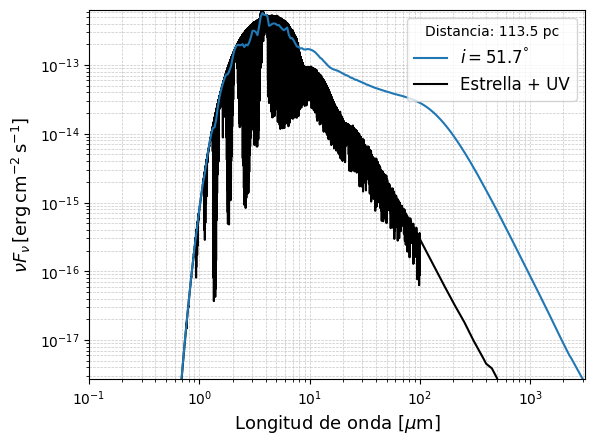

<Figure size 640x480 with 0 Axes>

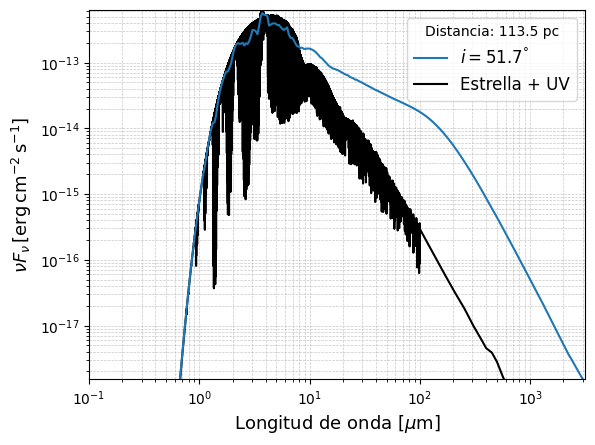

<Figure size 640x480 with 0 Axes>

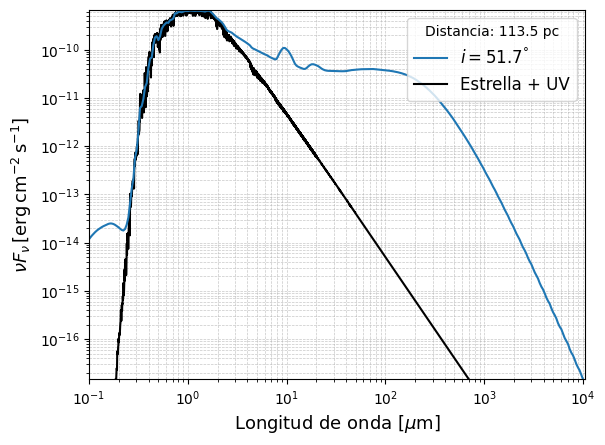

In [12]:
i = 0
for lab in labels:
    # Crear objeto de graficación
    plt.figure()  # Crear una nueva figura en cada iteración
    pp = pplot.Plot(None)
    
    # Graficar la SED del modelo actual sin agregar etiquetas automáticamente
    pp.plot_sed(models[i], color="blue")  # Solo especifica el color

    # Añadir la curva de estrella + UV como referencia (negro)
    plt.plot([], [], label="Estrella + UV", color="black")  # Línea ficticia para la leyenda

    # Configuración de ejes
    plt.xlabel('Longitud de onda [$\mu$m]', fontsize=13)  # Etiqueta eje x
    plt.ylabel(r'$\nu F_{\nu} \, [\mathrm{erg \, cm^{-2} \, s^{-1}}]$', fontsize=13)  # Etiqueta eje y
    
    # Escalas logarítmicas
    plt.xscale('log')
    plt.yscale('log')
    
    # Agregar cuadrícula
    plt.grid(which='both', linestyle='--', linewidth=0.5, alpha=0.7)
    
    # Agregar la leyenda con las líneas manuales
    plt.legend(
        loc='upper right',
        fontsize=12,
        title=f"Distancia: 113.5 pc"
    )
    
    # Guardar la figura como PDF
    plt.savefig(f"SED_{lab}.pdf", format='pdf', dpi=300)
    
    # Incrementar índice
    i += 1

In [51]:
import matplotlib.pyplot as plt
import numpy as np

# Supongamos que ya tienes cargados tus modelos:
# models = [modelo_baja_masa, modelo_media_masa, modelo_alta_masa]
# labels = ["Baja Masa", "Masa Intermedia", "Alta Masa"]
# colores = ["blue", "green", "red"]

# Crear figura
plt.figure(figsize=(8, 6))

# Rango espectral a graficar (ajusta si tu modelo lo requiere)
rango = [0.1, 1000]  # en micrones

for model, label, color in zip(models, labels, colores):
    wave, flux = model.gen_specFromLineEstimates(rango, unit="erg", contOnly=False)
    plt.plot(wave, wave * flux, label=label, color=color)

# Línea ficticia para estrella + UV
plt.plot([], [], label="Estrella + UV", color="black")

# Configuración de ejes
plt.xlabel('Longitud de onda [$\mu$m]', fontsize=13)
plt.ylabel(r'$\nu F_{\nu} \, [\mathrm{erg\,cm^{-2}\,s^{-1}}]$', fontsize=13)
plt.xscale('log')
plt.yscale('log')
plt.grid(which='both', linestyle='--', linewidth=0.5, alpha=0.7)

# Leyenda
plt.legend(loc='upper right', fontsize=12, title="Distancia: 113.5 pc")
plt.tight_layout()

# Guardar figura
plt.savefig("SED_todos_modelos.pdf", dpi=300)
plt.show()

<>:23: SyntaxWarning: invalid escape sequence '\m'
<>:23: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_7115/3979520862.py:23: SyntaxWarning: invalid escape sequence '\m'
  plt.xlabel('Longitud de onda [$\mu$m]', fontsize=13)
/tmp/ipykernel_7115/3979520862.py:23: SyntaxWarning: invalid escape sequence '\m'
  plt.xlabel('Longitud de onda [$\mu$m]', fontsize=13)


NameError: name 'colores' is not defined

<Figure size 800x600 with 0 Axes>

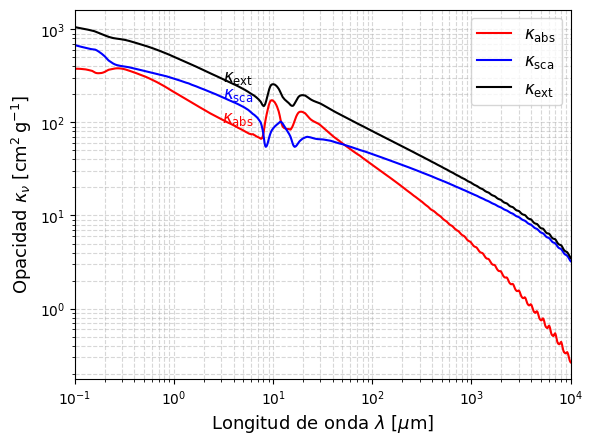

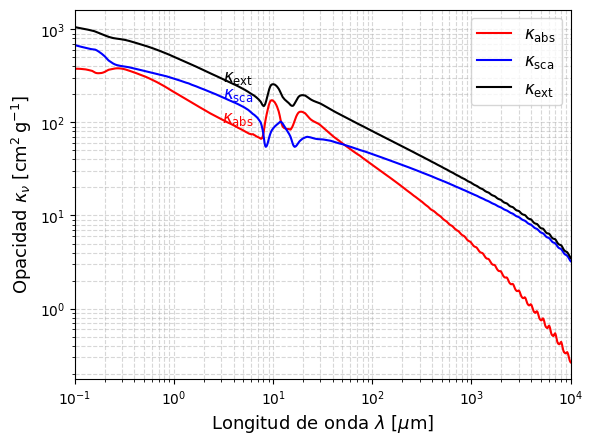

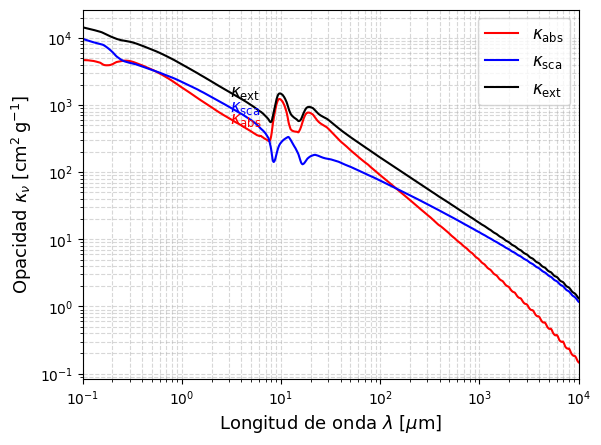

In [15]:
i = 0
for lab in labels:
    pp = pplot.Plot(None)
    fig, ax = plt.subplots()  # Crear figura y ejes manualmente

    # Extraer los datos del modelo actual
    dust = models[i].dust  # Asegúrate de que este atributo contiene las opacidades
    x = dust.lam           # Longitud de onda en micrones
    kappa_abs = dust.kabs  # Opacidad por absorción
    kappa_ext = dust.kext  # Opacidad por extinción
    kappa_sca = dust.ksca  # Opacidad por dispersión

    # Índice para la posición media
    mid_idx = len(x) // 3  # Índice de la mitad

    # Graficar opacidades con colores personalizados
    ax.plot(x, kappa_abs, label=r"$\kappa_\mathrm{abs}$", color="red")
    ax.plot(x, kappa_sca, label=r"$\kappa_\mathrm{sca}$", color="blue")
    ax.plot(x, kappa_ext, label=r"$\kappa_\mathrm{ext}$", color="black")

    # Agregar texto sobre cada línea en la posición media
    ax.text(x[mid_idx], kappa_abs[mid_idx], r"$\kappa_\mathrm{abs}$",
            color="red", fontsize=12, va="bottom", ha="center")
    ax.text(x[mid_idx], kappa_sca[mid_idx], r"$\kappa_\mathrm{sca}$",
            color="blue", fontsize=12, va="bottom", ha="center")
    ax.text(x[mid_idx], kappa_ext[mid_idx], r"$\kappa_\mathrm{ext}$",
            color="black", fontsize=12, va="bottom", ha="center")

    # Configuración de ejes
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_xlim(10e-2, 10e3)
    ax.set_xlabel(r"Longitud de onda $\lambda$ [$\mu$m]", fontsize=13)
    ax.set_ylabel(r"Opacidad $\kappa_{\nu}$ [$\mathrm{cm^2 \, g^{-1}}$]", fontsize=13)

    # Leyenda y cuadrícula
    ax.legend(fontsize=12)
    ax.grid(which="both", linestyle="--", alpha=0.5)

    # Guardar la figura
    plt.savefig(f"Opacidad_{lab}.pdf", format="pdf", dpi=300)
    plt.show()

    i += 1

PLOT: plot_starspec ...
Datos guardados en SEDphoto_PDS70c.txt


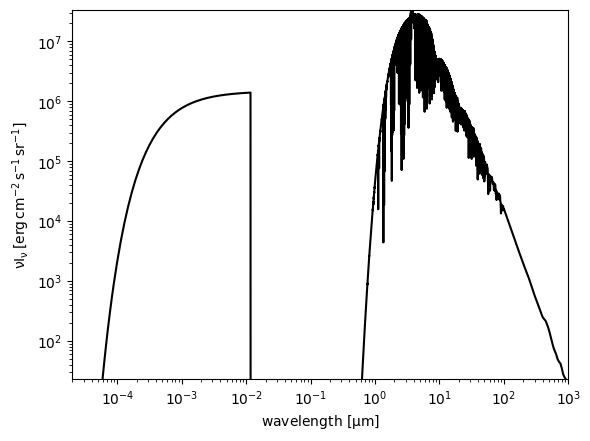

In [42]:
dist = ((models[0].sed.distance * u.pc).to(u.cm)).value
unit = "W"  # O "Jy" dependiendo de la unidad que desees utilizar

# Define 'plot_starSpec' antes de su uso
plot_starSpec = True

# Abre el archivo para escribir los datos
with open("SEDphoto_PDS70c.txt", "w") as file:
    # Escribe una cabecera en el archivo
    file.write("Longitud de onda (micrones)\tFlujo\n")

    for lab in labels:
        pp = pplot.Plot(None)
        pp.plot_starspec(models[0], ax=None, step=10, xunit="micron")

        if plot_starSpec:
            # Escala el espectro estelar para la comparación con el SED
            r = ((models[0].starSpec.r * u.R_sun).to(u.cm)).value

            xStar = models[0].starSpec.lam[0::1]
            yStar = (models[0].starSpec.nu * models[0].starSpec.Inu)[0::1]
            yStar = yStar * (r**2.0 * math.pi * dist**(-2.0))

            if unit == "W":
                yStar = (yStar * u.erg / (u.s * u.cm**2)).to(u.Watt / u.m**2).value
            elif unit == "Jy":
                yStar = (models[0].starSpec.Inu)[0::1]
                yStar = yStar * (r**2.0 * math.pi * dist**(-2.0))
                yStar = (yStar * u.erg / (u.s * u.cm**2 * u.Hz)).to(u.Jy).value
            
            # Escribe los datos en el archivo .txt
            for lam, flux in zip(xStar, yStar):
                file.write(f"{lam}\t{flux}\n")

        # Rompe el bucle después de la primera iteración
        break

print("Datos guardados en SEDphoto_PDS70c.txt")

PLOT: plot_starspec ...
Datos guardados en SEDphoto_PDS70.txt


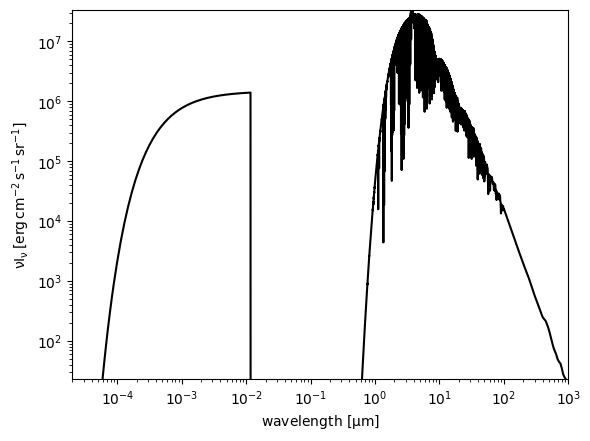

In [49]:
dist = ((models[1].sed.distance * u.pc).to(u.cm)).value
unit = "W"  # O "Jy" dependiendo de la unidad que desees utilizar

# Abre el archivo para escribir los datos
with open("SEDphoto_PDS70.txt", "w") as file:
    # Escribe una cabecera en el archivo
    file.write("Longitud de onda (micrones)\tFlujo\n")

    for lab in labels:
        pp = pplot.Plot(None)
        pp.plot_starspec(models[1], ax=None, step=10, xunit="micron")

        if plot_starSpec:
            # Escala el espectro estelar para la comparación con el SED
            r = ((models[1].starSpec.r * u.R_sun).to(u.cm)).value

            xStar = models[1].starSpec.lam[0::1]
            yStar = (models[1].starSpec.nu * models[1].starSpec.Inu)[0::1]
            yStar = yStar * (r**2.0 * math.pi * dist**(-2.0))

            if unit == "W":
                yStar = (yStar * u.erg / (u.s * u.cm**2)).to(u.Watt / u.m**2).value
            elif unit == "Jy":
                yStar = (models[1].starSpec.Inu)[0::1]
                yStar = yStar * (r**2.0 * math.pi * dist**(-2.0))
                yStar = (yStar * u.erg / (u.s * u.cm**2 * u.Hz)).to(u.Jy).value

            # Escribe los datos en el archivo .txt
            for lam, flux in zip(xStar, yStar):
                file.write(f"{lam}\t{flux}\n")

        # Rompe el bucle después de la primera iteración
        break

print("Datos guardados en SEDphoto_PDS70.txt")

PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


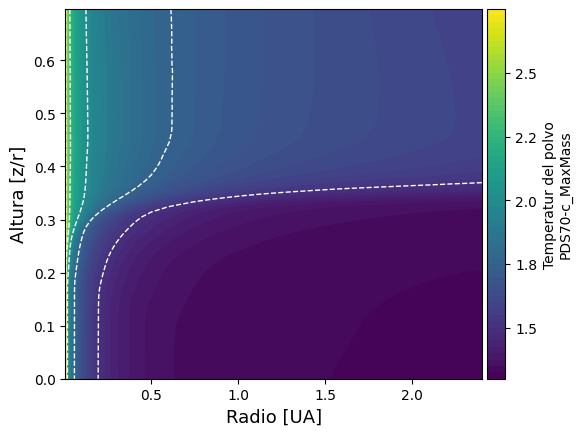

PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


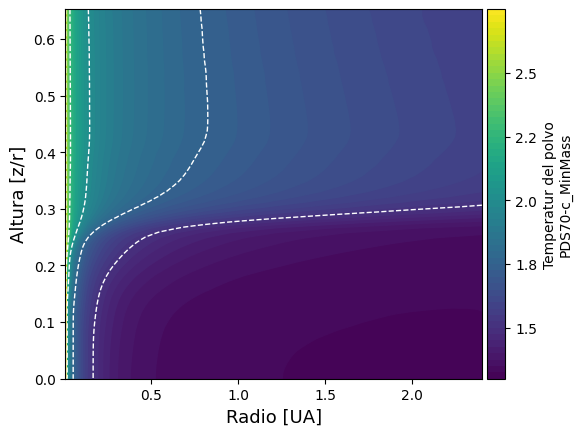

PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


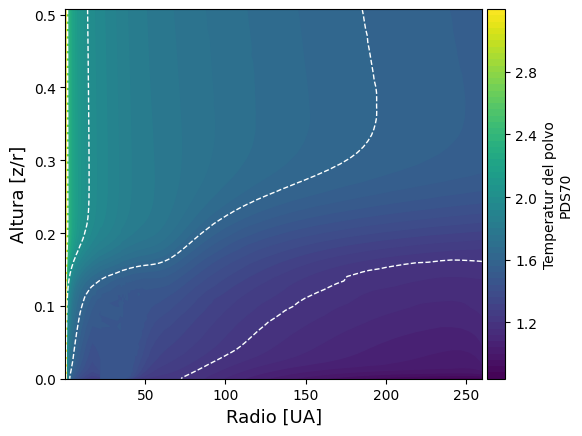

In [15]:
i=0
for lab in labels:
    pp=pplot.Plot(None)
    pp.plot_cont(models[i], models[i].td,'Temperatur del polvo\n%s'%labels[i], xlog=False)
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize) 
    plt.savefig("Td_%s.jpg" % lab, format='jpg')
    plt.show()
    i=i+1

In [51]:
r_target = 34  # en AU

r_grid = models[2].x  # Se asume que esta es la grilla radial en 2D

# Encontrar el índice más cercano a r_target en la grilla radial
r_index = np.argmin(np.abs(r_grid[:, 0] - r_target))

# el primer valor de z (plano medio del disco)
first_z_value = models[2].z[80, r_index]

# Obtener el valor de la temperatura correspondiente
first_temp_value = models[2].tg[80, r_index]

# Imprimir el resultado
print(f"El valor de la temperatura en r = {r_target} AU y z/r = {first_z_value:.2f} es: {first_temp_value:.2f} K")

El valor de la temperatura en r = 34 AU y z/r = 17.60 es: 27.93 K


PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


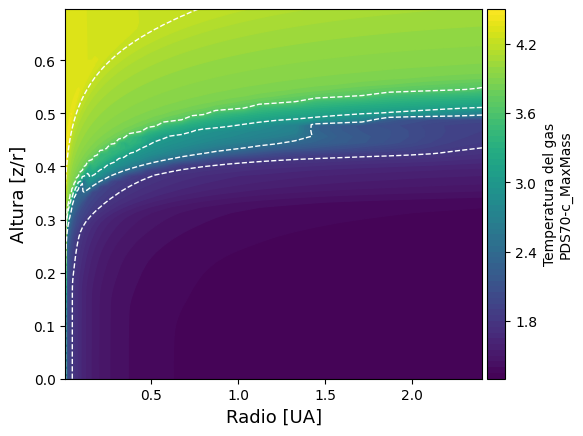

PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


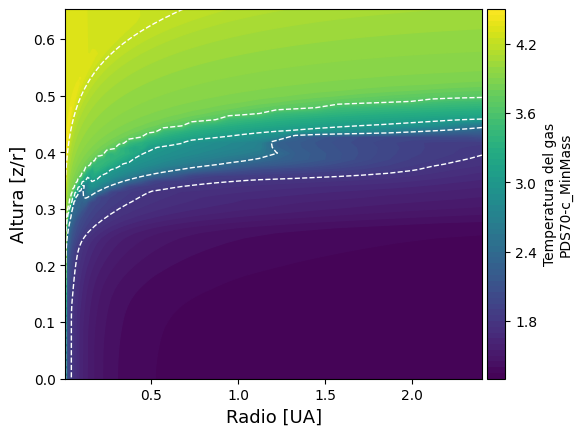

PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


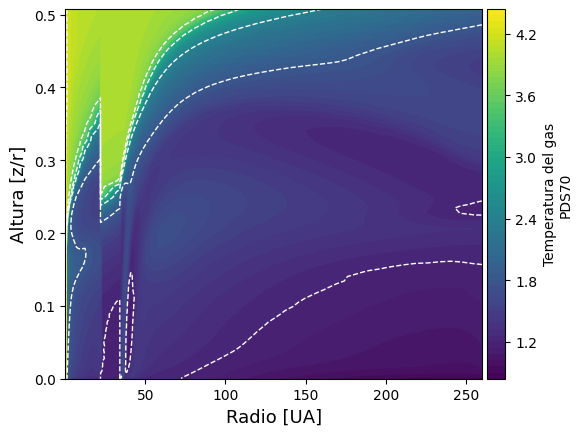

In [16]:
i=0
for lab in labels:
    pp=pplot.Plot(None)
    pp.plot_cont(models[i], models[i].tg,'Temperatura del gas\n%s'%labels[i], xlog=False)
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize) 
    plt.savefig("Temperatura del gas_%s.pdf"%lab)
    plt.show()
    i=i+1

In [53]:
print(models[2].x)

[[4.000000e-02 4.000000e-02 4.000000e-02 ... 4.000000e-02 4.000000e-02
  4.000000e-02]
 [4.035416e-02 4.035416e-02 4.035416e-02 ... 4.035416e-02 4.035416e-02
  4.035416e-02]
 [4.072526e-02 4.072526e-02 4.072526e-02 ... 4.072526e-02 4.072526e-02
  4.072526e-02]
 ...
 [2.558287e+02 2.558287e+02 2.558287e+02 ... 2.558287e+02 2.558287e+02
  2.558287e+02]
 [2.586962e+02 2.586962e+02 2.586962e+02 ... 2.586962e+02 2.586962e+02
  2.586962e+02]
 [2.600000e+02 2.600000e+02 2.600000e+02 ... 2.600000e+02 2.600000e+02
  2.600000e+02]]


In [54]:
print("Dimensiones de x:", models[2].x.shape)
print("Dimensiones de z:", models[2].z.shape)
print("Dimensiones de chi:", models[2].chi.shape)

Dimensiones de x: (120, 80)
Dimensiones de z: (120, 80)
Dimensiones de chi: (120, 80)


In [55]:
r_grid = np.linspace(0, 260, models[2].chi.shape[0])  # Grilla radial
z_grid = np.linspace(0, 0.6, models[2].chi.shape[1])  # Grilla vertical

r_index = np.argmin(np.abs(r_grid - 34.3))
z_index = np.argmin(np.abs(z_grid - 0))

chi_value = models[2].chi[:, 0]

print(f"El valor de chi {chi_value}")

El valor de chi [1.20314e+03 1.18189e+03 1.16010e+03 1.13761e+03 1.11415e+03 1.08920e+03
 1.06175e+03 1.02988e+03 9.89854e+02 9.34684e+02 8.52204e+02 7.26118e+02
 5.49210e+02 3.44249e+02 1.62078e+02 4.92794e+01 7.86993e+00 7.29950e-01
 1.78532e-01 5.28565e-02 6.68465e-03 1.73194e-04 2.37732e-07 1.36150e-12
 1.65351e-26 4.12814e-59 4.72754e-94 1.00000e-99 1.00000e-99 1.00000e-99
 1.00000e-99 1.00000e-99 1.00000e-99 1.21674e-98 1.83996e-89 8.38050e-81
 9.64559e-73 2.68210e-65 1.83142e-58 3.21740e-52 1.54759e-46 2.18808e-41
 9.81044e-37 1.50825e-32 8.60272e-29 1.96810e-25 1.94868e-22 8.98727e-20
 2.07085e-17 2.54758e-15 1.78087e-13 9.99999e-01 9.99999e-01 9.99999e-01
 9.98271e-01 9.97164e-01 9.95512e-01 9.93086e-01 9.89547e-01 9.84430e-01
 9.77110e-01 9.66749e-01 9.52241e-01 9.32168e-01 9.04768e-01 8.67950e-01
 8.19408e-01 7.56885e-01 6.78675e-01 5.84434e-01 4.76276e-01 3.59899e-01
 2.45090e-01 1.44489e-01 4.88035e-02 3.37955e-03 6.90836e-05 4.31239e-07
 1.07796e-09 1.67872e-12 2.68497e-1

In [56]:
r_target = 34  # en AU
z_target = 0   # en z/r

# Obtener las grillas radial y vertical
r_grid = models[2].x  
z_grid = models[2].z  

distances = np.sqrt((r_grid - r_target)**2 + (z_grid - z_target)**2)
closest_index = np.unravel_index(np.argmin(distances), r_grid.shape)

# Obtener el valor de chi
chi_value = models[2].chi[closest_index]

print(f"El valor de chi en r={r_target} AU y z={z_target} es: {chi_value}")

El valor de chi en r=34 AU y z=0 es: 0.999999


PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


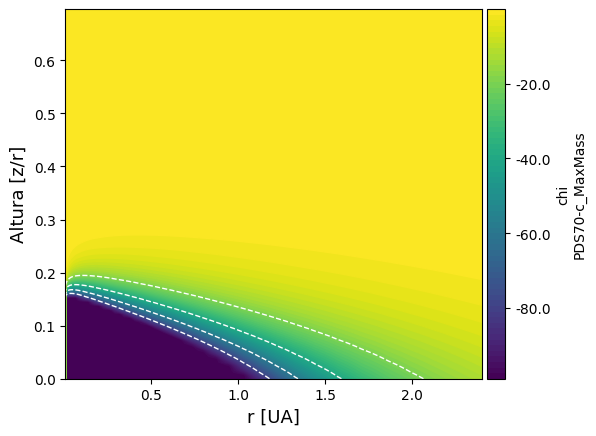

PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


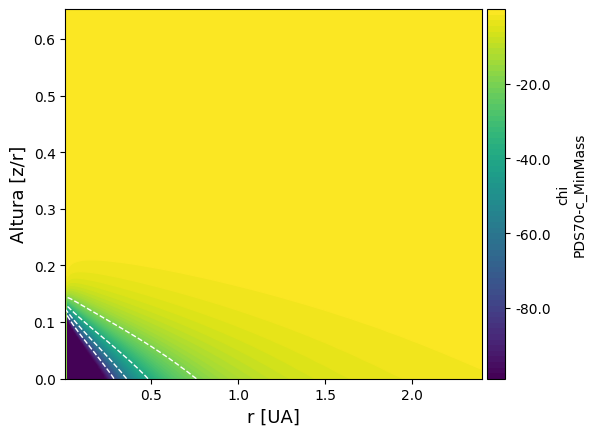

PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


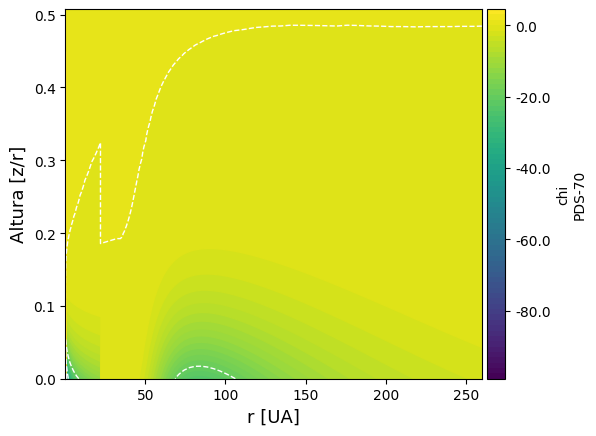

In [10]:
i=0
for lab in labels:
    pp=pplot.Plot(None)
    pp.plot_cont(models[i], models[i].chi,label='chi\n%s'%labels[i], xlog=False)
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize) 
    plt.savefig("ChiRT_%s.pdf"%lab)
    plt.show()
    i=i+1

PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


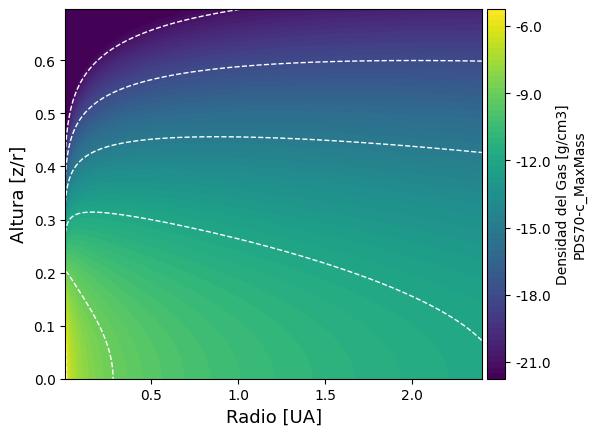

PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


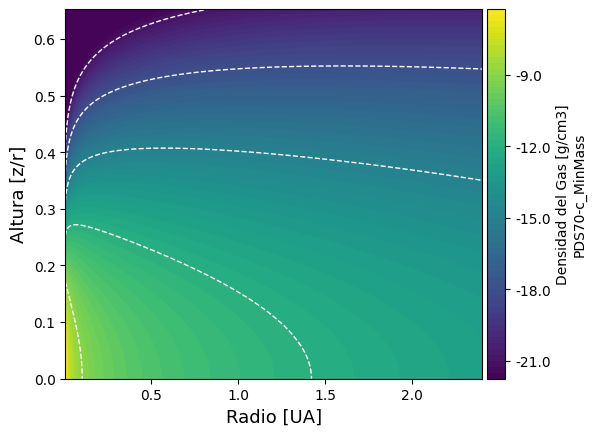

PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


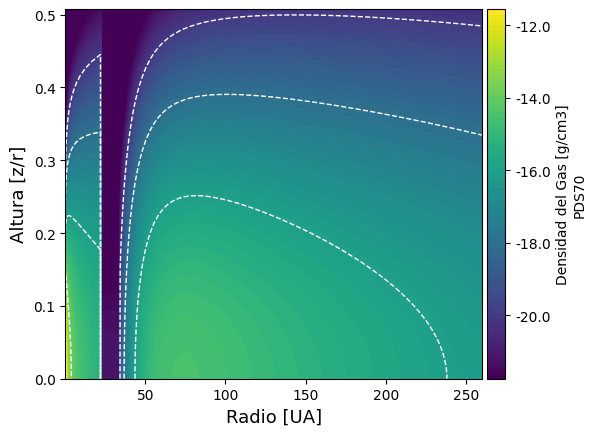

In [18]:
i=0
for lab in labels:
    pp=pplot.Plot(None)
    pp.plot_cont(models[i], models[i].rhog,'Densidad del Gas [g/cm3]\n%s'%labels[i], xlog=False)
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize) 
    plt.savefig("Gas_density_%s.pdf"%lab)
    plt.show()
    i=i+1

PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


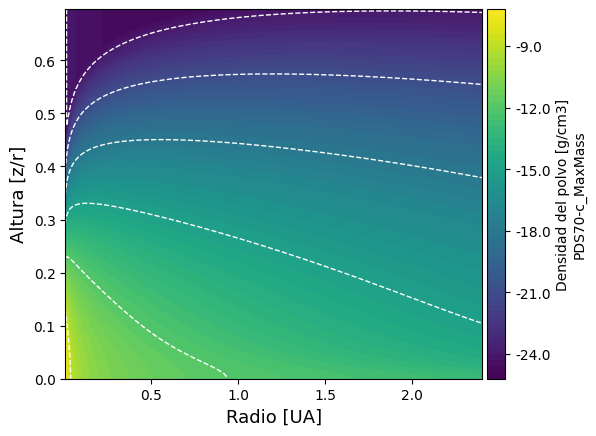

PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


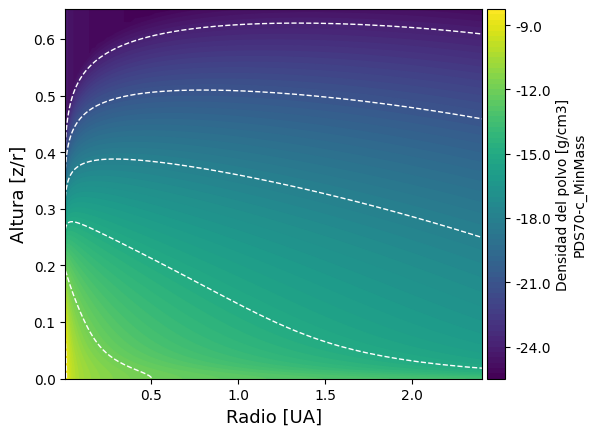

PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


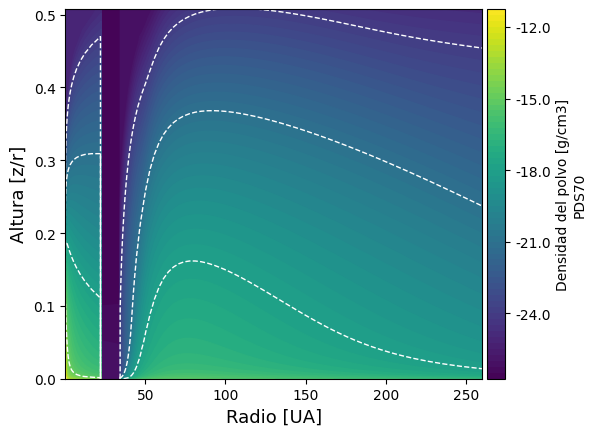

In [19]:
i=0
for lab in labels:
    pp=pplot.Plot(None)
    pp.plot_cont(models[i], models[i].rhod,'Densidad del polvo [g/cm3]\n%s'%labels[i], xlog=False)
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize) 
    plt.savefig("Dust_density_%s.pdf"%lab)
    plt.show()
    i=i+1 

In [60]:
# Imprimir el contenido de los atributos 'species' y 'spnames'
print("Especies químicas en el modelo (species):")
print(models[1].species)

#print("\nNombres de las especies químicas (spnames):")
print(models[1].spnames)

Especies químicas en el modelo (species):
Number of species: 101
Name mass [g] charge chemPot [eV]
e-              9.11e-28    -1       0.0000
H               1.67e-24     0       0.0000
H+              1.67e-24     1      13.5979
H-              1.67e-24    -1      -0.7545
H2              3.35e-24     0      -4.4774
H2+             3.35e-24     1      10.9478
H3+             5.02e-24     1       4.7572
H2exc           3.35e-24     0      -1.8774
He              6.65e-24     0       0.0000
He+             6.65e-24     1      24.5840
C               1.99e-23     0       0.0000
C+              1.99e-23     1      11.2597
C++             1.99e-23     2      35.6427
CH              2.16e-23     0      -3.4689
CH+             2.16e-23     1       7.1710
CH2             2.33e-23     0      -7.8064
CH2+            2.33e-23     1       2.5164
CH3             2.50e-23     0     -12.5428
CH3+            2.50e-23     1      -2.7071
CH4             2.66e-23     0     -17.0181
CH4+            2.66e

In [29]:
# Suponiendo que models[0] ya está definido y tiene los atributos 'species' y 'spnames'
# Abrimos un archivo en modo escritura para guardar la salida
with open("output_species_spnames_PDS70.txt", "w") as file:
    # Escribimos los encabezados
    file.write("Especies químicas en el modelo (species):\n")
    # Convertimos el contenido de 'species' en texto y lo escribimos en el archivo
    file.write(str(models[2].species) + "\n\n")
    
    file.write("Nombres de las especies (spnames):\n")
    # Convertimos el contenido de 'spnames' en texto y lo escribimos en el archivo
    file.write(str(models[2].spnames) + "\n")

In [37]:
model = models[2]

#lests = model.selectLineEstimates("CO+")
#lests = model.selectLineEstimates("CO+",wlrange=[1300,1310])
lests = model.selectLineEstimates(None,wlrange=[5,28])


# Abrir el archivo para escribir los datos
with open("líneasquímicaPDS70.txt", "w") as file:
    # Escribir cada línea en el archivo
    for lest in lests:
        file.write(str(lest) + "\n")

# Mostrar todas las líneas seleccionadas
for lest in lests:
    print(lest)

O/5.98094353/24/20/2.6446e-31
O/5.98039985/24/18/4.639e-31
O/5.98076825/24/19/5.9451e-31
O/6.23012979/25/23/9.6222e-34
O/5.97755429/25/17/1.6194e-29
O/5.97799382/25/18/1.0135e-29
O/5.97836193/25/19/2.6036e-30
O/5.97297707/26/16/5.4451e-37
O/5.9737228/26/18/2.013e-38
O/5.9732839/26/17/1.4106e-37
O/5.45572787/45/30/-1.1327e-36
O/5.45572787/45/30/-2.8602e-35
O/5.45572787/45/30/-2.5677e-34
O/5.49204012/45/31/-3.3479e-34
O/5.49204012/45/31/-5.871e-35
O/5.51596017/45/32/-3.3598e-34
O/13.15659641/46/40/1.6649e-41
O/13.156181/46/39/2.2363e-41
O/13.15533293/46/38/1.6706e-41
O/13.15000476/47/39/2.0679e-41
O/13.14813746/47/37/8.458e-42
O/13.14915749/47/38/7.9427e-41
O/13.14051816/48/38/3.1636e-42
O/13.13949946/48/37/-3.7336e-41
O/13.13879165/48/36/1.6139e-40
O/10.39939935/49/41/1.1863e-33
O/10.40014562/49/42/-3.3117e-35
O/10.39949668/50/42/1.0428e-33
O/10.3999942/50/43/-6.2573e-35
O/10.39757198/51/43/3.5786e-34
Fe+/25.988202/2/1/3.8498e-23
Fe+/5.340263/6/1/1.6445e-23
Fe+/5.674036/7/3/2.7989e-25
F

In [ ]:
##### Plot spectums 

#idents=['13CO','A-CH3OH','Ar+','Ar++','C','C+','C17O','C18O','C2H','C2H2_H','CH', 'CH+','CH3OH_H','CH4_H','CN','CO','CO+','CO2_H','CS','CS_H','E-CH3OH', 'Fe+','H13CO+','H2CO_H','H2S_H','HCN','HCN_H','HCO+','HCS+','HN13C','HNC','Mg+','N+','N++','N2H+','NH3_H','NO','NO_H','Ne+','Ne++','O','O+','O++', 'O2','OCS','OH','OH+','OH-hfs','S','S+','S++','SH+','SO','SO2','SO2_H','Si','Si+','SiO','o-C3H2','o-CH2','o-H2','o-H2CO','o-H2O','o-H2S','o-H3O+','o-NH3','p-C3H2','p-CH2','p-H2','p-H2CO','p-H2O','p-H2S','p-H3O+','p-NH3']
idents=['CH4_H','CN','CO','CO+','CO2_H','CS','CS_H','H13CO+','H2CO_H','H2S_H','HCN','HCN_H','HCO+','HCS+','HNC','NO','NO_H','O','O+','O++', 'O2','OCS','OH','OH+','OH-hfs','S','S+','S++','SH+','SO','SO2','SO2_H','Si','Si+','o-C3H2','o-CH2','o-H2','o-H2CO','o-H2O','H2O#', 'H2O','H2O+']
Range=[1,10]
ranges="1-2"
plt.figure(figsize=(10,5))

i=0
for mdir in mdirs:
    wave,flux0=models[i].gen_specFromLineEstimates(Range, unit="Jy", contOnly=True)
    wave,flux1=models[i].gen_specFromLineEstimates(Range,ident=None,unit="Jy")
    j=0
    for ide in idents:
        wave,flux=models[i].gen_specFromLineEstimates(Range,ident=ide,unit="Jy")
        if j == 0:
            plot_flux=flux
            temp=plot_flux
        else:
            plot_flux=flux+temp-flux0
        temp=plot_flux
        j=j+1
    plt.plot(wave,plot_flux,label = labels[i], linewidth=0.6)
    arr = np.asarray([ wave, plot_flux])
    with open('Spectrum_4-6_%s.csv'%labels[i], 'w') as f:
        mywriter = csv.writer(f, delimiter=',')
        mywriter.writerows(arr) 
    i=i+1
plt.yscale('log')
#plt.ylim(-0.001,0.5)
plt.xlabel('lambda (micron)')
plt.ylabel('flux (Jy)')
plt.legend(loc='best', fontsize=6)
#if mdirs == mdirs_r:
plt.savefig("Spectrum_Rtaper_models_%s.pdf"%ranges)
#else:
plt.savefig("Spectrum_PAHs_models_%s.pdf"%ranges)
plt.show()
plt.close()

INFO: gen_specFromLineEstimates: build spectrum for 717 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  1.77 s
INFO: gen_specFromLineEstimates: build spectrum for 717 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  0.98 s
ERROR: Could not find and line estimates ...
INFO: gen_specFromLineEstimates: build spectrum for 0 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  0.75 s
ERROR: Could not find and line estimates ...
INFO: gen_specFromLineEstimates: build spectrum for 0 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  0.75 s
ERROR: Could not find and line estimates ...
INFO: gen_specFromLineEstimates: build spectrum for 0 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  0.73 s
ERROR: Could not find and line estimates ...
INFO: gen_specFromLineEstimates: build spectrum for 0 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
IN

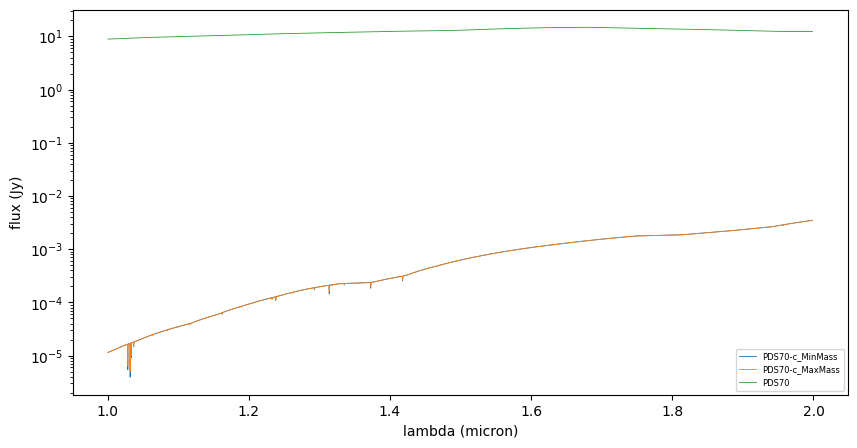

In [63]:
# Definir mdirs_r
mdirs_r = ["BD_PDS70c", "TwoZones_PDS70.3"]  # Ajustar según sea necesario

# Lista de identificadores de moléculas
idents=['CH4_H','CN','CO','CO+','CO2_H','CS','CS_H','H13CO+','H2CO_H','H2S_H','HCN','HCN_H','HCO+','HCS+','HNC','NO','NO_H','O','O+','O++', 'O2','OCS','OH','OH+','OH-hfs','S','S+','S++','SH+','SO','SO2','SO2_H','Si','Si+','o-C3H2','o-CH2','o-H2','o-H2CO','o-H2O','H2O#', 'H2O','H2O+']
Range=[1,2]
ranges="1-2"


# Configuración de la figura
plt.figure(figsize=(10,5))

i=0
for mdir in mdirs:
    # Generación del espectro para cada modelo
    wave,flux0 = models[i].gen_specFromLineEstimates(Range, unit="Jy", noCont=True)
    wave,flux1 = models[i].gen_specFromLineEstimates(Range, ident=None, unit="Jy", noCont=True)
    
    j = 0
    for ide in idents:
        wave, flux = models[i].gen_specFromLineEstimates(Range, ident=ide, unit="Jy")
        if j == 0:
            plot_flux = flux
            temp = plot_flux
        else:
            plot_flux = flux + temp - flux0
        temp = plot_flux
        j += 1
    
    # Graficar espectro
    plt.plot(wave, plot_flux, label=labels[i], linewidth=0.6)
    
    # Guardar el espectro en un archivo .txt
    arr = np.asarray([wave, plot_flux])
    with open('Spectrum_4-7_%s.txt' % labels[i], 'w') as f:
        for k in range(arr.shape[1]):
            f.write(f'{arr[0, k]:.6f}\t{arr[1, k]:.6f}\n')  # Guardar con formato tabulado
    
    i += 1

# Configuración del gráfico
plt.yscale('log')
plt.xlabel('lambda (micron)')
plt.ylabel('flux (Jy)')
plt.legend(loc='best', fontsize=6)

# Guardar gráfico en archivo .pdf
if mdirs == mdirs_r:
    plt.savefig("Spectrum_Rtaper_models_%s.pdf" % ranges)
else:
    plt.savefig("Spectrum_PAHs_models_%s.pdf" % ranges)

# Mostrar gráfico
plt.show()
plt.close()

INFO: gen_specFromLineEstimates: build spectrum for 5790 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  9.72 s
ERROR: Could not find and line estimates ...
INFO: gen_specFromLineEstimates: build spectrum for 0 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.52 s
ERROR: Could not find and line estimates ...
INFO: gen_specFromLineEstimates: build spectrum for 0 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.11 s
INFO: gen_specFromLineEstimates: build spectrum for 54 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.27 s
ERROR: Could not find and line estimates ...
INFO: gen_specFromLineEstimates: build spectrum for 0 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.12 s
ERROR: Could not find and line estimates ...
INFO: gen_specFromLineEstimates: build spectrum for 0 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
IN

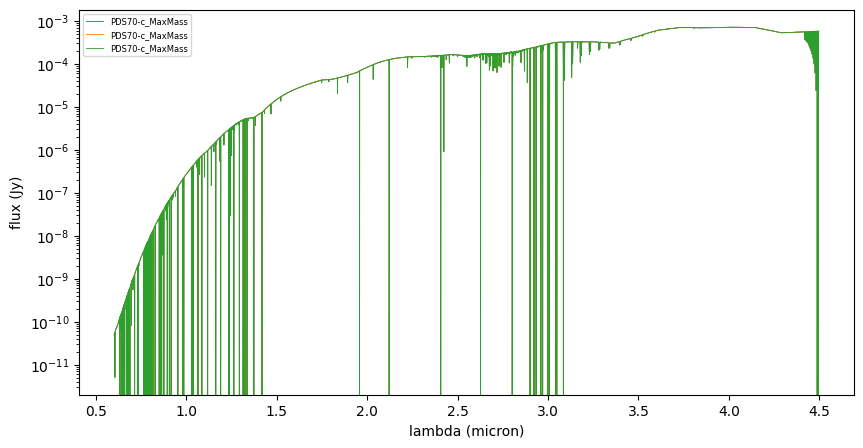

In [15]:
# Definir mdirs_r
mdirs_r = ["BD_PDS70c", "TwoZones_PDS70.3"]  # Ajustar según sea necesario

# Lista de identificadores de moléculas
idents=['CH4_H','CN','CO','CO+','CO2_H','CS','CS_H','H13CO+','H2CO_H','H2S_H','HCN','HCN_H','HCO+','HCS+','HNC','NO','NO_H','O','O+','O++', 'O2','OCS','OH','OH+','OH-hfs','S','S+','S++','SH+','SO','SO2','SO2_H','Si','Si+','o-C3H2','o-CH2','o-H2','o-H2CO','o-H2O','H2O#', 'H2O','H2O+']
Range=[0.6,4.5]
ranges="1-2"


# Configuración de la figura
plt.figure(figsize=(10,5))

for mdir in mdirs:
    # Generación del espectro para cada modelo
    wave,flux0 = models[0].gen_specFromLineEstimates(Range, unit="Jy", noCont=False)
    #wave,flux1 = models[1].gen_specFromLineEstimates(Range, ident=None, unit="Jy", noCont=True)
    
    j = 0
    for ide in idents:
        wave, flux = models[0].gen_specFromLineEstimates(Range, ident=ide, unit="Jy")
        if j == 0:
            plot_flux = flux
            temp = plot_flux
        else:
            plot_flux = flux + temp - flux0
        temp = plot_flux
        j += 1
    
    # Graficar espectro
    plt.plot(wave, plot_flux, label=labels[0], linewidth=0.6)
    
    # Guardar el espectro en un archivo .txt
    #arr = np.asarray([wave, plot_flux])
    #with open('Spectrum_4-7_%s.txt' % labels[i], 'w') as f:
        #for k in range(arr.shape[1]):
         #   f.write(f'{arr[0, k]:.6f}\t{arr[1, k]:.6f}\n')  # Guardar con formato tabulado
    
# Configuración del gráfico
plt.yscale('log')
plt.xlabel('lambda (micron)')
plt.ylabel('flux (Jy)')
plt.legend(loc='best', fontsize=6)
plt.show()
plt.close()

INFO: gen_specFromLineEstimates: build spectrum for 5790 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  9.76 s
INFO: gen_specFromLineEstimates: build spectrum for 5790 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  9.46 s


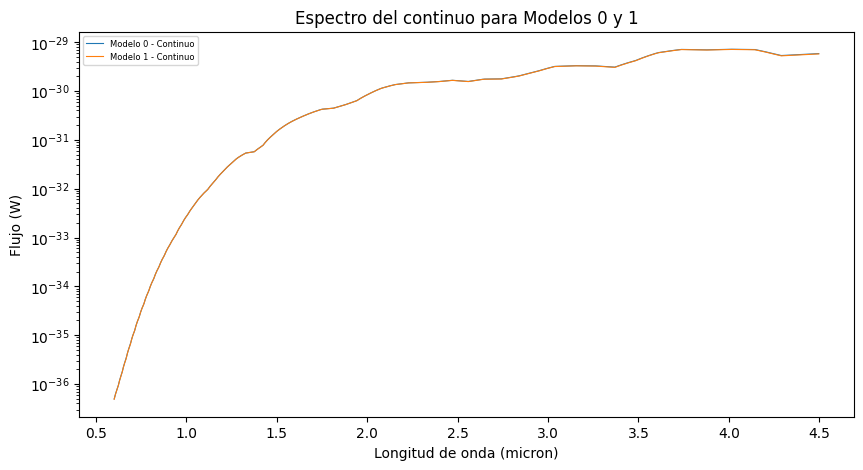

In [23]:
# Definir rango espectral
Range = [0.6, 4.5]  # Ajusta según sea necesario

# Configuración de la figura
plt.figure(figsize=(10,5))

# Extraer el continuo de los modelos 0 y 1
wave0, flux0 = models[0].gen_specFromLineEstimates(Range, unit="W", contOnly=True)
wave1, flux1 = models[1].gen_specFromLineEstimates(Range, unit="W", contOnly=True)

# Graficar espectro de continuo para ambos modelos
plt.plot(wave0, flux0, label="Modelo 0 - Continuo", linewidth=0.8)
plt.plot(wave1, flux1, label="Modelo 1 - Continuo", linewidth=0.8)

# Configuración del gráfico
plt.yscale('log')
plt.xlabel('Longitud de onda (micron)')
plt.ylabel('Flujo (W)')
plt.legend(loc='best', fontsize=6)
plt.title('Espectro del continuo para Modelos 0 y 1')
plt.show()
plt.close()

INFO: gen_specFromLineEstimates: build spectrum for 7469 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  13.52 s


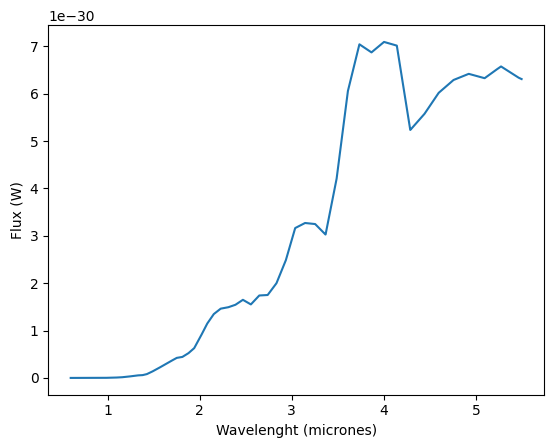

In [37]:
# Generación del espectro sin el continuo para PDS 70c_ Baja Masa
Range = [0.6, 5.5]
wave, flux_lines_only1 = models[1].gen_specFromLineEstimates(Range, unit="W", contOnly=True)

# Guardar los datos en un archivo .txt sin truncar demasiado los valores
np.savetxt('espectro_con_continuoPDS70c_bajamasa.txt', 
           np.column_stack([wave, flux_lines_only1]), 
           header='Longitud de onda (micrones)\tFlujo (W)', 
           delimiter='\t')

# Graficar los datos generados
plt.plot(wave, flux_lines_only1)
plt.xlabel("Wavelenght (micrones)")
plt.ylabel("Flux (W)")
plt.show()

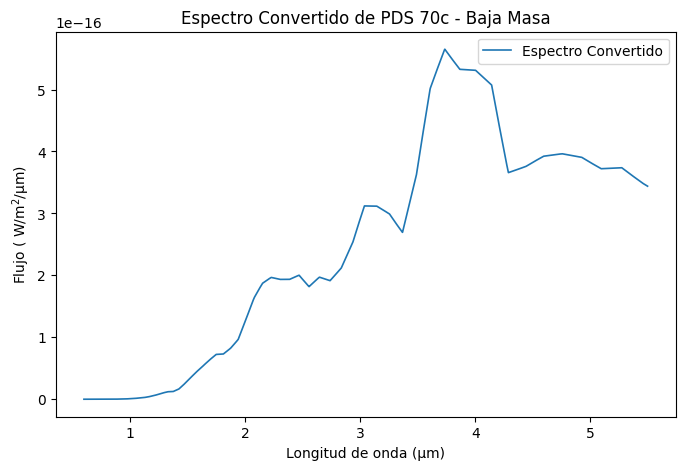

In [38]:
# Cargar los datos desde el archivo original
data = np.loadtxt("espectro_con_continuoPDS70c_bajamasa.txt", skiprows=1)

# Extraer longitudes de onda y flujo
wavelength = data[:, 0]  # En μm
flux_W = data[:, 1]  # En W

# Convertir el flujo de W/m²/Hz a W/m²/μm
c = 2.99792458e14  # Velocidad de la luz en μm/s
v = c/ wavelength
flux_converted = (flux_W  * c / wavelength) 

# Guardar los datos convertidos en un nuevo archivo .txt
output_filename = "espectro_convertido_PDS70c_bajamasa.txt"
np.savetxt(output_filename, np.column_stack([wavelength, flux_converted]), 
           header="Longitud de onda (micrones)\tFlujo (10^-16 W/m^2/μm)", 
           fmt="%.12e", delimiter='\t')

plt.figure(figsize=(8,5))
plt.plot(wavelength, flux_converted, label="Espectro Convertido", linewidth=1.2)
plt.xlabel("Longitud de onda (μm)")
plt.ylabel(r"Flujo ( W/m$^2$/μm)")
#plt.yscale("log")
plt.title("Espectro Convertido de PDS 70c - Baja Masa")
plt.legend()
plt.show()

INFO: gen_specFromLineEstimates: build spectrum for 7469 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  13.29 s


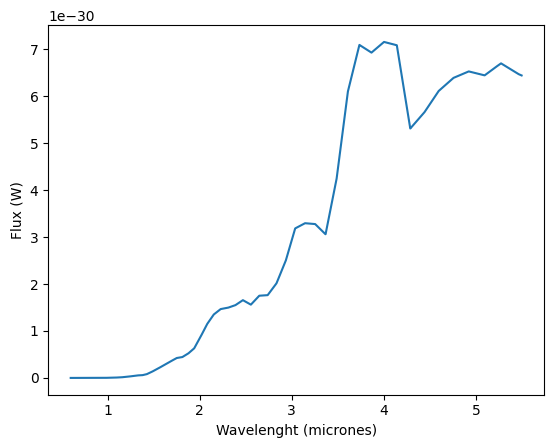

In [35]:
# Generación del espectro sin el continuo para PDS 70c_ Alta Masa
Range = [0.6, 5.5]
wave, flux_lines_only1 = models[0].gen_specFromLineEstimates(Range, unit="W", contOnly=True)

# Guardar los datos en un archivo .txt sin truncar demasiado los valores
np.savetxt('espectro_con_continuoPDS70c_altamasa.txt', 
           np.column_stack([wave, flux_lines_only1]), 
           header='Longitud de onda (micrones)\tFlujo (W)', 
           fmt='%.12e',  # Aumentar la precisión a 12 decimales
           delimiter='\t')

# Graficar los datos generados
plt.plot(wave, flux_lines_only1)
plt.xlabel("Wavelenght (micrones)")
plt.ylabel("Flux (W)")
plt.show()

INFO: gen_specFromLineEstimates: build spectrum for 7469 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  12.95 s


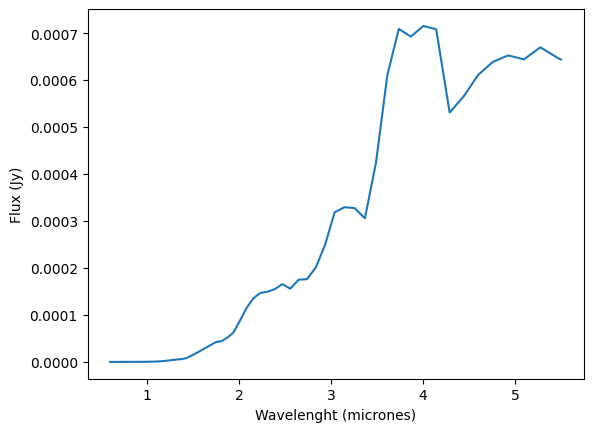

In [33]:
# Generación del espectro sin el continuo para PDS 70c_ Alta Masa
Range = [0.6, 5.5]
wave, flux_lines_only1 = models[0].gen_specFromLineEstimates(Range, unit="Jy", contOnly=True)

# Guardar los datos en un archivo .txt sin truncar demasiado los valores
#np.savetxt('espectro_con_continuoPDS70c_altamasa.txt', np.column_stack([wave, flux_lines_only1]), header='Longitud de onda (micrones)\tFlujo (Jy)', 
           #fmt='%.12e',  # Aumentar la precisión a 12 decimales
           #delimiter='\t')

# Graficar los datos generados
plt.plot(wave, flux_lines_only1)
plt.xlabel("Wavelenght (micrones)")
plt.ylabel("Flux (Jy)")
plt.show()

INFO: gen_specFromLineEstimates: build spectrum for 7469 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  13.89 s


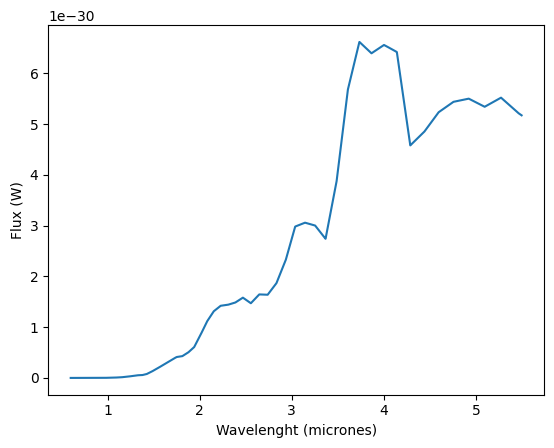

In [39]:
# Generación del espectro sin el continuo para PDS 70c_ Muy baja Masa
Range = [0.6, 5.5]
wave, flux_lines_only1 = models[3].gen_specFromLineEstimates(Range, unit="W", contOnly=True)

# Guardar los datos en un archivo .txt sin truncar demasiado los valores
np.savetxt('espectro_con_continuoPDS70c_muybajamasa.txt', 
           np.column_stack([wave, flux_lines_only1]), 
           header='Longitud de onda (micrones)\tFlujo (W)', 
           fmt='%.12e',  # Aumentar la precisión a 12 decimales
           delimiter='\t')

# Graficar los datos generados
plt.plot(wave, flux_lines_only1)
plt.xlabel("Wavelenght (micrones)")
plt.ylabel("Flux (W)")
plt.show()

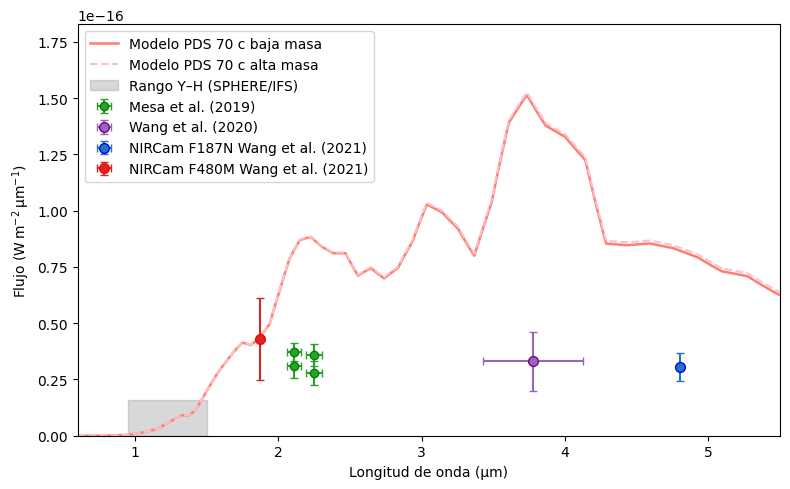

In [20]:
# Modelo baja masa
data_low = np.loadtxt("espectro_con_continuoPDS70c_bajamasa.txt", skiprows=1)
wl_low, flux_low_Hz = data_low[:, 0], data_low[:, 1]

# Modelo alta masa
data_high = np.loadtxt("espectro_con_continuoPDS70c_altamasa.txt", skiprows=1)
wl_high, flux_high_Hz = data_high[:, 0], data_high[:, 1]

# Constante de conversión
c = 2.99792458e14  # μm·Hz

# Convertir de W/m²/Hz a W/m²/μm
flux_low = flux_low_Hz * (c / wl_low**2)
flux_high = flux_high_Hz * (c / wl_high**2)

# ——————————————————————————
# Datos fotométricos (tabla actualizada)
# ——————————————————————————
phot_wl       = np.array([2.110, 2.110, 2.251, 2.251, 3.776, 4.800, 1.870])
phot_wl_err   = np.array([0.051, 0.051, 0.055, 0.055, 0.350,   0.000, 0.000])
phot_flux     = np.array([3.10e-17, 3.73e-17, 2.77e-17, 3.59e-17, 3.31e-17, 3.04e-17, 4.31e-17])
phot_flux_err = np.array([0.52e-17, 0.40e-17, 0.53e-17, 0.49e-17, 1.31e-17, 0.62e-17, 1.83e-17])

# Índices según referencia
idx_mesa      = [0, 1, 2, 3]   # Mesa et al. (2019)
idx_wang20    = [4]            # Wang et al. (2020)
idx_wang21F187N = [5]          # Christiaens et al. / Wang et al. (2021)
idx_wang21F480M = [6]          # Christiaens et al. / Wang et al. (2021)

# ——————————————————————————
# Plot
# ——————————————————————————
plt.figure(figsize=(8, 5))

# Modelo baja masa
plt.plot(wl_low, flux_low,
         label="Modelo PDS 70 c baja masa",
         lw=1.8, color='salmon')

# Modelo alta masa
plt.plot(wl_high, flux_high,
         label="Modelo PDS 70 c alta masa",
         lw=1.5, linestyle='--', color='pink')

# Mesa et al. (2019)
plt.errorbar(
    phot_wl[idx_mesa],
    phot_flux[idx_mesa],
    xerr=phot_wl_err[idx_mesa],
    yerr=phot_flux_err[idx_mesa],
    fmt='o', ms=6,
    mec='green', mfc='tab:green',
    ecolor='tab:green',
    capsize=3,
    label='Mesa et al. (2019)'
)

# Wang et al. (2020)
plt.errorbar(
    phot_wl[idx_wang20],
    phot_flux[idx_wang20],
    xerr=phot_wl_err[idx_wang20],
    yerr=phot_flux_err[idx_wang20],
    fmt='o', ms=7,
    mec='purple', mfc='tab:purple',
    ecolor='tab:purple',
    capsize=3,
    label='Wang et al. (2020)'
)

# NIRCam F187N (Christiaens et al. / Wang et al. 2021)
plt.errorbar(
    phot_wl[idx_wang21F187N],
    phot_flux[idx_wang21F187N],
    xerr=phot_wl_err[idx_wang21F187N],
    yerr=phot_flux_err[idx_wang21F187N],
    fmt='o', ms=7,
    mec='blue', mfc='tab:blue',
    ecolor='tab:blue',
    capsize=3,
    label='NIRCam F187N Wang et al. (2021)'
)

# NIRCam F480M (Christiaens et al. / Wang et al. 2021)
plt.errorbar(
    phot_wl[idx_wang21F480M],
    phot_flux[idx_wang21F480M],
    xerr=phot_wl_err[idx_wang21F480M],
    yerr=phot_flux_err[idx_wang21F480M],
    fmt='o', ms=7,
    mec='red', mfc='tab:red',
    ecolor='tab:red',
    capsize=3,
    label='NIRCam F480M Wang et al. (2021)'
)
# Recuadro gris indicando el rango Y–H de SPHERE/IFS
plt.fill_betweenx(
    y=[0, 1.6E-17],
    x1=0.95, x2=1.50,
    color='grey', alpha=0.3,
    label='Rango Y–H (SPHERE/IFS)'
)

# Ejes, leyenda y ajuste final
plt.xlabel("Longitud de onda (μm)")
plt.ylabel(r"Flujo (W m$^{-2}$ μm$^{-1}$)")
plt.xlim(0.6, 5.5)
plt.ylim(0, max(flux_low.max(), flux_high.max(), phot_flux.max()) * 1.2)
plt.legend(frameon=True, fontsize=10, loc='upper left')
plt.tight_layout()
plt.savefig(f"Flujo_PDS70-c_Fotometría.pdf")
plt.show()

<>:89: SyntaxWarning: invalid escape sequence '\m'
<>:90: SyntaxWarning: invalid escape sequence '\m'
<>:89: SyntaxWarning: invalid escape sequence '\m'
<>:90: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_5400/2138057606.py:89: SyntaxWarning: invalid escape sequence '\m'
  plt.xlabel("Longitud de onda ($\mu$m)")
/tmp/ipykernel_5400/2138057606.py:90: SyntaxWarning: invalid escape sequence '\m'
  plt.ylabel("Flujo (W m$^{-2}$ $\mu$m$^{-1}$)")


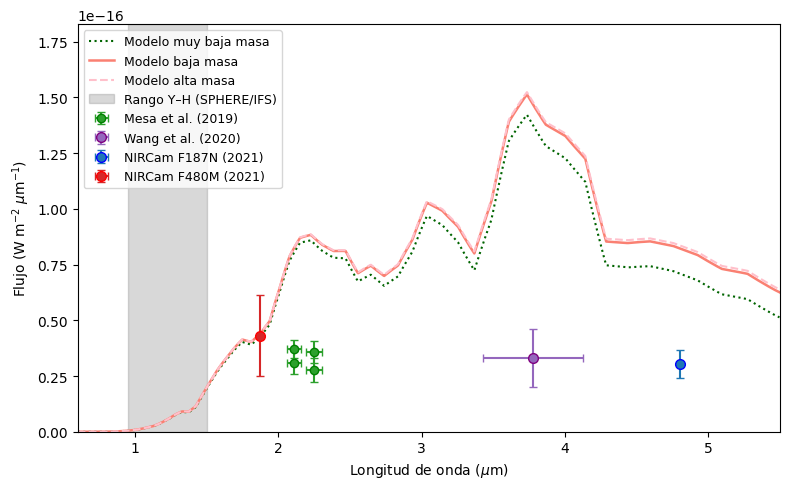

In [40]:
import numpy as np
import matplotlib.pyplot as plt

# ——————————————————————————
# Carga de los modelos desde archivo
# ——————————————————————————
# Modelo muy baja masa
data_very_low = np.loadtxt("espectro_con_continuoPDS70c_muybajamasa.txt", skiprows=1)
wl_very_low, flux_very_low_Hz = data_very_low[:, 0], data_very_low[:, 1]

# Modelo baja masa
data_low = np.loadtxt("espectro_con_continuoPDS70c_bajamasa.txt", skiprows=1)
wl_low, flux_low_Hz = data_low[:, 0], data_low[:, 1]

# Modelo alta masa
data_high = np.loadtxt("espectro_con_continuoPDS70c_altamasa.txt", skiprows=1)
wl_high, flux_high_Hz = data_high[:, 0], data_high[:, 1]

# Constante de conversión
c = 2.99792458e14  # μm·Hz

# Convertir de W/m²/Hz a W/m²/μm
flux_very_low = flux_very_low_Hz * (c / wl_very_low**2)
flux_low      = flux_low_Hz      * (c / wl_low**2)
flux_high     = flux_high_Hz     * (c / wl_high**2)

# ——————————————————————————
# Datos fotométricos (tabla actualizada)
# ——————————————————————————
phot_wl       = np.array([2.110, 2.110, 2.251, 2.251, 3.776, 4.800, 1.870])
phot_wl_err   = np.array([0.051, 0.051, 0.055, 0.055, 0.350,   0.000, 0.000])
phot_flux     = np.array([3.10e-17, 3.73e-17, 2.77e-17, 3.59e-17, 3.31e-17, 3.04e-17, 4.31e-17])
phot_flux_err = np.array([0.52e-17, 0.40e-17, 0.53e-17, 0.49e-17, 1.31e-17, 0.62e-17, 1.83e-17])

# Índices según referencia
idx_mesa        = [0, 1, 2, 3]   # Mesa et al. (2019)
idx_wang20      = [4]            # Wang et al. (2020)
idx_wang21F187N = [5]            # Christiaens et al. / Wang et al. (2021)
idx_wang21F480M = [6]            # Christiaens et al. / Wang et al. (2021)

# ——————————————————————————
# Gráfica
# ——————————————————————————
plt.figure(figsize=(8, 5))

# Modelo muy baja masa
plt.plot(wl_very_low, flux_very_low,
         label="Modelo muy baja masa",
         lw=1.5, linestyle=':', color='darkgreen')

# Modelo baja masa
plt.plot(wl_low, flux_low,
         label="Modelo baja masa",
         lw=1.8, color='salmon')

# Modelo alta masa
plt.plot(wl_high, flux_high,
         label="Modelo alta masa",
         lw=1.5, linestyle='--', color='pink')

# Puntos fotométricos
plt.errorbar(phot_wl[idx_mesa], phot_flux[idx_mesa],
             xerr=phot_wl_err[idx_mesa], yerr=phot_flux_err[idx_mesa],
             fmt='o', ms=6, mec='green', mfc='tab:green', ecolor='tab:green',
             capsize=3, label='Mesa et al. (2019)')

plt.errorbar(phot_wl[idx_wang20], phot_flux[idx_wang20],
             xerr=phot_wl_err[idx_wang20], yerr=phot_flux_err[idx_wang20],
             fmt='o', ms=7, mec='purple', mfc='tab:purple', ecolor='tab:purple',
             capsize=3, label='Wang et al. (2020)')

plt.errorbar(phot_wl[idx_wang21F187N], phot_flux[idx_wang21F187N],
             xerr=phot_wl_err[idx_wang21F187N], yerr=phot_flux_err[idx_wang21F187N],
             fmt='o', ms=7, mec='blue', mfc='tab:blue', ecolor='tab:blue',
             capsize=3, label='NIRCam F187N (2021)')

plt.errorbar(phot_wl[idx_wang21F480M], phot_flux[idx_wang21F480M],
             xerr=phot_wl_err[idx_wang21F480M], yerr=phot_flux_err[idx_wang21F480M],
             fmt='o', ms=7, mec='red', mfc='tab:red', ecolor='tab:red',
             capsize=3, label='NIRCam F480M (2021)')

# Rango Y–H SPHERE/IFS
plt.fill_betweenx(y=[0, flux_high.max()*1.2],
                  x1=0.95, x2=1.50,
                  color='grey', alpha=0.3,
                  label='Rango Y–H (SPHERE/IFS)')

# Configuración final
plt.xlabel("Longitud de onda ($\mu$m)")
plt.ylabel("Flujo (W m$^{-2}$ $\mu$m$^{-1}$)")
plt.xlim(0.6, 5.5)
plt.ylim(0, max(flux_very_low.max(), flux_low.max(), flux_high.max(), phot_flux.max()) * 1.2)
plt.legend(frameon=True, fontsize=9, loc='upper left')
plt.tight_layout()
plt.savefig("Flujo_PDS70-c_Fotometría_actualizada.pdf", dpi=300)
plt.show()

forward Model -  con base ne resultados nosotros fuimos hacia adelante
Fit Model - usaron según los datos y fueron modificando, nosotros no teníamos datos para coparar obser data set 
Tabla con más modelos. * se modelaron los datos del primer artículo.

INFO: gen_specFromLineEstimates: build spectrum for 19853 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  93.57 s


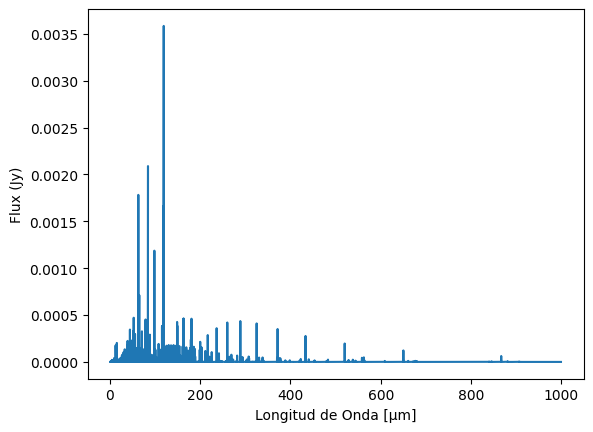

In [65]:
# Generación del espectro sin el continuo para PDS 70 c
Range=[0.6,1000]
wave, flux_lines_only1 = models[0].gen_specFromLineEstimates(Range, unit="Jy", noCont=True)
# Guardar los datos en un archivo .txt
np.savetxt('espectro_sin_continuoPDS70c.txt', np.column_stack([wave, flux_lines_only1]), header='Longitud de onda (micrones)  Flujo (Jy)', fmt='%.6e', delimiter='\t')
plt.plot(wave, flux_lines_only1)
plt.savefig('espectro_sin_continuoPDS70c.jpg', format='jpg', dpi=300)
#plt.title("Espectro sin continuo")
plt.xlabel("Longitud de Onda [μm]")
plt.ylabel("Flux (Jy)")
#plt.yscale('log')
plt.show()

INFO: gen_specFromLineEstimates: build spectrum for 19853 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  225.29 s


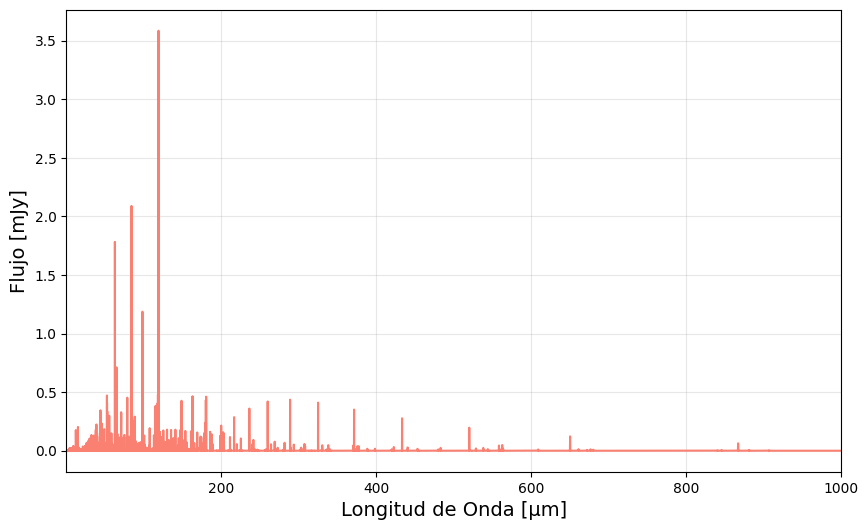

In [41]:
# Modelo 1Min mass
#Generación del espectro sin el continuo para PDS 70 c
Range = [0.6, 1000]  # Extender aún más el rango del eje X
wave, flux_lines_only1 = models[0].gen_specFromLineEstimates(Range, unit="Jy", noCont=True)

# Conversión de unidades: de Jy a mJy
flux_lines_only1_mJy = flux_lines_only1 * 1e3  # 1 Jy = 1000 mJy

# Guardar los datos en un archivo .txt con las unidades convertidas
np.savetxt(
    'espectro_sin_continuoPDS70c.txt',
    np.column_stack([wave, flux_lines_only1_mJy]),
    header='Longitud de onda (micrones)  Flujo (mJy)',
    fmt='%.6e',
    delimiter='\t'
)

# Graficar el espectro
plt.figure(figsize=(10, 6))  # Ajustar tamaño de la figura
plt.plot(wave, flux_lines_only1_mJy, color='salmon', linewidth=1.5)  # Cambiar color a salmón y grosor de línea
plt.xlim(0.5, 1000)  # Extender más el rango del eje X
#plt.ylim(0, np.max(flux_lines_only1_mJy) * 0.8)  # Ajustar el rango del eje Y, bajándolo un 20% del máximo
plt.xlabel("Longitud de Onda [μm]", fontsize=14)
plt.ylabel("Flujo [mJy]", fontsize=14)
plt.grid(alpha=0.3)  # Agregar una cuadrícula ligera
plt.savefig('espectro_sin_continuoPDS70c_MaxMass.jpg', format='jpg', dpi=300)  # Guardar la figura
plt.show()

INFO: gen_specFromLineEstimates: build spectrum for 19853 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  219.14 s


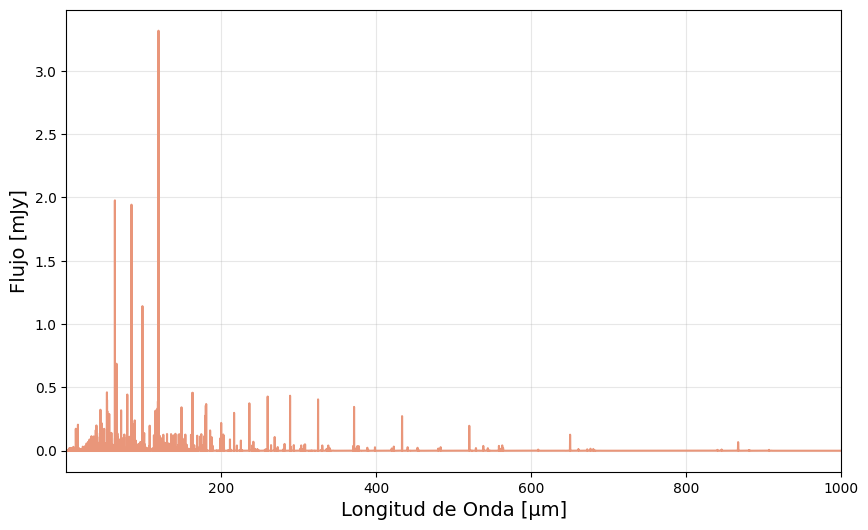

In [42]:
# Modelo 2 max Mass
#Generación del espectro sin el continuo para PDS 70 c
Range = [0.6, 1000]  # Extender aún más el rango del eje X
wave, flux_lines_only1 = models[1].gen_specFromLineEstimates(Range, unit="Jy", noCont=True)

# Conversión de unidades: de Jy a mJy
flux_lines_only1_mJy = flux_lines_only1 * 1e3  # 1 Jy = 1000 mJy

# Guardar los datos en un archivo .txt con las unidades convertidas
np.savetxt(
    'espectro_sin_continuoPDS70c.txt',
    np.column_stack([wave, flux_lines_only1_mJy]),
    header='Longitud de onda (micrones)  Flujo (mJy)',
    fmt='%.6e',
    delimiter='\t'
)

# Graficar el espectro
plt.figure(figsize=(10, 6))  # Ajustar tamaño de la figura
plt.plot(wave, flux_lines_only1_mJy, color='darksalmon', linewidth=1.5)  # Cambiar color a salmón y grosor de línea
plt.xlim(0.5, 1000)  # Extender más el rango del eje X
#plt.ylim(0, np.max(flux_lines_only1_mJy) * 0.8)  # Ajustar el rango del eje Y, bajándolo un 20% del máximo
plt.xlabel("Longitud de Onda [μm]", fontsize=14)
plt.ylabel("Flujo [mJy]", fontsize=14)
plt.grid(alpha=0.3)  # Agregar una cuadrícula ligera
plt.savefig('espectro_sin_continuoPDS70c_MinMass.jpg', format='jpg', dpi=300)  # Guardar la figura
plt.show()

In [ ]:
#PPD

INFO: gen_specFromLineEstimates: build spectrum for 148 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.37 s
INFO: gen_specFromLineEstimates: build spectrum for 2138 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  5.04 s
INFO: gen_specFromLineEstimates: build spectrum for 2136 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  5.19 s
INFO: gen_specFromLineEstimates: build spectrum for 442 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.88 s
INFO: gen_specFromLineEstimates: build spectrum for 4 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.22 s
INFO: gen_specFromLineEstimates: build spectrum for 437 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.74 s
INFO: gen_specFromLineEstimates: build spectrum for 6 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.15 s
INFO: gen_specF

/tmp/ipykernel_6060/2834605590.py:111: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig('espectro_combinado_NIR_PDS70.jpg', format='jpg', dpi=300)


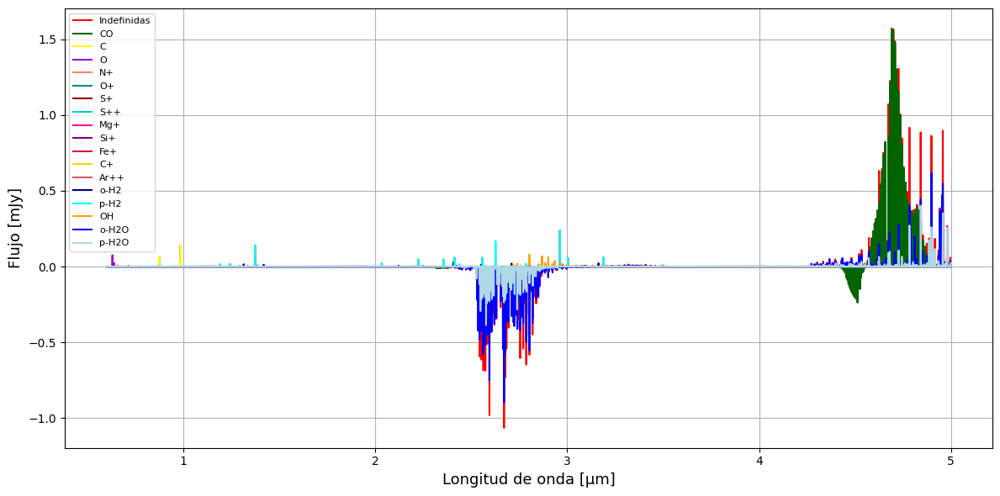

In [26]:
#Modelo para el NIR Spectrum
# Espectro de CO
wave_co, flux_co = models[2].gen_specFromLineEstimates(wlrange=[0.6,5], ident='CO', unit="Jy", noCont=True)
flux_co *= 1e3  # Convertir de Jy a mJy

# Espectro de o-H2O
wave_co_solid, flux_co_solid = models[2].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='o-H2O', unit="Jy", noCont=True)
flux_co_solid *= 1e3  # Convertir de Jy a mJy

# Espectro de p-H2O
wave_co_solid2, flux_co_solid2 = models[2].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='p-H2O', unit="Jy", noCont=True)
flux_co_solid2 *= 1e3  # Convertir de Jy a mJy

# Espectro de OH
wave_co_solid3, flux_co_solid3 = models[2].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='OH', unit="Jy", noCont=True)
flux_co_solid3 *= 1e3  # Convertir de Jy a mJy

# Espectro de C
wave_co_solid4, flux_co_solid4 = models[2].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='C', unit="Jy", noCont=True)
flux_co_solid4 *= 1e3  # Convertir de Jy a mJy

# Espectro de O
wave_co_solid5, flux_co_solid5 = models[2].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='O', unit="Jy", noCont=True)
flux_co_solid5 *= 1e3  # Convertir de Jy a mJy

# Espectro de N+
wave_co_solid6, flux_co_solid6 = models[2].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='N+', unit="Jy", noCont=True)
flux_co_solid6 *= 1e3  # Convertir de Jy a mJy

# Espectro de O+
wave_co_solid7, flux_co_solid7 = models[2].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='O+', unit="Jy", noCont=True)
flux_co_solid7 *= 1e3  # Convertir de Jy a mJy

# Espectro de o-H2
wave_co_solid8, flux_co_solid8 = models[2].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='p-H2', unit="Jy", noCont=True)
flux_co_solid8 *= 1e3  # Convertir de Jy a mJy

# Espectro de S+
wave_co_solid9, flux_co_solid9 = models[2].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='S+', unit="Jy", noCont=True)
flux_co_solid9 *= 1e3  # Convertir de Jy a mJy

# Espectro de S++
wave_co_solid10, flux_co_solid10 = models[2].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='S++', unit="Jy", noCont=True)
flux_co_solid10 *= 1e3  # Convertir de Jy a mJy

# Espectro de Si+
wave_co_solid11, flux_co_solid11 = models[2].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='Si+', unit="Jy", noCont=True)
flux_co_solid11 *= 1e3  # Convertir de Jy a mJy

# Espectro de Mg+
wave_co_solid12, flux_co_solid12 = models[2].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='Mg+', unit="Jy", noCont=True)
flux_co_solid12 *= 1e3  # Convertir de Jy a mJy

# Espectro de Fe+
wave_co_solid13, flux_co_solid13 = models[2].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='Fe+', unit="Jy", noCont=True)
flux_co_solid13 *= 1e3  # Convertir de Jy a mJy

# Espectro de C+
wave_co_solid14, flux_co_solid14 = models[2].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='C+', unit="Jy", noCont=True)
flux_co_solid14 *= 1e3  # Convertir de Jy a mJy

# Espectro de Ar++
wave_co_solid15, flux_co_solid15 = models[2].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='Ar++', unit="Jy", noCont=True)
flux_co_solid15 *= 1e3  # Convertir de Jy a mJy

# Espectro de o-H2
wave_co_solid16, flux_co_solid16 = models[2].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='o-H2', unit="Jy", noCont=True)
flux_co_solid16 *= 1e3  # Convertir de Jy a mJy

# Espectro de Si+
#wave_co_solid17, flux_co_solid17 = models[2].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='Si+', unit="Jy", noCont=True)
#flux_co_solid17 *= 1e3  # Convertir de Jy a mJy

# Espectro sin continuo
Range = [0.6, 5]
wave_flux, flux_lines_only = models[2].gen_specFromLineEstimates(Range, unit="Jy", noCont=True)
flux_lines_only *= 1e3  # Convertir de Jy a mJy

# Crear el gráfico combinado
plt.figure(figsize=(12, 6))

# Graficar el espectro sin continuo
plt.plot(wave_flux, flux_lines_only, label='Indefinidas', color='red', linewidth=1.5)
plt.plot(wave_co, flux_co, label='CO', color='darkgreen', linewidth=1.5)
plt.plot(wave_co_solid4, flux_co_solid4, label='C', color='yellow', linewidth=1.5)
plt.plot(wave_co_solid5, flux_co_solid5, label='O', color='darkviolet', linewidth=1.5)
plt.plot(wave_co_solid6, flux_co_solid6, label='N+', color='salmon', linewidth=1.5)
plt.plot(wave_co_solid7, flux_co_solid7, label='O+', color='darkcyan', linewidth=1.5)
plt.plot(wave_co_solid9, flux_co_solid9, label='S+', color='darkred', linewidth=1.5)
plt.plot(wave_co_solid10, flux_co_solid10, label='S++', color='darkturquoise', linewidth=1.5)
plt.plot(wave_co_solid12, flux_co_solid12, label='Mg+', color='deeppink', linewidth=1.5)
plt.plot(wave_co_solid11, flux_co_solid11, label='Si+', color='purple', linewidth=1.5)
plt.plot(wave_co_solid13, flux_co_solid13, label='Fe+', color='crimson', linewidth=1.5)
plt.plot(wave_co_solid14, flux_co_solid14, label='C+', color='gold', linewidth=1.5)
plt.plot(wave_co_solid15, flux_co_solid15, label='Ar++', color='indianred', linewidth=1.5)
plt.plot(wave_co_solid16, flux_co_solid16, label='o-H2', color='navy', linewidth=1.5)
#plt.plot(wave_co_solid17, flux_co_solid17, label='Si+', color='orchid', linewidth=1.5)
plt.plot(wave_co_solid8, flux_co_solid8, label='p-H2', color='cyan', linewidth=1.5)
plt.plot(wave_co_solid3, flux_co_solid3, label='OH', color='orange', linewidth=1.5)
plt.plot(wave_co_solid, flux_co_solid, label='o-H2O', color='blue', linewidth=1.5)
plt.plot(wave_co_solid2, flux_co_solid2, label='p-H2O', color='lightblue', linewidth=1.5)

# Configuración del gráfico
plt.xlabel("Longitud de onda [μm]", fontsize=label_fontsize)
plt.ylabel("Flujo [mJy]", fontsize=label_fontsize)  # Actualizado para reflejar mJy
#plt.title("")
plt.legend(fontsize=8)
plt.grid(True)
plt.tight_layout()
# Guardar el gráfico
plt.savefig('espectro_combinado_NIR_PDS70.jpg', format='jpg', dpi=300)
plt.show()

In [27]:
# Definir el nombre del archivo de salida
output_txt_file = "espectro_NIRSPEC_PPD.txt"

# Datos de especies químicas y sus respectivos valores de longitud de onda y flujo
species_data = [
    (wave_co, flux_co, "CO"),
    (wave_co_solid, flux_co_solid, "o-H2O"),
    (wave_co_solid2, flux_co_solid2, "p-H2O"),
    (wave_co_solid3, flux_co_solid3, "OH"),
    (wave_co_solid4, flux_co_solid4, "C"),
    (wave_co_solid5, flux_co_solid5, "O"),
    (wave_co_solid6, flux_co_solid6, "N+"),
    (wave_co_solid7, flux_co_solid7, "O+"),
    (wave_co_solid8, flux_co_solid8, "p-H2"),
    (wave_co_solid9, flux_co_solid9, "S+"),
    (wave_co_solid10, flux_co_solid10, "S++"),
    (wave_co_solid11, flux_co_solid11, "Si+"),
    (wave_co_solid12, flux_co_solid12, "Mg+"),
    (wave_co_solid13, flux_co_solid13, "Fe+"),
    (wave_co_solid14, flux_co_solid14, "C+"),
    (wave_co_solid15, flux_co_solid15, "Ar++"),
    (wave_co_solid16, flux_co_solid16, "o-H2"),
]

# Guardar los datos en un archivo de texto
with open(output_txt_file, "w") as file:
    file.write("Longitud de Onda (μm)\tFlujo (mJy)\tEspecie Química\n")
    for wave, flux, species in species_data:
        for wl, fl in zip(wave, flux):
            file.write(f"{wl:.6f}\t{fl:.6e}\t{species}\n")

print(f"Archivo guardado correctamente como {output_txt_file}")

Archivo guardado correctamente como espectro_NIRSPEC_PPD.txt


INFO: gen_specFromLineEstimates: build spectrum for 7 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.09 s
INFO: gen_specFromLineEstimates: build spectrum for 83 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.05 s
INFO: gen_specFromLineEstimates: build spectrum for 74 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.75 s
INFO: gen_specFromLineEstimates: build spectrum for 216 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.64 s
INFO: gen_specFromLineEstimates: build spectrum for 4 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.48 s
INFO: gen_specFromLineEstimates: build spectrum for 30 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.05 s
INFO: gen_specFromLineEstimates: build spectrum for 3661 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  7.19 s
INFO: gen_specFromL

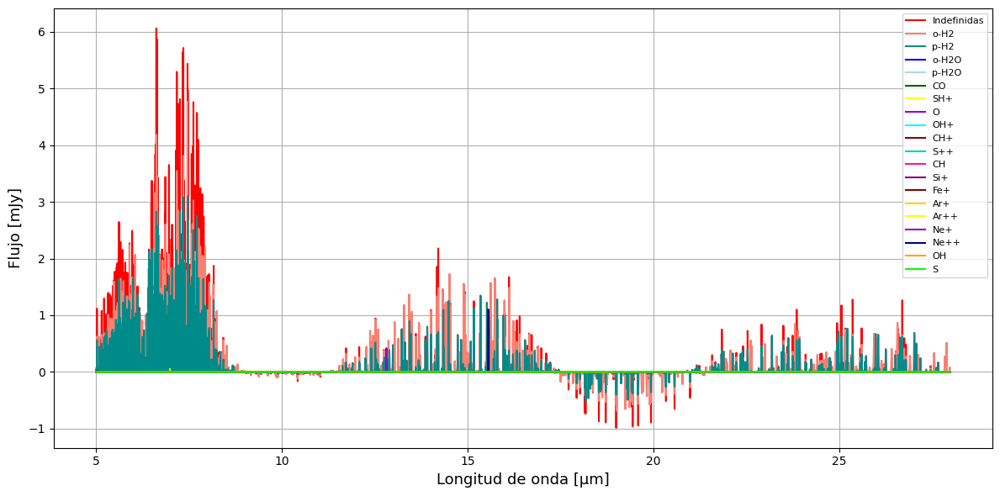

In [28]:
#Modelo para el MIRI Spectrum
wave_co, flux_co = models[2].gen_specFromLineEstimates(wlrange=[5, 28], ident='CO', unit="Jy", noCont=True)
flux_co *= 1e3  # Convertir de Jy a mJy

# Espectro de o-H2O
wave_co_solid, flux_co_solid = models[2].gen_specFromLineEstimates(wlrange=[5, 28], ident='o-H2', unit="Jy", noCont=True)
flux_co_solid *= 1e3  # Convertir de Jy a mJy

# Espectro de p-H2O
wave_co_solid2, flux_co_solid2 = models[2].gen_specFromLineEstimates(wlrange=[5, 28], ident='p-H2', unit="Jy", noCont=True)
flux_co_solid2 *= 1e3  # Convertir de Jy a mJy

# Espectro de OH
wave_co_solid3, flux_co_solid3 = models[2].gen_specFromLineEstimates(wlrange=[5, 28], ident='OH', unit="Jy", noCont=True)
flux_co_solid3 *= 1e3  # Convertir de Jy a mJy

# Espectro de CO2
wave_co_solid4, flux_co_solid4 = models[2].gen_specFromLineEstimates(wlrange=[5, 28], ident='SH+', unit="Jy", noCont=True)
flux_co_solid4 *= 1e3  # Convertir de Jy a mJy

# Espectro de O
wave_co_solid5, flux_co_solid5 = models[2].gen_specFromLineEstimates(wlrange=[5, 28], ident='O', unit="Jy", noCont=True)
flux_co_solid5 *= 1e3  # Convertir de Jy a mJy

# Espectro de o-H2O
wave_co_solid6, flux_co_solid6 = models[2].gen_specFromLineEstimates(wlrange=[5, 28], ident='o-H2O', unit="Jy", noCont=True)
flux_co_solid6 *= 1e3  # Convertir de Jy a mJy

# Espectro de p-H20
wave_co_solid7, flux_co_solid7 = models[2].gen_specFromLineEstimates(wlrange=[5, 28], ident='p-H2O', unit="Jy", noCont=True)
flux_co_solid7 *= 1e3  # Convertir de Jy a mJy

# Espectro de OH+
wave_co_solid8, flux_co_solid8 = models[2].gen_specFromLineEstimates(wlrange=[5, 28], ident='OH+', unit="Jy", noCont=True)
flux_co_solid8 *= 1e3  # Convertir de Jy a mJy

# Espectro de CH+
wave_co_solid9, flux_co_solid9 = models[2].gen_specFromLineEstimates(wlrange=[5, 28], ident='CH+', unit="Jy", noCont=True)
flux_co_solid9 *= 1e3  # Convertir de Jy a mJy

# Espectro de S++
wave_co_solid10, flux_co_solid10 = models[2].gen_specFromLineEstimates(wlrange=[5, 28], ident='S++', unit="Jy", noCont=True)
flux_co_solid10 *= 1e3  # Convertir de Jy a mJy

# Espectro de Si+
wave_co_solid11, flux_co_solid11 = models[2].gen_specFromLineEstimates(wlrange=[5, 28], ident='Si+', unit="Jy", noCont=True)
flux_co_solid11 *= 1e3  # Convertir de Jy a mJy

# Espectro de CH
wave_co_solid12, flux_co_solid12 = models[2].gen_specFromLineEstimates(wlrange=[5, 28], ident='CH', unit="Jy", noCont=True)
flux_co_solid12 *= 1e3  # Convertir de Jy a mJy

# Espectro de Fe+
wave_co_solid13, flux_co_solid13 = models[2].gen_specFromLineEstimates(wlrange=[5, 28], ident='Fe+', unit="Jy", noCont=True)
flux_co_solid13 *= 1e3  # Convertir de Jy a mJy

# Espectro de Ar+
wave_co_solid14, flux_co_solid14 = models[2].gen_specFromLineEstimates(wlrange=[5, 28], ident='Ar+', unit="Jy", noCont=True)
flux_co_solid14 *= 1e3  # Convertir de Jy a mJy

# Espectro de Ar++
wave_co_solid15, flux_co_solid15 = models[2].gen_specFromLineEstimates(wlrange=[5, 28], ident='Ar++', unit="Jy", noCont=True)
flux_co_solid15 *= 1e3  # Convertir de Jy a mJy

# Espectro de Ne+
wave_co_solid16, flux_co_solid16 = models[2].gen_specFromLineEstimates(wlrange=[5, 28], ident='Ne+', unit="Jy", noCont=True)
flux_co_solid16 *= 1e3  # Convertir de Jy a mJy

# Espectro de Ne++
wave_co_solid17, flux_co_solid17 = models[2].gen_specFromLineEstimates(wlrange=[5, 28], ident='Ne++', unit="Jy", noCont=True)
flux_co_solid17 *= 1e3  # Convertir de Jy a mJy

# Espectro de S
wave_co_solid18, flux_co_solid18 = models[2].gen_specFromLineEstimates(wlrange=[5, 28], ident='S', unit="Jy", noCont=True)
flux_co_solid18 *= 1e3  # Convertir de Jy a mJy

# Espectro sin continuo
Range = [5, 28]
wave_flux, flux_lines_only = models[2].gen_specFromLineEstimates(Range, unit="Jy", noCont=True)
flux_lines_only *= 1e3  # Convertir de Jy a mJy

# Crear el gráfico combinado
plt.figure(figsize=(12, 6))

# Graficar el espectro sin continuo
plt.plot(wave_flux, flux_lines_only, label='Indefinidas', color='red', linewidth=1.5)
plt.plot(wave_co_solid6, flux_co_solid6, label='o-H2', color='salmon', linewidth=1.5)
plt.plot(wave_co_solid7, flux_co_solid7, label='p-H2', color='darkcyan', linewidth=1.5)
plt.plot(wave_co_solid, flux_co_solid, label='o-H2O', color='blue', linewidth=1.5)
plt.plot(wave_co_solid2, flux_co_solid2, label='p-H2O', color='lightblue', linewidth=1.5)
plt.plot(wave_co, flux_co, label='CO', color='darkgreen', linewidth=1.5)
plt.plot(wave_co_solid4, flux_co_solid4, label='SH+', color='yellow', linewidth=1.5)
plt.plot(wave_co_solid5, flux_co_solid5, label='O', color='darkviolet', linewidth=1.5)
plt.plot(wave_co_solid8, flux_co_solid8, label='OH+', color='cyan', linewidth=1.5)
plt.plot(wave_co_solid9, flux_co_solid9, label='CH+', color='darkred', linewidth=1.5)
plt.plot(wave_co_solid10, flux_co_solid10, label='S++', color='darkturquoise', linewidth=1.5)
plt.plot(wave_co_solid12, flux_co_solid12, label='CH', color='deeppink', linewidth=1.5)
plt.plot(wave_co_solid11, flux_co_solid11, label='Si+', color='purple', linewidth=1.5)
plt.plot(wave_co_solid13, flux_co_solid13, label='Fe+', color='darkred', linewidth=1.5)
plt.plot(wave_co_solid14, flux_co_solid14, label='Ar+', color='gold', linewidth=1.5)
plt.plot(wave_co_solid15, flux_co_solid15, label='Ar++', color='yellow', linewidth=1.5)
plt.plot(wave_co_solid16, flux_co_solid16, label='Ne+', color='darkviolet', linewidth=1.5)
plt.plot(wave_co_solid17, flux_co_solid17, label='Ne++', color='navy', linewidth=1.5)
plt.plot(wave_co_solid3, flux_co_solid3, label='OH', color='orange', linewidth=1.5)

plt.plot(wave_co_solid18, flux_co_solid18, label='S', color='lime', linewidth=1.5)

# Configuración del gráfico
plt.xlabel("Longitud de onda [μm]", fontsize=label_fontsize)
plt.ylabel("Flujo [mJy]", fontsize=label_fontsize)  # Actualizado para reflejar mJy
#plt.title("")
plt.legend(fontsize=8)
plt.grid(True)
plt.tight_layout()
plt.savefig('espectro_combinado_MIRI_PDS70.jpg', format='jpg', dpi=300)
plt.show()

In [29]:
# Definir el nombre del archivo de salida
output_txt_file = "espectro_MIRI_PPD.txt"

# Datos de especies químicas y sus respectivos valores de longitud de onda y flujo
species_data = [
    (wave_co, flux_co, "CO"),
    (wave_co_solid, flux_co_solid, "o-H2"),
    (wave_co_solid2, flux_co_solid2, "p-H2"),
    (wave_co_solid3, flux_co_solid3, "OH"),
    (wave_co_solid4, flux_co_solid4, "SH+"),
    (wave_co_solid5, flux_co_solid5, "O"),
    (wave_co_solid6, flux_co_solid6, "o-H2O"),
    (wave_co_solid7, flux_co_solid7, "p-H2O"),
    (wave_co_solid8, flux_co_solid8, "OH+"),
    (wave_co_solid9, flux_co_solid9, "CH+"),
    (wave_co_solid10, flux_co_solid10, "S++"),
    (wave_co_solid11, flux_co_solid11, "Si+"),
    (wave_co_solid12, flux_co_solid12, "CH"),
    (wave_co_solid13, flux_co_solid13, "Fe+"),
    (wave_co_solid14, flux_co_solid14, "Ar+"),
    (wave_co_solid15, flux_co_solid15, "Ar++"),
    (wave_co_solid16, flux_co_solid16, "Ne+"),
    (wave_co_solid17, flux_co_solid17, "Ne++"),
    (wave_co_solid18, flux_co_solid18, "S"),
]

# Guardar los datos en un archivo de texto
with open(output_txt_file, "w") as file:
    file.write("Longitud de Onda (μm)\tFlujo (mJy)\tEspecie Química\n")
    for wave, flux, species in species_data:
        for wl, fl in zip(wave, flux):
            file.write(f"{wl:.6f}\t{fl:.6e}\t{species}\n")

print(f"Archivo guardado correctamente como {output_txt_file}")

Archivo guardado correctamente como espectro_MIRI_PPD.txt


In [30]:
#CPD

INFO: gen_specFromLineEstimates: build spectrum for 148 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.61 s
INFO: gen_specFromLineEstimates: build spectrum for 2138 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  5.19 s
INFO: gen_specFromLineEstimates: build spectrum for 2136 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  5.33 s
INFO: gen_specFromLineEstimates: build spectrum for 442 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.89 s
INFO: gen_specFromLineEstimates: build spectrum for 4 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.22 s
INFO: gen_specFromLineEstimates: build spectrum for 437 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.89 s
INFO: gen_specFromLineEstimates: build spectrum for 6 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.24 s
INFO: gen_specF

/tmp/ipykernel_6060/3409635191.py:112: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig('espectro_combinado_NIR_PDS70c_mJy_MaxMass.jpg', format='jpg', dpi=300)


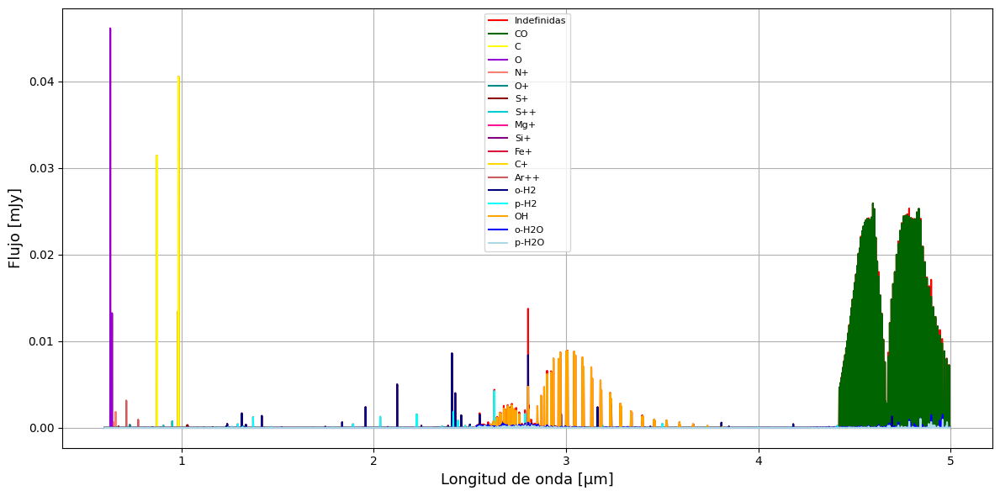

In [31]:
# Modelo 1 Max Mass
#Modelo para el NIR Spectrum
# Espectro de CO
wave_co, flux_co = models[0].gen_specFromLineEstimates(wlrange=[0.6,5], ident='CO', unit="Jy", noCont=True)
flux_co *= 1e3  # Convertir de Jy a mJy

# Espectro de o-H2O
wave_co_solid, flux_co_solid = models[0].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='o-H2O', unit="Jy", noCont=True)
flux_co_solid *= 1e3  # Convertir de Jy a mJy

# Espectro de p-H2O
wave_co_solid2, flux_co_solid2 = models[0].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='p-H2O', unit="Jy", noCont=True)
flux_co_solid2 *= 1e3  # Convertir de Jy a mJy

# Espectro de OH
wave_co_solid3, flux_co_solid3 = models[0].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='OH', unit="Jy", noCont=True)
flux_co_solid3 *= 1e3  # Convertir de Jy a mJy

# Espectro de C
wave_co_solid4, flux_co_solid4 = models[0].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='C', unit="Jy", noCont=True)
flux_co_solid4 *= 1e3  # Convertir de Jy a mJy

# Espectro de O
wave_co_solid5, flux_co_solid5 = models[0].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='O', unit="Jy", noCont=True)
flux_co_solid5 *= 1e3  # Convertir de Jy a mJy

# Espectro de N+
wave_co_solid6, flux_co_solid6 = models[0].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='N+', unit="Jy", noCont=True)
flux_co_solid6 *= 1e3  # Convertir de Jy a mJy

# Espectro de O+
wave_co_solid7, flux_co_solid7 = models[0].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='O+', unit="Jy", noCont=True)
flux_co_solid7 *= 1e3  # Convertir de Jy a mJy

# Espectro de o-H2
wave_co_solid8, flux_co_solid8 = models[0].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='p-H2', unit="Jy", noCont=True)
flux_co_solid8 *= 1e3  # Convertir de Jy a mJy

# Espectro de S+
wave_co_solid9, flux_co_solid9 = models[0].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='S+', unit="Jy", noCont=True)
flux_co_solid9 *= 1e3  # Convertir de Jy a mJy

# Espectro de S++
wave_co_solid10, flux_co_solid10 = models[0].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='S++', unit="Jy", noCont=True)
flux_co_solid10 *= 1e3  # Convertir de Jy a mJy

# Espectro de Si+
wave_co_solid11, flux_co_solid11 = models[0].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='Si+', unit="Jy", noCont=True)
flux_co_solid11 *= 1e3  # Convertir de Jy a mJy

# Espectro de Mg+
wave_co_solid12, flux_co_solid12 = models[0].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='Mg+', unit="Jy", noCont=True)
flux_co_solid12 *= 1e3  # Convertir de Jy a mJy

# Espectro de Fe+
wave_co_solid13, flux_co_solid13 = models[0].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='Fe+', unit="Jy", noCont=True)
flux_co_solid13 *= 1e3  # Convertir de Jy a mJy

# Espectro de C+
wave_co_solid14, flux_co_solid14 = models[0].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='C+', unit="Jy", noCont=True)
flux_co_solid14 *= 1e3  # Convertir de Jy a mJy

# Espectro de Ar++
wave_co_solid15, flux_co_solid15 = models[0].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='Ar++', unit="Jy", noCont=True)
flux_co_solid15 *= 1e3  # Convertir de Jy a mJy

# Espectro de o-H2
wave_co_solid16, flux_co_solid16 = models[0].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='o-H2', unit="Jy", noCont=True)
flux_co_solid16 *= 1e3  # Convertir de Jy a mJy

# Espectro de Si+
#wave_co_solid17, flux_co_solid17 = models[0].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='Si+', unit="Jy", noCont=True)
#flux_co_solid17 *= 1e3  # Convertir de Jy a mJy

# Espectro sin continuo
Range = [0.6, 5]
wave_flux, flux_lines_only = models[0].gen_specFromLineEstimates(Range, unit="Jy", noCont=True)
flux_lines_only *= 1e3  # Convertir de Jy a mJy

# Crear el gráfico combinado
plt.figure(figsize=(12, 6))

# Graficar el espectro sin continuo
plt.plot(wave_flux, flux_lines_only, label='Indefinidas', color='red', linewidth=1.5)
plt.plot(wave_co, flux_co, label='CO', color='darkgreen', linewidth=1.5)
plt.plot(wave_co_solid4, flux_co_solid4, label='C', color='yellow', linewidth=1.5)
plt.plot(wave_co_solid5, flux_co_solid5, label='O', color='darkviolet', linewidth=1.5)
plt.plot(wave_co_solid6, flux_co_solid6, label='N+', color='salmon', linewidth=1.5)
plt.plot(wave_co_solid7, flux_co_solid7, label='O+', color='darkcyan', linewidth=1.5)
plt.plot(wave_co_solid9, flux_co_solid9, label='S+', color='darkred', linewidth=1.5)
plt.plot(wave_co_solid10, flux_co_solid10, label='S++', color='darkturquoise', linewidth=1.5)
plt.plot(wave_co_solid12, flux_co_solid12, label='Mg+', color='deeppink', linewidth=1.5)
plt.plot(wave_co_solid11, flux_co_solid11, label='Si+', color='purple', linewidth=1.5)
plt.plot(wave_co_solid13, flux_co_solid13, label='Fe+', color='crimson', linewidth=1.5)
plt.plot(wave_co_solid14, flux_co_solid14, label='C+', color='gold', linewidth=1.5)
plt.plot(wave_co_solid15, flux_co_solid15, label='Ar++', color='indianred', linewidth=1.5)
plt.plot(wave_co_solid16, flux_co_solid16, label='o-H2', color='navy', linewidth=1.5)
#plt.plot(wave_co_solid17, flux_co_solid17, label='Si+', color='orchid', linewidth=1.5)
plt.plot(wave_co_solid8, flux_co_solid8, label='p-H2', color='cyan', linewidth=1.5)
plt.plot(wave_co_solid3, flux_co_solid3, label='OH', color='orange', linewidth=1.5)
plt.plot(wave_co_solid, flux_co_solid, label='o-H2O', color='blue', linewidth=1.5)
plt.plot(wave_co_solid2, flux_co_solid2, label='p-H2O', color='lightblue', linewidth=1.5)

# Configuración del gráfico
plt.xlabel("Longitud de onda [μm]", fontsize=label_fontsize)
plt.ylabel("Flujo [mJy]", fontsize=label_fontsize)  # Actualizado para reflejar mJy
#plt.title("")
plt.legend(fontsize=8)
plt.grid(True)
plt.tight_layout()
# Guardar el gráfico
plt.savefig('espectro_combinado_NIR_PDS70c_mJy_MaxMass.jpg', format='jpg', dpi=300)
plt.show()

In [32]:
# Definir el nombre del archivo de salida
output_txt_file = "espectro_NIRSPEC_CPD_AltaMasa.txt"

# Datos de especies químicas y sus respectivos valores de longitud de onda y flujo
species_data = [
    (wave_co, flux_co, "CO"),
    (wave_co_solid, flux_co_solid, "o-H2O"),
    (wave_co_solid2, flux_co_solid2, "p-H2O"),
    (wave_co_solid3, flux_co_solid3, "OH"),
    (wave_co_solid4, flux_co_solid4, "C"),
    (wave_co_solid5, flux_co_solid5, "O"),
    (wave_co_solid6, flux_co_solid6, "N+"),
    (wave_co_solid7, flux_co_solid7, "O+"),
    (wave_co_solid8, flux_co_solid8, "p-H2"),
    (wave_co_solid9, flux_co_solid9, "S+"),
    (wave_co_solid10, flux_co_solid10, "S++"),
    (wave_co_solid11, flux_co_solid11, "Si+"),
    (wave_co_solid12, flux_co_solid12, "Mg+"),
    (wave_co_solid13, flux_co_solid13, "Fe+"),
    (wave_co_solid14, flux_co_solid14, "C+"),
    (wave_co_solid15, flux_co_solid15, "Ar++"),
    (wave_co_solid16, flux_co_solid16, "o-H2"),
]

# Guardar los datos en un archivo de texto
with open(output_txt_file, "w") as file:
    file.write("Longitud de Onda (μm)\tFlujo (mJy)\tEspecie Química\n")
    for wave, flux, species in species_data:
        for wl, fl in zip(wave, flux):
            file.write(f"{wl:.6f}\t{fl:.6e}\t{species}\n")

print(f"Archivo guardado correctamente como {output_txt_file}")

Archivo guardado correctamente como espectro_NIRSPEC_CPD_AltaMasa.txt


INFO: gen_specFromLineEstimates: build spectrum for 148 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.47 s
INFO: gen_specFromLineEstimates: build spectrum for 2138 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  4.74 s
INFO: gen_specFromLineEstimates: build spectrum for 2136 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  4.79 s
INFO: gen_specFromLineEstimates: build spectrum for 442 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.66 s
INFO: gen_specFromLineEstimates: build spectrum for 4 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.12 s
INFO: gen_specFromLineEstimates: build spectrum for 437 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.63 s
INFO: gen_specFromLineEstimates: build spectrum for 6 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.12 s
INFO: gen_specF

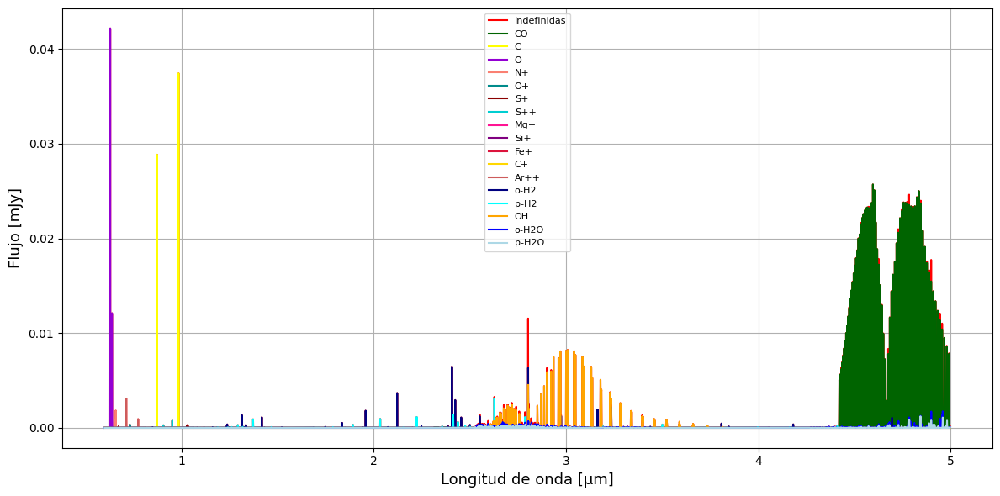

In [33]:
# Modelo 2 Min Mass
#Modelo para el NIR Spectrum
# Espectro de CO
wave_co, flux_co = models[1].gen_specFromLineEstimates(wlrange=[0.6,5], ident='CO', unit="Jy", noCont=True)
flux_co *= 1e3  # Convertir de Jy a mJy

# Espectro de o-H2O
wave_co_solid, flux_co_solid = models[1].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='o-H2O', unit="Jy", noCont=True)
flux_co_solid *= 1e3  # Convertir de Jy a mJy

# Espectro de p-H2O
wave_co_solid2, flux_co_solid2 = models[1].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='p-H2O', unit="Jy", noCont=True)
flux_co_solid2 *= 1e3  # Convertir de Jy a mJy

# Espectro de OH
wave_co_solid3, flux_co_solid3 = models[1].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='OH', unit="Jy", noCont=True)
flux_co_solid3 *= 1e3  # Convertir de Jy a mJy

# Espectro de C
wave_co_solid4, flux_co_solid4 = models[1].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='C', unit="Jy", noCont=True)
flux_co_solid4 *= 1e3  # Convertir de Jy a mJy

# Espectro de O
wave_co_solid5, flux_co_solid5 = models[1].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='O', unit="Jy", noCont=True)
flux_co_solid5 *= 1e3  # Convertir de Jy a mJy

# Espectro de N+
wave_co_solid6, flux_co_solid6 = models[1].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='N+', unit="Jy", noCont=True)
flux_co_solid6 *= 1e3  # Convertir de Jy a mJy

# Espectro de O+
wave_co_solid7, flux_co_solid7 = models[1].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='O+', unit="Jy", noCont=True)
flux_co_solid7 *= 1e3  # Convertir de Jy a mJy

# Espectro de o-H2
wave_co_solid8, flux_co_solid8 = models[1].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='p-H2', unit="Jy", noCont=True)
flux_co_solid8 *= 1e3  # Convertir de Jy a mJy

# Espectro de S+
wave_co_solid9, flux_co_solid9 = models[1].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='S+', unit="Jy", noCont=True)
flux_co_solid9 *= 1e3  # Convertir de Jy a mJy

# Espectro de S++
wave_co_solid10, flux_co_solid10 = models[1].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='S++', unit="Jy", noCont=True)
flux_co_solid10 *= 1e3  # Convertir de Jy a mJy

# Espectro de Si+
wave_co_solid11, flux_co_solid11 = models[1].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='Si+', unit="Jy", noCont=True)
flux_co_solid11 *= 1e3  # Convertir de Jy a mJy

# Espectro de Mg+
wave_co_solid12, flux_co_solid12 = models[1].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='Mg+', unit="Jy", noCont=True)
flux_co_solid12 *= 1e3  # Convertir de Jy a mJy

# Espectro de Fe+
wave_co_solid13, flux_co_solid13 = models[1].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='Fe+', unit="Jy", noCont=True)
flux_co_solid13 *= 1e3  # Convertir de Jy a mJy

# Espectro de C+
wave_co_solid14, flux_co_solid14 = models[1].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='C+', unit="Jy", noCont=True)
flux_co_solid14 *= 1e3  # Convertir de Jy a mJy

# Espectro de Ar++
wave_co_solid15, flux_co_solid15 = models[1].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='Ar++', unit="Jy", noCont=True)
flux_co_solid15 *= 1e3  # Convertir de Jy a mJy

# Espectro de o-H2
wave_co_solid16, flux_co_solid16 = models[1].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='o-H2', unit="Jy", noCont=True)
flux_co_solid16 *= 1e3  # Convertir de Jy a mJy

# Espectro de Si+
#wave_co_solid17, flux_co_solid17 = models[1].gen_specFromLineEstimates(wlrange=[0.6, 5], ident='Si+', unit="Jy", noCont=True)
#flux_co_solid17 *= 1e3  # Convertir de Jy a mJy

# Espectro sin continuo
Range = [0.6, 5]
wave_flux, flux_lines_only = models[1].gen_specFromLineEstimates(Range, unit="Jy", noCont=True)
flux_lines_only *= 1e3  # Convertir de Jy a mJy

# Crear el gráfico combinado
plt.figure(figsize=(12, 6))

# Graficar el espectro sin continuo
plt.plot(wave_flux, flux_lines_only, label='Indefinidas', color='red', linewidth=1.5)
plt.plot(wave_co, flux_co, label='CO', color='darkgreen', linewidth=1.5)
plt.plot(wave_co_solid4, flux_co_solid4, label='C', color='yellow', linewidth=1.5)
plt.plot(wave_co_solid5, flux_co_solid5, label='O', color='darkviolet', linewidth=1.5)
plt.plot(wave_co_solid6, flux_co_solid6, label='N+', color='salmon', linewidth=1.5)
plt.plot(wave_co_solid7, flux_co_solid7, label='O+', color='darkcyan', linewidth=1.5)
plt.plot(wave_co_solid9, flux_co_solid9, label='S+', color='darkred', linewidth=1.5)
plt.plot(wave_co_solid10, flux_co_solid10, label='S++', color='darkturquoise', linewidth=1.5)
plt.plot(wave_co_solid12, flux_co_solid12, label='Mg+', color='deeppink', linewidth=1.5)
plt.plot(wave_co_solid11, flux_co_solid11, label='Si+', color='purple', linewidth=1.5)
plt.plot(wave_co_solid13, flux_co_solid13, label='Fe+', color='crimson', linewidth=1.5)
plt.plot(wave_co_solid14, flux_co_solid14, label='C+', color='gold', linewidth=1.5)
plt.plot(wave_co_solid15, flux_co_solid15, label='Ar++', color='indianred', linewidth=1.5)
plt.plot(wave_co_solid16, flux_co_solid16, label='o-H2', color='navy', linewidth=1.5)
#plt.plot(wave_co_solid17, flux_co_solid17, label='Si+', color='orchid', linewidth=1.5)
plt.plot(wave_co_solid8, flux_co_solid8, label='p-H2', color='cyan', linewidth=1.5)
plt.plot(wave_co_solid3, flux_co_solid3, label='OH', color='orange', linewidth=1.5)
plt.plot(wave_co_solid, flux_co_solid, label='o-H2O', color='blue', linewidth=1.5)
plt.plot(wave_co_solid2, flux_co_solid2, label='p-H2O', color='lightblue', linewidth=1.5)

# Configuración del gráfico
plt.xlabel("Longitud de onda [μm]", fontsize=label_fontsize)
plt.ylabel("Flujo [mJy]", fontsize=label_fontsize)  # Actualizado para reflejar mJy
#plt.title("")
plt.legend(fontsize=8)
plt.grid(True)
plt.tight_layout()
# Guardar el gráfico
plt.savefig('espectro_combinado_NIR_PDS70c_mJy_MinMass.jpg', format='jpg', dpi=300)
plt.show()

In [34]:
# Definir el nombre del archivo de salida
output_txt_file = "espectro_NIRSPEC_CPD_BajaMasa.txt"

# Datos de especies químicas y sus respectivos valores de longitud de onda y flujo
species_data = [
    (wave_co, flux_co, "CO"),
    (wave_co_solid, flux_co_solid, "o-H2O"),
    (wave_co_solid2, flux_co_solid2, "p-H2O"),
    (wave_co_solid3, flux_co_solid3, "OH"),
    (wave_co_solid4, flux_co_solid4, "C"),
    (wave_co_solid5, flux_co_solid5, "O"),
    (wave_co_solid6, flux_co_solid6, "N+"),
    (wave_co_solid7, flux_co_solid7, "O+"),
    (wave_co_solid8, flux_co_solid8, "p-H2"),
    (wave_co_solid9, flux_co_solid9, "S+"),
    (wave_co_solid10, flux_co_solid10, "S++"),
    (wave_co_solid11, flux_co_solid11, "Si+"),
    (wave_co_solid12, flux_co_solid12, "Mg+"),
    (wave_co_solid13, flux_co_solid13, "Fe+"),
    (wave_co_solid14, flux_co_solid14, "C+"),
    (wave_co_solid15, flux_co_solid15, "Ar++"),
    (wave_co_solid16, flux_co_solid16, "o-H2"),
]

# Guardar los datos en un archivo de texto
with open(output_txt_file, "w") as file:
    file.write("Longitud de Onda (μm)\tFlujo (mJy)\tEspecie Química\n")
    for wave, flux, species in species_data:
        for wl, fl in zip(wave, flux):
            file.write(f"{wl:.6f}\t{fl:.6e}\t{species}\n")

print(f"Archivo guardado correctamente como {output_txt_file}")

Archivo guardado correctamente como espectro_NIRSPEC_CPD_BajaMasa.txt


INFO: gen_specFromLineEstimates: build spectrum for 7 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  1.92 s
INFO: gen_specFromLineEstimates: build spectrum for 3661 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  5.71 s
INFO: gen_specFromLineEstimates: build spectrum for 3480 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  5.71 s
INFO: gen_specFromLineEstimates: build spectrum for 216 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  1.95 s
INFO: gen_specFromLineEstimates: build spectrum for 30 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  1.78 s
INFO: gen_specFromLineEstimates: build spectrum for 3661 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  5.53 s
INFO: gen_specFromLineEstimates: build spectrum for 3480 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  5.54 s
INFO: gen_sp

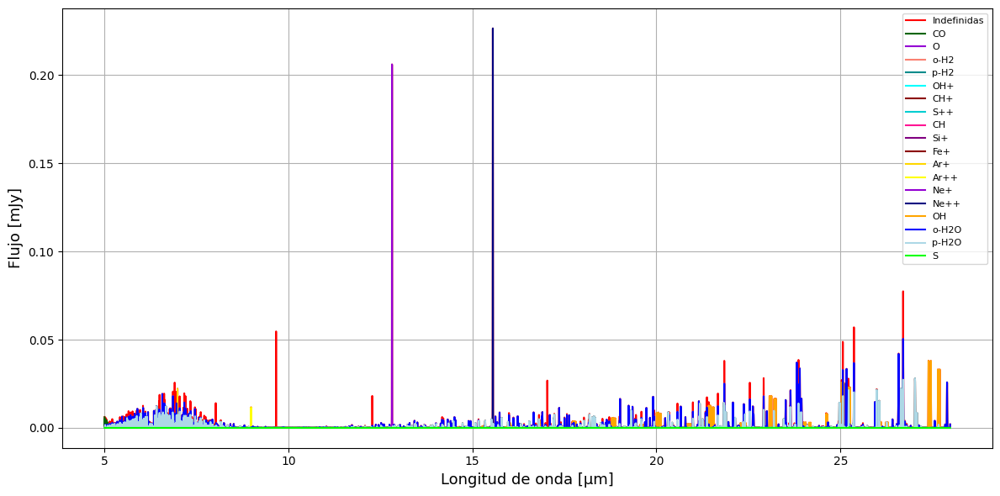

In [35]:
# Modelo Max Mass
#Modelo para el MIRI Spectrum
# Espectro de CO
wave_co, flux_co = models[0].gen_specFromLineEstimates(wlrange=[5, 28], ident='CO', unit="Jy", noCont=True)
flux_co *= 1e3  # Convertir de Jy a mJy

# Espectro de o-H2O
wave_co_solid, flux_co_solid = models[0].gen_specFromLineEstimates(wlrange=[5, 28], ident='o-H2O', unit="Jy", noCont=True)
flux_co_solid *= 1e3  # Convertir de Jy a mJy

# Espectro de p-H2O
wave_co_solid2, flux_co_solid2 = models[0].gen_specFromLineEstimates(wlrange=[5, 28], ident='p-H2O', unit="Jy", noCont=True)
flux_co_solid2 *= 1e3  # Convertir de Jy a mJy

# Espectro de OH
wave_co_solid3, flux_co_solid3 = models[0].gen_specFromLineEstimates(wlrange=[5, 28], ident='OH', unit="Jy", noCont=True)
flux_co_solid3 *= 1e3  # Convertir de Jy a mJy

# Espectro de CO2
#wave_co_solid4, flux_co_solid4 = models[0].gen_specFromLineEstimates(wlrange=[5, 28], ident='CO2', unit="Jy", noCont=True)
#flux_co_solid4 *= 1e3  # Convertir de Jy a mJy

# Espectro de O
wave_co_solid5, flux_co_solid5 = models[0].gen_specFromLineEstimates(wlrange=[5, 28], ident='O', unit="Jy", noCont=True)
flux_co_solid5 *= 1e3  # Convertir de Jy a mJy

# Espectro de o-H2O
wave_co_solid6, flux_co_solid6 = models[0].gen_specFromLineEstimates(wlrange=[5, 28], ident='o-H2O', unit="Jy", noCont=True)
flux_co_solid6 *= 1e3  # Convertir de Jy a mJy

# Espectro de p-H20
wave_co_solid7, flux_co_solid7 = models[0].gen_specFromLineEstimates(wlrange=[5, 28], ident='p-H2O', unit="Jy", noCont=True)
flux_co_solid7 *= 1e3  # Convertir de Jy a mJy

# Espectro de OH+
wave_co_solid8, flux_co_solid8 = models[0].gen_specFromLineEstimates(wlrange=[5, 28], ident='OH+', unit="Jy", noCont=True)
flux_co_solid8 *= 1e3  # Convertir de Jy a mJy

# Espectro de CH+
wave_co_solid9, flux_co_solid9 = models[0].gen_specFromLineEstimates(wlrange=[5, 28], ident='CH+', unit="Jy", noCont=True)
flux_co_solid9 *= 1e3  # Convertir de Jy a mJy

# Espectro de S++
wave_co_solid10, flux_co_solid10 = models[0].gen_specFromLineEstimates(wlrange=[5, 28], ident='S++', unit="Jy", noCont=True)
flux_co_solid10 *= 1e3  # Convertir de Jy a mJy

# Espectro de Si+
wave_co_solid11, flux_co_solid11 = models[0].gen_specFromLineEstimates(wlrange=[5, 28], ident='Si+', unit="Jy", noCont=True)
flux_co_solid11 *= 1e3  # Convertir de Jy a mJy

# Espectro de CH
wave_co_solid12, flux_co_solid12 = models[0].gen_specFromLineEstimates(wlrange=[5, 28], ident='CH', unit="Jy", noCont=True)
flux_co_solid12 *= 1e3  # Convertir de Jy a mJy

# Espectro de Fe+
wave_co_solid13, flux_co_solid13 = models[0].gen_specFromLineEstimates(wlrange=[5, 28], ident='Fe+', unit="Jy", noCont=True)
flux_co_solid13 *= 1e3  # Convertir de Jy a mJy

# Espectro de Ar+
wave_co_solid14, flux_co_solid14 = models[0].gen_specFromLineEstimates(wlrange=[5, 28], ident='Ar+', unit="Jy", noCont=True)
flux_co_solid14 *= 1e3  # Convertir de Jy a mJy

# Espectro de Ar++
wave_co_solid15, flux_co_solid15 = models[0].gen_specFromLineEstimates(wlrange=[5, 28], ident='Ar++', unit="Jy", noCont=True)
flux_co_solid15 *= 1e3  # Convertir de Jy a mJy

# Espectro de Ne+
wave_co_solid16, flux_co_solid16 = models[0].gen_specFromLineEstimates(wlrange=[5, 28], ident='Ne+', unit="Jy", noCont=True)
flux_co_solid16 *= 1e3  # Convertir de Jy a mJy

# Espectro de Ne++
wave_co_solid17, flux_co_solid17 = models[0].gen_specFromLineEstimates(wlrange=[5, 28], ident='Ne++', unit="Jy", noCont=True)
flux_co_solid17 *= 1e3  # Convertir de Jy a mJy

# Espectro de S
wave_co_solid18, flux_co_solid18 = models[0].gen_specFromLineEstimates(wlrange=[5, 28], ident='S', unit="Jy", noCont=True)
flux_co_solid18 *= 1e3  # Convertir de Jy a mJy

# Espectro sin continuo
Range = [5, 28]
wave_flux, flux_lines_only = models[0].gen_specFromLineEstimates(Range, unit="Jy", noCont=True)
flux_lines_only *= 1e3  # Convertir de Jy a mJy

# Crear el gráfico combinado
plt.figure(figsize=(12, 6))

# Graficar el espectro sin continuo
plt.plot(wave_flux, flux_lines_only, label='Indefinidas', color='red', linewidth=1.5)
plt.plot(wave_co, flux_co, label='CO', color='darkgreen', linewidth=1.5)
#plt.plot(wave_co_solid4, flux_co_solid4, label='CO2', color='yellow', linewidth=1.5)
plt.plot(wave_co_solid5, flux_co_solid5, label='O', color='darkviolet', linewidth=1.5)
plt.plot(wave_co_solid6, flux_co_solid6, label='o-H2', color='salmon', linewidth=1.5)
plt.plot(wave_co_solid7, flux_co_solid7, label='p-H2', color='darkcyan', linewidth=1.5)
plt.plot(wave_co_solid8, flux_co_solid8, label='OH+', color='cyan', linewidth=1.5)
plt.plot(wave_co_solid9, flux_co_solid9, label='CH+', color='darkred', linewidth=1.5)
plt.plot(wave_co_solid10, flux_co_solid10, label='S++', color='darkturquoise', linewidth=1.5)
plt.plot(wave_co_solid12, flux_co_solid12, label='CH', color='deeppink', linewidth=1.5)
plt.plot(wave_co_solid11, flux_co_solid11, label='Si+', color='purple', linewidth=1.5)
plt.plot(wave_co_solid13, flux_co_solid13, label='Fe+', color='darkred', linewidth=1.5)
plt.plot(wave_co_solid14, flux_co_solid14, label='Ar+', color='gold', linewidth=1.5)
plt.plot(wave_co_solid15, flux_co_solid15, label='Ar++', color='yellow', linewidth=1.5)
plt.plot(wave_co_solid16, flux_co_solid16, label='Ne+', color='darkviolet', linewidth=1.5)
plt.plot(wave_co_solid17, flux_co_solid17, label='Ne++', color='navy', linewidth=1.5)
plt.plot(wave_co_solid3, flux_co_solid3, label='OH', color='orange', linewidth=1.5)
plt.plot(wave_co_solid, flux_co_solid, label='o-H2O', color='blue', linewidth=1.5)
plt.plot(wave_co_solid2, flux_co_solid2, label='p-H2O', color='lightblue', linewidth=1.5)
plt.plot(wave_co_solid18, flux_co_solid18, label='S', color='lime', linewidth=1.5)

# Configuración del gráfico
plt.xlabel("Longitud de onda [μm]", fontsize=label_fontsize)
plt.ylabel("Flujo [mJy]", fontsize=label_fontsize)  # Actualizado para reflejar mJy
#plt.title("")
plt.legend(fontsize=8)
plt.grid(True)
plt.tight_layout()
# Guardar el gráfico
plt.savefig('espectro_combinado_MIR_PDS70c_mJy_MaxMass.jpg', format='jpg', dpi=300)
plt.show()

In [36]:
# Definir el nombre del archivo de salida
output_txt_file = "espectro_MIRI_CPD_AltaMasa.txt"

# Datos de especies químicas y sus respectivos valores de longitud de onda y flujo
species_data = [
    (wave_co, flux_co, "CO"),
    (wave_co_solid, flux_co_solid, "o-H2O"),
    (wave_co_solid2, flux_co_solid2, "p-H2O"),
    (wave_co_solid3, flux_co_solid3, "OH"),
    (wave_co_solid5, flux_co_solid5, "O"),
    (wave_co_solid6, flux_co_solid6, "o-H2"),
    (wave_co_solid7, flux_co_solid7, "p-H2"),
    (wave_co_solid8, flux_co_solid8, "OH+"),
    (wave_co_solid9, flux_co_solid9, "CH+"),
    (wave_co_solid10, flux_co_solid10, "S++"),
    (wave_co_solid11, flux_co_solid11, "Si+"),
    (wave_co_solid12, flux_co_solid12, "CH"),
    (wave_co_solid13, flux_co_solid13, "Fe+"),
    (wave_co_solid14, flux_co_solid14, "Ar+"),
    (wave_co_solid15, flux_co_solid15, "Ar++"),
    (wave_co_solid16, flux_co_solid16, "Ne+"),
    (wave_co_solid17, flux_co_solid17, "Ne++"),
    (wave_co_solid18, flux_co_solid18, "S"),
]

# Guardar los datos en un archivo de texto
with open(output_txt_file, "w") as file:
    file.write("Longitud de Onda (μm)\tFlujo (mJy)\tEspecie Química\n")
    for wave, flux, species in species_data:
        for wl, fl in zip(wave, flux):
            file.write(f"{wl:.6f}\t{fl:.6e}\t{species}\n")

print(f"Archivo guardado correctamente como {output_txt_file}")

Archivo guardado correctamente como espectro_MIRI_CPD_AltaMasa.txt


INFO: gen_specFromLineEstimates: build spectrum for 7 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  1.92 s
INFO: gen_specFromLineEstimates: build spectrum for 3661 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  6.04 s
INFO: gen_specFromLineEstimates: build spectrum for 3480 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  5.98 s
INFO: gen_specFromLineEstimates: build spectrum for 216 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.24 s
INFO: gen_specFromLineEstimates: build spectrum for 30 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.04 s
INFO: gen_specFromLineEstimates: build spectrum for 3661 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  5.91 s
INFO: gen_specFromLineEstimates: build spectrum for 3480 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  5.99 s
INFO: gen_sp

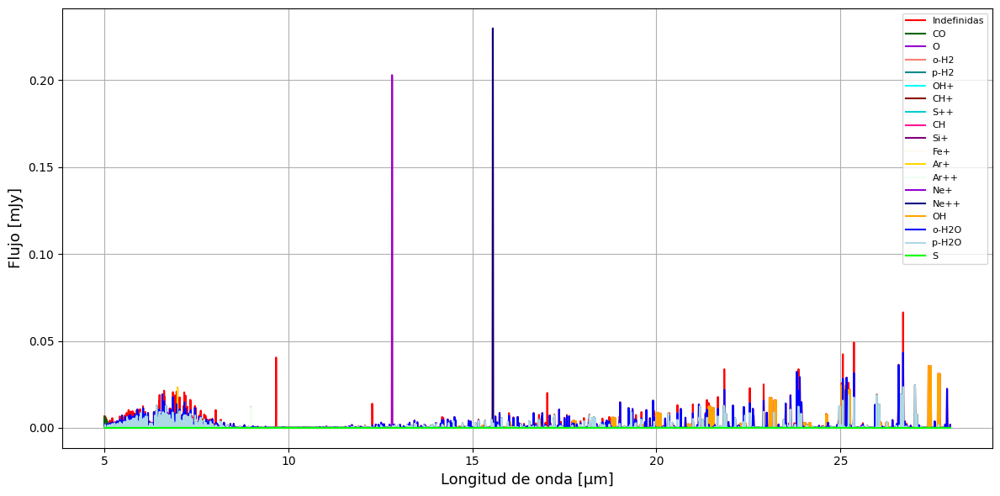

In [37]:
# Modelo Min Mass
#Modelo para el MIRI Spectrum
# Espectro de CO
wave_co, flux_co = models[1].gen_specFromLineEstimates(wlrange=[5, 28], ident='CO', unit="Jy", noCont=True)
flux_co *= 1e3  # Convertir de Jy a mJy

# Espectro de o-H2O
wave_co_solid, flux_co_solid = models[1].gen_specFromLineEstimates(wlrange=[5, 28], ident='o-H2O', unit="Jy", noCont=True)
flux_co_solid *= 1e3  # Convertir de Jy a mJy

# Espectro de p-H2O
wave_co_solid2, flux_co_solid2 = models[1].gen_specFromLineEstimates(wlrange=[5, 28], ident='p-H2O', unit="Jy", noCont=True)
flux_co_solid2 *= 1e3  # Convertir de Jy a mJy

# Espectro de OH
wave_co_solid3, flux_co_solid3 = models[1].gen_specFromLineEstimates(wlrange=[5, 28], ident='OH', unit="Jy", noCont=True)
flux_co_solid3 *= 1e3  # Convertir de Jy a mJy

# Espectro de CO2
#wave_co_solid4, flux_co_solid4 = models[1].gen_specFromLineEstimates(wlrange=[5, 28], ident='CO2', unit="Jy", noCont=True)
#flux_co_solid4 *= 1e3  # Convertir de Jy a mJy

# Espectro de O
wave_co_solid5, flux_co_solid5 = models[1].gen_specFromLineEstimates(wlrange=[5, 28], ident='O', unit="Jy", noCont=True)
flux_co_solid5 *= 1e3  # Convertir de Jy a mJy

# Espectro de o-H2O
wave_co_solid6, flux_co_solid6 = models[1].gen_specFromLineEstimates(wlrange=[5, 28], ident='o-H2O', unit="Jy", noCont=True)
flux_co_solid6 *= 1e3  # Convertir de Jy a mJy

# Espectro de p-H20
wave_co_solid7, flux_co_solid7 = models[1].gen_specFromLineEstimates(wlrange=[5, 28], ident='p-H2O', unit="Jy", noCont=True)
flux_co_solid7 *= 1e3  # Convertir de Jy a mJy

# Espectro de OH+
wave_co_solid8, flux_co_solid8 = models[1].gen_specFromLineEstimates(wlrange=[5, 28], ident='OH+', unit="Jy", noCont=True)
flux_co_solid8 *= 1e3  # Convertir de Jy a mJy

# Espectro de CH+
wave_co_solid9, flux_co_solid9 = models[1].gen_specFromLineEstimates(wlrange=[5, 28], ident='CH+', unit="Jy", noCont=True)
flux_co_solid9 *= 1e3  # Convertir de Jy a mJy

# Espectro de S++
wave_co_solid10, flux_co_solid10 = models[1].gen_specFromLineEstimates(wlrange=[5, 28], ident='S++', unit="Jy", noCont=True)
flux_co_solid10 *= 1e3  # Convertir de Jy a mJy

# Espectro de Si+
wave_co_solid11, flux_co_solid11 = models[1].gen_specFromLineEstimates(wlrange=[5, 28], ident='Si+', unit="Jy", noCont=True)
flux_co_solid11 *= 1e3  # Convertir de Jy a mJy

# Espectro de CH
wave_co_solid12, flux_co_solid12 = models[1].gen_specFromLineEstimates(wlrange=[5, 28], ident='CH', unit="Jy", noCont=True)
flux_co_solid12 *= 1e3  # Convertir de Jy a mJy

# Espectro de Fe+
wave_co_solid13, flux_co_solid13 = models[1].gen_specFromLineEstimates(wlrange=[5, 28], ident='Fe+', unit="Jy", noCont=True)
flux_co_solid13 *= 1e3  # Convertir de Jy a mJy

# Espectro de Ar+
wave_co_solid14, flux_co_solid14 = models[1].gen_specFromLineEstimates(wlrange=[5, 28], ident='Ar+', unit="Jy", noCont=True)
flux_co_solid14 *= 1e3  # Convertir de Jy a mJy

# Espectro de Ar++
wave_co_solid15, flux_co_solid15 = models[1].gen_specFromLineEstimates(wlrange=[5, 28], ident='Ar++', unit="Jy", noCont=True)
flux_co_solid15 *= 1e3  # Convertir de Jy a mJy

# Espectro de Ne+
wave_co_solid16, flux_co_solid16 = models[1].gen_specFromLineEstimates(wlrange=[5, 28], ident='Ne+', unit="Jy", noCont=True)
flux_co_solid16 *= 1e3  # Convertir de Jy a mJy

# Espectro de Ne++
wave_co_solid17, flux_co_solid17 = models[1].gen_specFromLineEstimates(wlrange=[5, 28], ident='Ne++', unit="Jy", noCont=True)
flux_co_solid17 *= 1e3  # Convertir de Jy a mJy

# Espectro de S
wave_co_solid18, flux_co_solid18 = models[1].gen_specFromLineEstimates(wlrange=[5, 28], ident='S', unit="Jy", noCont=True)
flux_co_solid18 *= 1e3  # Convertir de Jy a mJy

# Espectro sin continuo
Range = [5, 28]
wave_flux, flux_lines_only = models[1].gen_specFromLineEstimates(Range, unit="Jy", noCont=True)
flux_lines_only *= 1e3  # Convertir de Jy a mJy

# Crear el gráfico combinado
plt.figure(figsize=(12, 6))

# Graficar el espectro sin continuo
plt.plot(wave_flux, flux_lines_only, label='Indefinidas', color='red', linewidth=1.5)
plt.plot(wave_co, flux_co, label='CO', color='darkgreen', linewidth=1.5)
#plt.plot(wave_co_solid4, flux_co_solid4, label='CO2', color='yellow', linewidth=1.5)
plt.plot(wave_co_solid5, flux_co_solid5, label='O', color='darkviolet', linewidth=1.5)
plt.plot(wave_co_solid6, flux_co_solid6, label='o-H2', color='salmon', linewidth=1.5)
plt.plot(wave_co_solid7, flux_co_solid7, label='p-H2', color='darkcyan', linewidth=1.5)
plt.plot(wave_co_solid8, flux_co_solid8, label='OH+', color='cyan', linewidth=1.5)
plt.plot(wave_co_solid9, flux_co_solid9, label='CH+', color='darkred', linewidth=1.5)
plt.plot(wave_co_solid10, flux_co_solid10, label='S++', color='darkturquoise', linewidth=1.5)
plt.plot(wave_co_solid12, flux_co_solid12, label='CH', color='deeppink', linewidth=1.5)
plt.plot(wave_co_solid11, flux_co_solid11, label='Si+', color='purple', linewidth=1.5)
plt.plot(wave_co_solid13, flux_co_solid13, label='Fe+', color='floralwhite', linewidth=1.5)
plt.plot(wave_co_solid14, flux_co_solid14, label='Ar+', color='gold', linewidth=1.5)
plt.plot(wave_co_solid15, flux_co_solid15, label='Ar++', color='honeydew', linewidth=1.5)
plt.plot(wave_co_solid16, flux_co_solid16, label='Ne+', color='darkviolet', linewidth=1.5)
plt.plot(wave_co_solid17, flux_co_solid17, label='Ne++', color='navy', linewidth=1.5)
plt.plot(wave_co_solid3, flux_co_solid3, label='OH', color='orange', linewidth=1.5)
plt.plot(wave_co_solid, flux_co_solid, label='o-H2O', color='blue', linewidth=1.5)
plt.plot(wave_co_solid2, flux_co_solid2, label='p-H2O', color='lightblue', linewidth=1.5)
plt.plot(wave_co_solid18, flux_co_solid18, label='S', color='lime', linewidth=1.5)

# Configuración del gráfico
plt.xlabel("Longitud de onda [μm]", fontsize=label_fontsize)
plt.ylabel("Flujo [mJy]", fontsize=label_fontsize)  # Actualizado para reflejar mJy
#plt.title("")
plt.legend(fontsize=8)
plt.grid(True)
plt.tight_layout()
# Guardar el gráfico
plt.savefig('espectro_combinado_MIR_PDS70c_mJy_MinMass.jpg', format='jpg', dpi=300)
plt.show()

In [38]:
# Definir el nombre del archivo de salida
output_txt_file = "espectro_MIRI_CPD_BajaMasa.txt"

# Datos de especies químicas y sus respectivos valores de longitud de onda y flujo
species_data = [
    (wave_co, flux_co, "CO"),
    (wave_co_solid, flux_co_solid, "o-H2O"),
    (wave_co_solid2, flux_co_solid2, "p-H2O"),
    (wave_co_solid3, flux_co_solid3, "OH"),
    (wave_co_solid5, flux_co_solid5, "O"),
    (wave_co_solid6, flux_co_solid6, "o-H2"),
    (wave_co_solid7, flux_co_solid7, "p-H2"),
    (wave_co_solid8, flux_co_solid8, "OH+"),
    (wave_co_solid9, flux_co_solid9, "CH+"),
    (wave_co_solid10, flux_co_solid10, "S++"),
    (wave_co_solid11, flux_co_solid11, "Si+"),
    (wave_co_solid12, flux_co_solid12, "CH"),
    (wave_co_solid13, flux_co_solid13, "Fe+"),
    (wave_co_solid14, flux_co_solid14, "Ar+"),
    (wave_co_solid15, flux_co_solid15, "Ar++"),
    (wave_co_solid16, flux_co_solid16, "Ne+"),
    (wave_co_solid17, flux_co_solid17, "Ne++"),
    (wave_co_solid18, flux_co_solid18, "S"),
]

# Guardar los datos en un archivo de texto
with open(output_txt_file, "w") as file:
    file.write("Longitud de Onda (μm)\tFlujo (mJy)\tEspecie Química\n")
    for wave, flux, species in species_data:
        for wl, fl in zip(wave, flux):
            file.write(f"{wl:.6f}\t{fl:.6e}\t{species}\n")

print(f"Archivo guardado correctamente como {output_txt_file}")

Archivo guardado correctamente como espectro_MIRI_CPD_BajaMasa.txt


INFO: gen_specFromLineEstimates: build spectrum for 50 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  3.02 s
INFO: gen_specFromLineEstimates: build spectrum for 504 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  5.94 s
INFO: gen_specFromLineEstimates: build spectrum for 484 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  5.93 s
INFO: gen_specFromLineEstimates: build spectrum for 113 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  4.09 s
INFO: gen_specFromLineEstimates: build spectrum for 3 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  3.15 s
INFO: gen_specFromLineEstimates: build spectrum for 7 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.88 s
INFO: gen_specFromLineEstimates: build spectrum for 2 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.81 s
INFO: gen_specFromLi

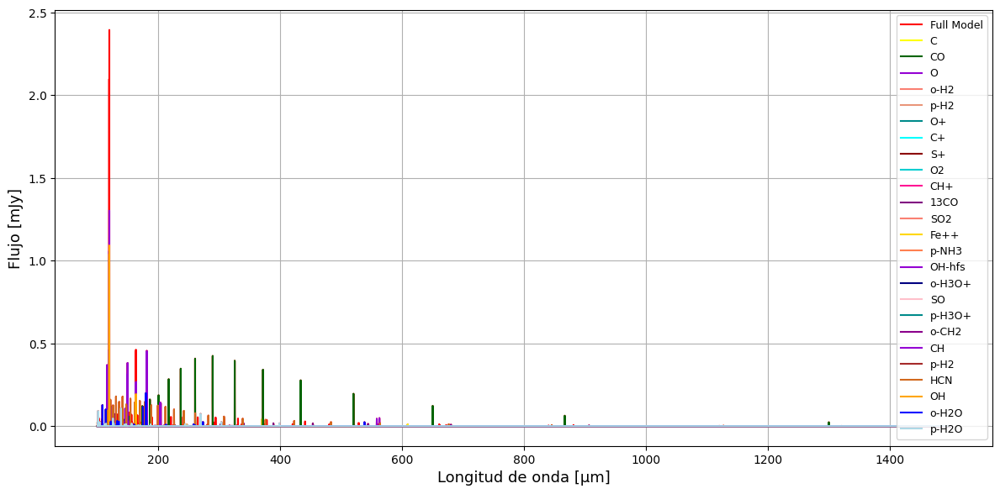

In [47]:
# Modelo Max Mass
#Modelo para el Submm Spectrum
# Espectro de CO
wave_co, flux_co = models[0].gen_specFromLineEstimates(wlrange=[100,1500], ident='CO', unit="Jy", noCont=True)
flux_co *= 1e3  # Convertir de Jy a mJy

# Espectro de o-H2O
wave_co_solid, flux_co_solid = models[0].gen_specFromLineEstimates(wlrange=[100,1500], ident='o-H2O', unit="Jy", noCont=True)
flux_co_solid *= 1e3  # Convertir de Jy a mJy

# Espectro de p-H2O
wave_co_solid2, flux_co_solid2 = models[0].gen_specFromLineEstimates(wlrange=[100,1500], ident='p-H2O', unit="Jy", noCont=True)
flux_co_solid2 *= 1e3  # Convertir de Jy a mJy

# Espectro de OH
wave_co_solid3, flux_co_solid3 = models[0].gen_specFromLineEstimates(wlrange=[100,1500], ident='OH', unit="Jy", noCont=True)
flux_co_solid3 *= 1e3  # Convertir de Jy a mJy

# Espectro de C
wave_co_solid4, flux_co_solid4 = models[0].gen_specFromLineEstimates(wlrange=[100,1500], ident='C', unit="Jy", noCont=True)
flux_co_solid4 *= 1e3  # Convertir de Jy a mJy

# Espectro de O
wave_co_solid5, flux_co_solid5 = models[0].gen_specFromLineEstimates(wlrange=[100,1500], ident='O', unit="Jy", noCont=True)
flux_co_solid5 *= 1e3  # Convertir de Jy a mJy

# Espectro de N+
wave_co_solid6, flux_co_solid6 = models[0].gen_specFromLineEstimates(wlrange=[100,1500], ident='N+', unit="Jy", noCont=True)
flux_co_solid6 *= 1e3  # Convertir de Jy a mJy

# Espectro de O+
wave_co_solid7, flux_co_solid7 = models[0].gen_specFromLineEstimates(wlrange=[100,1500], ident='O+', unit="Jy", noCont=True)
flux_co_solid7 *= 1e3  # Convertir de Jy a mJy

# Espectro de C+
wave_co_solid8, flux_co_solid8 = models[0].gen_specFromLineEstimates(wlrange=[100,1500], ident='C+', unit="Jy", noCont=True)
flux_co_solid8 *= 1e3  # Convertir de Jy a mJy

# Espectro de S+
wave_co_solid9, flux_co_solid9 = models[0].gen_specFromLineEstimates(wlrange=[100,1500], ident='S+', unit="Jy", noCont=True)
flux_co_solid9 *= 1e3  # Convertir de Jy a mJy

# Espectro de O2
wave_co_solid10, flux_co_solid10 = models[0].gen_specFromLineEstimates(wlrange=[100,1500], ident='O2', unit="Jy", noCont=True)
flux_co_solid10 *= 1e3  # Convertir de Jy a mJy

# Espectro de 13CO
wave_co_solid11, flux_co_solid11 = models[0].gen_specFromLineEstimates(wlrange=[100,1500], ident='13CO', unit="Jy", noCont=True)
flux_co_solid11 *= 1e3  # Convertir de Jy a mJy

# Espectro de CH+
wave_co_solid12, flux_co_solid12 = models[0].gen_specFromLineEstimates(wlrange=[100,1500], ident='CH+', unit="Jy", noCont=True)
flux_co_solid12 *= 1e3  # Convertir de Jy a mJy

# Espectro de SO2
wave_co_solid13, flux_co_solid13 = models[0].gen_specFromLineEstimates(wlrange=[100,1500], ident='SO2', unit="Jy", noCont=True)
flux_co_solid13 *= 1e3  # Convertir de Jy a mJy

# Espectro de o-NH3
wave_co_solid14, flux_co_solid14 = models[0].gen_specFromLineEstimates(wlrange=[100,1500], ident='o-NH3', unit="Jy", noCont=True)
flux_co_solid14 *= 1e3  # Convertir de Jy a mJy

# Espectro de p-NH3
wave_co_solid15, flux_co_solid15 = models[0].gen_specFromLineEstimates(wlrange=[100,1500], ident='p-NH3', unit="Jy", noCont=True)
flux_co_solid15 *= 1e3  # Convertir de Jy a mJy

# Espectro de OH-hfs
wave_co_solid16, flux_co_solid16 = models[0].gen_specFromLineEstimates(wlrange=[100,1500], ident='OH-hfs', unit="Jy", noCont=True)
flux_co_solid16 *= 1e3  # Convertir de Jy a mJy

# Espectro de o-H3O
wave_co_solid17, flux_co_solid17 = models[0].gen_specFromLineEstimates(wlrange=[100,1500], ident='o-H3O+', unit="Jy", noCont=True)
flux_co_solid17 *= 1e3  # Convertir de Jy a mJy

# Espectro de SO
wave_co_solid18, flux_co_solid18 = models[0].gen_specFromLineEstimates(wlrange=[100,1500], ident='SO', unit="Jy", noCont=True)
flux_co_solid18 *= 1e3  # Convertir de Jy a mJy

# Espectro de p-H3O
wave_co_solid19, flux_co_solid19 = models[0].gen_specFromLineEstimates(wlrange=[100,1500], ident='p-H3O+', unit="Jy", noCont=True)
flux_co_solid19 *= 1e3  # Convertir de Jy a mJy

# Espectro de o-CH2
wave_co_solid20, flux_co_solid20 = models[0].gen_specFromLineEstimates(wlrange=[100,1500], ident='o-CH2', unit="Jy", noCont=True)
flux_co_solid20 *= 1e3  # Convertir de Jy a mJy

# Espectro de CH
wave_co_solid21, flux_co_solid21 = models[0].gen_specFromLineEstimates(wlrange=[100,1500], ident='CH', unit="Jy", noCont=True)
flux_co_solid21 *= 1e3  # Convertir de Jy a mJy

# Espectro de p-H2
wave_co_solid22, flux_co_solid22 = models[0].gen_specFromLineEstimates(wlrange=[100,1500], ident='p-H2', unit="Jy", noCont=True)
flux_co_solid22 *= 1e3  # Convertir de Jy a mJy

# Espectro de HCN
wave_co_solid23, flux_co_solid23 = models[0].gen_specFromLineEstimates(wlrange=[100,1500], ident='HCN', unit="Jy", noCont=True)
flux_co_solid23 *= 1e3  # Convertir de Jy a mJy

# Espectro sin continuo
Range = [100,1500]
wave_flux, flux_lines_only = models[0].gen_specFromLineEstimates(Range, unit="Jy", noCont=True)
flux_lines_only *= 1e3  # Convertir de Jy a mJy

# Crear el gráfico combinado
plt.figure(figsize=(12, 6))

# Graficar el espectro sin continuo
plt.plot(wave_flux, flux_lines_only, label='Full Model', color='red', linewidth=1.5)
plt.plot(wave_co_solid4, flux_co_solid4, label='C', color='yellow', linewidth=1.5)
plt.plot(wave_co, flux_co, label='CO', color='darkgreen', linewidth=1.5)
plt.plot(wave_co_solid5, flux_co_solid5, label='O', color='darkviolet', linewidth=1.5)
plt.plot(wave_co_solid6, flux_co_solid6, label='o-H2', color='salmon', linewidth=1.5)
plt.plot(wave_co_solid22, flux_co_solid22, label='p-H2', color='darksalmon', linewidth=1.5)
plt.plot(wave_co_solid7, flux_co_solid7, label='O+', color='darkcyan', linewidth=1.5)
plt.plot(wave_co_solid8, flux_co_solid8, label='C+', color='cyan', linewidth=1.5)
plt.plot(wave_co_solid9, flux_co_solid9, label='S+', color='darkred', linewidth=1.5)
plt.plot(wave_co_solid10, flux_co_solid10, label='O2', color='darkturquoise', linewidth=1.5)
plt.plot(wave_co_solid12, flux_co_solid12, label='CH+', color='deeppink', linewidth=1.5)
plt.plot(wave_co_solid11, flux_co_solid11, label='13CO', color='purple', linewidth=1.5)
plt.plot(wave_co_solid13, flux_co_solid13, label='SO2', color='salmon', linewidth=1.5)
plt.plot(wave_co_solid14, flux_co_solid14, label='Fe++', color='gold', linewidth=1.5)
plt.plot(wave_co_solid15, flux_co_solid15, label='p-NH3', color='coral', linewidth=1.5)
plt.plot(wave_co_solid16, flux_co_solid16, label='OH-hfs', color='darkviolet', linewidth=1.5)
plt.plot(wave_co_solid17, flux_co_solid17, label='o-H3O+', color='navy', linewidth=1.5)
plt.plot(wave_co_solid18, flux_co_solid18, label='SO', color='pink', linewidth=1.5)
plt.plot(wave_co_solid19, flux_co_solid19, label='p-H3O+', color='darkcyan', linewidth=1.5)
plt.plot(wave_co_solid20, flux_co_solid20, label='o-CH2', color='darkmagenta', linewidth=1.5)
plt.plot(wave_co_solid21, flux_co_solid21, label='CH', color='darkviolet', linewidth=1.5)
plt.plot(wave_co_solid22, flux_co_solid22, label='p-H2', color='brown', linewidth=1.5)
plt.plot(wave_co_solid23, flux_co_solid23, label='HCN', color='chocolate', linewidth=1.5)
plt.plot(wave_co_solid3, flux_co_solid3, label='OH', color='orange', linewidth=1.5)
plt.plot(wave_co_solid, flux_co_solid, label='o-H2O', color='blue', linewidth=1.5)
plt.plot(wave_co_solid2, flux_co_solid2, label='p-H2O', color='lightblue', linewidth=1.5)

# Configuración del gráfico
plt.xlabel("Longitud de onda [μm]", fontsize=label_fontsize)
plt.ylabel("Flujo [mJy]", fontsize=label_fontsize)  # Actualizado para reflejar mJy
#plt.title("")
plt.legend(fontsize=9)
plt.grid(True)
plt.tight_layout()
# Guardar el gráfico
plt.savefig('espectro_combinado_Submm_PDS70c_mJy_MaxMass.jpg', format='jpg', dpi=300)
plt.show()

INFO: gen_specFromLineEstimates: build spectrum for 50 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  3.98 s
INFO: gen_specFromLineEstimates: build spectrum for 504 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  4.51 s
INFO: gen_specFromLineEstimates: build spectrum for 484 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  4.44 s
INFO: gen_specFromLineEstimates: build spectrum for 113 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  3.15 s
INFO: gen_specFromLineEstimates: build spectrum for 3 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.75 s
INFO: gen_specFromLineEstimates: build spectrum for 7 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.77 s
INFO: gen_specFromLineEstimates: build spectrum for 2 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.76 s
INFO: gen_specFromLi

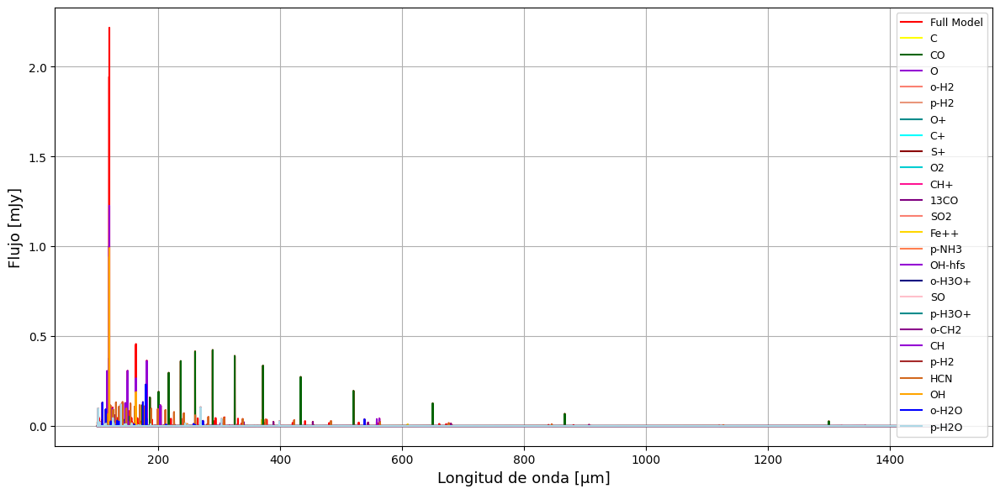

In [48]:
# Modelo Min Mass
#Modelo para el Submm Spectrum
# Espectro de CO
wave_co, flux_co = models[1].gen_specFromLineEstimates(wlrange=[100,1500], ident='CO', unit="Jy", noCont=True)
flux_co *= 1e3  # Convertir de Jy a mJy

# Espectro de o-H2O
wave_co_solid, flux_co_solid = models[1].gen_specFromLineEstimates(wlrange=[100,1500], ident='o-H2O', unit="Jy", noCont=True)
flux_co_solid *= 1e3  # Convertir de Jy a mJy

# Espectro de p-H2O
wave_co_solid2, flux_co_solid2 = models[1].gen_specFromLineEstimates(wlrange=[100,1500], ident='p-H2O', unit="Jy", noCont=True)
flux_co_solid2 *= 1e3  # Convertir de Jy a mJy

# Espectro de OH
wave_co_solid3, flux_co_solid3 = models[1].gen_specFromLineEstimates(wlrange=[100,1500], ident='OH', unit="Jy", noCont=True)
flux_co_solid3 *= 1e3  # Convertir de Jy a mJy

# Espectro de C
wave_co_solid4, flux_co_solid4 = models[1].gen_specFromLineEstimates(wlrange=[100,1500], ident='C', unit="Jy", noCont=True)
flux_co_solid4 *= 1e3  # Convertir de Jy a mJy

# Espectro de O
wave_co_solid5, flux_co_solid5 = models[1].gen_specFromLineEstimates(wlrange=[100,1500], ident='O', unit="Jy", noCont=True)
flux_co_solid5 *= 1e3  # Convertir de Jy a mJy

# Espectro de N+
wave_co_solid6, flux_co_solid6 = models[1].gen_specFromLineEstimates(wlrange=[100,1500], ident='N+', unit="Jy", noCont=True)
flux_co_solid6 *= 1e3  # Convertir de Jy a mJy

# Espectro de O+
wave_co_solid7, flux_co_solid7 = models[1].gen_specFromLineEstimates(wlrange=[100,1500], ident='O+', unit="Jy", noCont=True)
flux_co_solid7 *= 1e3  # Convertir de Jy a mJy

# Espectro de C+
wave_co_solid8, flux_co_solid8 = models[1].gen_specFromLineEstimates(wlrange=[100,1500], ident='C+', unit="Jy", noCont=True)
flux_co_solid8 *= 1e3  # Convertir de Jy a mJy

# Espectro de S+
wave_co_solid9, flux_co_solid9 = models[1].gen_specFromLineEstimates(wlrange=[100,1500], ident='S+', unit="Jy", noCont=True)
flux_co_solid9 *= 1e3  # Convertir de Jy a mJy

# Espectro de O2
wave_co_solid10, flux_co_solid10 = models[1].gen_specFromLineEstimates(wlrange=[100,1500], ident='O2', unit="Jy", noCont=True)
flux_co_solid10 *= 1e3  # Convertir de Jy a mJy

# Espectro de 13CO
wave_co_solid11, flux_co_solid11 = models[1].gen_specFromLineEstimates(wlrange=[100,1500], ident='13CO', unit="Jy", noCont=True)
flux_co_solid11 *= 1e3  # Convertir de Jy a mJy

# Espectro de CH+
wave_co_solid12, flux_co_solid12 = models[1].gen_specFromLineEstimates(wlrange=[100,1500], ident='CH+', unit="Jy", noCont=True)
flux_co_solid12 *= 1e3  # Convertir de Jy a mJy

# Espectro de SO2
wave_co_solid13, flux_co_solid13 = models[1].gen_specFromLineEstimates(wlrange=[100,1500], ident='SO2', unit="Jy", noCont=True)
flux_co_solid13 *= 1e3  # Convertir de Jy a mJy

# Espectro de o-NH3
wave_co_solid14, flux_co_solid14 = models[1].gen_specFromLineEstimates(wlrange=[100,1500], ident='o-NH3', unit="Jy", noCont=True)
flux_co_solid14 *= 1e3  # Convertir de Jy a mJy

# Espectro de p-NH3
wave_co_solid15, flux_co_solid15 = models[1].gen_specFromLineEstimates(wlrange=[100,1500], ident='p-NH3', unit="Jy", noCont=True)
flux_co_solid15 *= 1e3  # Convertir de Jy a mJy

# Espectro de OH-hfs
wave_co_solid16, flux_co_solid16 = models[1].gen_specFromLineEstimates(wlrange=[100,1500], ident='OH-hfs', unit="Jy", noCont=True)
flux_co_solid16 *= 1e3  # Convertir de Jy a mJy

# Espectro de o-H3O
wave_co_solid17, flux_co_solid17 = models[1].gen_specFromLineEstimates(wlrange=[100,1500], ident='o-H3O+', unit="Jy", noCont=True)
flux_co_solid17 *= 1e3  # Convertir de Jy a mJy

# Espectro de SO
wave_co_solid18, flux_co_solid18 = models[1].gen_specFromLineEstimates(wlrange=[100,1500], ident='SO', unit="Jy", noCont=True)
flux_co_solid18 *= 1e3  # Convertir de Jy a mJy

# Espectro de p-H3O
wave_co_solid19, flux_co_solid19 = models[1].gen_specFromLineEstimates(wlrange=[100,1500], ident='p-H3O+', unit="Jy", noCont=True)
flux_co_solid19 *= 1e3  # Convertir de Jy a mJy

# Espectro de o-CH2
wave_co_solid20, flux_co_solid20 = models[1].gen_specFromLineEstimates(wlrange=[100,1500], ident='o-CH2', unit="Jy", noCont=True)
flux_co_solid20 *= 1e3  # Convertir de Jy a mJy

# Espectro de CH
wave_co_solid21, flux_co_solid21 = models[1].gen_specFromLineEstimates(wlrange=[100,1500], ident='CH', unit="Jy", noCont=True)
flux_co_solid21 *= 1e3  # Convertir de Jy a mJy

# Espectro de p-H2
wave_co_solid22, flux_co_solid22 = models[1].gen_specFromLineEstimates(wlrange=[100,1500], ident='p-H2', unit="Jy", noCont=True)
flux_co_solid22 *= 1e3  # Convertir de Jy a mJy

# Espectro de HCN
wave_co_solid23, flux_co_solid23 = models[1].gen_specFromLineEstimates(wlrange=[100,1500], ident='HCN', unit="Jy", noCont=True)
flux_co_solid23 *= 1e3  # Convertir de Jy a mJy

# Espectro sin continuo
Range = [100,1500]
wave_flux, flux_lines_only = models[1].gen_specFromLineEstimates(Range, unit="Jy", noCont=True)
flux_lines_only *= 1e3  # Convertir de Jy a mJy

# Crear el gráfico combinado
plt.figure(figsize=(12, 6))

# Graficar el espectro sin continuo
plt.plot(wave_flux, flux_lines_only, label='Full Model', color='red', linewidth=1.5)
plt.plot(wave_co_solid4, flux_co_solid4, label='C', color='yellow', linewidth=1.5)
plt.plot(wave_co, flux_co, label='CO', color='darkgreen', linewidth=1.5)
plt.plot(wave_co_solid5, flux_co_solid5, label='O', color='darkviolet', linewidth=1.5)
plt.plot(wave_co_solid6, flux_co_solid6, label='o-H2', color='salmon', linewidth=1.5)
plt.plot(wave_co_solid22, flux_co_solid22, label='p-H2', color='darksalmon', linewidth=1.5)
plt.plot(wave_co_solid7, flux_co_solid7, label='O+', color='darkcyan', linewidth=1.5)
plt.plot(wave_co_solid8, flux_co_solid8, label='C+', color='cyan', linewidth=1.5)
plt.plot(wave_co_solid9, flux_co_solid9, label='S+', color='darkred', linewidth=1.5)
plt.plot(wave_co_solid10, flux_co_solid10, label='O2', color='darkturquoise', linewidth=1.5)
plt.plot(wave_co_solid12, flux_co_solid12, label='CH+', color='deeppink', linewidth=1.5)
plt.plot(wave_co_solid11, flux_co_solid11, label='13CO', color='purple', linewidth=1.5)
plt.plot(wave_co_solid13, flux_co_solid13, label='SO2', color='salmon', linewidth=1.5)
plt.plot(wave_co_solid14, flux_co_solid14, label='Fe++', color='gold', linewidth=1.5)
plt.plot(wave_co_solid15, flux_co_solid15, label='p-NH3', color='coral', linewidth=1.5)
plt.plot(wave_co_solid16, flux_co_solid16, label='OH-hfs', color='darkviolet', linewidth=1.5)
plt.plot(wave_co_solid17, flux_co_solid17, label='o-H3O+', color='navy', linewidth=1.5)
plt.plot(wave_co_solid18, flux_co_solid18, label='SO', color='pink', linewidth=1.5)
plt.plot(wave_co_solid19, flux_co_solid19, label='p-H3O+', color='darkcyan', linewidth=1.5)
plt.plot(wave_co_solid20, flux_co_solid20, label='o-CH2', color='darkmagenta', linewidth=1.5)
plt.plot(wave_co_solid21, flux_co_solid21, label='CH', color='darkviolet', linewidth=1.5)
plt.plot(wave_co_solid22, flux_co_solid22, label='p-H2', color='brown', linewidth=1.5)
plt.plot(wave_co_solid23, flux_co_solid23, label='HCN', color='chocolate', linewidth=1.5)
plt.plot(wave_co_solid3, flux_co_solid3, label='OH', color='orange', linewidth=1.5)
plt.plot(wave_co_solid, flux_co_solid, label='o-H2O', color='blue', linewidth=1.5)
plt.plot(wave_co_solid2, flux_co_solid2, label='p-H2O', color='lightblue', linewidth=1.5)

# Configuración del gráfico
plt.xlabel("Longitud de onda [μm]", fontsize=label_fontsize)
plt.ylabel("Flujo [mJy]", fontsize=label_fontsize)  # Actualizado para reflejar mJy
#plt.title("")
plt.legend(fontsize=9)
plt.grid(True)
plt.tight_layout()
# Guardar el gráfico
plt.savefig('espectro_combinado_Submm_PDS70c_mJy_MinMass.jpg', format='jpg', dpi=300)
plt.show()

INFO: gen_specFromLineEstimates: build spectrum for 19853 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  96.93 s


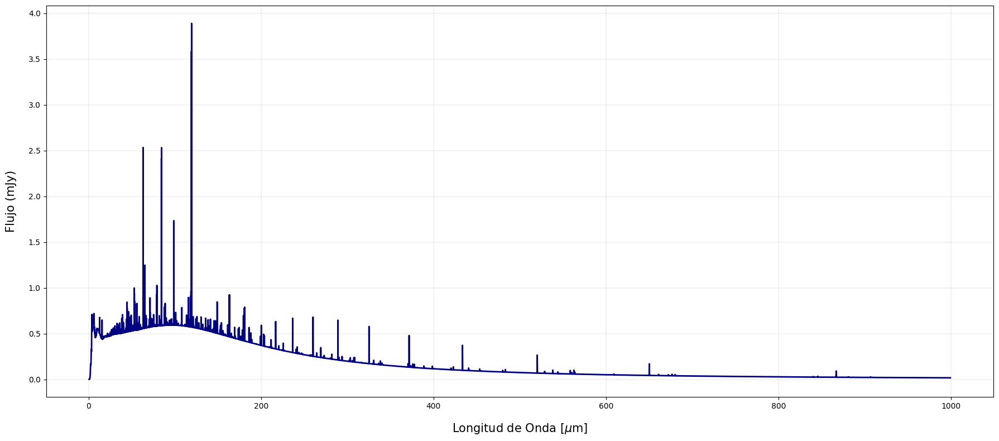

In [71]:
#PDS 70
# Generación del espectro sin el continuo para verificar
Range = [0.6, 1000]
wave, flux_lines_only = models[1].gen_specFromLineEstimates(Range, unit="Jy")

# Crear una figura grande y estirada para presentación de póster
plt.figure(figsize=(18, 8))  # Ajustar tamaño grande para presentación

# Graficar el espectro con una línea más gruesa
plt.plot(wave, flux_lines_only*1e3, color='navy', linewidth=2, label="Espectro con continuo")

# Configuraciones adicionales para la presentación
plt.xlabel("Longitud de Onda [$\\mu$m]", fontsize=15, labelpad=15)  # Aumentar tamaño y grosor de fuente
plt.ylabel("Flujo (mJy)", fontsize=15, labelpad=15)
#plt.title("Espectro sin Continuo en el Rango de 0.6 a 28 $\mu$m", fontsize=28, fontweight='bold', pad=20)  # Título destacado

# Aumentar el tamaño de las marcas (ticks) de los ejes
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Agregar cuadrícula con líneas suaves
plt.grid(True, which='both', linestyle='--', linewidth=0.1, color='black')

# Establecer el rango de la gráfica en el eje X (longitud de onda)
#plt.xlim(4, 28)
# Hacer la escala Y logarítmica si es necesario
# plt.yscale('log')

# Agregar fondo gris claro para mejorar la visualización
#plt.gca().set_facecolor('whitesmoke')

# Mostrar la leyenda
#plt.legend(fontsize=20, loc='upper right')

# Mostrar la gráfica
plt.tight_layout()  # Ajustar el layout para que todo quede bien distribuido
plt.savefig('espectro_PDS70_poster.jpg', format='jpg', dpi=300)
plt.show()

INFO: gen_specFromLineEstimates: build spectrum for 19853 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  96.05 s


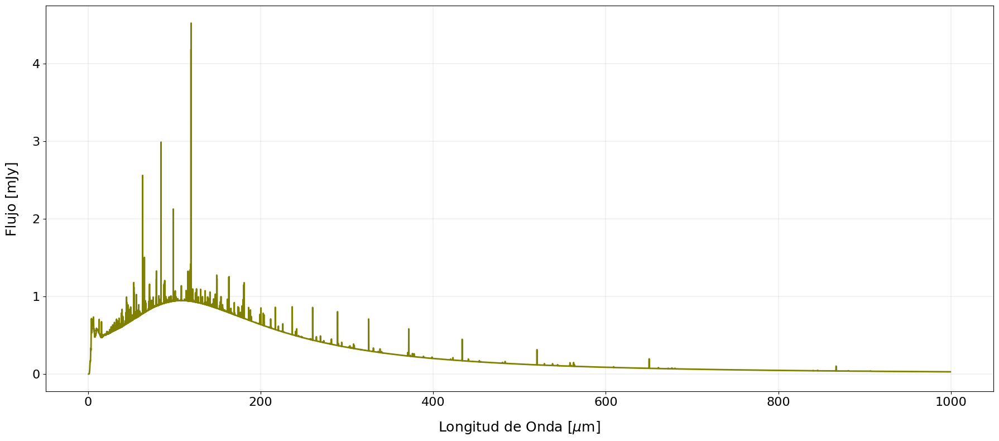

In [72]:
#PDS 70 c. Min Mass
# Generación del espectro sin el continuo para verificar
Range = [0.6, 1000]
wave, flux_lines_only = models[0].gen_specFromLineEstimates(Range, unit="Jy")

# Crear una figura grande y estirada para presentación de póster
plt.figure(figsize=(18, 8))  # Ajustar tamaño grande para presentación

# Graficar el espectro con una línea más gruesa
plt.plot(wave, flux_lines_only*1e3, color='olive', linewidth=2, label="Espectro con continuo")

# Configuraciones adicionales para la presentación
plt.xlabel("Longitud de Onda [$\\mu$m]", fontsize=18, labelpad=15)  # Aumentar tamaño y grosor de fuente
plt.ylabel("Flujo [mJy]", fontsize=18, labelpad=17)
#plt.title("Espectro sin Continuo en el Rango de 0.6 a 28 $\mu$m", fontsize=28, fontweight='bold', pad=20)  # Título destacado

# Aumentar el tamaño de las marcas (ticks) de los ejes
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Agregar cuadrícula con líneas suaves
plt.grid(True, which='both', linestyle='--', linewidth=0.1, color='black')

# Establecer el rango de la gráfica en el eje X (longitud de onda)
#plt.xlim(4, 28)
# Hacer la escala Y logarítmica si es necesario
# plt.yscale('log')

# Agregar fondo gris claro para mejorar la visualización
#plt.gca().set_facecolor('whitesmoke')

# Mostrar la leyenda
#plt.legend(fontsize=20, loc='upper right')

# Mostrar la gráfica
plt.tight_layout()  # Ajustar el layout para que todo quede bien distribuido
plt.savefig('espectro_PDS70c_contínuo_MinMass.jpg', format='jpg', dpi=300)
plt.show()

INFO: gen_specFromLineEstimates: build spectrum for 19853 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  98.29 s


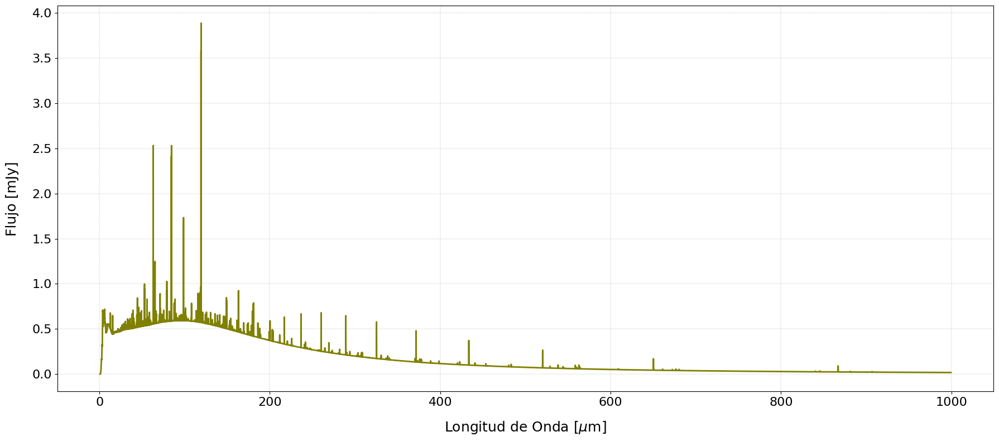

In [170]:
#PDS 70 c Max Mass
# Generación del espectro sin el continuo para verificar
Range = [0.6, 1000]
wave, flux_lines_only = models[1].gen_specFromLineEstimates(Range, unit="Jy")

# Crear una figura grande y estirada para presentación de póster
plt.figure(figsize=(18, 8))  # Ajustar tamaño grande para presentación

# Graficar el espectro con una línea más gruesa
plt.plot(wave, flux_lines_only*1e3, color='olive', linewidth=2, label="Espectro con continuo")

# Configuraciones adicionales para la presentación
plt.xlabel("Longitud de Onda [$\\mu$m]", fontsize=18, labelpad=15)  # Aumentar tamaño y grosor de fuente
plt.ylabel("Flujo [mJy]", fontsize=18, labelpad=17)
#plt.title("Espectro sin Continuo en el Rango de 0.6 a 28 $\mu$m", fontsize=28, fontweight='bold', pad=20)  # Título destacado

# Aumentar el tamaño de las marcas (ticks) de los ejes
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Agregar cuadrícula con líneas suaves
plt.grid(True, which='both', linestyle='--', linewidth=0.1, color='black')

# Establecer el rango de la gráfica en el eje X (longitud de onda)
#plt.xlim(4, 28)
# Hacer la escala Y logarítmica si es necesario
# plt.yscale('log')

# Agregar fondo gris claro para mejorar la visualización
#plt.gca().set_facecolor('whitesmoke')

# Mostrar la leyenda
#plt.legend(fontsize=20, loc='upper right')

# Mostrar la gráfica
plt.tight_layout()  # Ajustar el layout para que todo quede bien distribuido
plt.savefig('espectro_PDS70c_contínuo_MaxMass.jpg', format='jpg', dpi=300)
plt.show()

INFO: gen_specFromLineEstimates: build spectrum for 27 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.94 s


/tmp/ipykernel_6783/1421155624.py:17: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


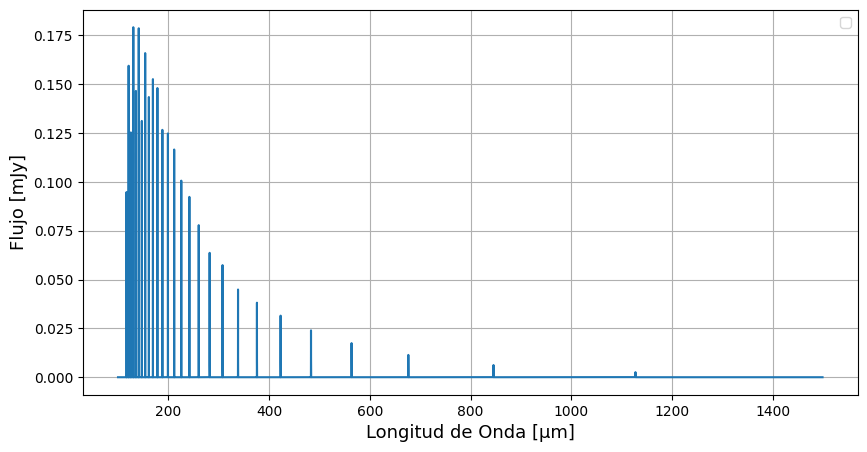

INFO: gen_specFromLineEstimates: build spectrum for 27 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  3.39 s


/tmp/ipykernel_6783/1421155624.py:17: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


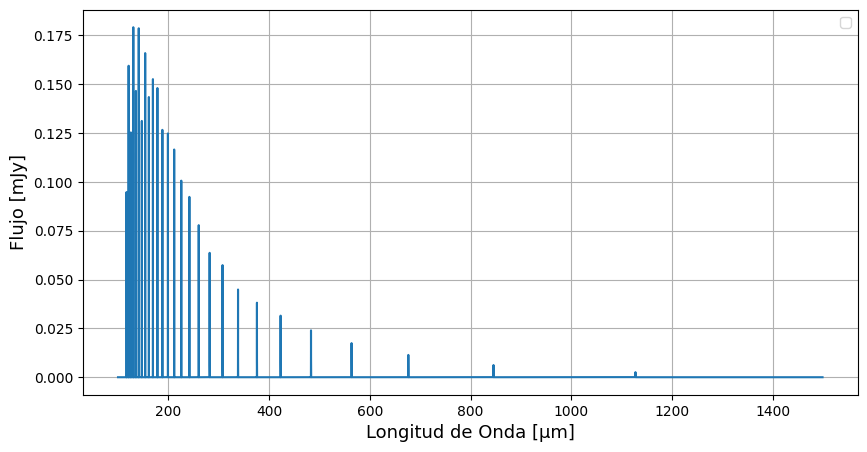

INFO: gen_specFromLineEstimates: build spectrum for 27 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  2.96 s


/tmp/ipykernel_6783/1421155624.py:17: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


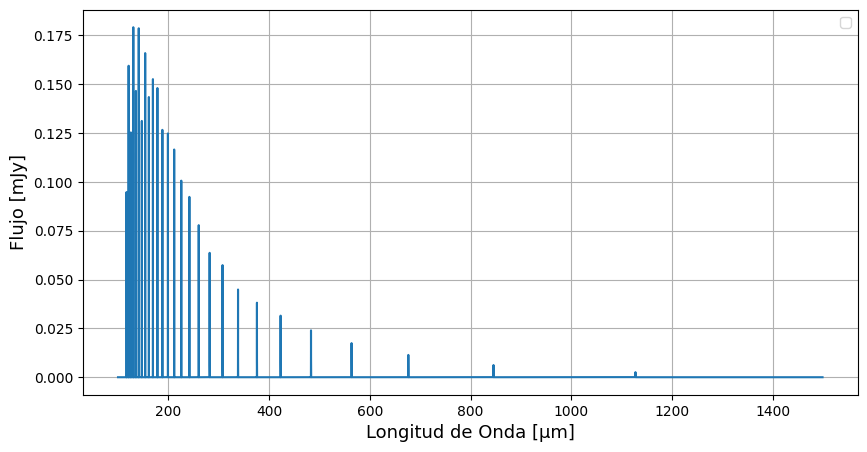

In [171]:
# Iterar sobre los modelos y sus etiquetas para generar los espectros por especies químicas
#C+, O, C, Mg+, Fe+, Si+, S+, o-H2, p-H2, CO, o-H2O, p-H2O, 13CO, OH, S, CH+, N+, OH-hfs, Ne+, SO, SO2, o-H3O+, p-H3O+, o-NH3, p-NH3, Ar+, 
# Ar++, O++, O+, S++, Ne++, N++, C18O, OH+, O2, C170, CH, Si, o-CH2, p-CH2, CO2+, HCN
i = 0
for lab in labels:
    # Obtener la longitud de onda y el flujo para la molécula 'C170'
    wave, flux = models[0].gen_specFromLineEstimates(wlrange=[100,1500], ident='HCN', unit="Jy", noCont=True)
    
    # Crear la gráfica del espectro sintético
    plt.figure(figsize=(10, 5))
    plt.plot(wave, flux*1e3)
    plt.xlabel('Longitud de Onda [μm]', fontsize=13)
    plt.ylabel('Flujo [mJy]', fontsize=13)
    #plt.xscale('log')
    #plt.yscale('log')
    #plt.title('Espectro Sintético para o-H2O\n%s' % lab)
    plt.legend()
    plt.grid(True)
    plt.savefig('espectro_sin_continuoPDS70c_o-H2O.jpg', format='jpg', dpi=300)
    # Mostrar la gráfica
    plt.show()
    
    i += 1

In [20]:
# Lista de compuestos químicos a analizar
chemical_species = [
    'o-H2O', 'p-H2O', 'o-H2', 'p-H2', 'CO', 'CO#', 'O2', 'N2', 
    'N', 'CH3', 'SiO', 'SiO#', 'HCN', 'HCN#', 'CH4', 'CH4#', 
    'CO2', 'CO2#', 'SO2']

# Colores para cada compuesto
colors = [
    'blue', 'lightblue', 'navy', 'cyan', 'green', 'darkgreen', 'orange', 'darkorange',
    'purple', 'orchid', 'brown', 'chocolate', 'red', 'crimson', 'yellow', 'gold',
    'teal', 'turquoise', 'magenta'
]

# Asegurar que hay suficientes colores para todas las especies
if len(colors) < len(chemical_species):
    raise ValueError("Debe haber al menos un color por cada compuesto químico en la lista.")

# Rango de longitud de onda
wlrange = [0.6, 1000]  # En micrómetros

# Iterar sobre las especies químicas y crear gráficas
for idx, species in enumerate(chemical_species):
    try:
        # Generar espectro sintético
        wave, flux = models[0].gen_specFromLineEstimates(wlrange=wlrange, ident=species, unit="Jy", noCont=True)

        # Crear la gráfica
        plt.figure(figsize=(10, 5))
        plt.plot(wave, flux * 1e3, label=f'{species}', color=colors[idx])  # Convertir flujo a mJy y aplicar color
        plt.xlabel('Longitud de Onda [μm]', fontsize=13)
        plt.ylabel('Flujo [mJy]', fontsize=13)
        plt.title(f'Espectro Sintético para {species}', fontsize=15)
        plt.legend(fontsize=10)
        plt.grid(True)
        
        # Guardar la gráfica con el nombre correspondiente
        filename = f'espectro_sintetico_maxmass{species}.jpg'
        plt.savefig(filename, format='jpg', dpi=300)
        plt.close()  # Cerrar la figura para liberar memoria

    except Exception as e:
        # Manejo de errores si no se puede generar el espectro para una especie
        print(f"No se pudo generar el espectro para {species}: {e}")

INFO: gen_specFromLineEstimates: build spectrum for 7559 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  40.31 s
INFO: gen_specFromLineEstimates: build spectrum for 7302 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  38.22 s
INFO: gen_specFromLineEstimates: build spectrum for 693 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  10.65 s
INFO: gen_specFromLineEstimates: build spectrum for 644 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  10.54 s
INFO: gen_specFromLineEstimates: build spectrum for 239 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  8.87 s
ERROR: Could not find and line estimates ...
INFO: gen_specFromLineEstimates: build spectrum for 0 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  7.45 s
INFO: gen_specFromLineEstimates: build spectrum for 45 lines ...
INFO: gen_specFromLineEstimates: convolv

In [26]:
#MaxMass líneas
# Lista de compuestos químicos a analizar
chemical_species = [
    'o-H2O', 'p-H2O', 'o-H2', 'p-H2', 'CO', 'CO#', 'O2', 'N2', 
    'N', 'CH3', 'SiO', 'SiO#', 'HCN', 'HCN#', 'CH4', 'CH4#', 
    'CO2', 'CO2#', 'SO2'
]

# Colores para cada compuesto
colors = [
    'blue', 'lightblue', 'navy', 'cyan', 'green', 'darkgreen', 'orange', 'darkorange',
    'purple', 'orchid', 'brown', 'chocolate', 'red', 'crimson', 'yellow', 'gold',
    'teal', 'turquoise', 'magenta'
]

# Asegurar que hay suficientes colores para todas las especies
if len(colors) < len(chemical_species):
    raise ValueError("Debe haber al menos un color por cada compuesto químico en la lista.")

# Rango de longitud de onda
wlrange = [0.6, 1500]  # En micrómetros

# Iterar sobre las especies químicas y crear gráficas
for idx, species in enumerate(chemical_species):
    try:
        # Generar espectro sintético
        wave, flux = models[0].gen_specFromLineEstimates(wlrange=wlrange, ident=species, unit="Jy", noCont=True)

        # Crear la gráfica
        plt.figure(figsize=(10, 5))
        plt.plot(wave, flux * 1e3, label=f'{species}', color=colors[idx])  # Convertir flujo a mJy y aplicar color

        # Obtener líneas espectrales
        line_fluxes = models[0].selectLines(species)

        # Construir una lista para la leyenda
        if line_fluxes:
            line_labels = [f'{line.wl:.2f} μm' for line in line_fluxes]
            line_legend = ', '.join(line_labels)
            plt.plot([], [], ' ', label=f'Líneas: {line_legend}')  # Agregar las líneas a la leyenda

        # Etiquetas y configuración
        plt.xlabel('Longitud de Onda [μm]', fontsize=13)
        plt.ylabel('Flujo [mJy]', fontsize=13)
        plt.title(f'Espectro Sintético para {species}', fontsize=15)
        plt.legend(fontsize=10)
        plt.grid(True)

        # Guardar la gráfica con el nombre correspondiente
        filename = f'espectro_sintetico_maxmass_{species}_lines_legend.jpg'
        plt.savefig(filename, format='jpg', dpi=300)
        plt.close()  # Cerrar la figura para liberar memoria

    except Exception as e:
        # Manejo de errores si no se puede generar el espectro para una especie
        print(f"No se pudo generar el espectro para {species}: {e}")

INFO: gen_specFromLineEstimates: build spectrum for 7574 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  42.59 s
INFO: gen_specFromLineEstimates: build spectrum for 7312 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  42.74 s
INFO: gen_specFromLineEstimates: build spectrum for 693 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  11.10 s
INFO: gen_specFromLineEstimates: build spectrum for 644 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  11.16 s
INFO: gen_specFromLineEstimates: build spectrum for 241 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  9.29 s
ERROR: Could not find and line estimates ...
INFO: gen_specFromLineEstimates: build spectrum for 0 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  9.36 s
INFO: gen_specFromLineEstimates: build spectrum for 45 lines ...
INFO: gen_specFromLineEstimates: convolv

In [28]:
#MinMass líneas
# Lista de compuestos químicos a analizar
chemical_species = [
    'o-H2O', 'p-H2O', 'o-H2', 'p-H2', 'CO', 'CO#', 'O2', 'N2', 
    'N', 'CH3', 'SiO', 'SiO#', 'HCN', 'HCN#', 'CH4', 'CH4#', 
    'CO2', 'CO2#', 'SO2'
]

# Colores para cada compuesto
colors = [
    'blue', 'lightblue', 'navy', 'cyan', 'green', 'darkgreen', 'orange', 'darkorange',
    'purple', 'orchid', 'brown', 'chocolate', 'red', 'crimson', 'yellow', 'gold',
    'teal', 'turquoise', 'magenta'
]

# Asegurar que hay suficientes colores para todas las especies
if len(colors) < len(chemical_species):
    raise ValueError("Debe haber al menos un color por cada compuesto químico en la lista.")

# Rango de longitud de onda
wlrange = [0.6, 1500]  # En micrómetros

# Iterar sobre las especies químicas y crear gráficas
for idx, species in enumerate(chemical_species):
    try:
        # Generar espectro sintético
        wave, flux = models[1].gen_specFromLineEstimates(wlrange=wlrange, ident=species, unit="Jy", noCont=True)

        # Crear la gráfica
        plt.figure(figsize=(10, 5))
        plt.plot(wave, flux * 1e3, label=f'{species}', color=colors[idx])  # Convertir flujo a mJy y aplicar color

        # Obtener líneas espectrales
        line_fluxes = models[1].selectLines(species)

        # Construir una lista para la leyenda
        if line_fluxes:
            line_labels = [f'{line.wl:.2f} μm' for line in line_fluxes]
            line_legend = ', '.join(line_labels)
            plt.plot([], [], ' ', label=f'Líneas: {line_legend}')  # Agregar las líneas a la leyenda

        # Etiquetas y configuración
        plt.xlabel('Longitud de Onda [μm]', fontsize=13)
        plt.ylabel('Flujo [mJy]', fontsize=13)
        plt.title(f'Espectro Sintético para {species}', fontsize=15)
        plt.legend(fontsize=10)
        plt.grid(True)

        # Guardar la gráfica con el nombre correspondiente
        filename = f'espectro_sintetico_minmass_{species}_lines_legend.jpg'
        plt.savefig(filename, format='jpg', dpi=300)
        plt.close()  # Cerrar la figura para liberar memoria

    except Exception as e:
        # Manejo de errores si no se puede generar el espectro para una especie
        print(f"No se pudo generar el espectro para {species}: {e}")

INFO: gen_specFromLineEstimates: build spectrum for 7574 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  48.11 s
INFO: gen_specFromLineEstimates: build spectrum for 7312 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  45.01 s
INFO: gen_specFromLineEstimates: build spectrum for 693 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  12.29 s
INFO: gen_specFromLineEstimates: build spectrum for 644 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  11.71 s
INFO: gen_specFromLineEstimates: build spectrum for 241 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  9.45 s
ERROR: Could not find and line estimates ...
INFO: gen_specFromLineEstimates: build spectrum for 0 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  8.52 s
INFO: gen_specFromLineEstimates: build spectrum for 45 lines ...
INFO: gen_specFromLineEstimates: convolv

In [25]:
#Encuentra líneas para HCN y cualquier especie química
# Selecciona el modelo
model = models[0]

# Identificador de la especie química
ident = 'o-H2O'

# Obtener todos los flujos de línea para el identificador dado
line_fluxes = model.selectLines(ident)

# Verificar y mostrar la información de las líneas
if line_fluxes:
    print(f"Se encontraron {len(line_fluxes)} líneas para {ident}:")
    for line in line_fluxes:
        print(f"Línea: {line.wl} micrones, Flujo: {line.flux} W/m^2")
else:
    print(f"No se encontraron líneas para {ident}.")

Se encontraron 4 líneas para o-H2O:
Línea: 538.29167743 micrones, Flujo: 4.587960336856129e-23 W/m^2
Línea: 179.53570707 micrones, Flujo: 1.4107700374977306e-21 W/m^2
Línea: 63.327580701 micrones, Flujo: 1.451772907281577e-21 W/m^2
Línea: 78.746226101 micrones, Flujo: 1.2471390135250635e-21 W/m^2


PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


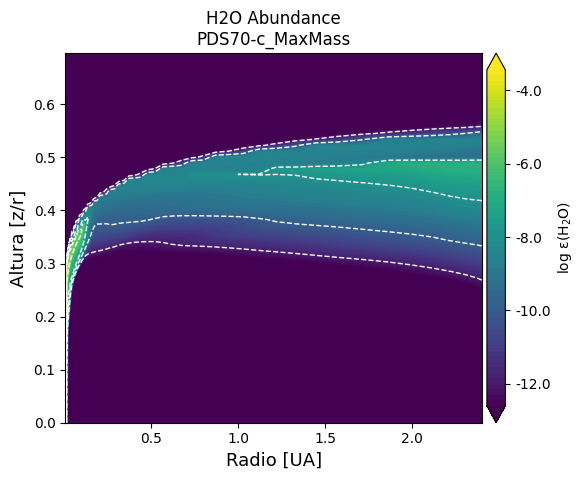

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


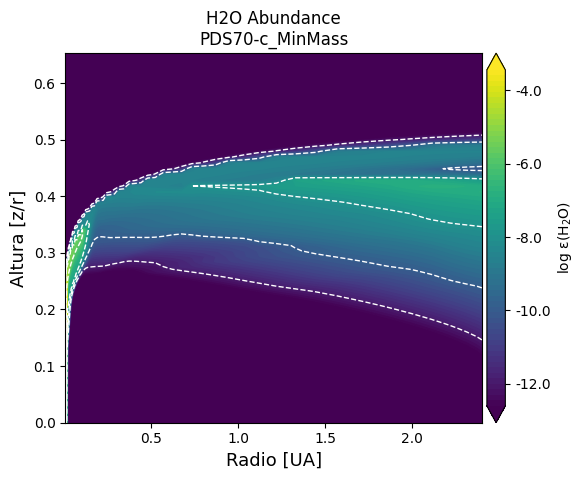

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


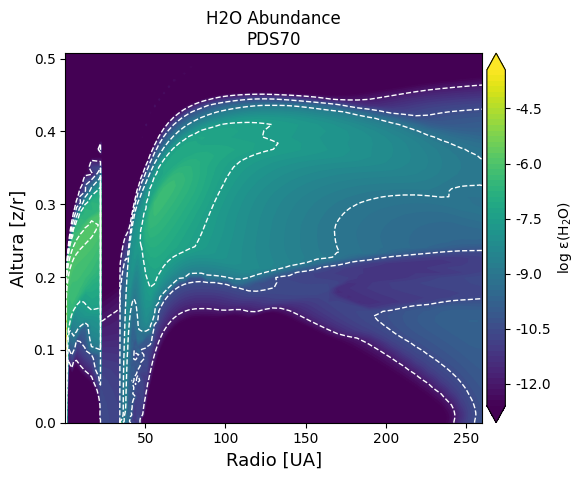

In [29]:
from prodimopy.plot import Contour  # Asegúrate de importar la clase Contour

i = 0
for lab in labels:
    species_name = 'H2O'
    pp = pplot.Plot(None)


    # Graficar abundancia con contornos adicionales
    pp.plot_abuncont(
        models[i], 
        species=species_name, 
        rel2H=True, 
        zlog=True, 
        zr=True, 
        title=f'{species_name} Abundance\n{lab}', 
        xlog=False, 
    )
    
    # Configuración de etiquetas de los ejes
    plt.xlabel(rlabel, fontsize=label_fontsize)
    plt.ylabel(rylabel, fontsize=label_fontsize)
    
    # Guardar la gráfica
    plt.savefig(f"Abu_H2O{lab}.pdf", format="pdf", dpi=300)
    plt.show()
    i += 1

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


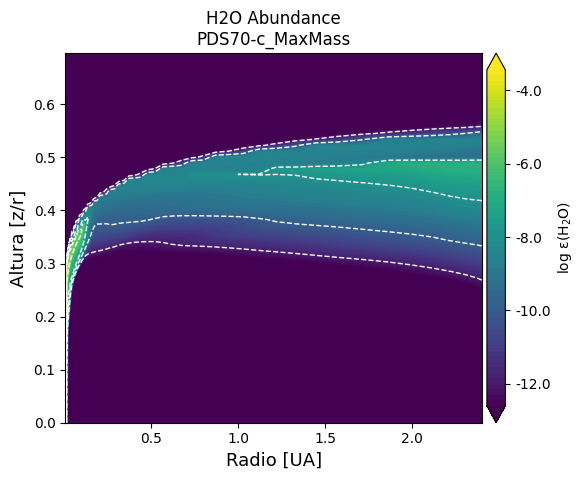

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


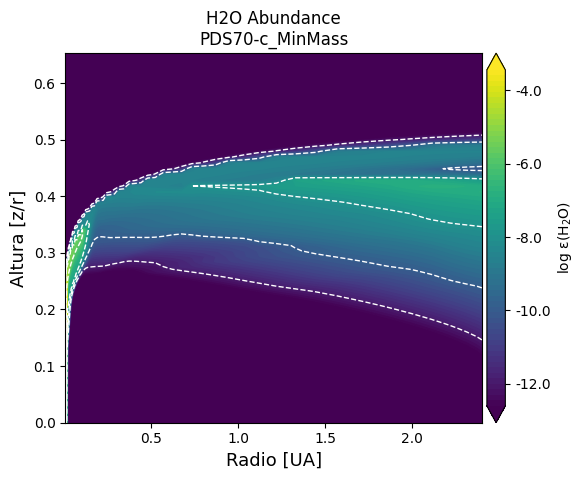

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


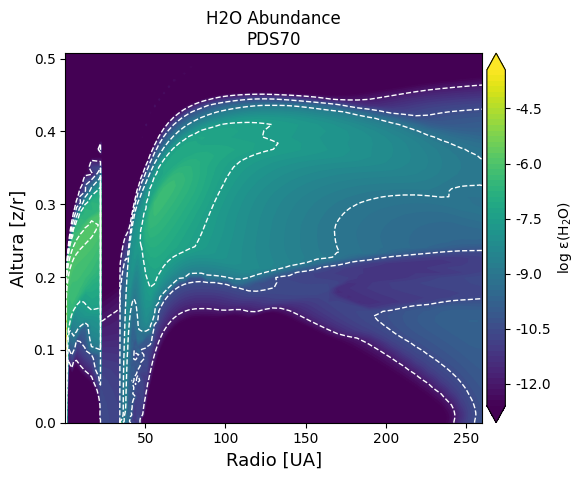

In [33]:
i = 0
for lab in labels:
    species_name = 'H2O'
    pp = pplot.Plot(None)
    
    # Uso de f-string para incorporar el nombre de la especie en el título
    pp.plot_abuncont(models[i], species=species_name, rel2H=True, zlog=True, zr=True, title=f'{species_name} Abundance\n{lab}', xlog=False)
    
    # Mostrar la gráfica
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Abu_H2O_%s.pdf"%lab)
    plt.show()
    i += 1

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


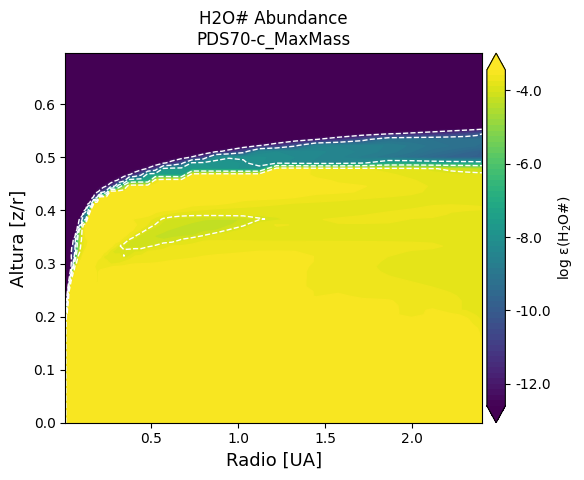

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


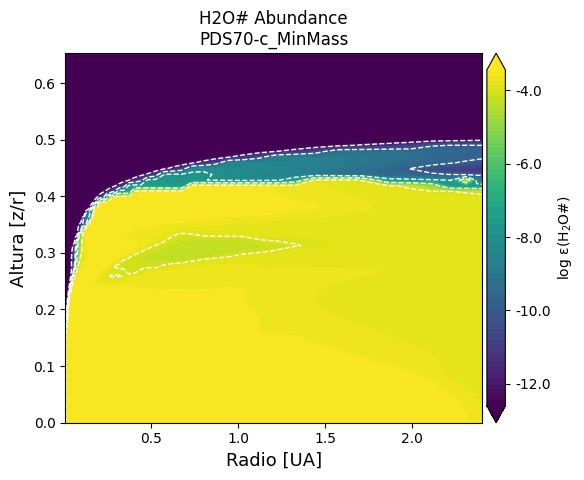

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


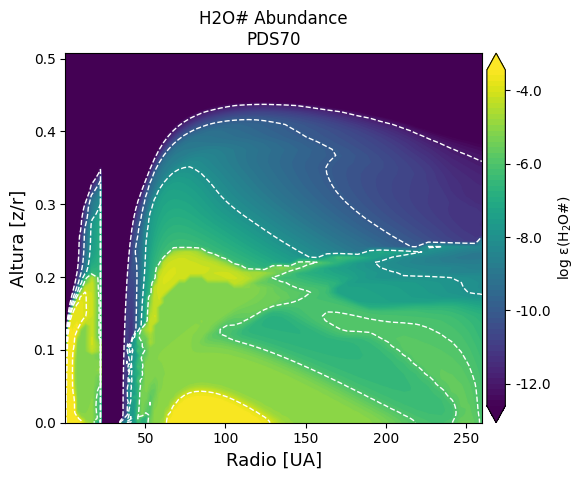

In [11]:
i = 0
for lab in labels:
    species_name = 'H2O#'
    pp = pplot.Plot(None)
    
    # Uso de f-string para incorporar el nombre de la especie en el título
    pp.plot_abuncont(models[i], species=species_name, rel2H=True, zlog=True, zr=True, title=f'{species_name} Abundance\n{lab}', xlog=False)
    
    # Mostrar la gráfica
    
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Abu_H2O#_%s.pdf"%lab)
    plt.show()
    i += 1

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


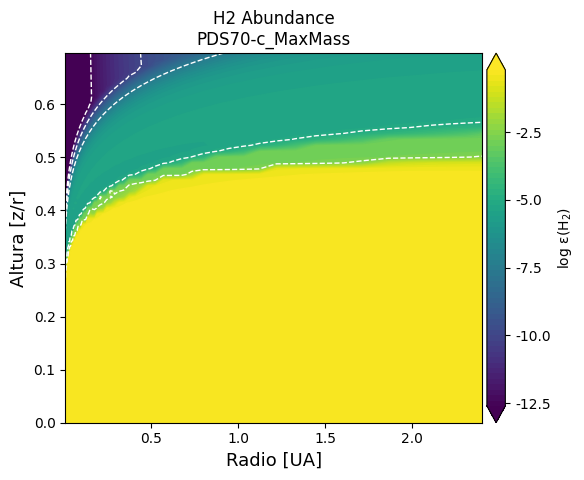

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


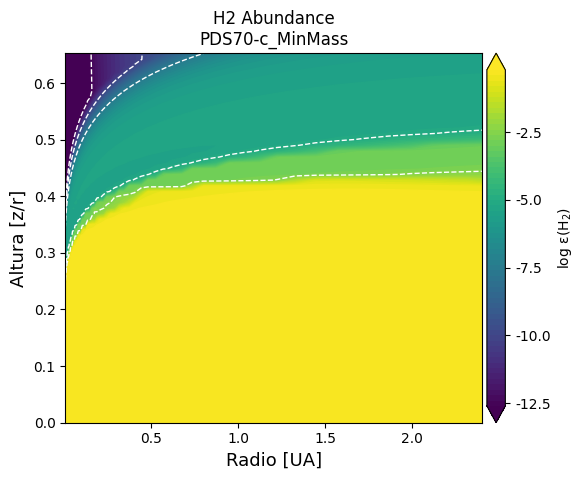

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


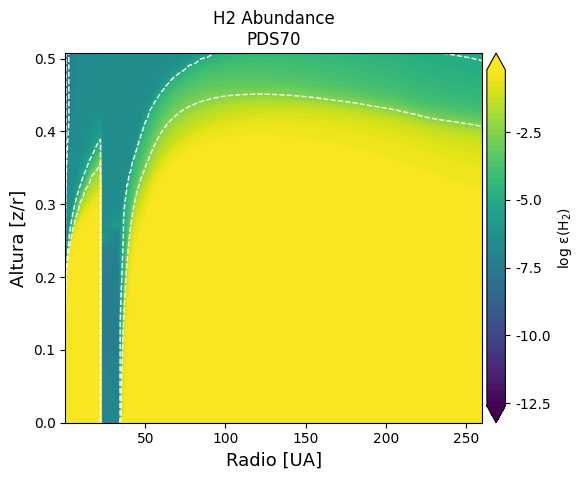

In [36]:
i = 0
for lab in labels:
    species_name = 'H2'
    pp = pplot.Plot(None)
    
    # Uso de f-string para incorporar el nombre de la especie en el título
    pp.plot_abuncont(models[i], species=species_name, rel2H=True, zlog=True, zr=True, title=f'{species_name} Abundance\n{lab}', xlog=False)
    
    # Mostrar la gráfica
    
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Abu_H2_%s.pdf"%lab)
    plt.show()
    i += 1

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


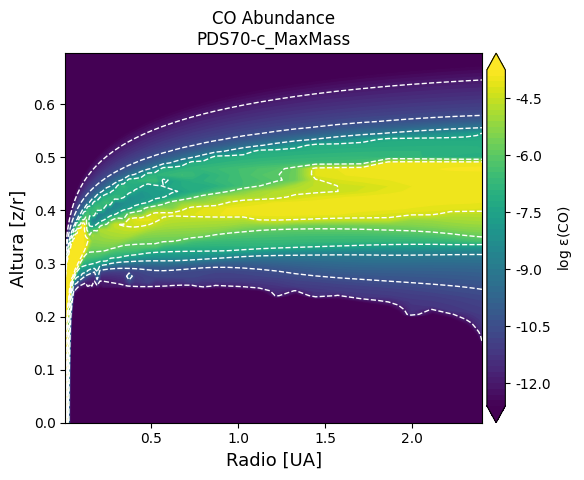

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


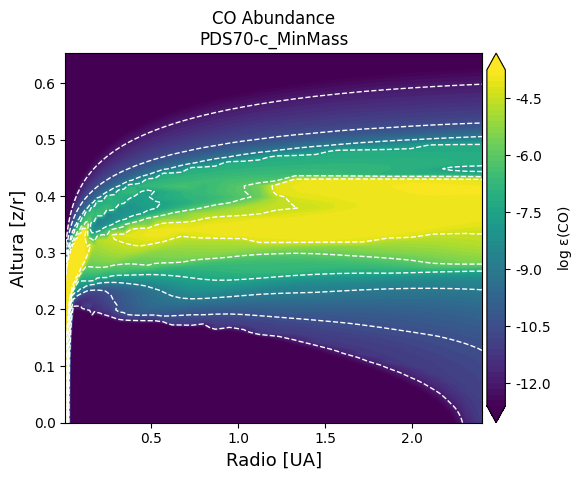

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


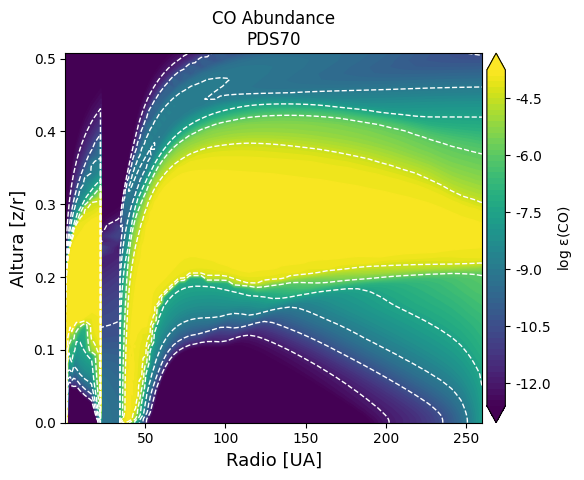

In [37]:
i = 0
for lab in labels:
    species_name = 'CO'
    pp = pplot.Plot(None)
    
    # Uso de f-string para incorporar el nombre de la especie en el título
    pp.plot_abuncont(models[i], species=species_name, rel2H=True, zlog=True, zr=True, title=f'{species_name} Abundance\n{lab}', xlog=False)
    
    # Mostrar la gráfica
    
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Abu_CO_%s.pdf"%lab)
    plt.show()
    i += 1

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


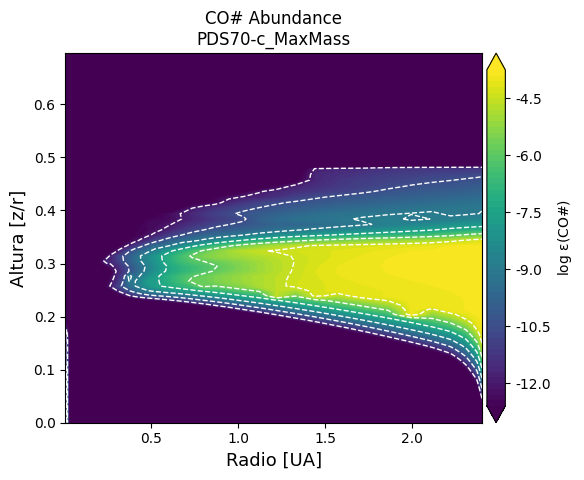

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


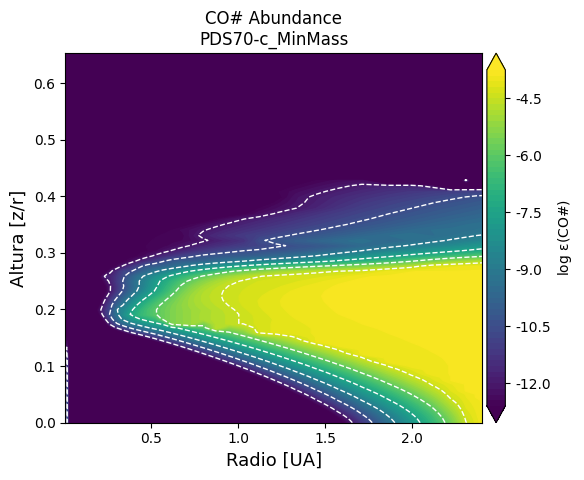

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


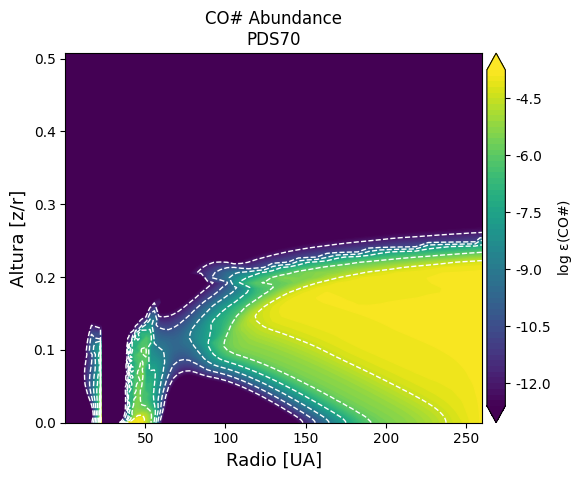

In [38]:
i = 0
for lab in labels:
    species_name = 'CO#'
    pp = pplot.Plot(None)
    
    # Uso de f-string para incorporar el nombre de la especie en el título
    pp.plot_abuncont(models[i], species=species_name, rel2H=True, zlog=True, zr=True, title=f'{species_name} Abundance\n{lab}', xlog=False)
    
    # Mostrar la gráfica
    
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Abu_CO#_%s.pdf"%lab)
    plt.show()
    i += 1

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


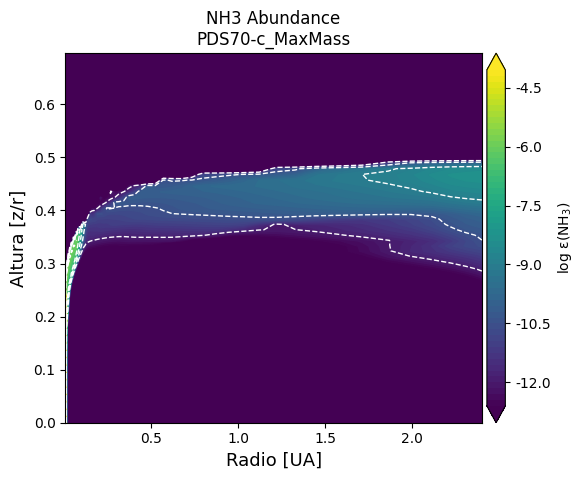

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


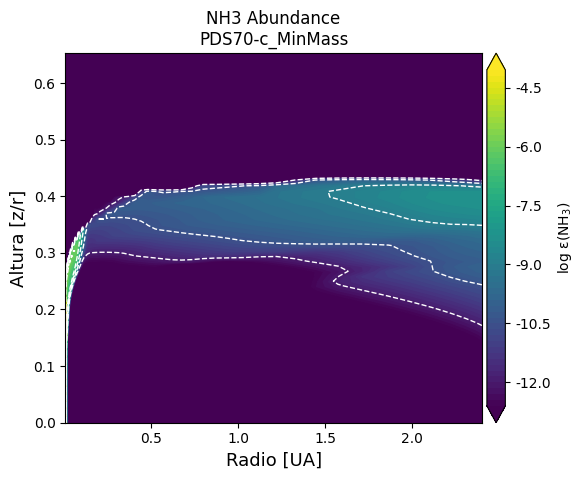

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


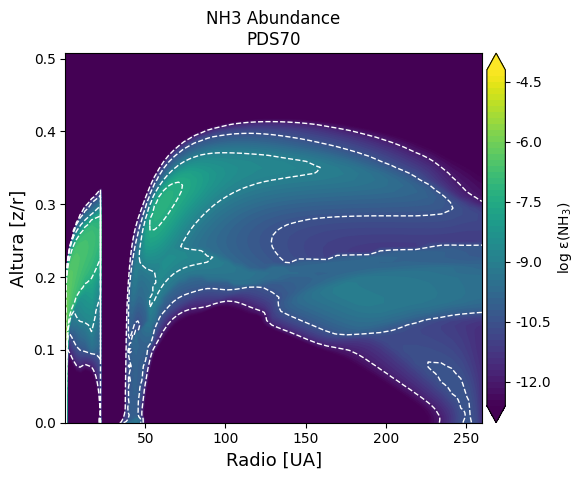

In [39]:
i = 0
for lab in labels:
    species_name = 'NH3'
    pp = pplot.Plot(None)
    
    # Uso de f-string para incorporar el nombre de la especie en el título
    pp.plot_abuncont(models[i], species=species_name, rel2H=True, zlog=True, zr=True, title=f'{species_name} Abundance\n{lab}', xlog=False)
    
    # Mostrar la gráfica
    plt.savefig("Abu_NH3_%s.pdf"%lab)
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize) 
    plt.show()
    i += 1

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


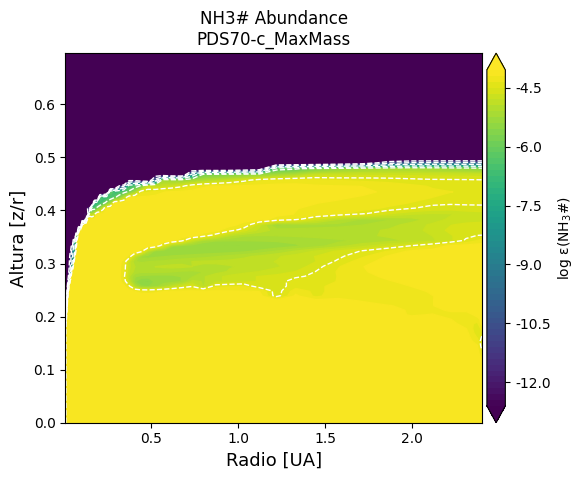

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


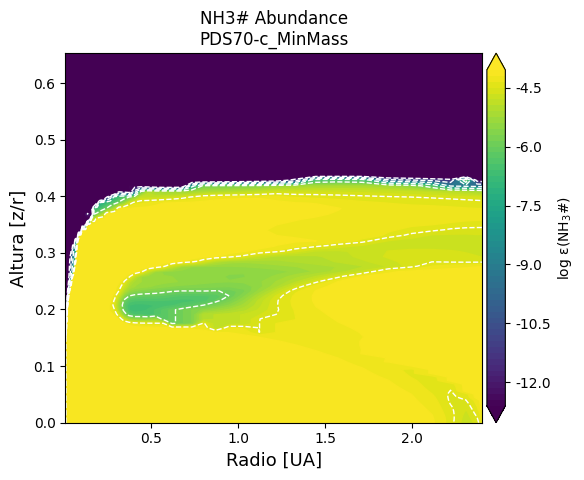

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


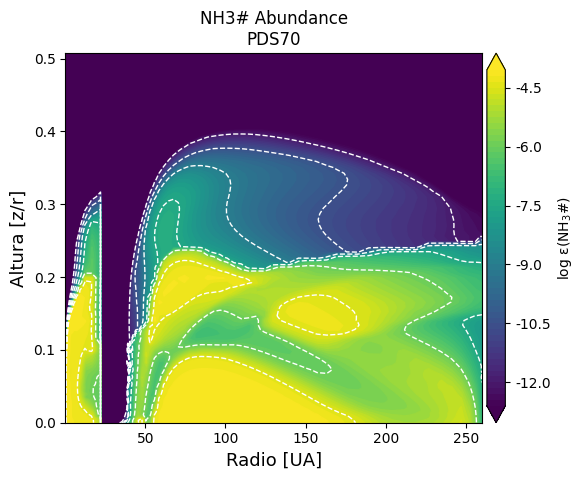

In [40]:
i = 0
for lab in labels:
    species_name = 'NH3#'
    pp = pplot.Plot(None)
    
    # Uso de f-string para incorporar el nombre de la especie en el título
    pp.plot_abuncont(models[i], species=species_name, rel2H=True, zlog=True, zr=True, title=f'{species_name} Abundance\n{lab}', xlog=False)
    
    # Mostrar la gráfica
    plt.savefig("Abu_NH3#_%s.pdf"%lab)
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize) 
    plt.show()
    i += 1

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


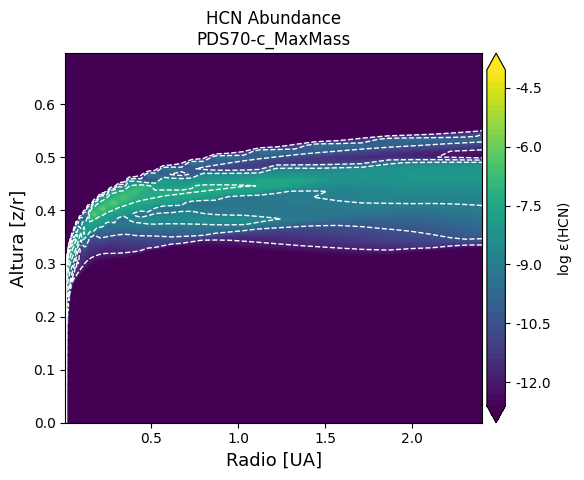

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


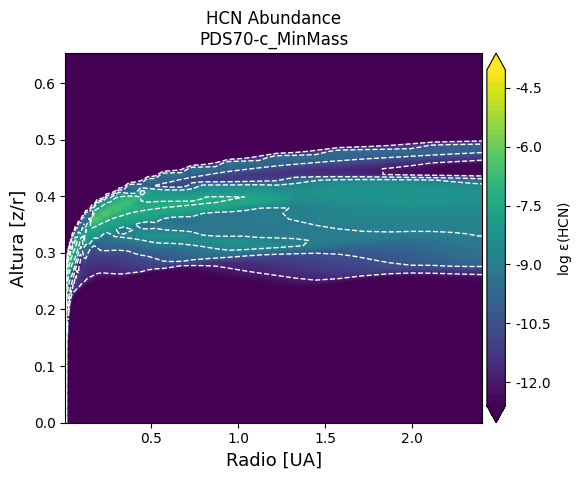

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


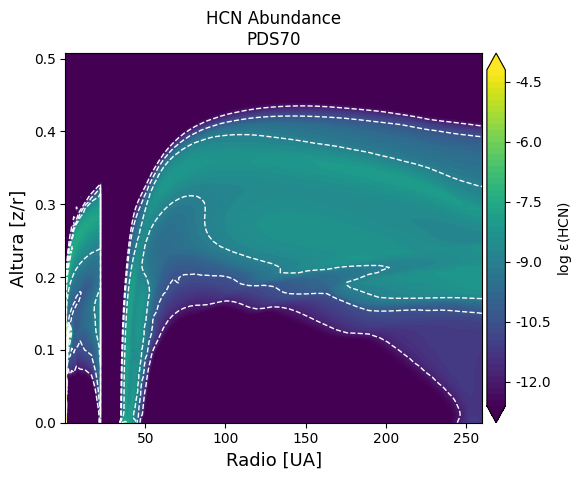

In [42]:
i = 0
for lab in labels:
    species_name = 'HCN'
    pp = pplot.Plot(None)
    
    # Uso de f-string para incorporar el nombre de la especie en el título
    pp.plot_abuncont(models[i], species=species_name, rel2H=True, zlog=True, zr=True, title=f'{species_name} Abundance\n{lab}', xlog=False)
    
    # Mostrar la gráfica
    
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Abu_HCN_%s.pdf"%lab)
    plt.show()
    i += 1

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


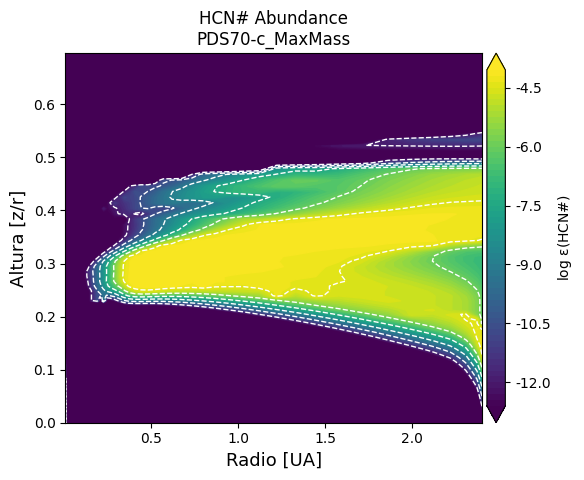

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


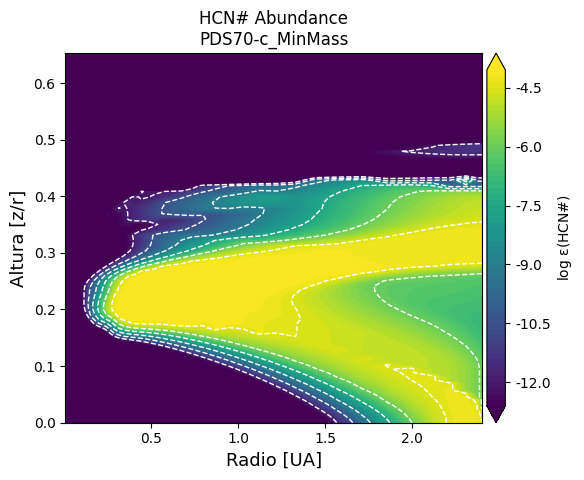

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


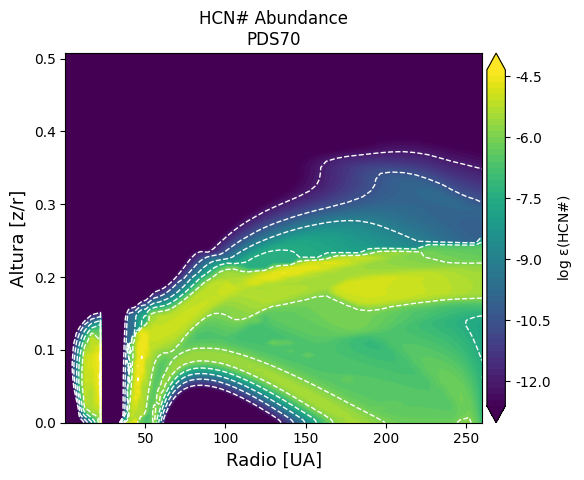

In [43]:
i = 0
for lab in labels:
    species_name = 'HCN#'
    pp = pplot.Plot(None)
    
    # Uso de f-string para incorporar el nombre de la especie en el título
    pp.plot_abuncont(models[i], species=species_name, rel2H=True, zlog=True, zr=True, title=f'{species_name} Abundance\n{lab}', xlog=False)
    
    # Mostrar la gráfica
    
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Abu_HCN#_%s.pdf"%lab)
    plt.show()
    i += 1

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


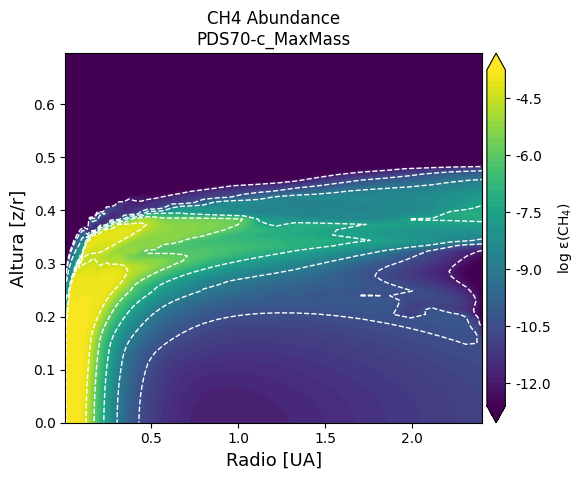

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


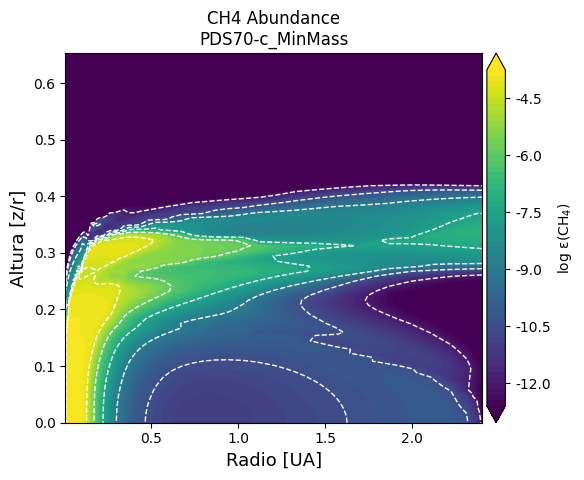

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


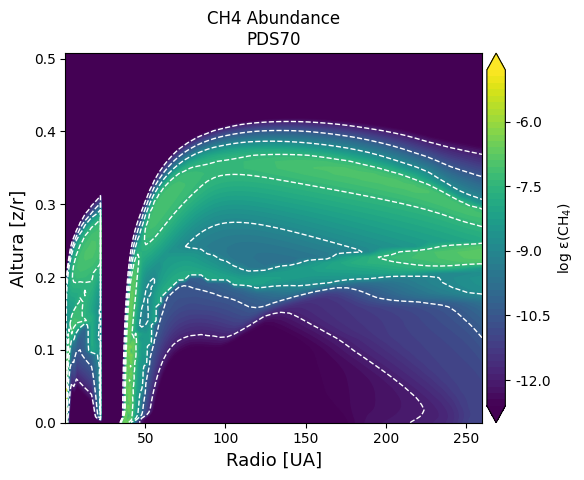

In [44]:
i = 0
for lab in labels:
    species_name = 'CH4'
    pp = pplot.Plot(None)
    
    # Uso de f-string para incorporar el nombre de la especie en el título
    pp.plot_abuncont(models[i], species=species_name, rel2H=True, zlog=True, zr=True, title=f'{species_name} Abundance\n{lab}', xlog=False)
    
    # Mostrar la gráfica
    
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Abu_CH4_%s.pdf"%lab)
    plt.show()
    i += 1

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


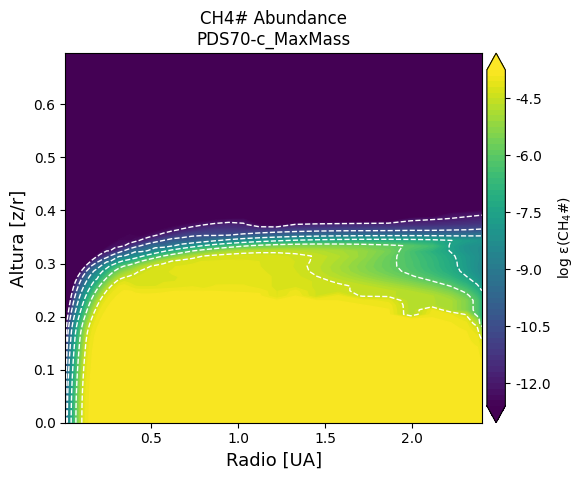

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


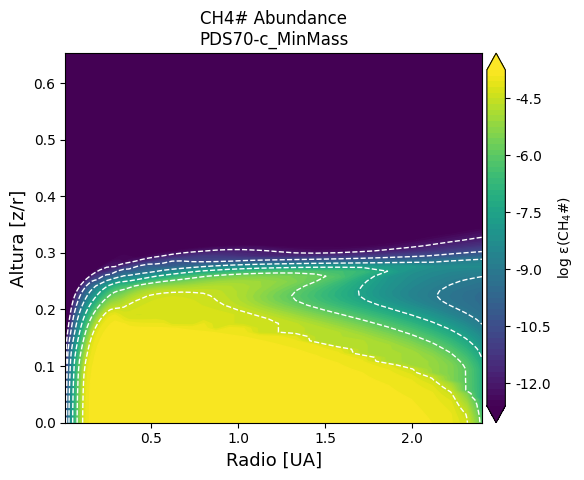

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


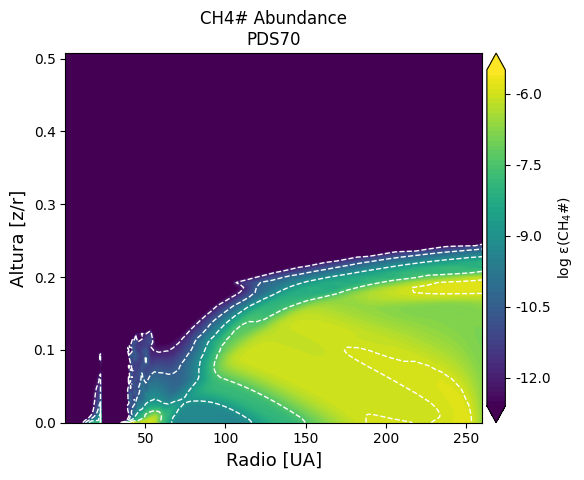

In [45]:
i = 0
for lab in labels:
    species_name = 'CH4#'
    pp = pplot.Plot(None)
    
    # Uso de f-string para incorporar el nombre de la especie en el título
    pp.plot_abuncont(models[i], species=species_name, rel2H=True, zlog=True, zr=True, title=f'{species_name} Abundance\n{lab}', xlog=False)
    
    # Mostrar la gráfica
    
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Abu_CH4#_%s.pdf"%lab)
    plt.show()
    i += 1

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


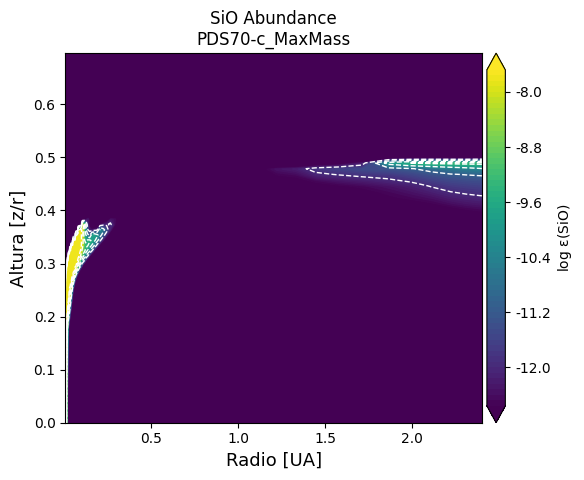

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


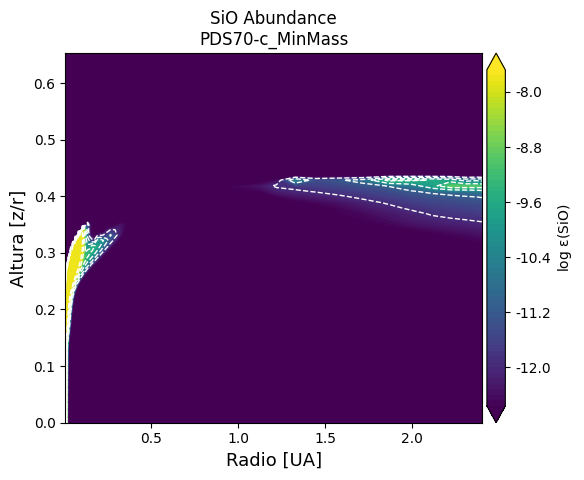

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


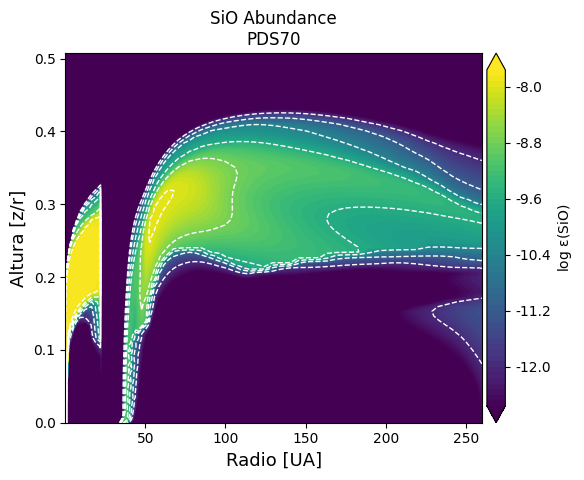

In [46]:
i = 0
for lab in labels:
    species_name = 'SiO'
    pp = pplot.Plot(None)
    
    # Uso de f-string para incorporar el nombre de la especie en el título
    pp.plot_abuncont(models[i], species=species_name, rel2H=True, zlog=True, zr=True, title=f'{species_name} Abundance\n{lab}', xlog=False)
    
    # Mostrar la gráfica
    
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Abu_SiO_%s.pdf"%lab)
    plt.show()
    i += 1

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


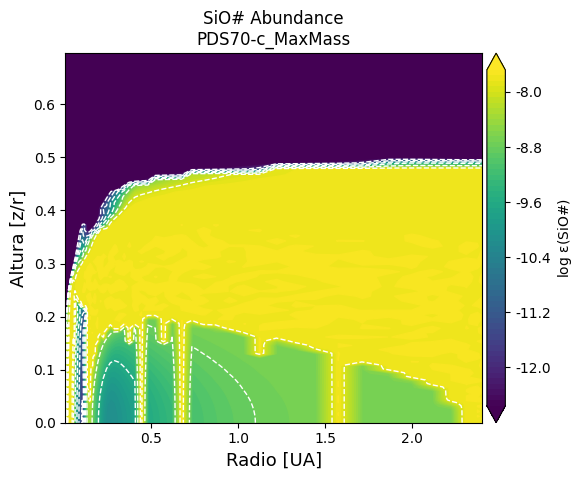

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


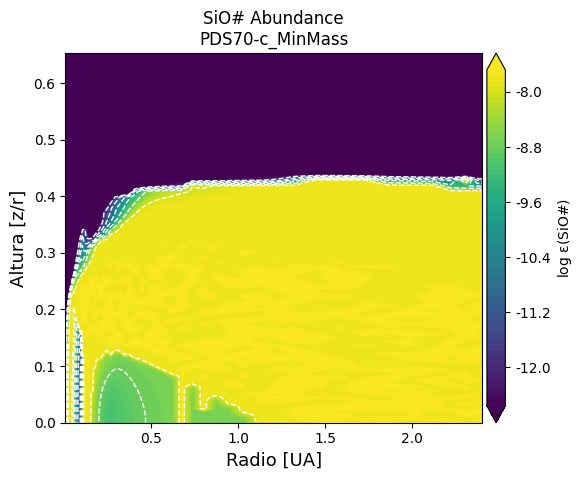

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


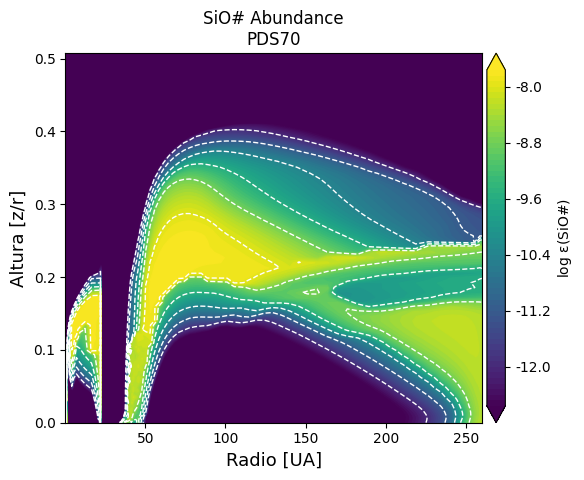

In [47]:
i = 0
for lab in labels:
    species_name = 'SiO#'
    pp = pplot.Plot(None)
    
    # Uso de f-string para incorporar el nombre de la especie en el título
    pp.plot_abuncont(models[i], species=species_name, rel2H=True, zlog=True, zr=True, title=f'{species_name} Abundance\n{lab}', xlog=False)
    
    # Mostrar la gráfica
    
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Abu_SiO#_%s.pdf"%lab)
    plt.show()
    i += 1

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


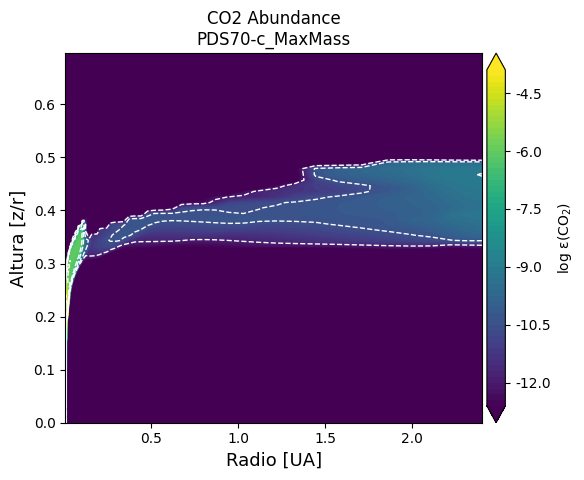

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


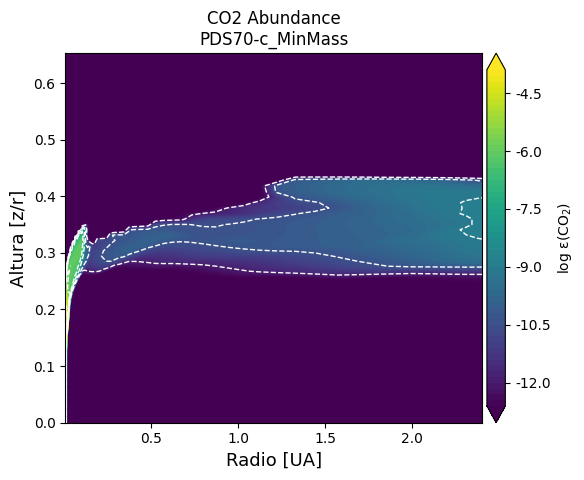

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


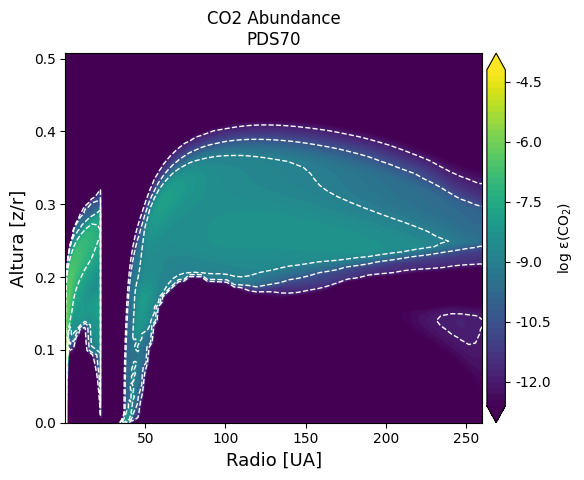

In [48]:
i = 0
for lab in labels:
    species_name = 'CO2'
    pp = pplot.Plot(None)
    
    # Uso de f-string para incorporar el nombre de la especie en el título
    pp.plot_abuncont(models[i], species=species_name, rel2H=True, zlog=True, zr=True, title=f'{species_name} Abundance\n{lab}', xlog=False)
    
    # Mostrar la gráfica
    
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Abu_CO2_%s.pdf"%lab)
    plt.show()
    i += 1

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


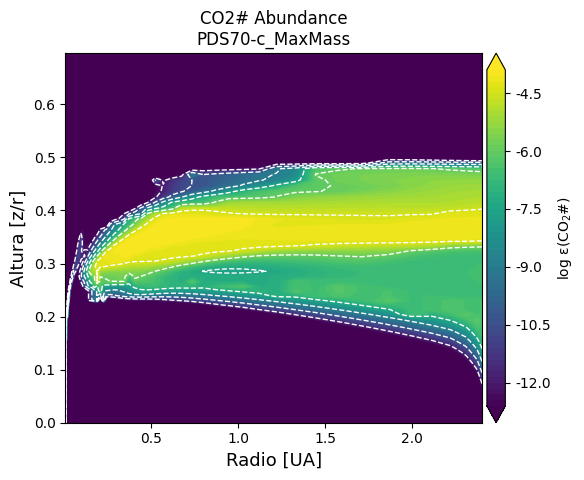

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


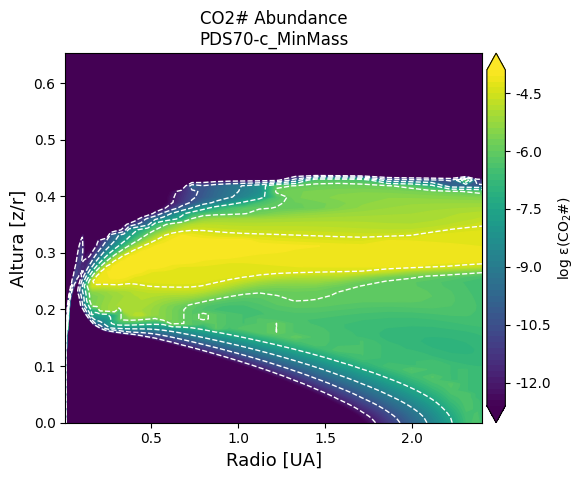

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


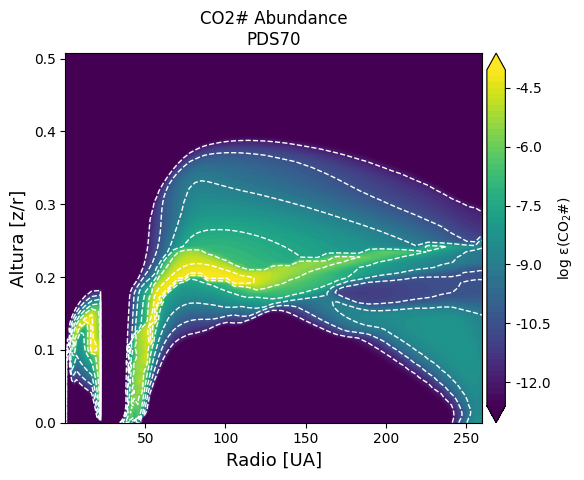

In [49]:
i = 0
for lab in labels:
    species_name = 'CO2#'
    pp = pplot.Plot(None)
    
    # Uso de f-string para incorporar el nombre de la especie en el título
    pp.plot_abuncont(models[i], species=species_name, rel2H=True, zlog=True, zr=True, title=f'{species_name} Abundance\n{lab}', xlog=False)
    
    # Mostrar la gráfica
    
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Abu_CO2#_%s.pdf"%lab)
    plt.show()
    i += 1

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


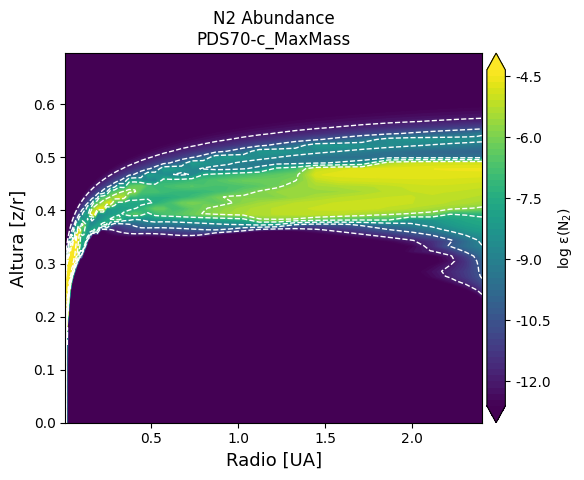

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


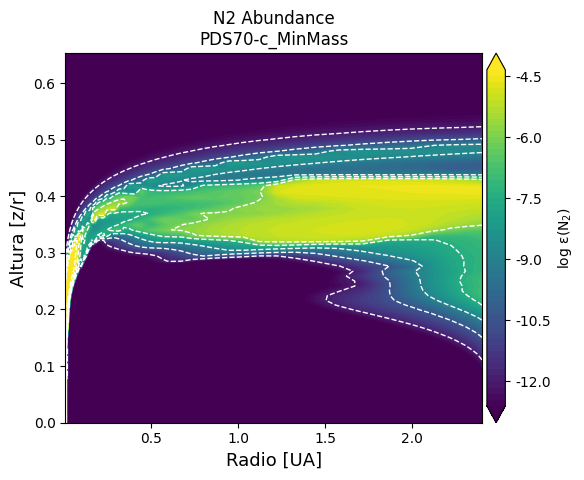

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


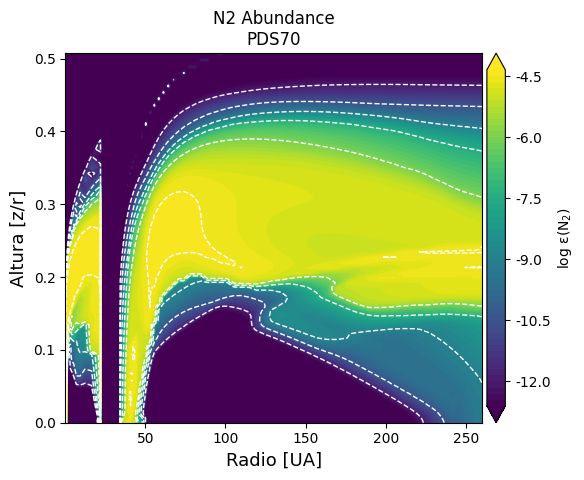

In [50]:
i = 0
for lab in labels:
    species_name = 'N2'
    pp = pplot.Plot(None)
    
    # Uso de f-string para incorporar el nombre de la especie en el título
    pp.plot_abuncont(models[i], species=species_name, rel2H=True, zlog=True, zr=True, title=f'{species_name} Abundance\n{lab}', xlog=False)
    
    # Mostrar la gráfica
    
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Abu_N2_%s.pdf"%lab)
    plt.show()
    i += 1

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


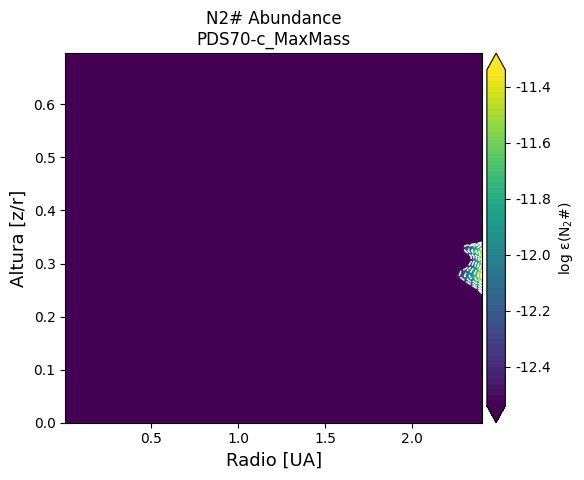

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


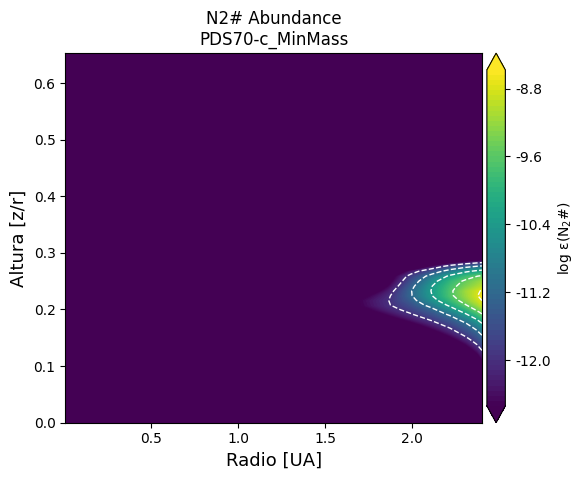

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


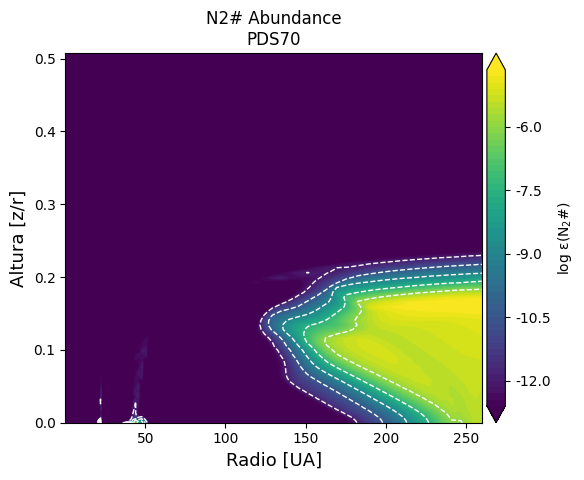

In [51]:
i = 0
for lab in labels:
    species_name = 'N2#'
    pp = pplot.Plot(None)
    
    # Uso de f-string para incorporar el nombre de la especie en el título
    pp.plot_abuncont(models[i], species=species_name, rel2H=True, zlog=True, zr=True, title=f'{species_name} Abundance\n{lab}', xlog=False)
    
    # Mostrar la gráfica
    
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Abu_N2#_%s.pdf"%lab)
    plt.show()
    i += 1

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


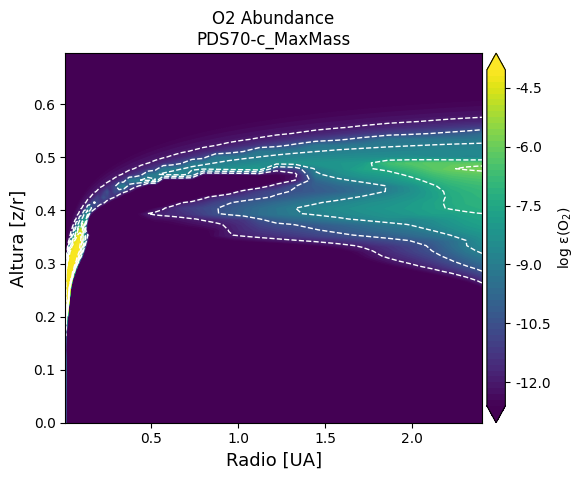

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


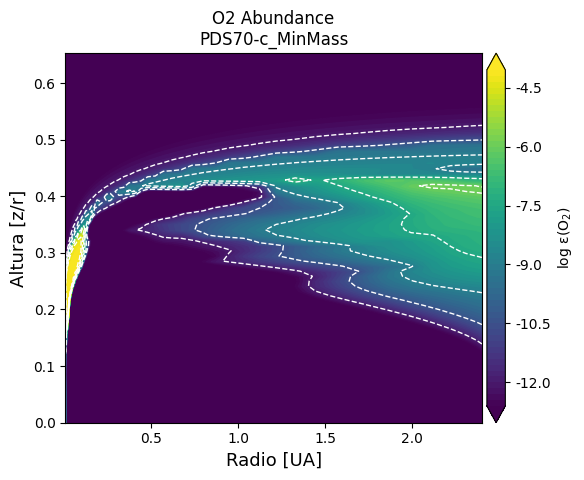

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


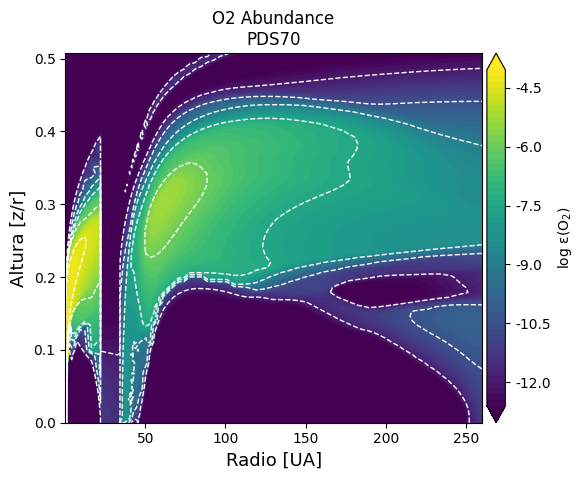

In [52]:
i = 0
for lab in labels:
    species_name = 'O2'
    pp = pplot.Plot(None)
    
    # Uso de f-string para incorporar el nombre de la especie en el título
    pp.plot_abuncont(models[i], species=species_name, rel2H=True, zlog=True, zr=True, title=f'{species_name} Abundance\n{lab}', xlog=False)
    
    # Mostrar la gráfica
    
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Abu_O2_%s.pdf"%lab)
    plt.show()
    i += 1

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


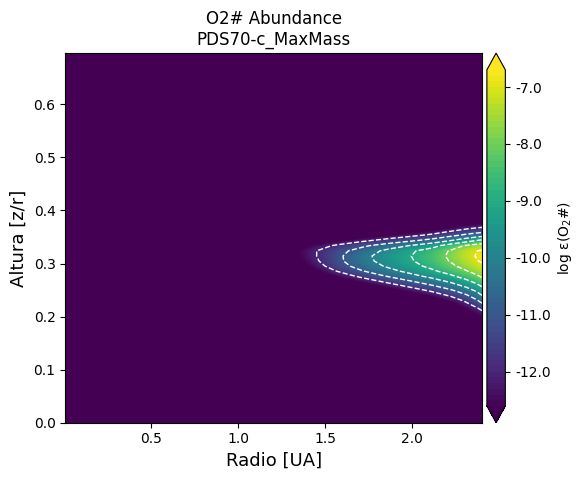

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


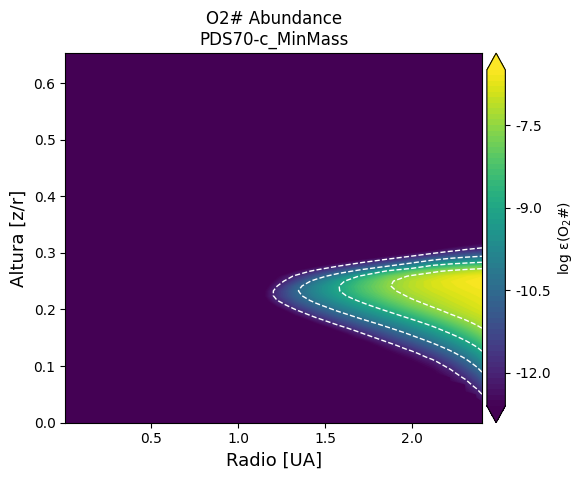

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


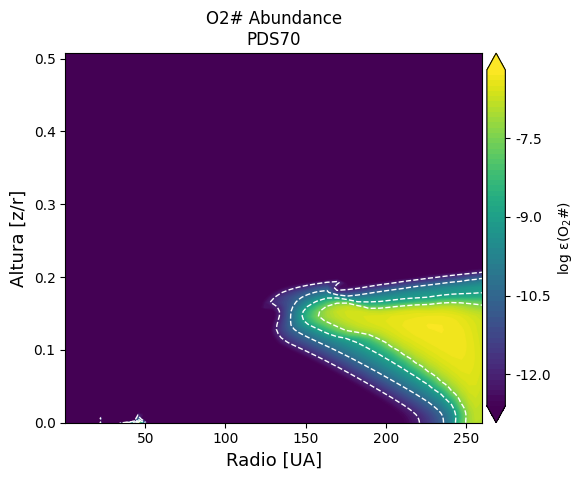

In [53]:
i = 0
for lab in labels:
    species_name = 'O2#'
    pp = pplot.Plot(None)
    
    # Uso de f-string para incorporar el nombre de la especie en el título
    pp.plot_abuncont(models[i], species=species_name, rel2H=True, zlog=True, zr=True, title=f'{species_name} Abundance\n{lab}', xlog=False)
    
    # Mostrar la gráfica
    
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Abu_O2#_%s.pdf"%lab)
    plt.show()
    i += 1

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


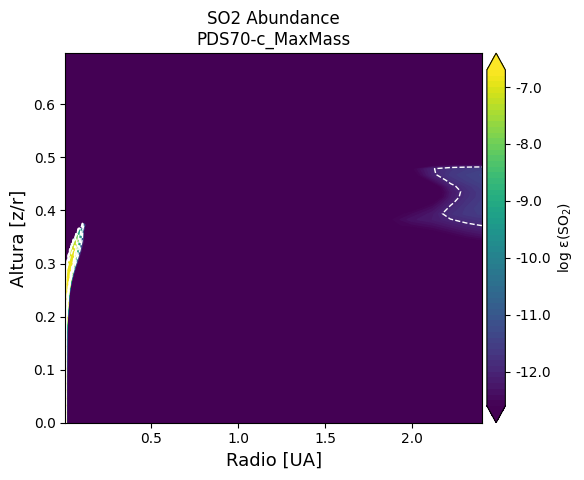

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


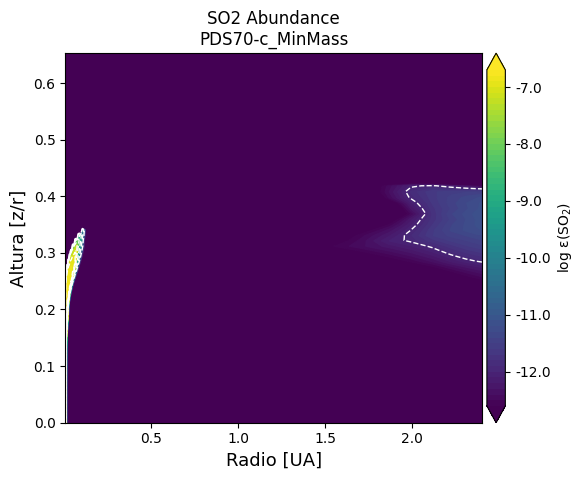

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


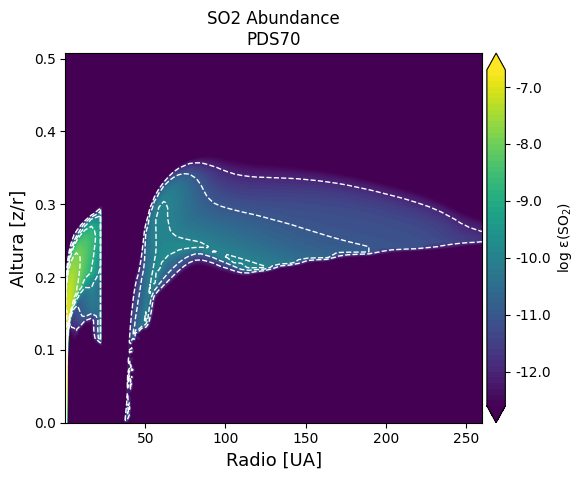

In [54]:
i = 0
for lab in labels:
    species_name = 'SO2'
    pp = pplot.Plot(None)
    
    # Uso de f-string para incorporar el nombre de la especie en el título
    pp.plot_abuncont(models[i], species=species_name, rel2H=True, zlog=True, zr=True, title=f'{species_name} Abundance\n{lab}', xlog=False)
    
    # Mostrar la gráfica
    
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Abu_SO2_%s.pdf"%lab)
    plt.show()
    i += 1

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


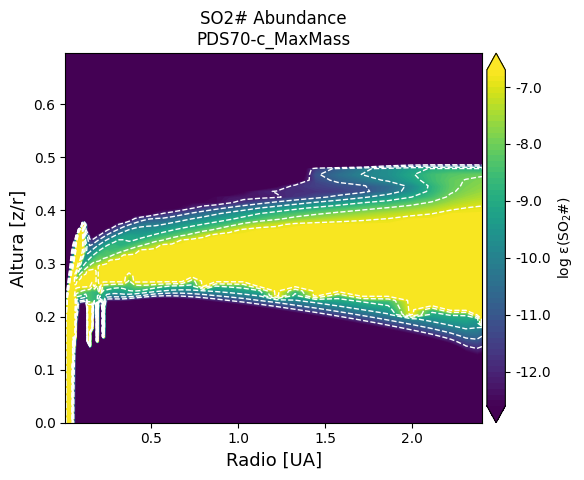

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


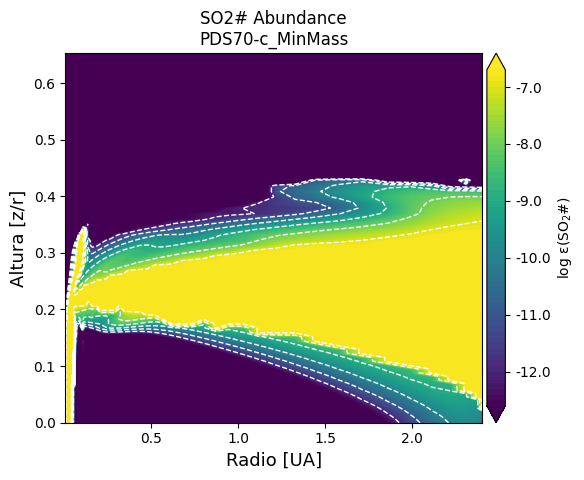

PLOT: plot_abuncont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


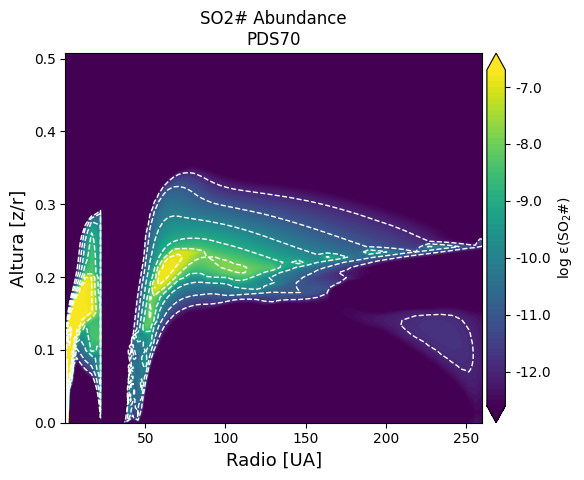

In [55]:
i = 0
for lab in labels:
    species_name = 'SO2#'
    pp = pplot.Plot(None)
    
    # Uso de f-string para incorporar el nombre de la especie en el título
    pp.plot_abuncont(models[i], species=species_name, rel2H=True, zlog=True, zr=True, title=f'{species_name} Abundance\n{lab}', xlog=False)
    
    # Mostrar la gráfica
    
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Abu_SO2#_%s.pdf"%lab)
    plt.show()
    i += 1

In [14]:
i=0
for lab in labels:
    pp=pplot.Plot(None)
    pp.plot_sedAna(models[i], label='SEDana\n%s'%labels[i])   
    #plt.savefig("SED_Origin_of_emission_%s.pdf"%lab)
    plt.show()
    i=i+1

PLOT: plot_sedAna ...


TypeError: Polygon.__init__() takes 2 positional arguments but 3 were given

READ: Reading File:  BD_PDS70c/FlineEstimates.out  ...
PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


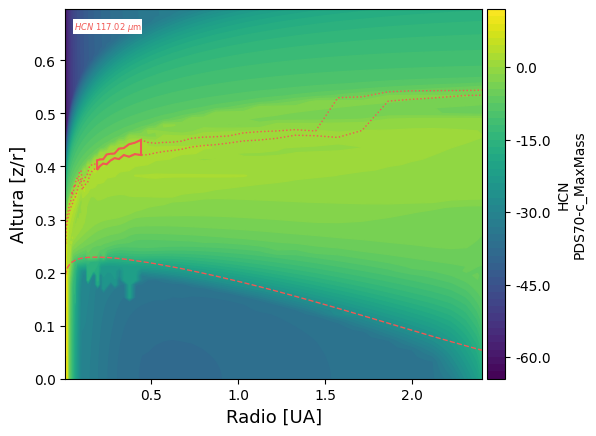

READ: Reading File:  BD_PDS70cmax/FlineEstimates.out  ...
PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


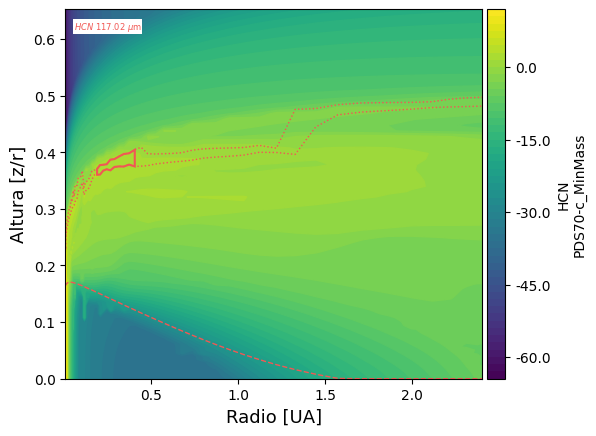

READ: Reading File:  TwoZones_PDS70.3/FlineEstimates.out  ...
PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


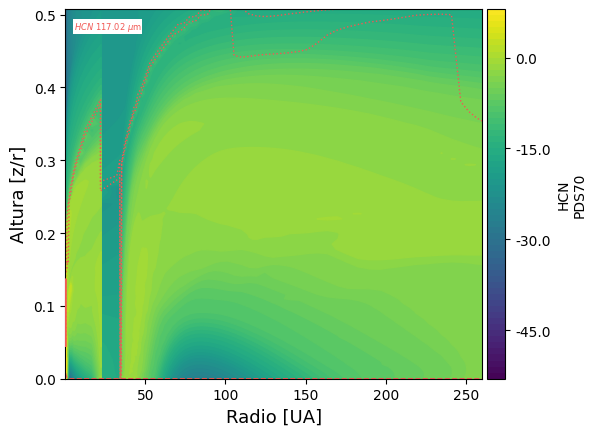

In [15]:
i=0
for lab in labels:
    pp=pplot.Plot(None)
    pp.plot_line_origin(models[i],[["HCN",14]], models[i].nmol[:,:,models[i].spnames['HCN']], label="HCN\n%s"%labels[i], xlog=False)
    
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Origin_HCN_%s.pdf"%lab)
    plt.show()
    i=i+1

READ: Reading File:  BD_PDS70c/FlineEstimates.out  ...
PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


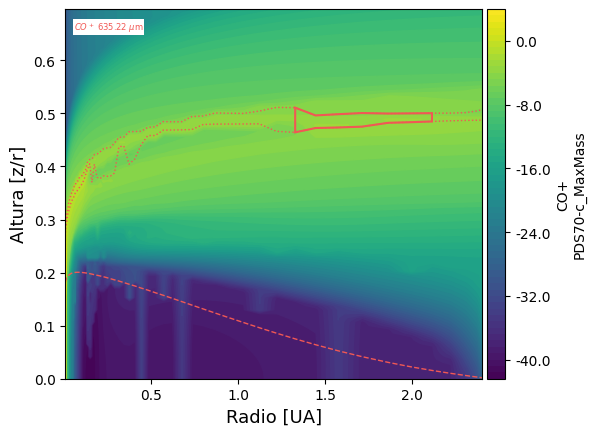

READ: Reading File:  BD_PDS70cmax/FlineEstimates.out  ...
PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


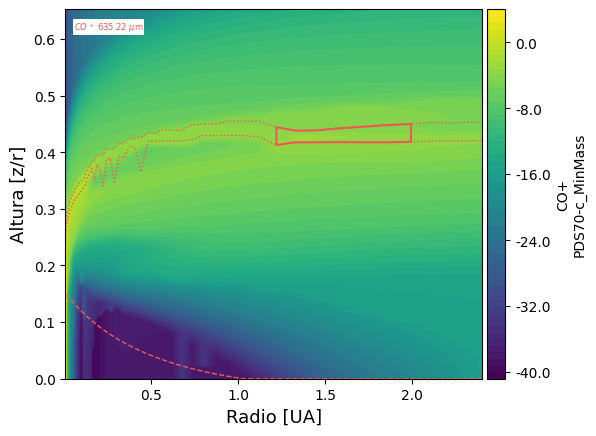

READ: Reading File:  TwoZones_PDS70.3/FlineEstimates.out  ...
PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


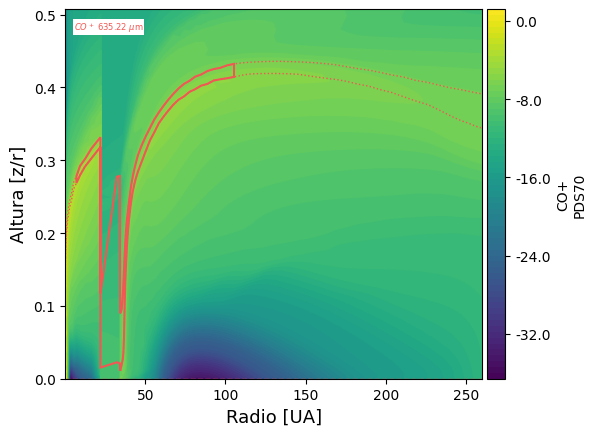

In [18]:
i=0
for lab in labels:
    pp=pplot.Plot(None)
    pp.plot_line_origin(models[i],[["CO+",14]], models[i].nmol[:,:,models[i].spnames['CO+']], label="CO+\n%s"%labels[i], xlog=False)
    
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Origin_CO+_%s.pdf"%lab)
    plt.show()
    i=i+1

READ: Reading File:  BD_PDS70c/FlineEstimates.out  ...
PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


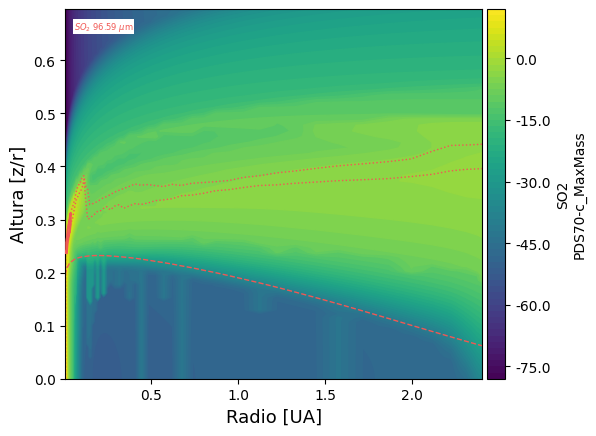

READ: Reading File:  BD_PDS70cmax/FlineEstimates.out  ...
PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


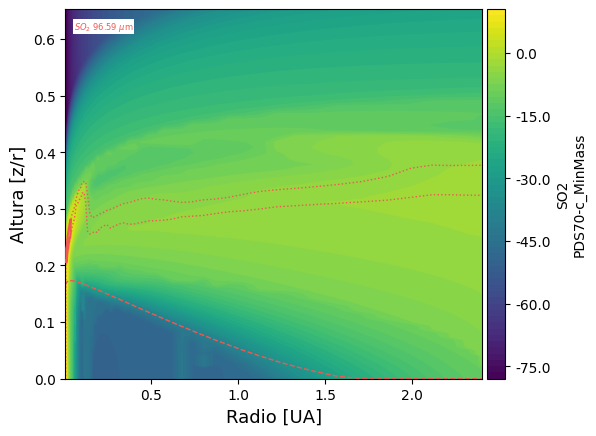

READ: Reading File:  TwoZones_PDS70.3/FlineEstimates.out  ...
PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


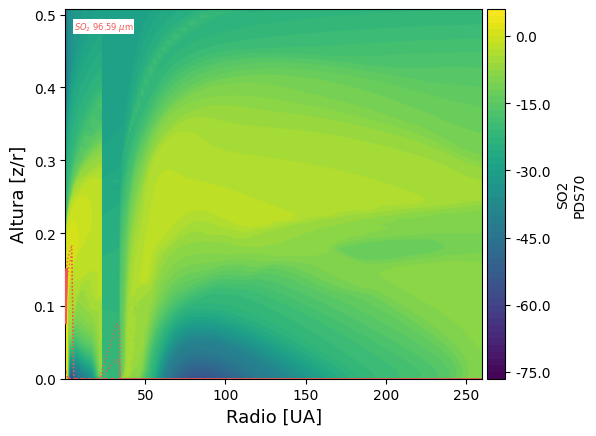

In [20]:
i=0
for lab in labels:
    pp=pplot.Plot(None)
    pp.plot_line_origin(models[i],[["SO2",14]], models[i].nmol[:,:,models[i].spnames['SO2']], label="SO2\n%s"%labels[i], xlog=False)
    
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Origin_SO2_%s.pdf"%lab)
    plt.show()
    i=i+1

READ: Reading File:  BD_PDS70c/FlineEstimates.out  ...
PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


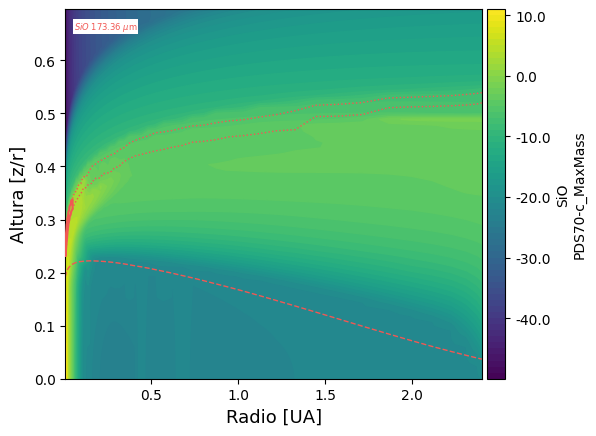

READ: Reading File:  BD_PDS70cmax/FlineEstimates.out  ...
PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


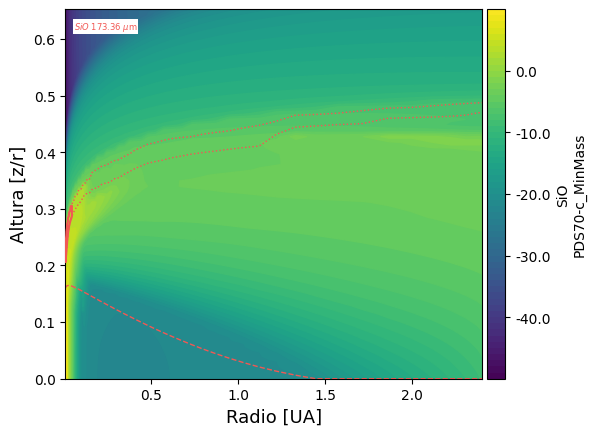

READ: Reading File:  TwoZones_PDS70.3/FlineEstimates.out  ...
PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


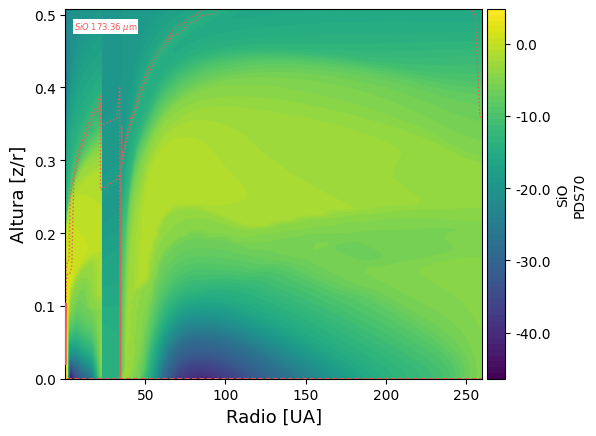

In [22]:
i=0
for lab in labels:
    pp=pplot.Plot(None)
    pp.plot_line_origin(models[i],[["SiO",12]], models[i].nmol[:,:,models[i].spnames['SiO']], label="SiO\n%s"%labels[i], xlog=False)
    
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Origin_SiO_%s.pdf"%lab)
    plt.show()
    i=i+1

READ: Reading File:  BD_PDS70c/FlineEstimates.out  ...
PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


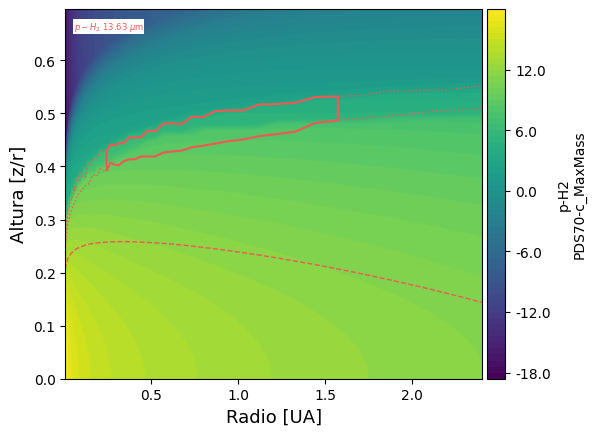

READ: Reading File:  BD_PDS70cmax/FlineEstimates.out  ...
PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


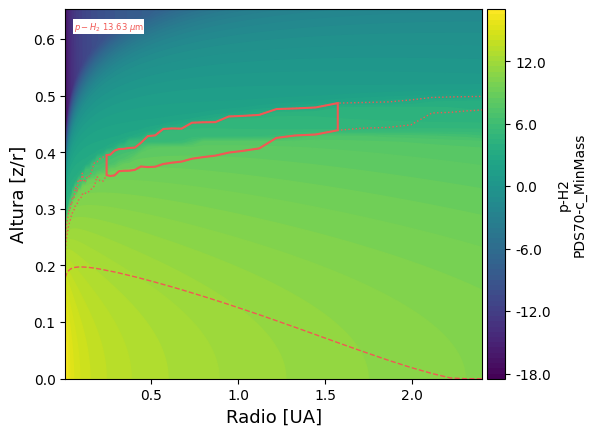

READ: Reading File:  TwoZones_PDS70.3/FlineEstimates.out  ...
PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


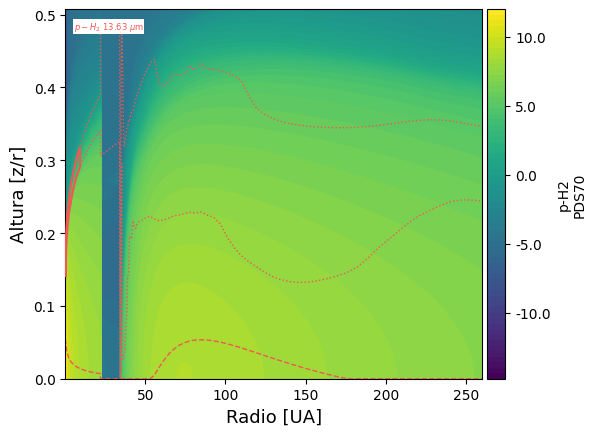

In [23]:
i=0
for lab in labels:
    pp=pplot.Plot(None)
    pp.plot_line_origin(models[i],[["p-H2",14]], models[i].nmol[:,:,models[i].spnames['H2']], label="p-H2\n%s"%labels[i], xlog=False)
    
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Origin_pH2_%s.pdf"%lab)
    plt.show()
    i=i+1

READ: Reading File:  BD_PDS70c/FlineEstimates.out  ...
PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


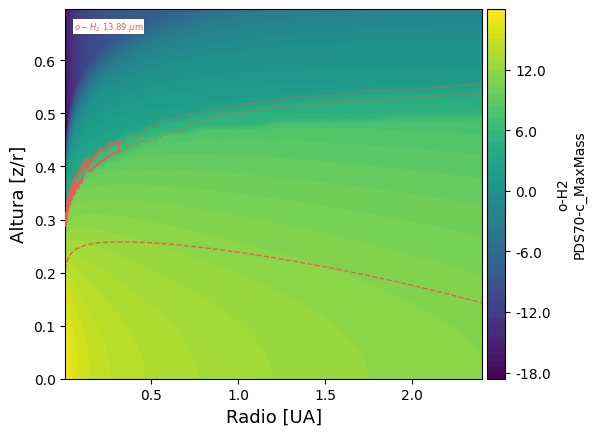

READ: Reading File:  BD_PDS70cmax/FlineEstimates.out  ...
PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


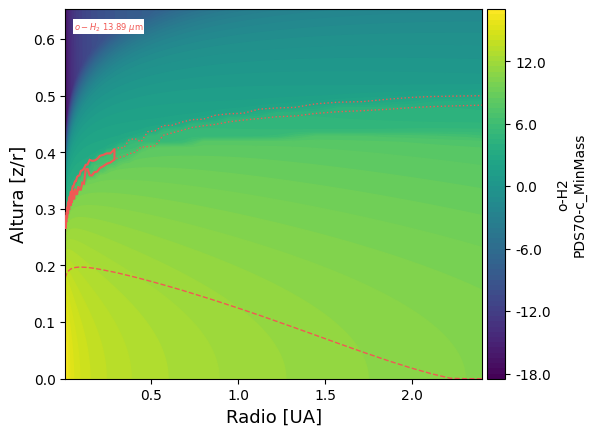

READ: Reading File:  TwoZones_PDS70.3/FlineEstimates.out  ...
PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


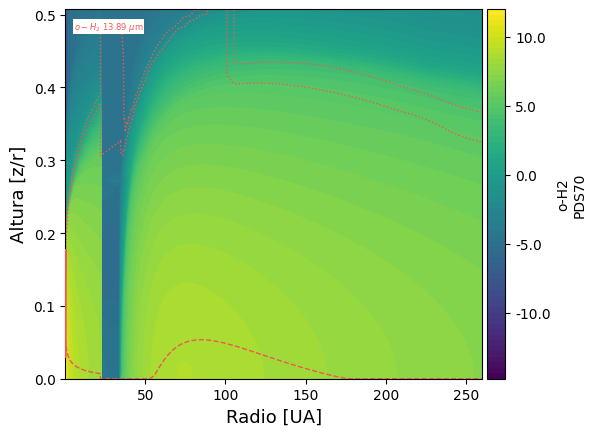

In [24]:
i=0
for lab in labels:
    pp=pplot.Plot(None)
    pp.plot_line_origin(models[i],[["o-H2",14]], models[i].nmol[:,:,models[i].spnames['H2']], label="o-H2\n%s"%labels[i], xlog=False)
    
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Origin_oH2_%s.pdf"%lab)
    plt.show()
    i=i+1

READ: Reading File:  BD_PDS70c/FlineEstimates.out  ...
PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


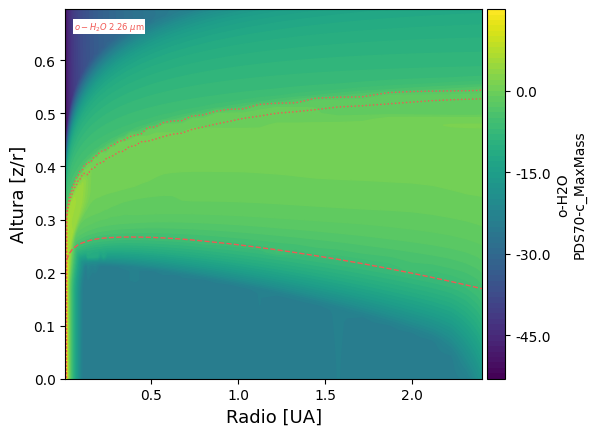

READ: Reading File:  BD_PDS70cmax/FlineEstimates.out  ...
PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


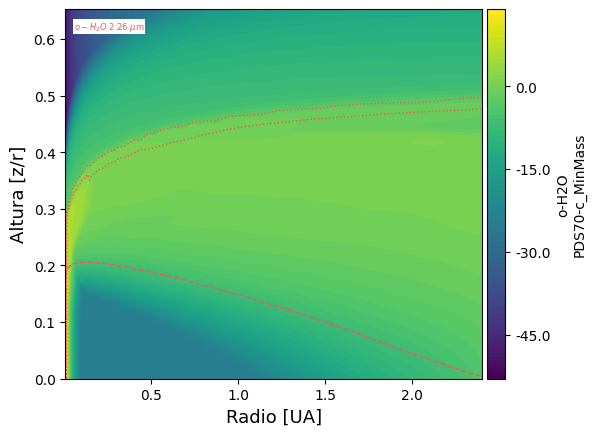

READ: Reading File:  TwoZones_PDS70.3/FlineEstimates.out  ...
PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


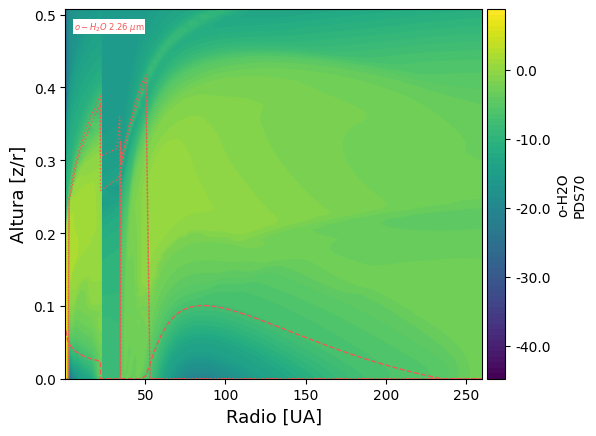

In [59]:
i=0
for lab in labels:
    pp=pplot.Plot(None)
    pp.plot_line_origin(models[i],[["o-H2O",1]], models[i].nmol[:,:,models[i].spnames['H2O']], label="o-H2O\n%s"%labels[i], xlog=False)
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Origin_oH2O_%s.pdf"%lab)
    plt.show()
    i=i+1

PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


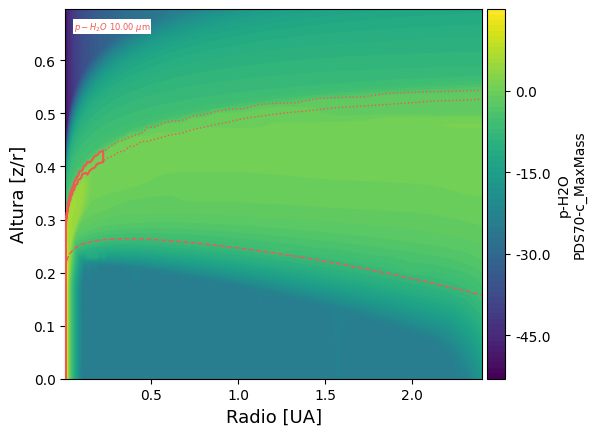

PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


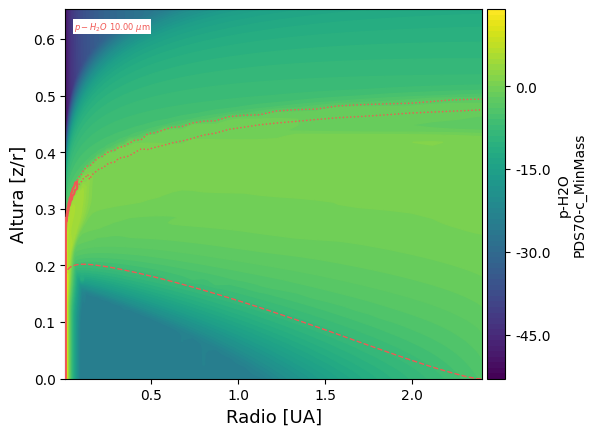

PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


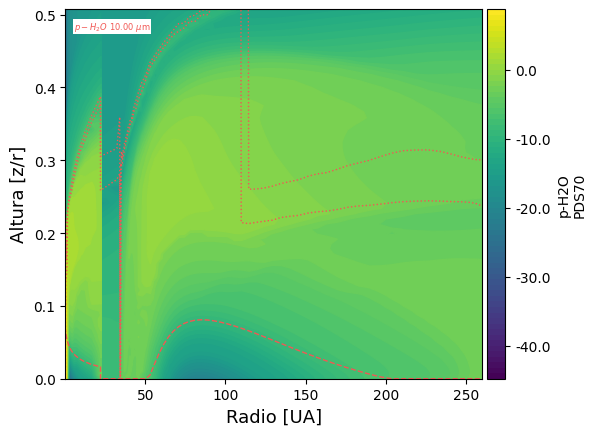

In [58]:
i=0
for lab in labels:
    pp=pplot.Plot(None)
    pp.plot_line_origin(models[i],[["p-H2O",10]], models[i].nmol[:,:,models[i].spnames['H2O']], label="p-H2O\n%s"%labels[i], xlog=False)
    
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Origin_pH2O_%s.pdf"%lab)
    plt.show()
    i=i+1

READ: Reading File:  BD_PDS70c/FlineEstimates.out  ...
PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


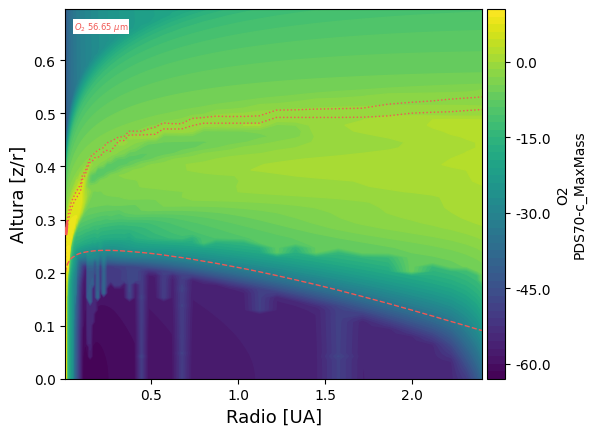

READ: Reading File:  BD_PDS70cmax/FlineEstimates.out  ...
PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


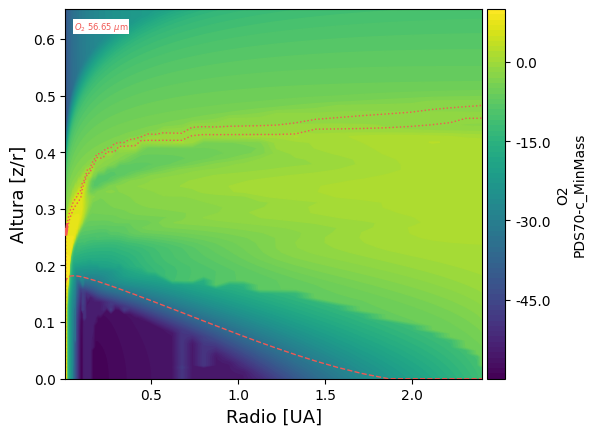

READ: Reading File:  TwoZones_PDS70.3/FlineEstimates.out  ...
PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


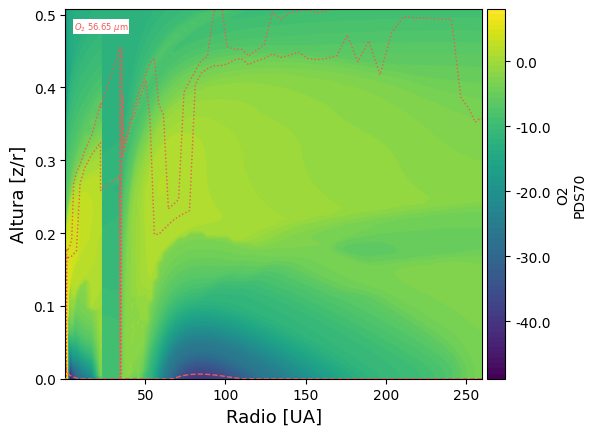

In [29]:
i=0
for lab in labels:
    pp=pplot.Plot(None)
    pp.plot_line_origin(models[i],[["O2",14]], models[i].nmol[:,:,models[i].spnames['O2']], label="O2\n%s"%labels[i], xlog=False)
    
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Origin_O2_%s.pdf"%lab)
    plt.show()
    i=i+1

PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


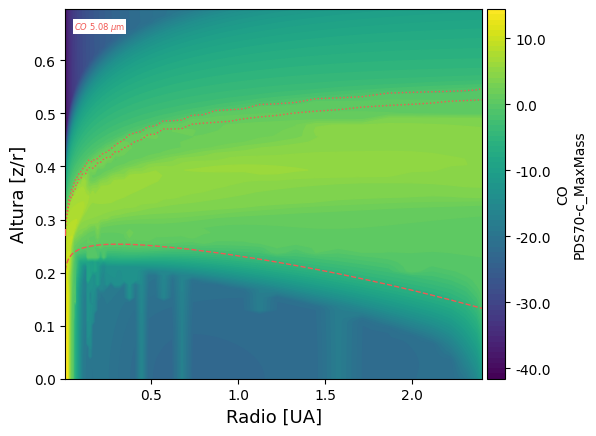

WARN: Unable to calculate a proper region for the line origin: CO/5.07917179/109/61/7.3832e-22
PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


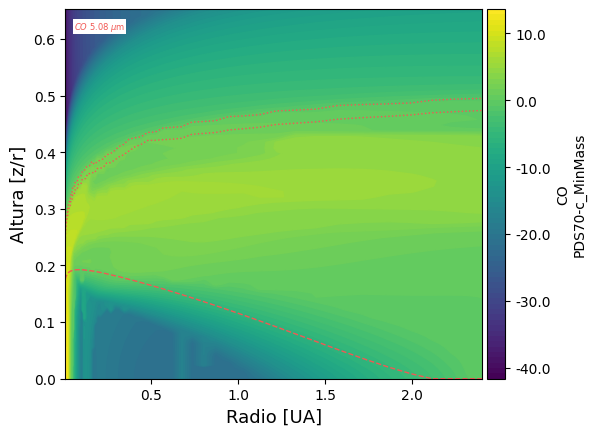

PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


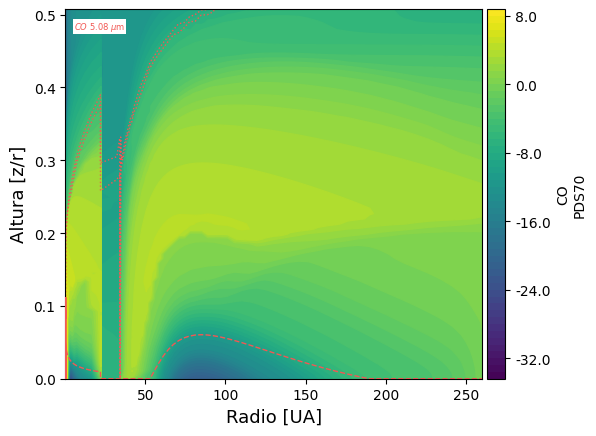

In [40]:
i=0
for lab in labels:
    pp=pplot.Plot(None)
    pp.plot_line_origin(models[i],[["CO",14]], models[i].nmol[:,:,models[i].spnames['CO']], label="CO\n%s"%labels[i], xlog=False)
    
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Origin_CO_%s.pdf"%lab)
    plt.show()
    i=i+1

READ: Reading File:  BD_PDS70c/FlineEstimates.out  ...
PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


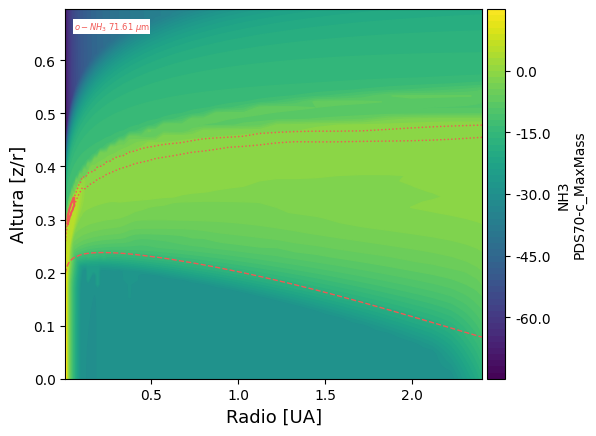

READ: Reading File:  BD_PDS70cmax/FlineEstimates.out  ...
PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


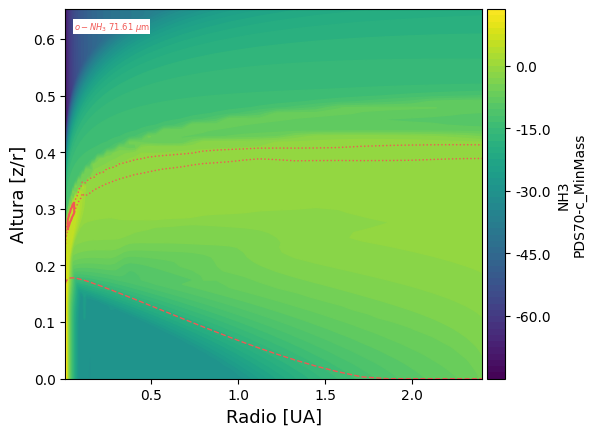

READ: Reading File:  TwoZones_PDS70.3/FlineEstimates.out  ...
PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


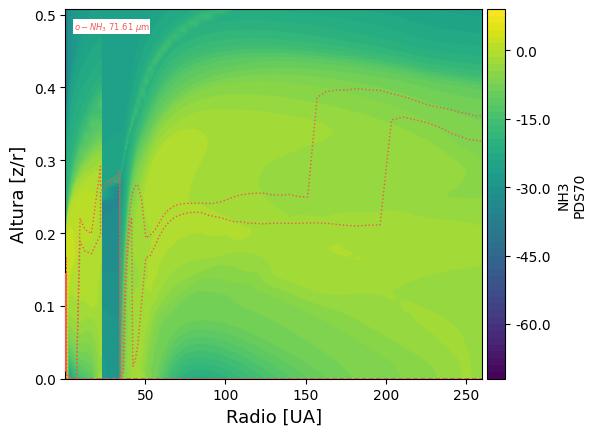

In [38]:
i=0
for lab in labels:
    pp=pplot.Plot(None)
    pp.plot_line_origin(models[i],[["o-NH3",14]], models[i].nmol[:,:,models[i].spnames['NH3']], label="NH3\n%s"%labels[i], xlog=False)
    
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Origin_oNH3_%s.pdf"%lab)
    plt.show()
    i=i+1

READ: Reading File:  BD_PDS70c/FlineEstimates.out  ...
PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


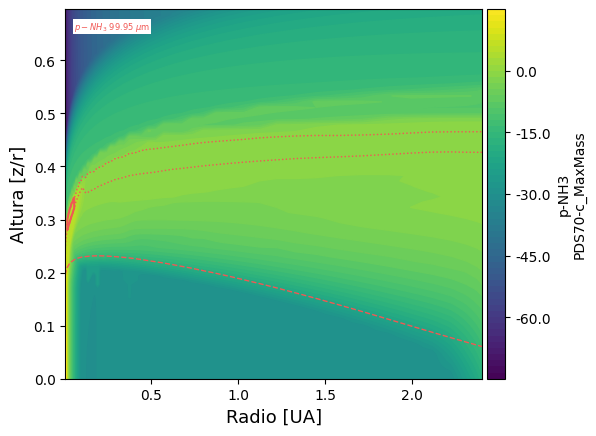

READ: Reading File:  BD_PDS70cmax/FlineEstimates.out  ...
PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


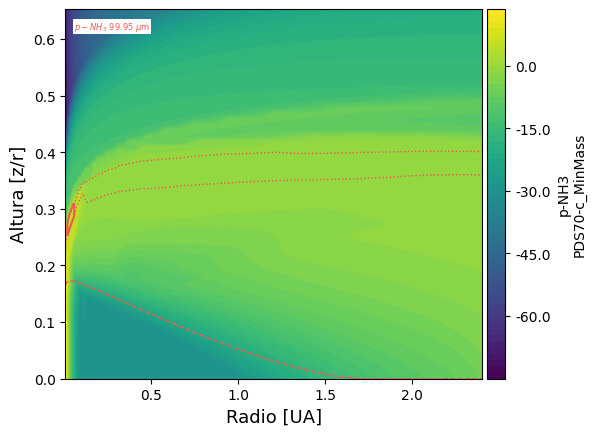

READ: Reading File:  TwoZones_PDS70.3/FlineEstimates.out  ...
PLOT: plot_cont ...


/home/usuario/Documentos/Prodimo/prodimopy-master/prodimopy/plot.py:522: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for c in CS.collections:


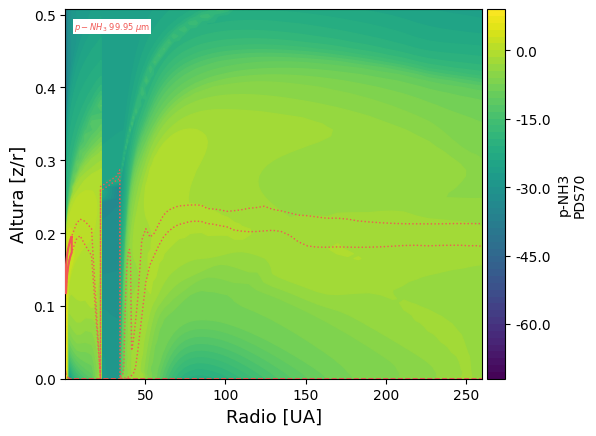

In [41]:
i=0
for lab in labels:
    pp=pplot.Plot(None)
    pp.plot_line_origin(models[i],[["p-NH3",14]], models[i].nmol[:,:,models[i].spnames['NH3']], label="p-NH3\n%s"%labels[i], xlog=False)
    
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Origin_pNH3_%s.pdf"%lab)
    plt.show()
    i=i+1

In [53]:
i=0
for lab in labels:
    pp=pplot.Plot(None)
    pp.plot_line_origin(models[i],[["CO2",14]], models[i].nmol[:,:,models[i].spnames['CO2']], label="CO2\n%s"%labels[i], xlog=False)
    
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Origin_CO2_%s.pdf"%lab)
    plt.show()
    i=i+1

ERROR: Could not find any line estimates for ident:  o-CO2


AttributeError: 'NoneType' object has no attribute 'rInfo'

Abundancia para CO2 en el modelo PDS70-c_MaxMass encontrada, dimensiones: (80, 80)


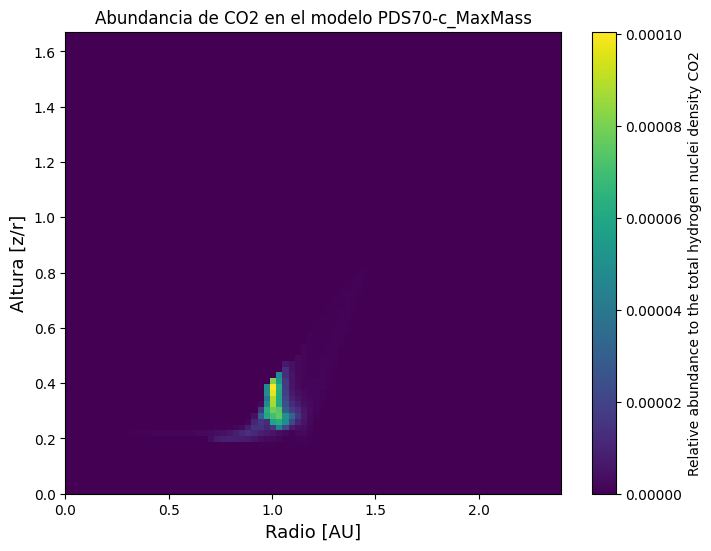

Abundancia para CO2 en el modelo PDS70-c_MinMass encontrada, dimensiones: (80, 80)


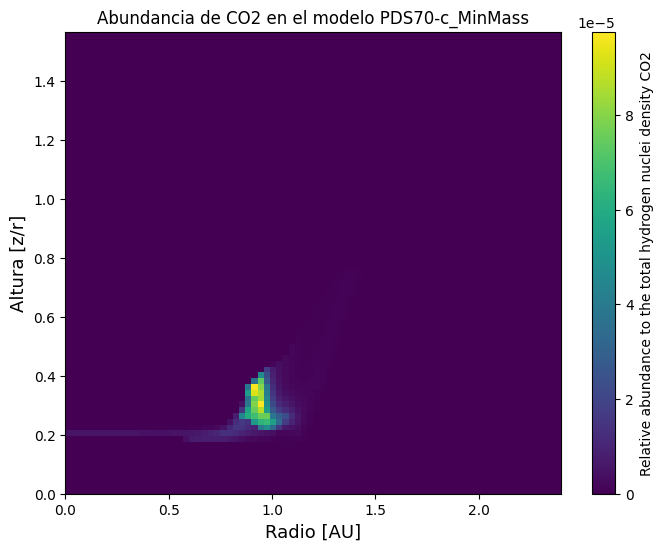

Abundancia para CO2 en el modelo PDS70 encontrada, dimensiones: (120, 80)


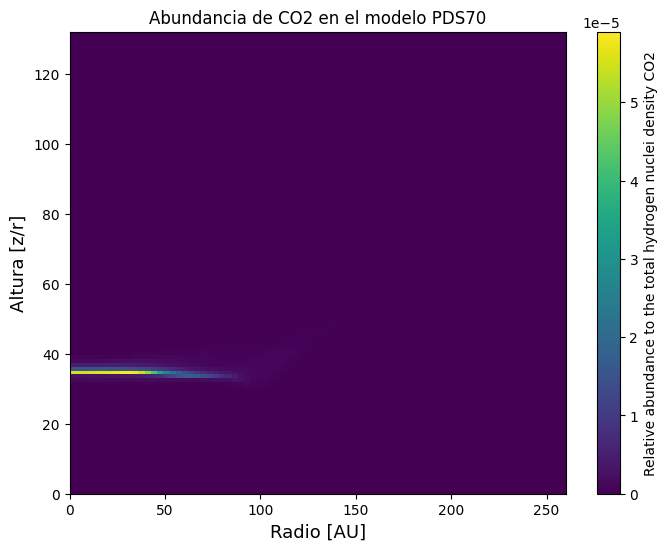

In [54]:
for i, lab in enumerate(labels):  
    species_name = 'CO2'
    abundance = models[i].getAbun(spname=species_name)
    # Verificar si se encontró la especie y graficar la abundancia
    if abundance is not None:
        print(f"Abundancia para {species_name} en el modelo {lab} encontrada, dimensiones: {abundance.shape}")
        
        # Crear una gráfica de mapa de calor para la abundancia
        plt.figure(figsize=(8, 6))
        plt.imshow(abundance, origin='lower', aspect='auto', extent=[0, models[i].x.max(), 0, models[i].z.max()])
        plt.colorbar(label=f'Relative abundance to the total hydrogen nuclei density {species_name}')
        plt.xlabel('Radio [AU]', fontsize=13)
        plt.ylabel('Altura [z/r]', fontsize=13)
        plt.title(f'Abundancia de {species_name} en el modelo {lab}')
        plt.savefig("Relative_Abundance_CO_%s.pdf"%lab)
        plt.show()
    else:
        print(f"La especie {species_name} no se encontró en el modelo {lab}.")

In [172]:
import matplotlib.pyplot as plt
import numpy as np

def plot_reac_ixiz(ix, iz, rtype, models, chemanas, ages, chemana_steadystate=None, ax=None, **kwargs):
    """
    Grafica las tasas de reacciones más importantes para un punto específico en la grilla (ix, iz)
    en un modelo dependiente del tiempo.

    Parameters:
        ix (int): Índice ix de la grilla (empieza en 0).
        iz (int): Índice iz de la grilla (empieza en 0).
        rtype (str): 'f' para reacciones de formación, 'd' para reacciones de destrucción.
        models (list): Lista de objetos Data_ProDiMo para cada edad en el modelo dependiente del tiempo.
        chemanas (list): Lista de objetos Chemistry correspondientes a cada modelo. Longitud debe coincidir con models.
        ages (array_like(float)): Lista de edades del modelo dependiente del tiempo. Longitud debe coincidir con models.
        chemana_steadystate (tuple, optional): Modelo de estado estacionario para comparar, como (Data_ProDiMo, Chemistry).
        ax (matplotlib.axes.Axes, optional): Eje donde se dibujará la gráfica.
        **kwargs: Argumentos adicionales para la personalización del gráfico.

    Returns:
        matplotlib.axes.Axes: El eje con la gráfica.
    """
    # Validación de inputs
    if len(models) != len(chemanas) or len(models) != len(ages):
        raise ValueError("Las longitudes de 'models', 'chemanas' y 'ages' deben coincidir.")

    if ax is None:
        fig, ax = plt.subplots(figsize=kwargs.get("figsize", (10, 6)))

    # Inicializar almacenamiento para tasas
    rates = []

    # Recopilar tasas para cada modelo y edad
    for model, chemana, age in zip(models, chemanas, ages):
        if rtype == 'f':  # Formación
            rates.append(chemana.get_formation_rates(ix, iz))
        elif rtype == 'd':  # Destrucción
            rates.append(chemana.get_destruction_rates(ix, iz))
        else:
            raise ValueError("El parámetro 'rtype' debe ser 'f' (formación) o 'd' (destrucción).")

    rates = np.array(rates)  # Convertir a arreglo numpy

    # Graficar tasas para cada reacción
    for reac_idx in range(rates.shape[1]):
        ax.plot(ages, rates[:, reac_idx], label=f'Reacción {reac_idx + 1}', **kwargs)

    # Comparar con el modelo de estado estacionario (si está disponible)
    if chemana_steadystate is not None:
        model_ss, chemana_ss = chemana_steadystate
        if rtype == 'f':
            rates_ss = chemana_ss.get_formation_rates(ix, iz)
        elif rtype == 'd':
            rates_ss = chemana_ss.get_destruction_rates(ix, iz)
        else:
            rates_ss = []
        for reac_idx, rate_ss in enumerate(rates_ss):
            ax.axhline(rate_ss, linestyle='--', color='gray', label=f'SS Reacción {reac_idx + 1}')

    # Configuración del gráfico
    ax.set_xlabel("Edad del Modelo [años]", fontsize=kwargs.get("label_fontsize", 12))
    ax.set_ylabel("Tasa [cm$^{-3}$ s$^{-1}$]", fontsize=kwargs.get("label_fontsize", 12))
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
    ax.legend(fontsize=kwargs.get("legend_fontsize", 10))
    ax.set_title(f"Tasas de {'Formación' if rtype == 'f' else 'Destrucción'} en ({ix}, {iz})", fontsize=kwargs.get("title_fontsize", 14))

    return ax

In [173]:
# Generar análisis químicos para cada modelo
chemanas = [model.get_chemistry_analysis() for model in models]

# Definir las edades correspondientes a los modelos
ages = [1e3, 1e4, 1e5, 1e6]  # Ejemplo de edades en años

# Llamar a la función
plot_reac_ixiz(
    ix=10, iz=20, rtype='f', 
    models=models, chemanas=chemanas, ages=ages,
    chemana_steadystate=(steady_model, steady_chemana),
    color='blue', linestyle='-', label_fontsize=10, title_fontsize=14
)
plt.show()

AttributeError: 'Data_ProDiMo' object has no attribute 'get_chemistry_analysis'

Estructura del Disco

PLOT: plot_NH ...
PLOT: plot_NH ...
PLOT: plot_NH ...


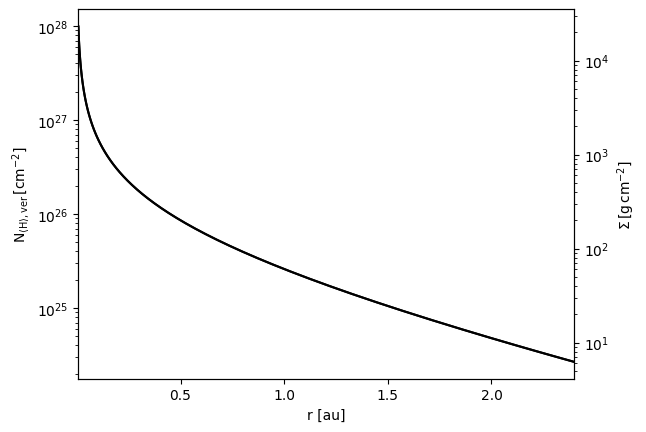

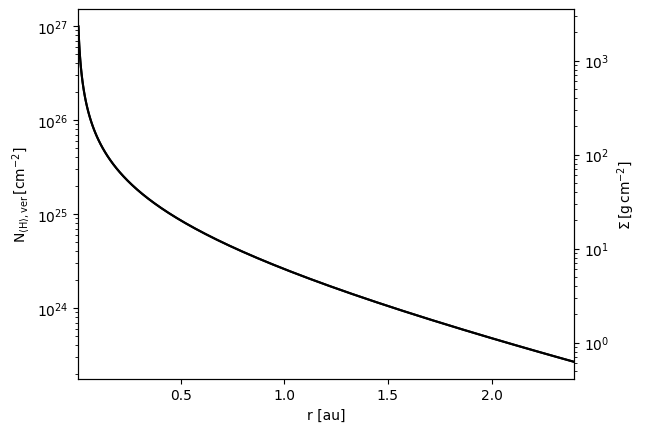

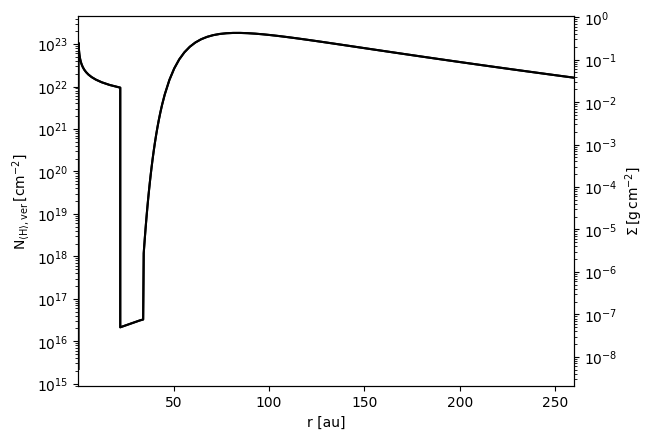

In [194]:
i=0
for lab in labels:
    pp=pplot.Plot(None)
    pp.plot_NH(models[i],sdscale=True)
    plt.xscale('linear')
    plt.savefig("Densidad superficial_nHtot_%s.pdf"%lab)
    i=i+1

In [28]:
#modelo alta masa
Range = [800, 900]  # en micrones, cubre 855 μm
wave, flux_jy = models[0].gen_specFromLineEstimates(Range, unit="Jy", contOnly=True)

INFO: gen_specFromLineEstimates: build spectrum for 99 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  0.20 s


In [29]:
from scipy.interpolate import interp1d

f_interp = interp1d(wave, flux_jy)
F_855 = f_interp(855.0)

print(f"Flujo modelado a 855 μm: {F_855*1e3:.3f} mJy")

Flujo modelado a 855 μm: 0.040 mJy


In [30]:
#modelo baja masa
Range = [800, 900]  # en micrones, cubre 855 μm
wave, flux_jy = models[1].gen_specFromLineEstimates(Range, unit="Jy", contOnly=True)

INFO: gen_specFromLineEstimates: build spectrum for 99 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  0.19 s


In [31]:
from scipy.interpolate import interp1d

f_interp = interp1d(wave, flux_jy)
F_855 = f_interp(855.0)

print(f"Flujo modelado a 855 μm: {F_855*1e3:.3f} mJy")

Flujo modelado a 855 μm: 0.024 mJy


Graficando densidad superficial para CO en el modelo [1]...
PLOT: plot_cdnmol ...
Graficando densidad superficial para H2O en el modelo [1]...
PLOT: plot_cdnmol ...
Graficando densidad superficial para CH4 en el modelo [1]...
PLOT: plot_cdnmol ...
Graficando densidad superficial para H en el modelo [1]...
PLOT: plot_NH ...
Graficando densidad superficial para SiO en el modelo [1]...
PLOT: plot_cdnmol ...


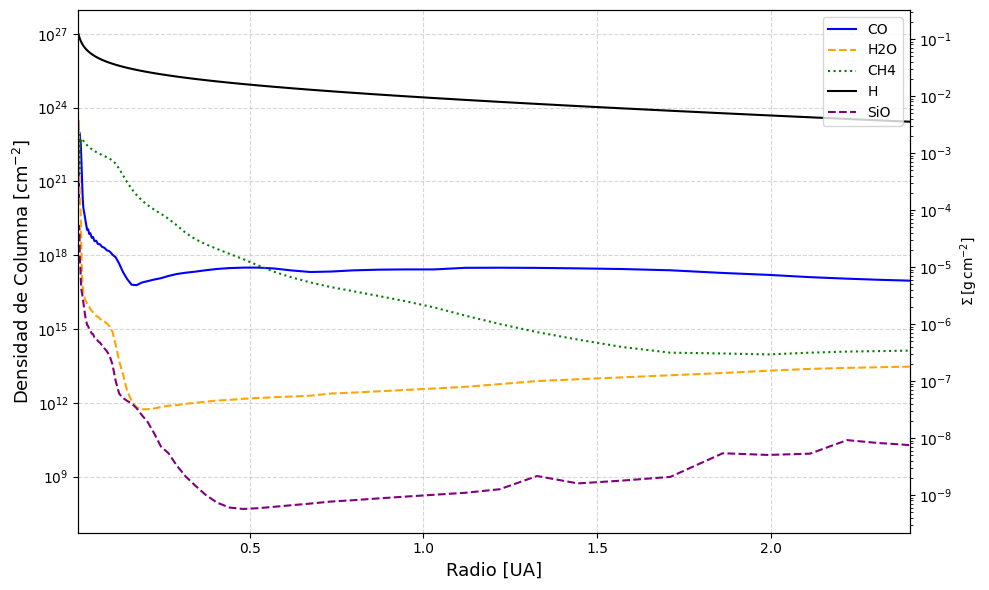

In [19]:
# Especies químicas a analizar
species_list = ["CO", "H2O", "CH4", "H", "SiO"]  # Agrega las especies químicas de interés

# Inicializar la clase Plot
pp = pplot.Plot(None)

# Crear una figura y un eje único para todas las especies
fig, ax = plt.subplots(figsize=(10, 6))

# Configuración de colores y estilos
colors = ["blue", "orange", "green", "red", "purple"]  # Colores personalizados
styles = ["-", "--", ":", "-.", "--"]  # Estilos de línea personalizados

# Iterar sobre las especies químicas y graficarlas en el mismo eje
for idx, species in enumerate(species_list):
    print(f"Graficando densidad superficial para {species} en el modelo [1]...")
    
    if species == "H":
        # Graficar la densidad superficial para el Hidrógeno
        pp.plot_NH(
            models[1],
            ax=ax,  # Pasar el eje explícitamente
            ylabel=None,  # Eliminar etiquetas redundantes
            color=colors[idx],
            style=styles[idx],
            sdscale=True  # Escala de densidad superficial
        )
    else:
        # Graficar para las demás especies químicas
        pp.plot_cdnmol(
            models[1], 
            ax=ax,  # Pasar el eje explícitamente
            species=[species],  # Especificar la especie química
            ylabel=None,  # Eliminar etiquetas redundantes
            colors=[colors[idx]],  # Color específico
            styles=[styles[idx]],  # Estilo específico
            norm=None  # Normalización opcional
        )

# Configuración del gráfico
ax.set_xscale("linear")  # Escala lineal para el eje x
ax.set_yscale("log")  # Escala logarítmica para el eje y
ax.autoscale(enable=True, axis="y")  # Habilitar la autoscalado en el eje y
#ax.set_title("Densidad superficial para el modelo [0]", fontsize=14)  # Título del gráfico
ax.set_xlabel("Radio [UA]", fontsize=13)  # Etiqueta del eje x
ax.set_ylabel(r"Densidad de Columna $\mathrm{[cm^{-2}]}$", fontsize=13)  # Etiqueta del eje y
ax.legend(species_list, loc="upper right", fontsize=10)  # Leyenda con todas las especies
ax.grid(True, linestyle="--", alpha=0.5)

# Ajustar el diseño y mostrar el gráfico
plt.tight_layout()
plt.savefig("Densidad superficial_varias moléculas_MinMass_%s.pdf")
plt.show()

Graficando densidad superficial para CO# en el modelo [1]...
PLOT: plot_cdnmol ...
Graficando densidad superficial para H en el modelo [1]...
PLOT: plot_NH ...
Graficando densidad superficial para H2O# en el modelo [1]...
PLOT: plot_cdnmol ...
Graficando densidad superficial para CH4# en el modelo [1]...
PLOT: plot_cdnmol ...
Graficando densidad superficial para SiO# en el modelo [1]...
PLOT: plot_cdnmol ...
Graficando densidad superficial para HCN# en el modelo [1]...
PLOT: plot_cdnmol ...
Graficando densidad superficial para NH3# en el modelo [1]...
PLOT: plot_cdnmol ...
Graficando densidad superficial para SO2# en el modelo [1]...
PLOT: plot_cdnmol ...
Graficando densidad superficial para O2# en el modelo [1]...
PLOT: plot_cdnmol ...
Graficando densidad superficial para N2# en el modelo [1]...
PLOT: plot_cdnmol ...
Graficando densidad superficial para CO2# en el modelo [1]...
PLOT: plot_cdnmol ...


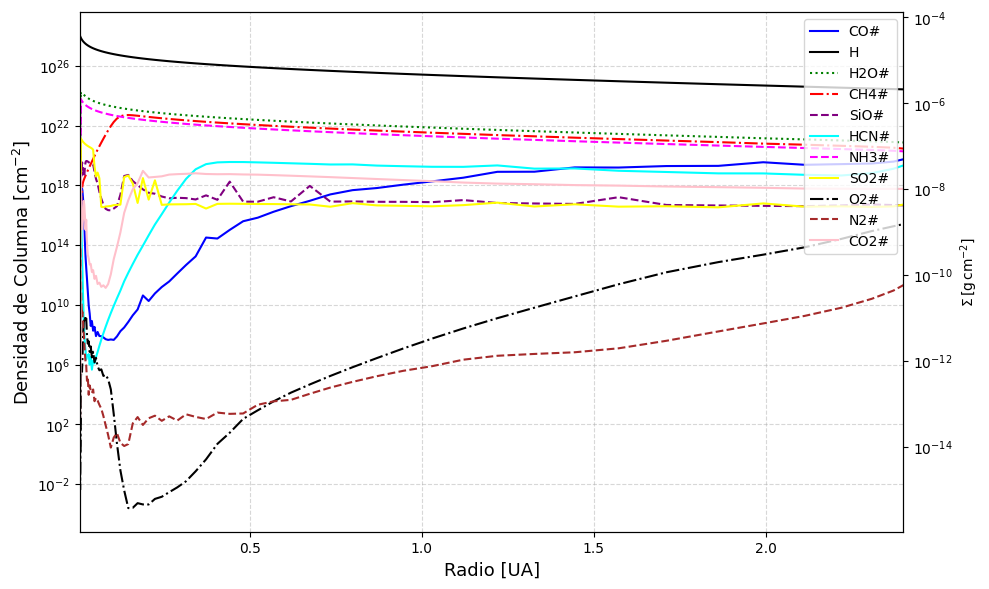

In [ ]:
i=0
for lab in labels:
    pp=pplot.Plot(None)
    pp.plot_cont(models[i], models[i].nHtot,'nHtot [cm-3]\n%s'%labels[i], xlog=False)
    #plt.savefig("H_number_density_%s.pdf"%lab)
    plt.xlabel(rlabel,fontsize=label_fontsize) 
    plt.ylabel(rylabel,fontsize=label_fontsize)
    plt.savefig("Hnumbredensity_nHtot_%s.pdf"%lab)
    plt.show()
    i=i+1 

In [17]:
import matplotlib.colors as mcolors
from matplotlib.colors import LogNorm, Normalize
from matplotlib.backends.backend_pdf import PdfPages
## Otros parámetros 'inferno', 'magma', 'autumn', 'hot', 'afmhot'
#cmap = 'inferno'
#cb_show = True
#cb_fraction = 0.15
#wl = 100

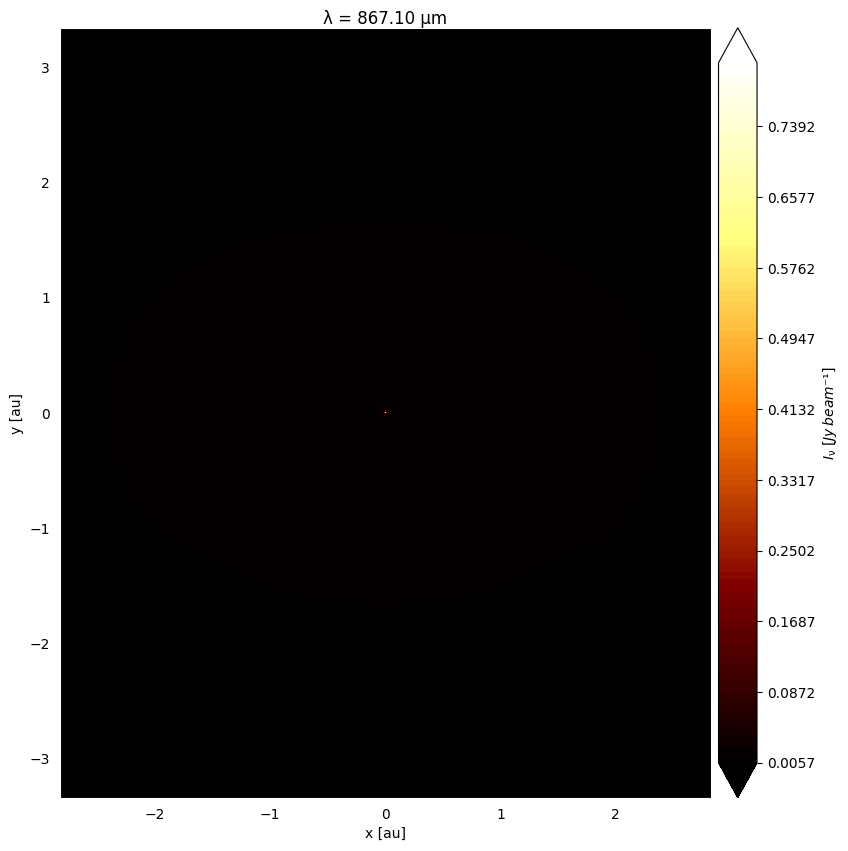

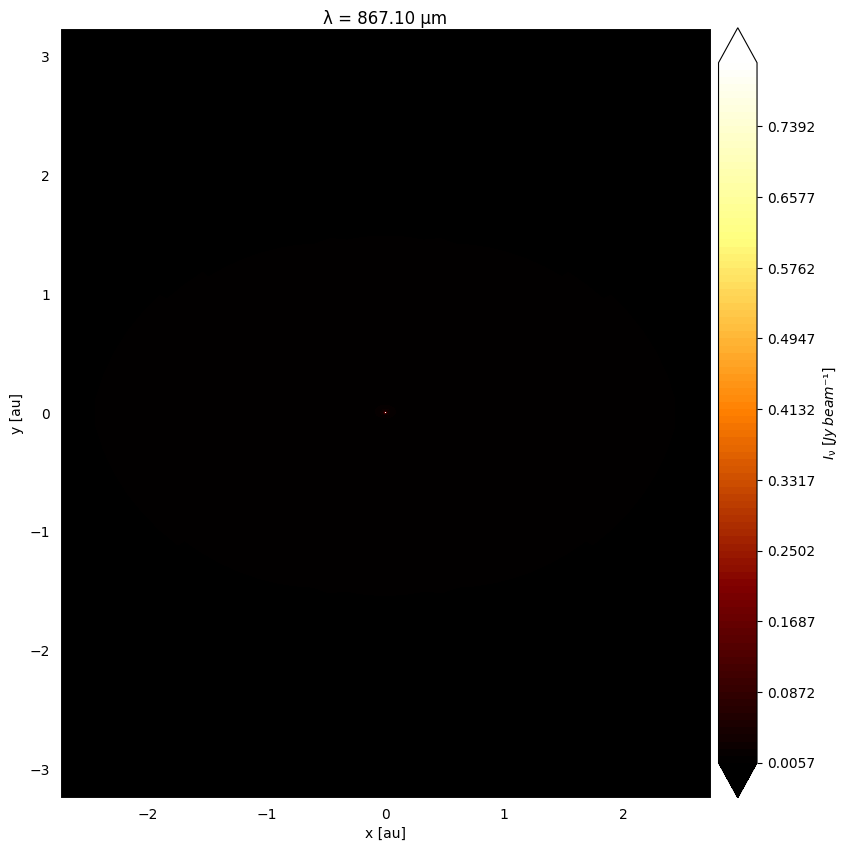

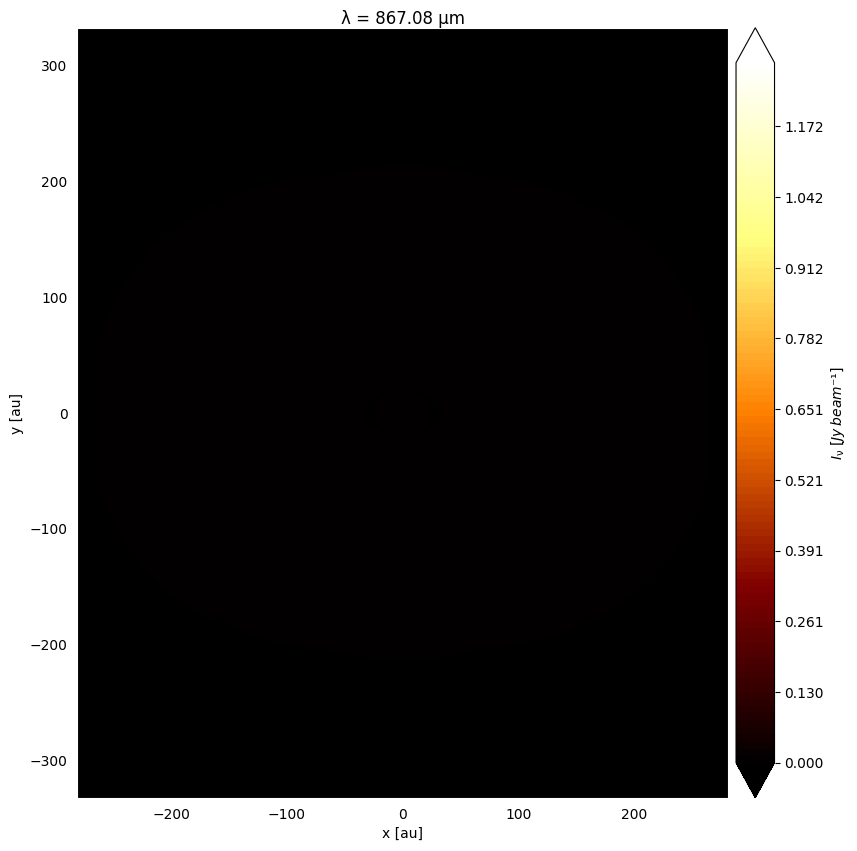

In [18]:
cmap = 'afmhot'
cb_show = True
cb_fraction = 0.15
wl = 855  # Usar la longitud de onda en micrómetros

# Beam de ALMA (continuum 855 μm): 74×57 mas
beam_maj_mas = 74.0
beam_min_mas = 57.0

# Convertir a arcsec
beam_maj_arcsec = beam_maj_mas / 1000.0
beam_min_arcsec = beam_min_mas / 1000.0

# Convertir FWHM a radianes
beam_maj_rad = np.deg2rad(beam_maj_arcsec / 3600.0)
beam_min_rad = np.deg2rad(beam_min_arcsec / 3600.0)

# Ángulo sólido del beam
Omega_beam = np.pi * beam_maj_rad * beam_min_rad / (4 * np.log(2))

# Bucle principal
i = 0
for lab in labels:
    contImages = models[i].contImages
    image, wl_used = contImages.getImage(wl)

    # Extender la matriz para cerrar contornos
    x = np.hstack((contImages.x, contImages.x[:, :1]))
    y = np.hstack((contImages.y, contImages.y[:, :1]))
    imagepl = np.hstack((image, image[:, :1]))

    # Conversión cgs → Jy/beam
    image_jybeam = imagepl * Omega_beam * 1e23

    # (Opcional)  en mJy/beam
    #image_mjybeam = image_jybeam * 1e3

    # Definir escalas lineal o log (lineal):
    vmax = np.max(image_jybeam)
    vmin = np.min(image_jybeam[image_jybeam>0])
    norm  = Normalize(vmin=vmin, vmax=vmax)
    levels = np.linspace(vmin, vmax, 100)

    fig, ax = plt.subplots(figsize=(10, 10))

    CS = ax.contourf(         x, y, image_jybeam,         norm=norm,         levels=levels,         cmap=cmap,        extend="both"    )

    ax.set_facecolor("black")
    ax.axis("equal")
    ax.set_xlim(x.min(), x.max())
    ax.set_ylim(y.min(), y.max())
    ax.set_xlabel("x [au]")
    ax.set_ylabel("y [au]")
    ax.set_title(f"λ = {wl_used:6.2f} μm", pad=0)

    for spine in ax.spines.values():
        spine.set_color('white')
    ax.tick_params(color='white', which='both')

    if cb_show:
        CB = fig.colorbar(CS, ax=ax, pad=0.01, fraction=cb_fraction)
        CB.set_label(r"$I_\mathrm{\nu}\ [Jy beam⁻¹]$")

    plt.show()
    i += 1

In [19]:
print("vmin, vmax =", vmin, vmax)
print("min/max image_units:", image_units.min(), image_units.max())

vmin, vmax = 1.470484245520961e-05 1.289622546873998
min/max image_units: 0.00010395615896142836 139.52188181337155


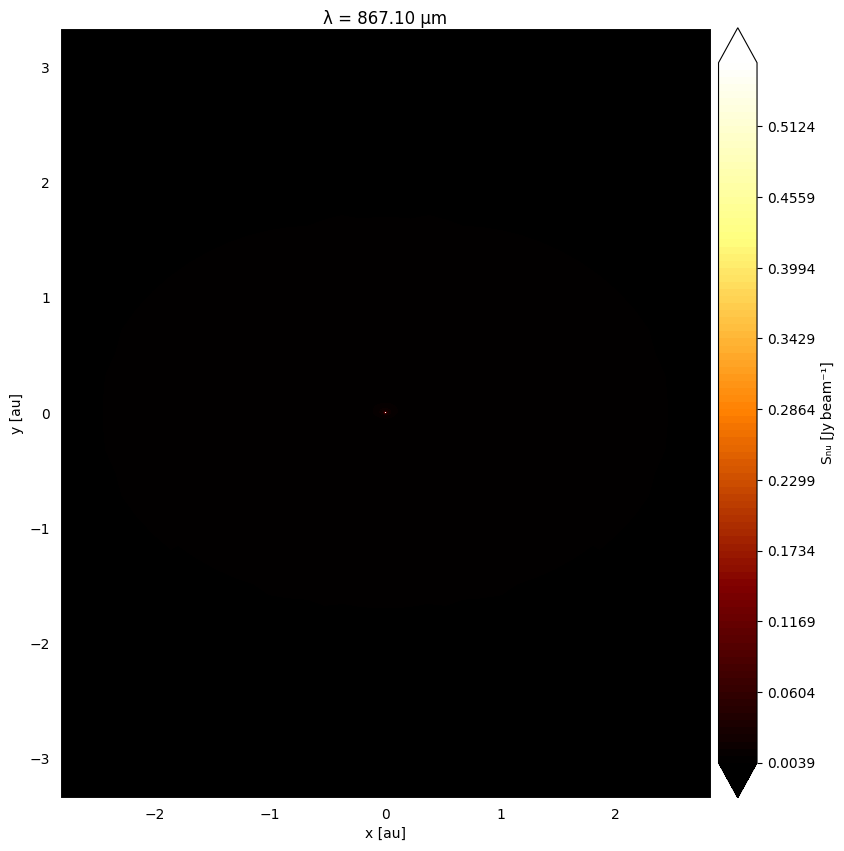

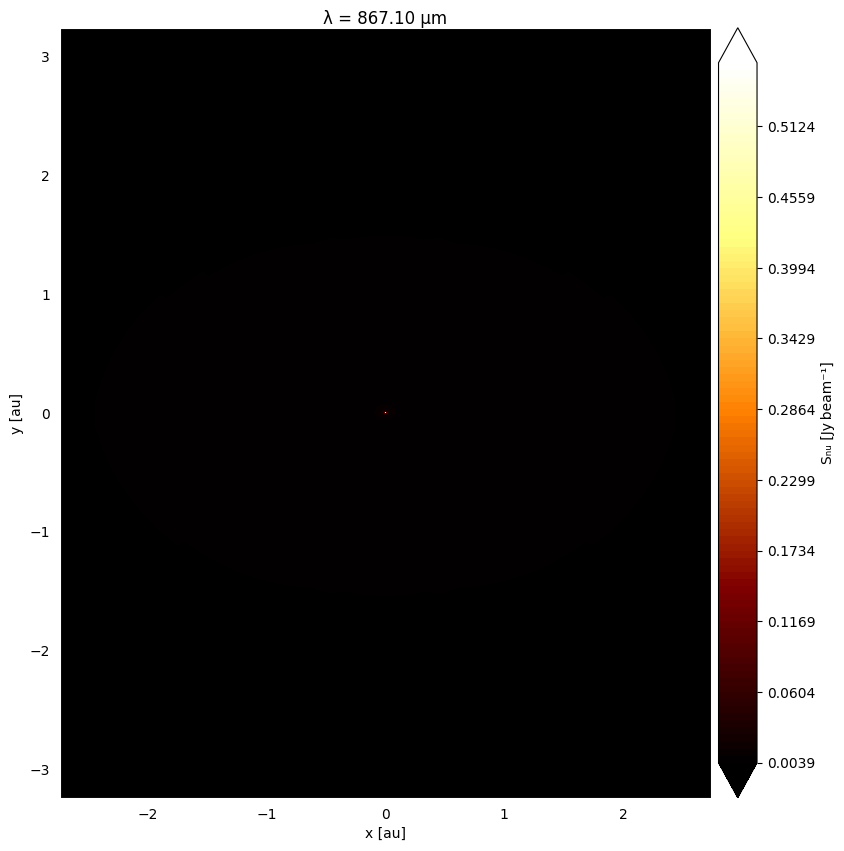

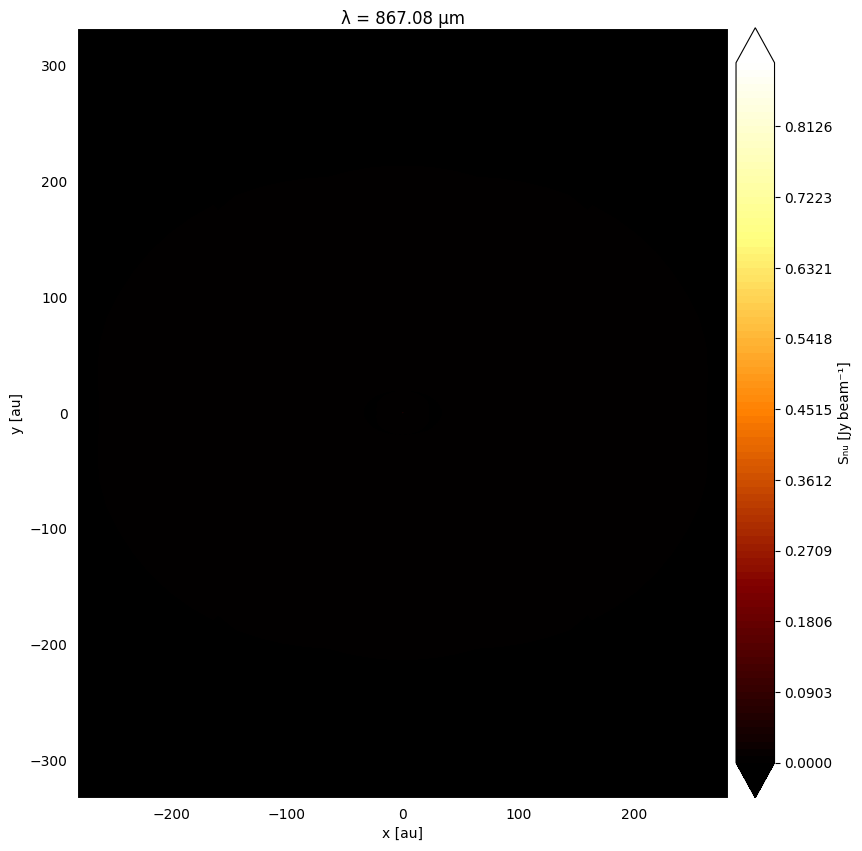

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize

# Parámetros de plotting
cmap        = 'afmhot'
cb_show     = True
cb_fraction = 0.15
wl          = 855  # μm

# Beam de ALMA (continuum 855 μm): 74×57 mas
beam_maj_mas    = 74.0
beam_min_mas    = 57.0

# Convertir FWHM a radianes
beam_maj_rad = np.deg2rad((beam_maj_mas/1000.0) / 3600.0)
beam_min_rad = np.deg2rad((beam_min_mas/1000.0) / 3600.0)

# Ángulo sólido del beam (aprox. π/4·θ_maj·θ_min)
Omega_beam = (np.pi / 4.0) * beam_maj_rad * beam_min_rad  # sr

# Opcional: límites manuales en au, o [None, None] para auto–escalado
rlim = [None, None]

for i, lab in enumerate(labels):
    contImages     = models[i].contImages
    image_cgs, wl_used = contImages.getImage(wl)

    # Cerrar contornos
    x       = np.hstack((contImages.x, contImages.x[:, :1]))
    y       = np.hstack((contImages.y, contImages.y[:, :1]))
    imagepl = np.hstack((image_cgs,    image_cgs[:, :1]))

    # Conversión cgs → Jy/beam
    image_jybeam = imagepl * Omega_beam * 1e23

    # Definir vmin/vmax
    positive = image_jybeam[image_jybeam > 0]
    vmin = positive.min()
    vmax = positive.max()

    norm   = Normalize(vmin=vmin, vmax=vmax)
    levels = np.linspace(vmin, vmax, 100)

    fig, ax = plt.subplots(figsize=(10, 10))

    CS = ax.contourf(
        x, y, image_jybeam,
        norm=norm,
        levels=levels,
        cmap=cmap,
        extend="both"
    )

    ax.set_facecolor("black")
    ax.axis("equal")

    # Aplicar límites: si rlim está definido, úsalo; si no, auto-escala según datos
    if rlim[0] is not None and rlim[1] is not None:
        ax.set_xlim(rlim)
        ax.set_ylim(rlim)
    else:
        ax.set_xlim(x.min(), x.max())
        ax.set_ylim(y.min(), y.max())

    ax.set_xlabel("x [au]")
    ax.set_ylabel("y [au]")
    ax.set_title(f"λ = {wl_used:6.2f} μm", pad=0)

    for spine in ax.spines.values():
        spine.set_color('white')
    ax.tick_params(color='white', which='both')

    if cb_show:
        CB = fig.colorbar(CS, ax=ax, pad=0.01, fraction=cb_fraction)
        CB.set_label("Sₙᵤ [Jy beam⁻¹]")

    plt.show()
i += 1

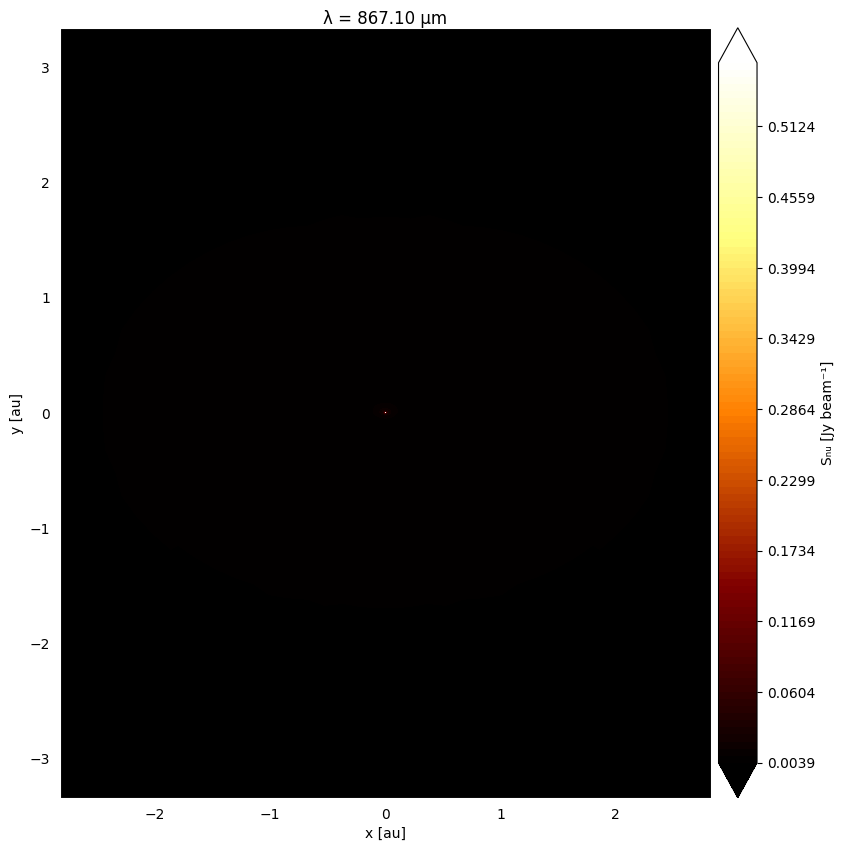

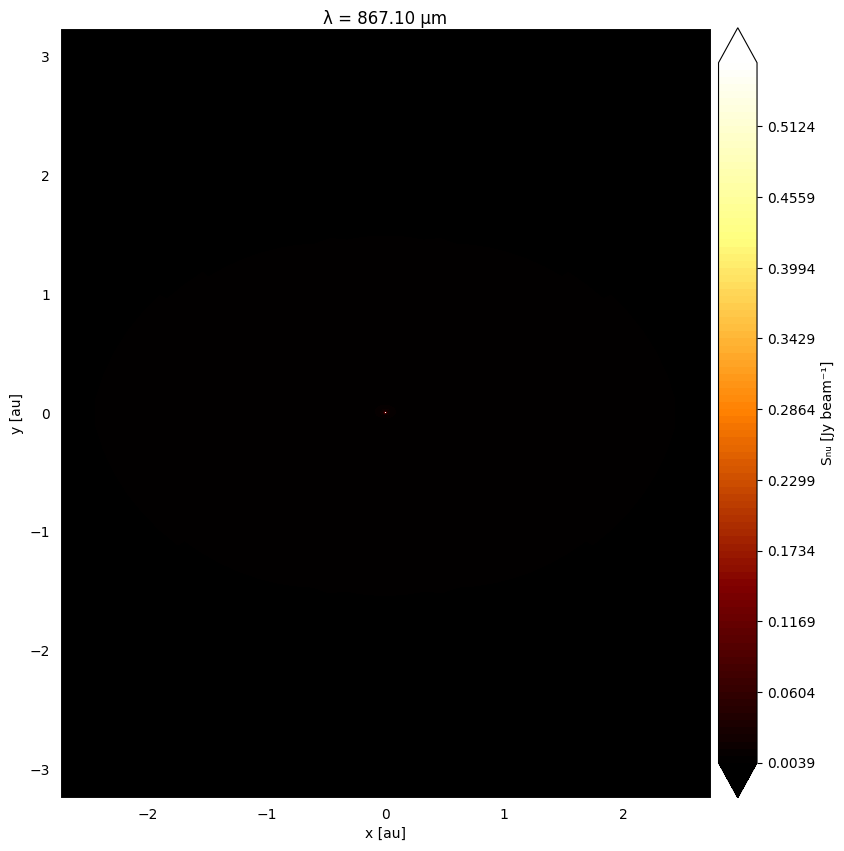

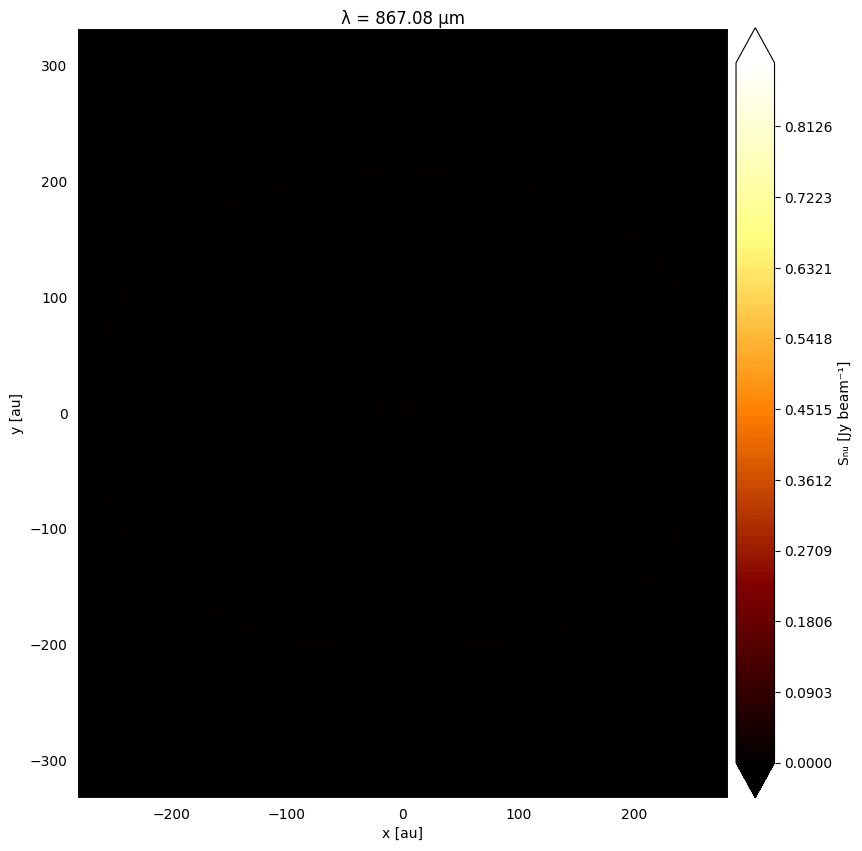

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize

# Parámetros de plotting
cmap        = 'afmhot'
cb_show     = True
cb_fraction = 0.15
wl          = 855  # μm

# Beam de ALMA (continuum 855 μm): 74×57 mas
beam_maj_mas    = 74.0
beam_min_mas    = 57.0

# Convertir FWHM a radianes
beam_maj_rad = np.deg2rad((beam_maj_mas/1000.0) / 3600.0)
beam_min_rad = np.deg2rad((beam_min_mas/1000.0) / 3600.0)

# Ángulo sólido del beam con la fórmula π/4·θ_maj·θ_min
Omega_beam = (np.pi / 4.0) * beam_maj_rad * beam_min_rad  # en sr

for i, lab in enumerate(labels):
    contImages    = models[i].contImages
    image_cgs, wl_used = contImages.getImage(wl)

    # Extender la matriz para cerrar contornos
    x       = np.hstack((contImages.x, contImages.x[:, :1]))
    y       = np.hstack((contImages.y, contImages.y[:, :1]))
    imagepl = np.hstack((image_cgs,    image_cgs[:, :1]))

    # Conversión cgs → Jy/beam
    #    1 Jy = 1e−23 erg·cm⁻²·s⁻¹·Hz⁻¹
    image_jybeam = imagepl * Omega_beam * 1e23

    # Definición de vmin/vmax en Jy/beam
    positive = image_jybeam[image_jybeam > 0]
    vmin = positive.min()
    vmax = positive.max()

    # Normalización lineal
    norm   = Normalize(vmin=vmin, vmax=vmax)
    levels = np.linspace(vmin, vmax, 100)

    fig, ax = plt.subplots(figsize=(10, 10))

    # Dibujar contornos en Jy/beam
    CS = ax.contourf(
        x, y, image_jybeam,
        norm=norm,
        levels=levels,
        cmap=cmap,
        extend="both"
    )

    # Estética
    ax.set_facecolor("black")
    ax.axis("equal")
    ax.set_xlim(x.min(), x.max())
    ax.set_ylim(y.min(), y.max())
    ax.set_xlabel("x [au]")
    ax.set_ylabel("y [au]")
    ax.set_title(f"λ = {wl_used:6.2f} μm", pad=0)
    for spine in ax.spines.values():
        spine.set_color('white')
    ax.tick_params(color='white', which='both')

    # Colorbar en Jy/beam
    if cb_show:
        CB = fig.colorbar(CS, ax=ax, pad=0.01, fraction=cb_fraction)
        CB.set_label("Sₙᵤ [Jy beam⁻¹]")

    plt.show()

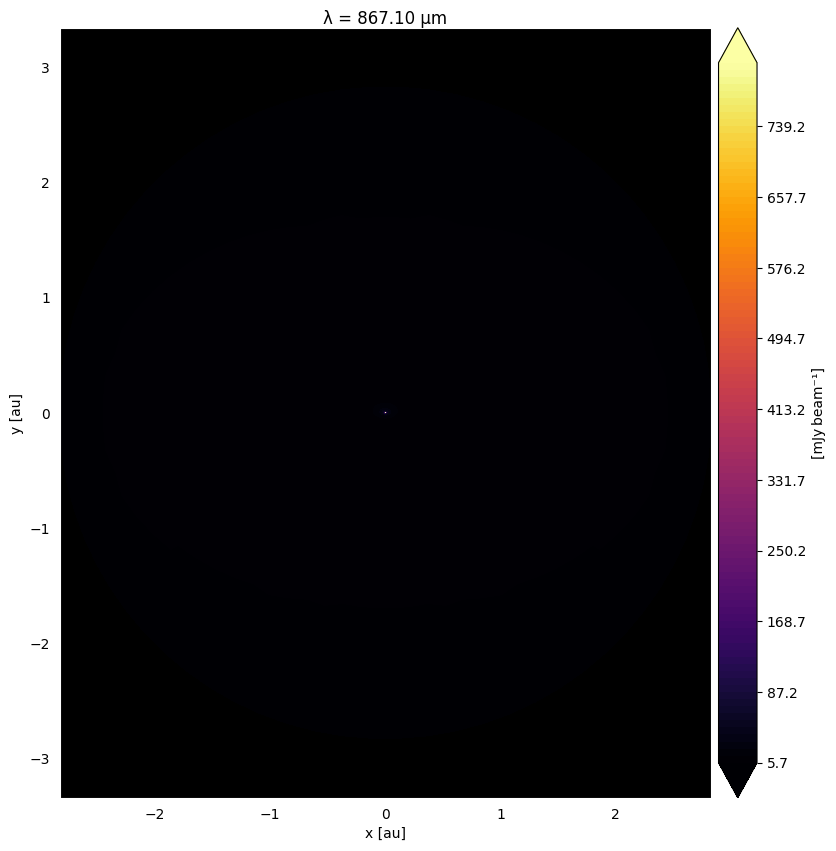

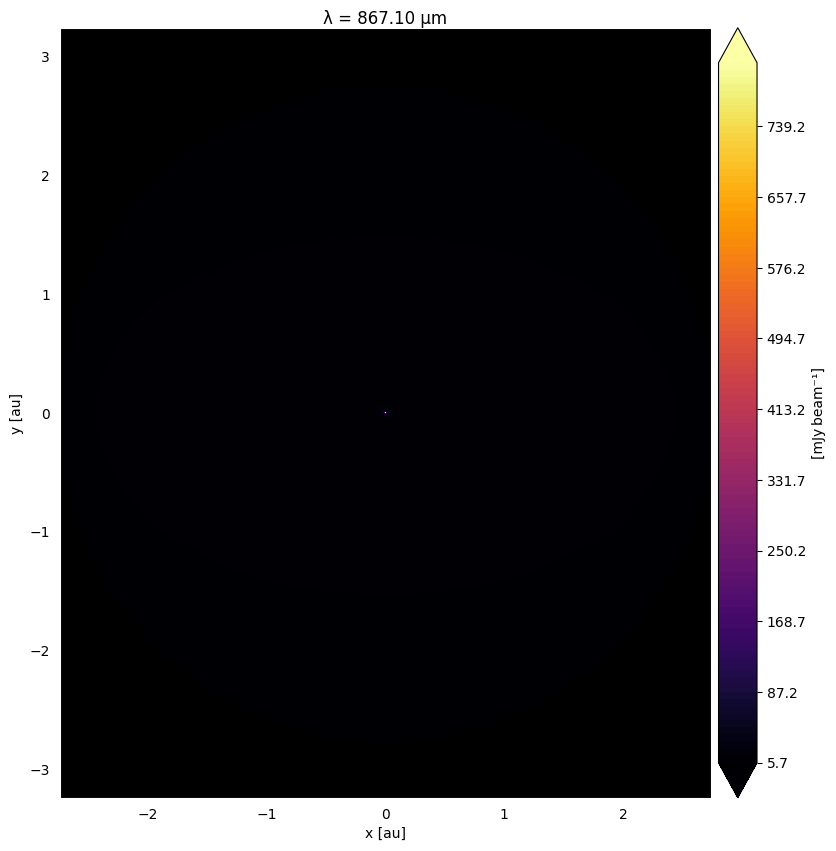

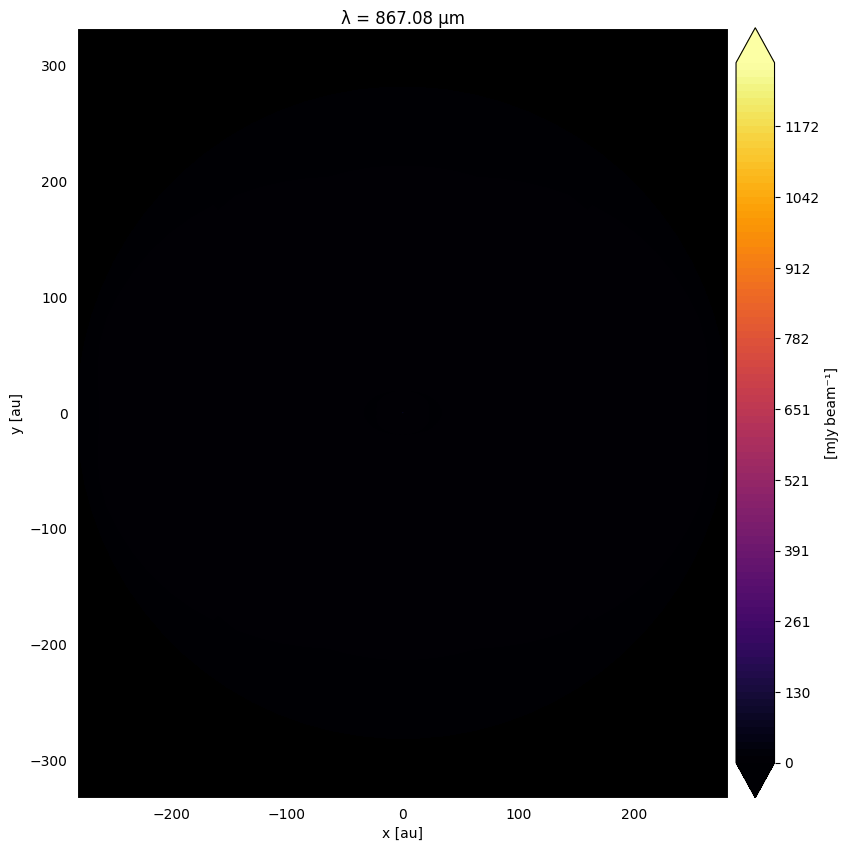

In [22]:
# Parámetros físicos y de plotting
c = 3e10               # cm/s, velocidad de la luz (no usado en este fragmento)
cmap = 'inferno'
cb_show = True
cb_fraction = 0.15
wl = 855               # longitud de onda en micrómetros

# Beam de ALMA (continuum 855 μm): 74×57 mas
beam_maj_mas = 74.0
beam_min_mas = 57.0
beam_maj_arcsec = beam_maj_mas / 1000.0
beam_min_arcsec = beam_min_mas / 1000.0
beam_maj_rad = np.deg2rad(beam_maj_arcsec / 3600.0)
beam_min_rad = np.deg2rad(beam_min_arcsec / 3600.0)
Omega_beam = np.pi * beam_maj_rad * beam_min_rad / (4 * np.log(2))  # sr

# Suponemos que 'labels' y 'models' ya están definidos en tu entorno
for i, lab in enumerate(labels):
    contImages = models[i].contImages

    # 1) Obtención de la imagen en cgs
    image_cgs, wl_used = contImages.getImage(wl)

    # 2) Extender la matriz para cerrar contornos
    x = np.hstack((contImages.x, contImages.x[:, :1]))
    y = np.hstack((contImages.y, contImages.y[:, :1]))
    imagepl = np.hstack((image_cgs, image_cgs[:, :1]))

    # 3) Conversión cgs → Jy/beam → mJy/beam
    image_jybeam = imagepl * Omega_beam * 1e23     # erg→Jy
    image_mjybeam = image_jybeam * 1e3             # Jy→mJy

    # 4) Cálculo de vmin/vmax evitando ceros negativos para escala log o lineal
    positive = image_mjybeam[image_mjybeam > 0]
    vmin = np.min(positive)
    vmax = np.max(positive)

    # 5) Crear figura y ejes
    fig, ax = plt.subplots(figsize=(10, 10))

    # 6) Normalización lineal y niveles uniformes
    norm   = Normalize(vmin=vmin, vmax=vmax)
    levels = np.linspace(vmin, vmax, 100)

    # 7) Dibujo de los contornos
    CS = ax.contourf(
        x, y, image_mjybeam,
        norm=norm,
        levels=levels,
        cmap=cmap,
        extend="both"
    )

    # 8) Estética y etiquetas
    ax.set_facecolor("black")
    ax.axis("equal")
    ax.set_xlim(x.min(), x.max())
    ax.set_ylim(y.min(), y.max())
    ax.set_xlabel("x [au]")
    ax.set_ylabel("y [au]")
    ax.set_title(f"λ = {wl_used:6.2f} μm", pad=0)

    for spine in ax.spines.values():
        spine.set_color('white')
    ax.tick_params(color='white', which='both')

    # 9) Barra de color en mJy/beam
    if cb_show:
        CB = fig.colorbar(CS, ax=ax, pad=0.01, fraction=cb_fraction)
        CB.set_label("[mJy beam⁻¹]")

    # 10) Mostrar o guardar
    # plt.savefig(f"mod_{lab}.pdf", dpi=300, bbox_inches='tight')
    plt.show()

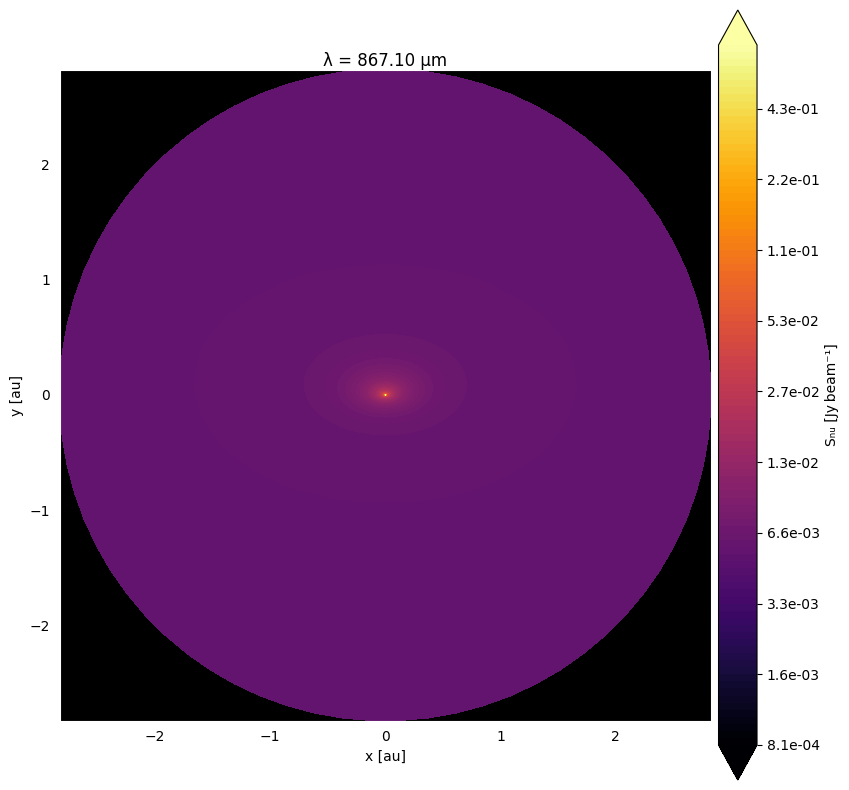

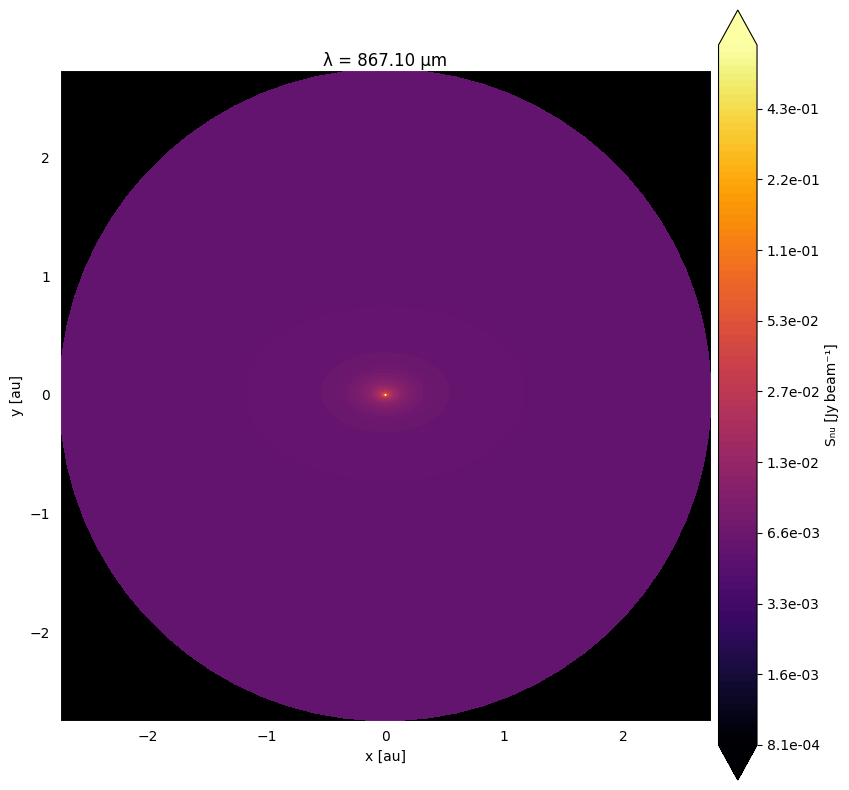

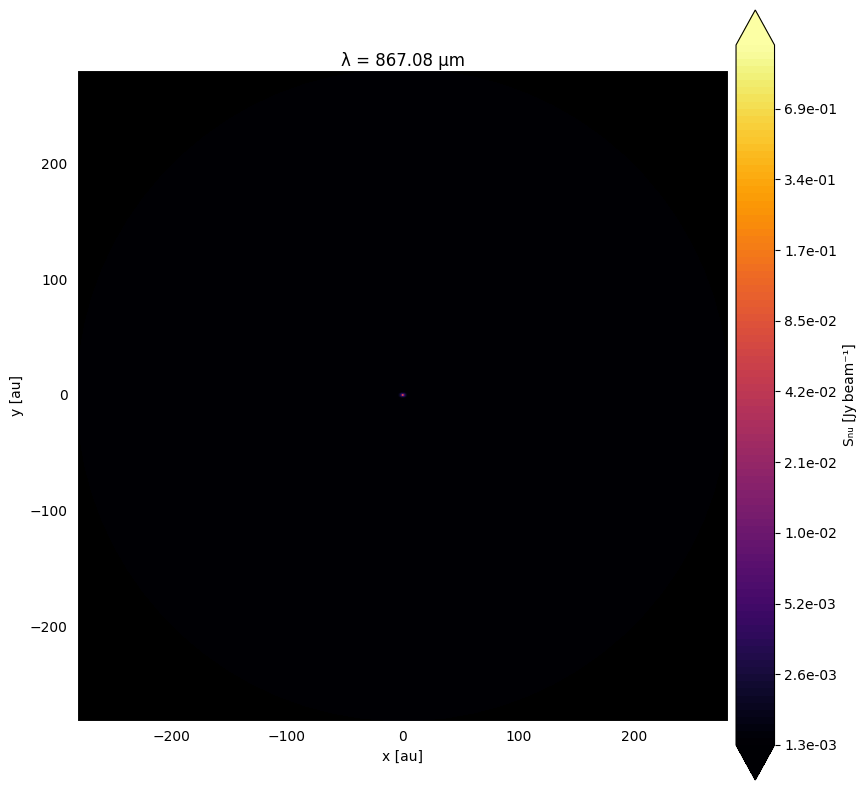

In [27]:
# Parámetros de plotting
c = 3e10                    # cm/s
cmap        = 'inferno'
cb_show     = True
cb_fraction = 0.15
wl          = 855  # μm

# Selección de unidades: "cgs", "jy" o "mjy"
units = "jy"

# Si usamos Jy o mJy, definimos el beam de ALMA
beam_maj_mas   = 74.0  # en mas
beam_min_mas   = 57.0
beam_maj_arcsec = beam_maj_mas / 1000.0
beam_min_arcsec = beam_min_mas / 1000.0
maj_rad        = np.deg2rad(beam_maj_arcsec / 3600.0)
min_rad        = np.deg2rad(beam_min_arcsec / 3600.0)
Omega_beam     = np.pi * maj_rad * min_rad / (4 * np.log(2))  # sr

i = 0
for lab in labels:
    contImages = models[i].contImages
    original_wl = wl
    image_cgs, wl_used = contImages.getImage(wl)

    # cerrar contornos
    x       = np.hstack((contImages.x, contImages.x[:, :1]))
    y       = np.hstack((contImages.y, contImages.y[:, :1]))
    imagepl = np.hstack((image_cgs,    image_cgs[:, :1]))

    # conversión de unidades
    if units.lower() == "jy":
        image_units = imagepl * Omega_beam * 1e23
        cb_label    = "Sₙᵤ [Jy beam⁻¹]"
    elif units.lower() == "mjy":
        image_units = imagepl * Omega_beam * 1e23 * 1e3
        cb_label    = "Sₙᵤ [mJy beam⁻¹]"
    else:
        image_units = imagepl
        cb_label    = r"$I_\nu\,[\mathrm{erg\,cm^{-2}\,s^{-1}\,Hz^{-1}\,sr^{-1}}]$"

    # reescalamiento manual
    vmax = np.max(image_units)
    vmin = vmax / 1e3

    fig, ax = plt.subplots(figsize=(10, 10))

    norm   = LogNorm(vmin=vmin, vmax=vmax)
    levels = np.logspace(np.log10(vmin), np.log10(vmax), 100)

    CS = ax.contourf(
        x, y, image_units,
        norm=norm,
        cmap=cmap,
        levels=levels,
        extend="both"
    )

    ax.set_facecolor("black")
    ax.axis("equal")
    ax.set_xlim(x.min(), x.max())
    ax.set_ylim(y.min(), y.max())
    ax.set_aspect('equal', 'box')
    ax.set_xlabel("x [au]")
    ax.set_ylabel("y [au]")
    ax.set_title(f"λ = {wl_used:6.2f} μm", pad=0)

    for spine in ax.spines.values():
        spine.set_color('white')
    ax.tick_params(color='white', which='both')

    if cb_show:
        CB = fig.colorbar(CS, ax=ax, pad=0.01, fraction=cb_fraction, format="%3.1e")
        CB.set_label(cb_label)

    plt.savefig(f"mod_{lab}.pdf", dpi=300, bbox_inches='tight')
    plt.show()

    i += 1

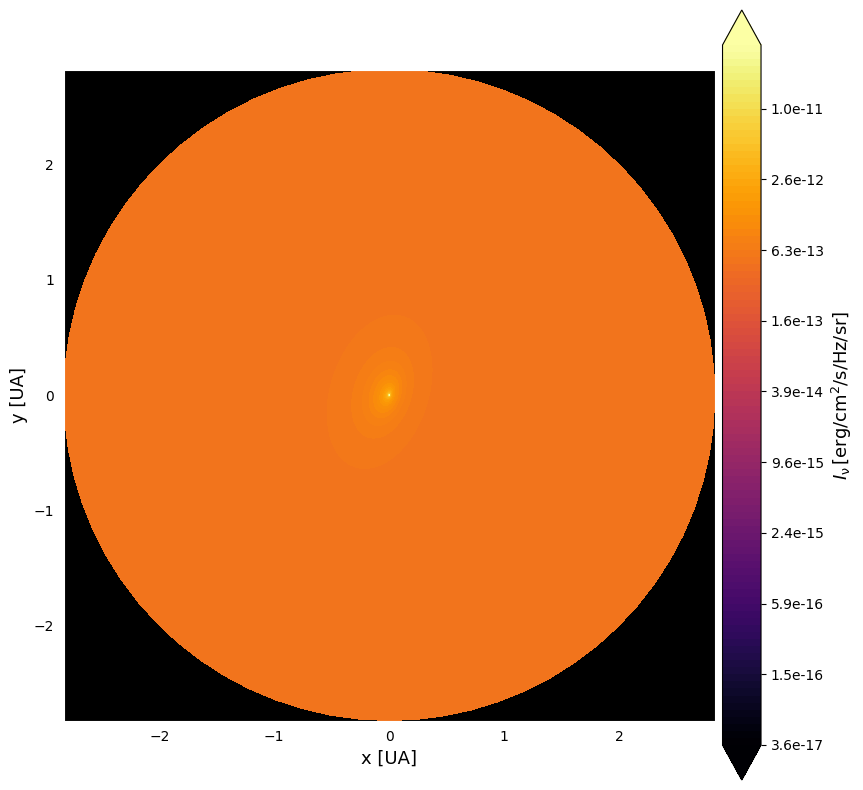

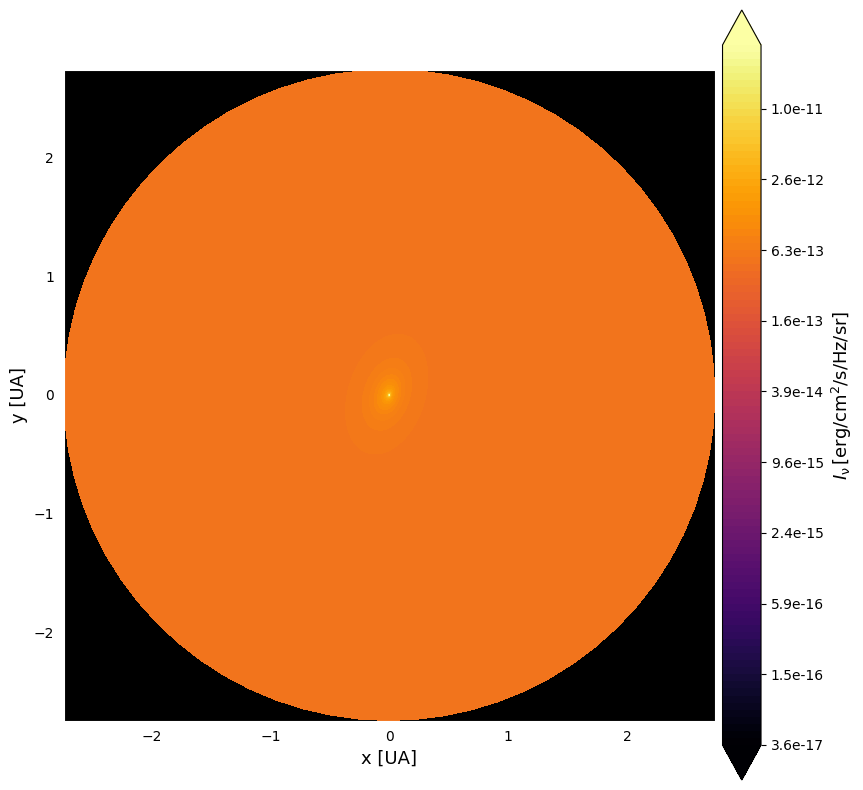

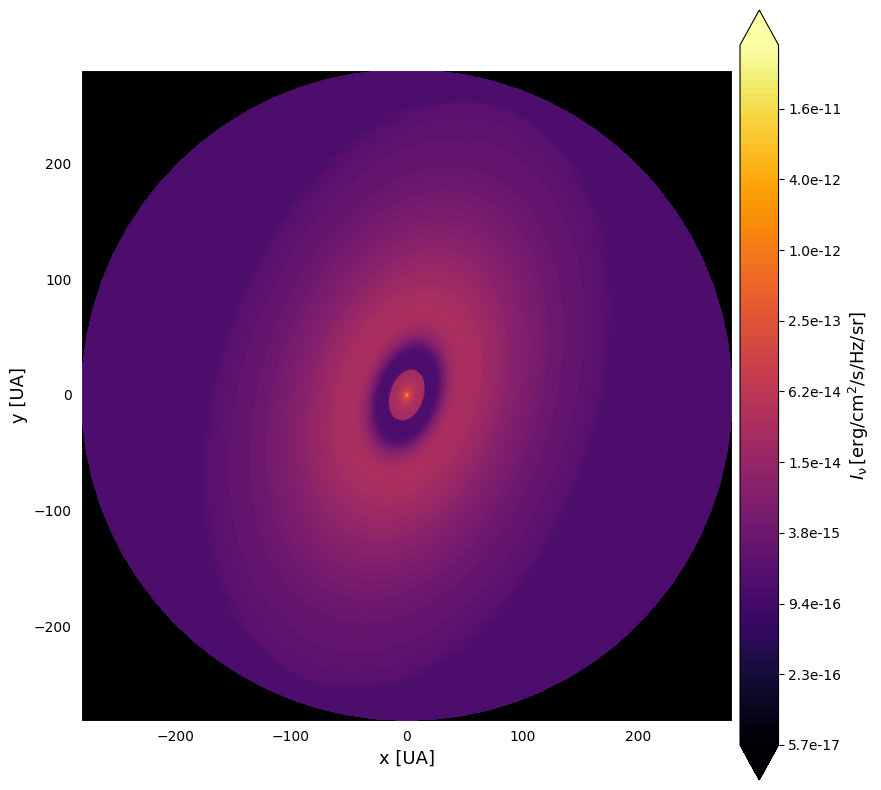

In [24]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Constantes
c = 3e10  # Velocidad de la luz en cm/s

# Otros parámetros 'inferno', 'magma', 'autumn', 'hot', 'afmhot'
cmap = 'inferno'
cb_show = True
cb_fraction = 0.15
wl = 855  # Usar la longitud de onda en micrómetros

# Ángulo de rotación en radianes
angle = np.radians(72)

# Matriz de rotación
rotation_matrix = np.array([[np.cos(angle), -np.sin(angle)],
                             [np.sin(angle),  np.cos(angle)]])

i = 0
for lab in labels:
    contImages = models[i].contImages
    original_wl = wl
    image, wl = contImages.getImage(wl)

    # Extender la matriz para cerrar la imagen en la visualización de contornos
    x = np.hstack((contImages.x, contImages.x[:, 0:1]))
    y = np.hstack((contImages.y, contImages.y[:, 0:1]))
    imagepl = np.hstack((image, image[:, 0:1]))

    # Rotar las coordenadas x, y
    coords = np.array([x.ravel(), y.ravel()])
    rotated_coords = np.dot(rotation_matrix, coords)
    x_rotated = rotated_coords[0, :].reshape(x.shape)
    y_rotated = rotated_coords[1, :].reshape(y.shape)

    vmax = np.max(imagepl) / 2.0
    vmin = vmax / 1.e6

    fig, ax = plt.subplots(1, 1, figsize=(10, 10))

    norm = mcolors.LogNorm(vmin=vmin, vmax=vmax)
    levels = np.logspace(np.log10(vmin), np.log10(vmax), 100)

    CS = ax.contourf(x_rotated, y_rotated, imagepl, norm=norm, cmap=cmap, levels=levels, extend="both")

    # Cambiar el color de fondo y otros ajustes
    ax.set_facecolor("black")
    ax.axis("equal")

    # Ajustar automáticamente los límites de los ejes x e y
    ax.set_xlim(x_rotated.min(), x_rotated.max())
    ax.set_ylim(y_rotated.min(), y_rotated.max())
    ax.set_aspect('equal', 'box')
    ax.set_xlabel("x [UA]", fontsize=13)
    ax.set_ylabel("y [UA]", fontsize=13)
    #ax.set_title(r"$\lambda= {:6.2f}\, \mu m$".format(wl), pad=0)
    
    for spine in ax.spines.values():
        spine.set_color('white')
    ax.tick_params(color='white', which='both')

    if cb_show:
        axcb = np.array(fig.get_axes()).ravel().tolist()
        CB = fig.colorbar(CS, ax=axcb, pad=0.01, format="%3.1e", fraction=cb_fraction)
        CB.set_label(r"$I_\mathrm{\nu}\,[\mathrm{erg/cm^2/s/Hz/sr}]$", fontsize=13)

    # Guardar la figura
    plt.savefig("mod_%s.pdf" % lab)

    # Mostrar la figura
    plt.show()
    
    i += 1

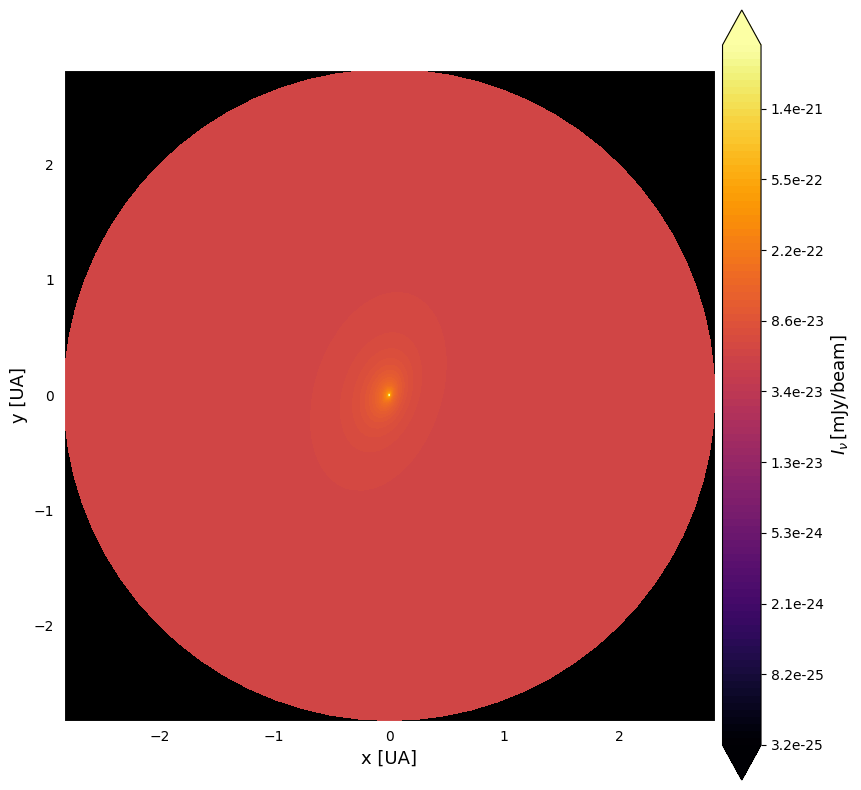

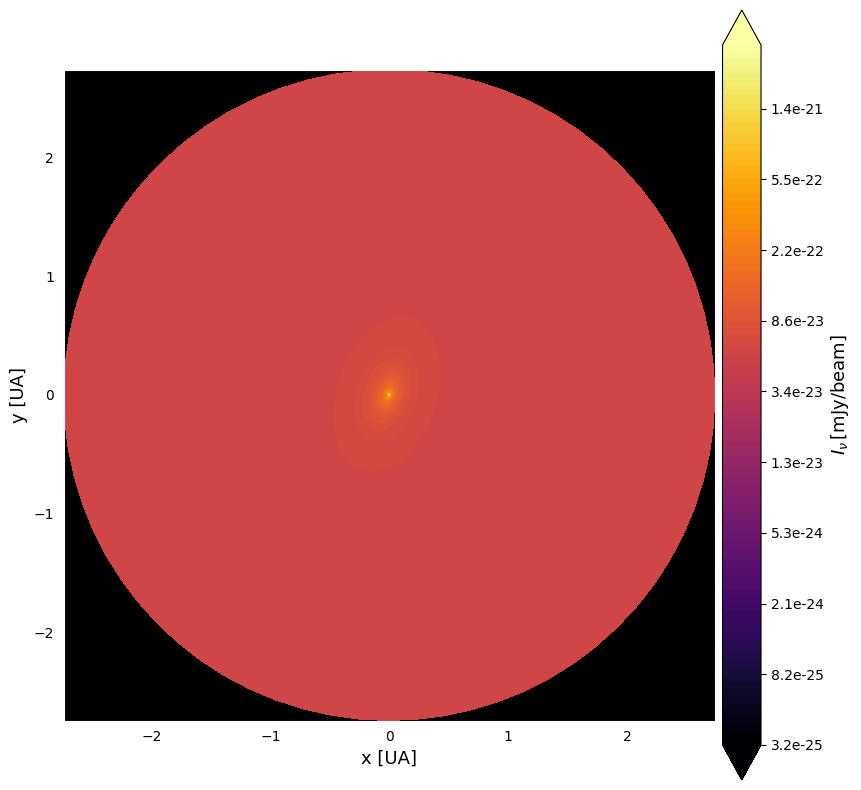

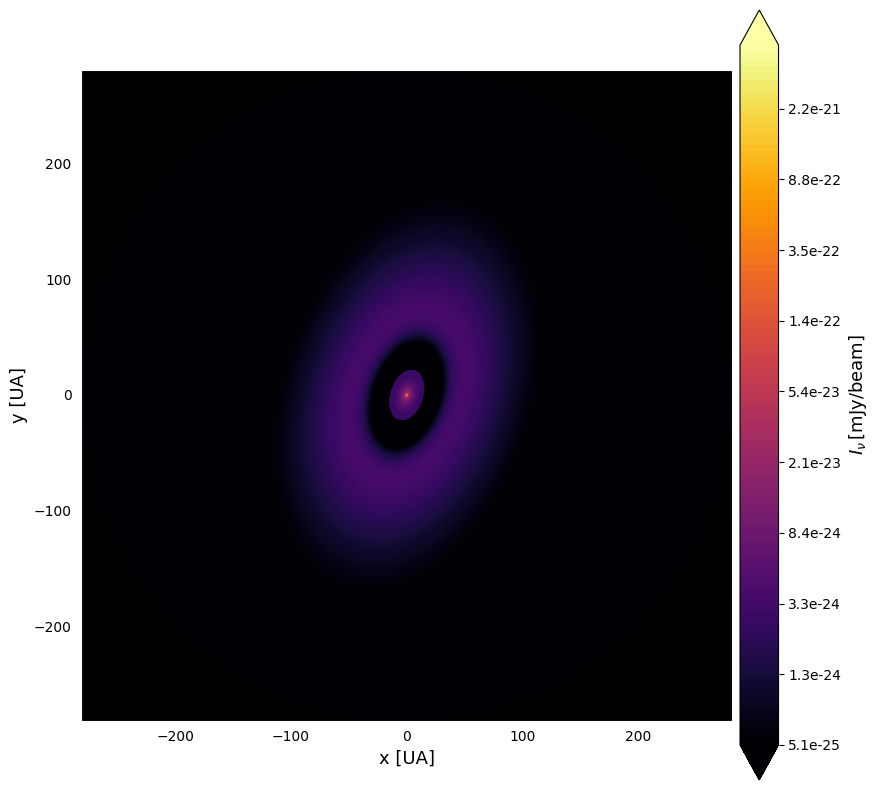

In [25]:
# Constantes
conversion_factor = 1.12e-10  # erg/cm^2/s/Hz/sr -> mJy/beam
c = 3e10  # Velocidad de la luz en cm/s

# Otros parámetros
cmap = 'inferno'
cb_show = True
cb_fraction = 0.15
wl = 855  # Longitud de onda en micrómetros (Band 7 ALMA)

# Ángulo de rotación en radianes
angle = np.radians(72)
rotation_matrix = np.array([[np.cos(angle), -np.sin(angle)],
                            [np.sin(angle),  np.cos(angle)]])

# Asegúrate de definir estas variables antes de ejecutar el script
# labels = ['PPD', 'CPD_bajamasa', 'CPD_altamasa']
# models = [model0, model1, model2]

for i, lab in enumerate(labels):
    contImages = models[i].contImages
    original_wl = wl
    image, wl = contImages.getImage(wl)

    # Extender la matriz para cerrar la imagen en la visualización de contornos
    x = np.hstack((contImages.x, contImages.x[:, 0:1]))
    y = np.hstack((contImages.y, contImages.y[:, 0:1]))
    imagepl = np.hstack((image, image[:, 0:1]))

    # Convertir a unidades de mJy/beam
    imagepl_mJy_beam = imagepl * conversion_factor

    # Rotar las coordenadas x, y
    coords = np.array([x.ravel(), y.ravel()])
    rotated_coords = np.dot(rotation_matrix, coords)
    x_rotated = rotated_coords[0, :].reshape(x.shape)
    y_rotated = rotated_coords[1, :].reshape(y.shape)

    vmax = np.max(imagepl_mJy_beam) / 2.5
    vmin = vmax / 1.e4

    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    norm = mcolors.LogNorm(vmin=vmin, vmax=vmax)
    levels = np.logspace(np.log10(vmin), np.log10(vmax), 100)

    CS = ax.contourf(x_rotated, y_rotated, imagepl_mJy_beam, norm=norm, cmap=cmap, levels=levels, extend="both")

    ax.set_facecolor("black")
    ax.axis("equal")
    ax.set_xlim(x_rotated.min(), x_rotated.max())
    ax.set_ylim(y_rotated.min(), y_rotated.max())
    ax.set_aspect('equal', 'box')
    ax.set_xlabel("x [UA]", fontsize=13)
    ax.set_ylabel("y [UA]", fontsize=13)

    for spine in ax.spines.values():
        spine.set_color('white')
    ax.tick_params(color='white', which='both')

    if cb_show:
        CB = fig.colorbar(CS, ax=ax, pad=0.01, format="%3.1e", fraction=cb_fraction)
        CB.set_label(r"$I_\nu\,[\mathrm{mJy/beam}]$", fontsize=13)

    plt.savefig(f"mod_mJybeam_{lab}.pdf")
    plt.show()

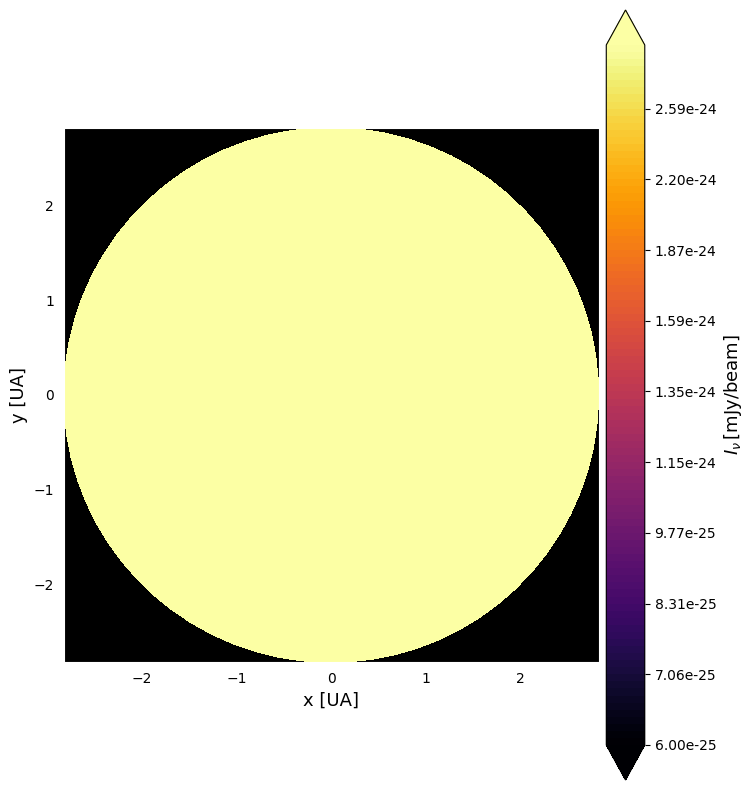

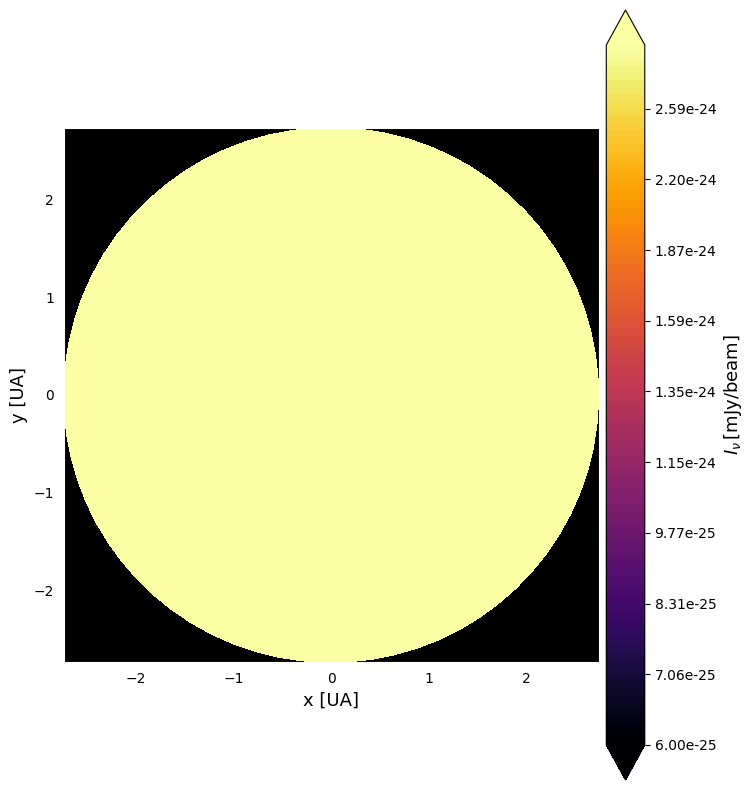

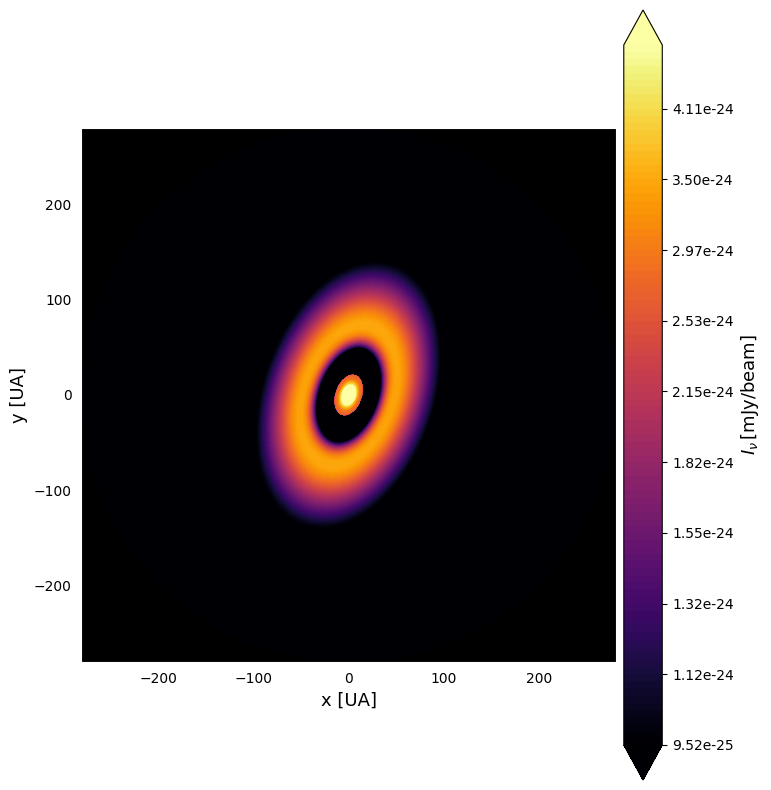

In [20]:
# Constantes
conversion_factor = 1.12e-10  # erg/cm^2/s/Hz/sr -> mJy/beam
c = 3e10  # Velocidad de la luz en cm/s

# Otros parámetros
cmap = 'inferno'
cb_show = True
cb_fraction = 0.3
wl = 855  # Longitud de onda en micrómetros (Band 7 ALMA)

# Ángulo de rotación en radianes
angle = np.radians(71)
rotation_matrix = np.array([[np.cos(angle), -np.sin(angle)],
                            [np.sin(angle),  np.cos(angle)]])

# Asegúrate de definir estas variables antes de ejecutar el script
# labels = ['PPD', 'CPD_bajamasa', 'CPD_altamasa']
# models = [model0, model1, model2]

for i, lab in enumerate(labels):
    contImages = models[i].contImages
    original_wl = wl
    image, wl = contImages.getImage(wl)

    # Extender la matriz para cerrar la imagen en la visualización de contornos
    x = np.hstack((contImages.x, contImages.x[:, 0:1]))
    y = np.hstack((contImages.y, contImages.y[:, 0:1]))
    imagepl = np.hstack((image, image[:, 0:1]))

    # Convertir a unidades de mJy/beam
    imagepl_mJy_beam = imagepl * conversion_factor

    # Rotar las coordenadas x, y
    coords = np.array([x.ravel(), y.ravel()])
    rotated_coords = np.dot(rotation_matrix, coords)
    x_rotated = rotated_coords[0, :].reshape(x.shape)
    y_rotated = rotated_coords[1, :].reshape(y.shape)

    vmax = np.max(imagepl_mJy_beam)/2700
    vmin = vmax/5

    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    norm = mcolors.LogNorm(vmin=vmin, vmax=vmax)
    levels = np.logspace(np.log10(vmin), np.log10(vmax), 100)

    CS = ax.contourf(x_rotated, y_rotated, imagepl_mJy_beam, norm=norm, cmap=cmap, levels=levels, extend="both")

    ax.set_facecolor("black")
    ax.axis("equal")
    ax.set_xlim(x_rotated.min(), x_rotated.max())
    ax.set_ylim(y_rotated.min(), y_rotated.max())
    ax.set_aspect('equal', 'box')
    ax.set_xlabel("x [UA]", fontsize=13)
    ax.set_ylabel("y [UA]", fontsize=13)

    for spine in ax.spines.values():
        spine.set_color('white')
    ax.tick_params(color='white', which='both')

    if cb_show:
        CB = fig.colorbar(CS, ax=ax,pad=0.01,fraction=cb_fraction,format="%.2e")# le das el formato que quieras
# ahora aplicas el formateador y obligas a Matplotlib a volver a dibujar los valores
        CB.ax.yaxis.set_major_formatter(ScalarFormatter())
        CB.update_ticks()
        CB.set_label(r"$I_\nu\,[\mathrm{mJy/beam}]$", fontsize=13)


    plt.savefig(f"mod_mJybeam_{lab}.pdf")
    plt.show()

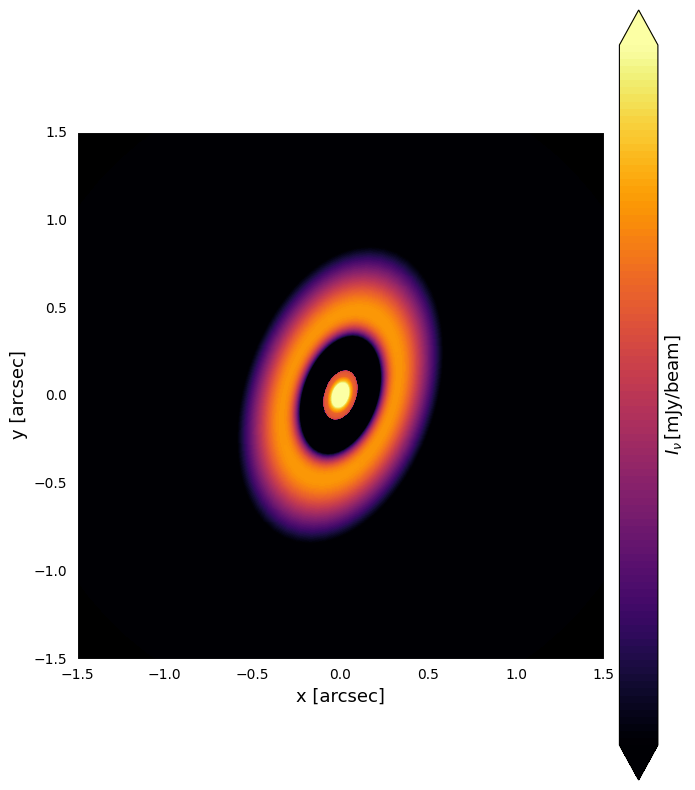

In [26]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.ticker import ScalarFormatter

# Constantes
conversion_factor = 1.12e-10  # erg/cm^2/s/Hz/sr -> mJy/beam
c = 3e10  # velocidad de la luz en cm/s
distance_pc = 113.5  # distancia a PDS 70 en parsecs
au_to_arcsec = 0.74 / distance_pc  # 1 AU = 1/d [arcsec]

# Parámetros de graficación
cmap = 'inferno'
cb_show = True
cb_fraction = 0.3
wl = 855  # longitud de onda en micrones (ALMA Band 7)

# Ángulo de rotación
angle = np.radians(71)
rotation_matrix = np.array([[np.cos(angle), -np.sin(angle)],
                            [np.sin(angle),  np.cos(angle)]])

# Modelo a graficar: modelo[2] = PPD
i = 2
lab = 'PPD'
contImages = models[i].contImages
original_wl = wl
image, wl = contImages.getImage(wl)

# Expandir la malla para contorno cerrado
x = np.hstack((contImages.x, contImages.x[:, 0:1]))
y = np.hstack((contImages.y, contImages.y[:, 0:1]))
imagepl = np.hstack((image, image[:, 0:1]))

# Conversión a mJy/beam
imagepl_mJy_beam = imagepl * conversion_factor

# Conversión de coordenadas a arcsec
x_arcsec = x * au_to_arcsec
y_arcsec = y * au_to_arcsec

# Rotación
coords = np.array([x_arcsec.ravel(), y_arcsec.ravel()])
rotated_coords = np.dot(rotation_matrix, coords)
x_rotated = rotated_coords[0, :].reshape(x.shape)
y_rotated = rotated_coords[1, :].reshape(y.shape)

# Ajuste de escala logarítmica
vmax = np.max(imagepl_mJy_beam) / 2700
vmin = vmax / 4

# Gráfica
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
norm = mcolors.LogNorm(vmin=vmin, vmax=vmax)
levels = np.logspace(np.log10(vmin), np.log10(vmax), 100)

CS = ax.contourf(x_rotated, y_rotated, imagepl_mJy_beam, norm=norm,
                 cmap=cmap, levels=levels, extend="both")

ax.set_facecolor("black")
ax.axis("equal")
ax.set_xlim(-1.5, 1.5)
ax.set_ylim(-1.5, 1.5)
ax.set_aspect('equal', 'box')
ax.set_xlabel("x [arcsec]", fontsize=13)
ax.set_ylabel("y [arcsec]", fontsize=13)

for spine in ax.spines.values():
    spine.set_color('white')
ax.tick_params(color='white', which='both')

if cb_show:
    CB = fig.colorbar(CS, ax=ax, pad=0.02, fraction=cb_fraction, ticks=[0.0, 0.4, 0.8, 1.2, 1.6])
    CB.set_label(r"$I_\nu\,[\mathrm{mJy/beam}]$", fontsize=13)

plt.savefig(f"PPD_mJybeam_arcsec.pdf")
plt.show()

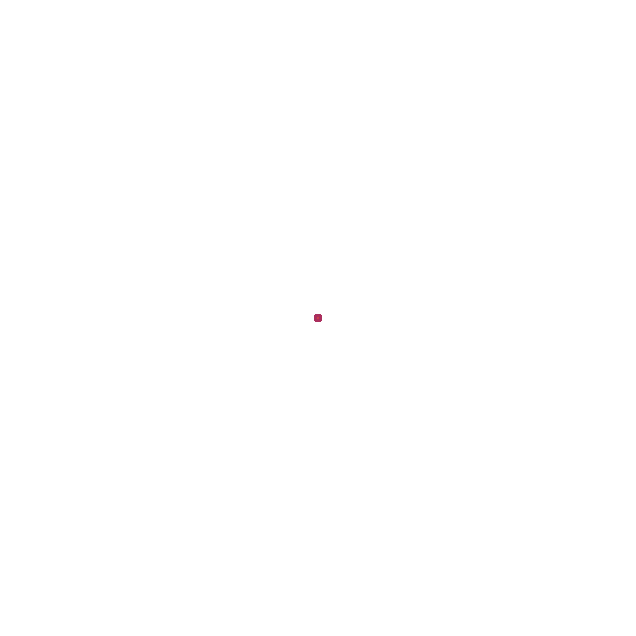

In [47]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Constantes
conversion_factor = 1.12e-10  # erg/cm^2/s/Hz/sr -> mJy/beam
c = 3e10                     # velocidad de la luz en cm/s
distance_pc = 113.5          # distancia a PDS 70 en parsecs
au_to_arcsec = 0.74 / distance_pc  # 1 AU = 1/d [arcsec]

# Parámetros de graficación
cmap = 'inferno'
wl = 855                     # longitud de onda en μm (ALMA Band 7)

# Ángulo de rotación
angle = np.radians(69)
rotation_matrix = np.array([[np.cos(angle), -np.sin(angle)],
                            [np.sin(angle),  np.cos(angle)]])

# --- CARGA DEL MODELO i=0 (CPD) ---
cont0 = models[0].contImages
image, wl = cont0.getImage(wl)

# Expandir la malla para contorno cerrado
x = np.hstack((cont0.x, cont0.x[:, 0:1]))
y = np.hstack((cont0.y, cont0.y[:, 0:1]))
img = np.hstack((image, image[:, 0:1]))

# Conversión a mJy/beam
img_mJy = img * conversion_factor

# Conversión de coordenadas a arcsec
x_arc = x * au_to_arcsec
y_arc = y * au_to_arcsec

# Rotación
coords = np.vstack((x_arc.ravel(), y_arc.ravel()))
rot = rotation_matrix.dot(coords)
x_rot = rot[0].reshape(x.shape)
y_rot = rot[1].reshape(y.shape)

# Escala logarítmica
vmax = np.max(img_mJy)
vmin = vmax / 1e4
norm = mcolors.LogNorm(vmin=vmin, vmax=vmax)
levels = np.logspace(np.log10(vmin), np.log10(vmax), 100)

# DIBUJO
fig, ax = plt.subplots(figsize=(8, 8))
ax.contourf(
    x_rot, y_rot, img_mJy,
    norm=norm,
    cmap=cmap,
    levels=levels,
    extend='both'
)

# Configuración mínima: sin ejes, sin labels, aspecto cuadrado
ax.axis('off')
ax.set_aspect('equal')
ax.set_xlim(-1.5, 1.5)
ax.set_ylim(-1.5, 1.5)

plt.show()

l valor que estabas usando (0.2151, 0.0378) proviene del ajuste directo de la emisión en LB19+SB16, pero la posición “verdadera” de PDS 70 c —la prevista por la órbita— es

    ΔRA = −214.81 mas → −0.21481″

    ΔDec = +31.87 mas → +0.03187″

Además de usar la astrometría orbital prevista (ΔRA = −214.81 mas, ΔDec = +31.87 mas para 2019-07-28 según Wang et al. 2021

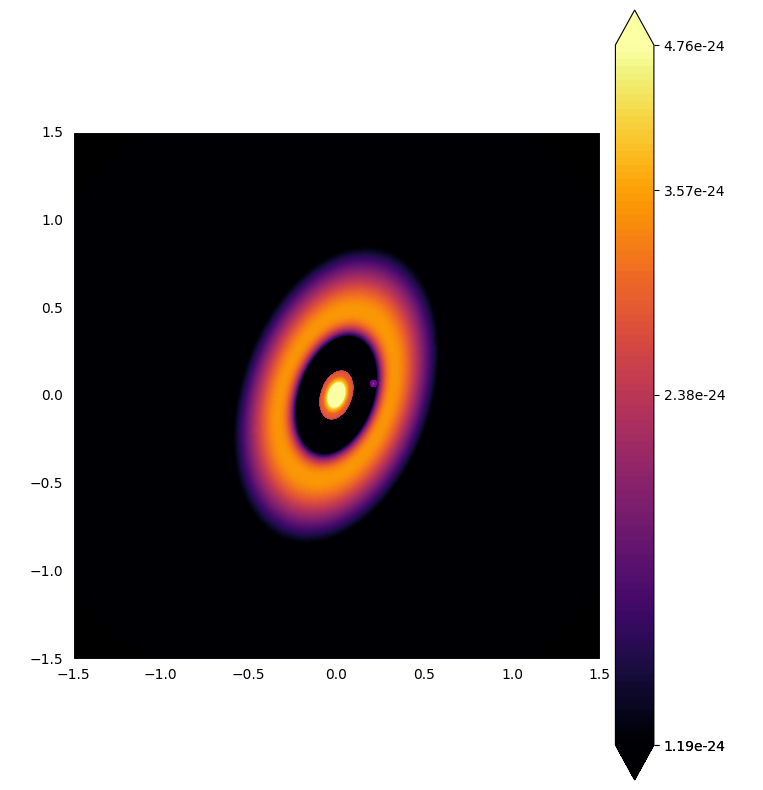

In [17]:
from matplotlib.ticker import ScalarFormatter
# ——————————————————————————
# Constantes y parámetros generales
# ——————————————————————————
conversion_factor = 1.12e-10    # erg/cm^2/s/Hz/sr -> mJy/beam
distance_pc       = 113.5       # distancia a PDS 70 en parsecs
au_to_arcsec      = 0.74 / distance_pc   # 1 AU = 1/d [arcsec]
wl                = 855         # longitud de onda en μm (ALMA Band 7)
cb_fraction       = 0.3

# Colormaps distintos para cada modelo
cmap_ppd = 'inferno'  # para i=2
cmap_cpd = 'plasma'   # para i=0

# Ángulo de rotación (en radianes)
angle = np.radians(71)
rotation_matrix = np.array([
    [np.cos(angle), -np.sin(angle)],
    [np.sin(angle),  np.cos(angle)]
])

# ————————————————————————————
# Función auxiliar: genera contorno usando su propio vmin/vmax/levels
# ————————————————————————————
def plot_model(ax, contImages, cmap, vmin, vmax, levels, zorder, alpha=1.0):
    image, _ = contImages.getImage(wl)
    x = np.hstack((contImages.x, contImages.x[:, :1]))
    y = np.hstack((contImages.y, contImages.y[:, :1]))
    img = np.hstack((image, image[:, :1])) * conversion_factor

    x_arc = x * au_to_arcsec
    y_arc = y * au_to_arcsec
    coords = np.vstack((x_arc.ravel(), y_arc.ravel()))
    rot = rotation_matrix.dot(coords)
    x_rot = rot[0].reshape(x.shape)
    y_rot = rot[1].reshape(y.shape)

    return ax.contourf(
        x_rot, y_rot, img,
        norm=mcolors.LogNorm(vmin=vmin, vmax=vmax),
        cmap=cmap,
        levels=levels,
        extend='both',
        zorder=zorder,
        alpha=alpha
    )

# ————————————————————————————
# Calcular vmin/vmax/levels para PPD (modelo i=2)
# ————————————————————————————
cont2 = models[2].contImages
# saco imagen preliminar
img2_raw, _ = cont2.getImage(wl)
x2 = np.hstack((cont2.x, cont2.x[:, :1]))
y2 = np.hstack((cont2.y, cont2.y[:, :1]))
img2 = np.hstack((img2_raw, img2_raw[:, :1])) * conversion_factor

vmax2 = np.max(img2) / 2700
vmin2 = vmax2 / 4
levels2 = np.logspace(np.log10(vmin2), np.log10(vmax2), 100)

# ————————————————————————————
# Calcular vmin/vmax/levels para CPD (modelo i=0)
# ————————————————————————————
cont0 = models[0].contImages
img0_raw, _ = cont0.getImage(wl)
x0 = np.hstack((cont0.x, cont0.x[:, :1]))
y0 = np.hstack((cont0.y, cont0.y[:, :1]))
img0 = np.hstack((img0_raw, img0_raw[:, :1])) * conversion_factor

# Ajusta estos factores de escala a tu gusto
vmax0 = np.max(img0)    # p.ej. un rango más estrecho
vmin0 = vmax0 / 1e3
levels0 = np.logspace(np.log10(vmin0), np.log10(vmax0), 100)

# ————————————————————————————
# PLOT
# ————————————————————————————
fig, ax = plt.subplots(figsize=(10, 10))

# 1) Dibujo PPD con sus propios límites
CS_ppd = plot_model(
    ax,
    cont2,
    cmap_ppd,
    vmin2, vmax2,
    levels2,
    zorder=1,
    alpha=1.0
)

# Formato ejes
ax.set_facecolor('black')
ax.axis('equal')
ax.set_xlim(-1.5, 1.5)
ax.set_ylim(-1.5, 1.5)
ax.set_aspect('equal', 'box')
ax.set_xlabel("x [arcsec]", color='white')
ax.set_ylabel("y [arcsec]", color='white')
for spine in ax.spines.values():
    spine.set_color('white')
ax.tick_params(color='white', which='both')

# Colorbar para PPD
CB = fig.colorbar(
    CS_ppd,
    ax=ax,
    pad=0.02,
    fraction=cb_fraction,
    format="%.2e",
    ticks=[vmin2, vmax2/4, vmax2/2, 3*vmax2/4, vmax2]
)
CB.ax.yaxis.set_major_formatter(ScalarFormatter())
CB.update_ticks()
CB.set_label(r"$I_\nu\,[\mathrm{mJy/beam}]$ (PPD)", fontsize=13, color='white')

# 2) Superposición CPD con sus propios límites y sin colorbar
cp_x_offset = 0.13    # RA en arcsec
cp_y_offset = -0.1778 # Dec en arcsec

# wrapper que añade offset
def plot_model_offset(ax, contImages, cmap, vmin, vmax, levels, zorder, alpha=0.8):
    image, _ = contImages.getImage(wl)
    x = np.hstack((contImages.x, contImages.x[:, :1]))
    y = np.hstack((contImages.y, contImages.y[:, :1]))
    img = np.hstack((image, image[:, :1])) * conversion_factor

    x_arc = x * au_to_arcsec + cp_x_offset
    y_arc = y * au_to_arcsec + cp_y_offset
    coords = np.vstack((x_arc.ravel(), y_arc.ravel()))
    rot = rotation_matrix.dot(coords)
    x_rot = rot[0].reshape(x.shape)
    y_rot = rot[1].reshape(y.shape)

    return ax.contourf(
        x_rot, y_rot, img,
        norm=mcolors.LogNorm(vmin=vmin, vmax=vmax),
        cmap=cmap,
        levels=levels,
        extend='both',
        zorder=zorder,
        alpha=alpha
    )

# Llamada para el CPD
plot_model_offset(
    ax,
    cont0,
    cmap_cpd,
    vmin0, vmax0,
    levels0,
    zorder=2,
    alpha=0.8
)
plt.savefig(f"PPD_CPD_intesidad_Max Mass.pdf")
plt.show()

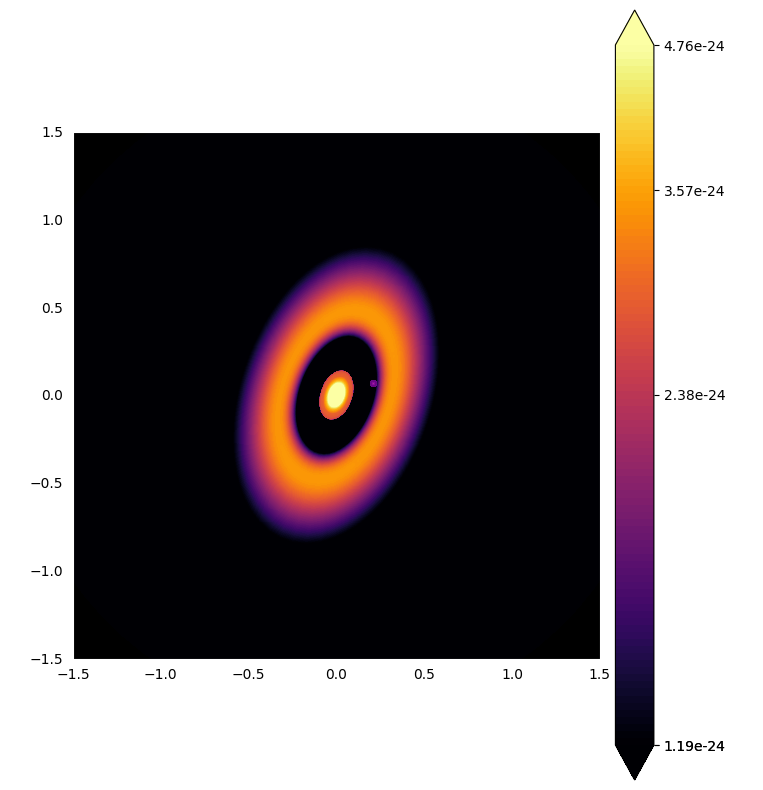

In [18]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.ticker import ScalarFormatter

# ——————————————————————————
# Constantes y parámetros generales
# ——————————————————————————
conversion_factor = 1.12e-10    # erg/cm^2/s/Hz/sr -> mJy/beam
distance_pc       = 113.5       # distancia a PDS 70 en parsecs
au_to_arcsec      = 0.74 / distance_pc   # 1 AU = 1/d [arcsec]
wl                = 855         # longitud de onda en μm (ALMA Band 7)
cb_fraction       = 0.3

# Colormaps distintos para cada modelo
cmap_ppd = 'inferno'  # para i=2
cmap_cpd = 'plasma'   # para i=0

# Ángulo de rotación (en radianes)
angle = np.radians(71)
rotation_matrix = np.array([
    [np.cos(angle), -np.sin(angle)],
    [np.sin(angle),  np.cos(angle)]
])

# ————————————————————————————
# Función auxiliar: genera contorno usando su propio vmin/vmax/levels
# ————————————————————————————
def plot_model(ax, contImages, cmap, vmin, vmax, levels, zorder, alpha=1.0):
    image, _ = contImages.getImage(wl)
    x = np.hstack((contImages.x, contImages.x[:, :1]))
    y = np.hstack((contImages.y, contImages.y[:, :1]))
    img = np.hstack((image, image[:, :1])) * conversion_factor

    x_arc = x * au_to_arcsec
    y_arc = y * au_to_arcsec
    coords = np.vstack((x_arc.ravel(), y_arc.ravel()))
    rot = rotation_matrix.dot(coords)
    x_rot = rot[0].reshape(x.shape)
    y_rot = rot[1].reshape(y.shape)

    return ax.contourf(
        x_rot, y_rot, img,
        norm=mcolors.LogNorm(vmin=vmin, vmax=vmax),
        cmap=cmap,
        levels=levels,
        extend='both',
        zorder=zorder,
        alpha=alpha
    )

# ————————————————————————————
# Calcular vmin/vmax/levels para PPD (modelo i=2)
# ————————————————————————————
cont2 = models[2].contImages
# saco imagen preliminar
img2_raw, _ = cont2.getImage(wl)
x2 = np.hstack((cont2.x, cont2.x[:, :1]))
y2 = np.hstack((cont2.y, cont2.y[:, :1]))
img2 = np.hstack((img2_raw, img2_raw[:, :1])) * conversion_factor

vmax2 = np.max(img2) / 2700
vmin2 = vmax2 / 4
levels2 = np.logspace(np.log10(vmin2), np.log10(vmax2), 100)

# ————————————————————————————
# Calcular vmin/vmax/levels para CPD (modelo i=0)
# ————————————————————————————
cont0 = models[1].contImages
img0_raw, _ = cont0.getImage(wl)
x0 = np.hstack((cont0.x, cont0.x[:, :1]))
y0 = np.hstack((cont0.y, cont0.y[:, :1]))
img0 = np.hstack((img0_raw, img0_raw[:, :1])) * conversion_factor

# Ajusta estos factores de escala a tu gusto
vmax0 = np.max(img0)    # p.ej. un rango más estrecho
vmin0 = vmax0 / 1e3
levels0 = np.logspace(np.log10(vmin0), np.log10(vmax0), 100)

# ————————————————————————————
# PLOT
# ————————————————————————————
fig, ax = plt.subplots(figsize=(10, 10))

# 1) Dibujo PPD con sus propios límites
CS_ppd = plot_model(
    ax,
    cont2,
    cmap_ppd,
    vmin2, vmax2,
    levels2,
    zorder=1,
    alpha=1.0
)

# Formato ejes
ax.set_facecolor('black')
ax.axis('equal')
ax.set_xlim(-1.5, 1.5)
ax.set_ylim(-1.5, 1.5)
ax.set_aspect('equal', 'box')
ax.set_xlabel("x [arcsec]", color='white')
ax.set_ylabel("y [arcsec]", color='white')
for spine in ax.spines.values():
    spine.set_color('white')
ax.tick_params(color='white', which='both')

# Colorbar para PPD
CB = fig.colorbar(
    CS_ppd,
    ax=ax,
    pad=0.02,
    fraction=cb_fraction,
    format="%.2e",
    ticks=[vmin2, vmax2/4, vmax2/2, 3*vmax2/4, vmax2]
)
CB.ax.yaxis.set_major_formatter(ScalarFormatter())
CB.update_ticks()
CB.set_label(r"$I_\nu\,[\mathrm{mJy/beam}]$ (PPD)", fontsize=13, color='white')

# 2) Superposición CPD con sus propios límites y sin colorbar
cp_x_offset = 0.13    # RA en arcsec
cp_y_offset = -0.1778 # Dec en arcsec

# wrapper que añade offset
def plot_model_offset(ax, contImages, cmap, vmin, vmax, levels, zorder, alpha=0.8):
    image, _ = contImages.getImage(wl)
    x = np.hstack((contImages.x, contImages.x[:, :1]))
    y = np.hstack((contImages.y, contImages.y[:, :1]))
    img = np.hstack((image, image[:, :1])) * conversion_factor

    x_arc = x * au_to_arcsec + cp_x_offset
    y_arc = y * au_to_arcsec + cp_y_offset
    coords = np.vstack((x_arc.ravel(), y_arc.ravel()))
    rot = rotation_matrix.dot(coords)
    x_rot = rot[0].reshape(x.shape)
    y_rot = rot[1].reshape(y.shape)

    return ax.contourf(
        x_rot, y_rot, img,
        norm=mcolors.LogNorm(vmin=vmin, vmax=vmax),
        cmap=cmap,
        levels=levels,
        extend='both',
        zorder=zorder,
        alpha=alpha
    )

# Llamada para el CPD
plot_model_offset(
    ax,
    cont0,
    cmap_cpd,
    vmin0, vmax0,
    levels0,
    zorder=2,
    alpha=0.8
)
plt.savefig(f"PPD_CPD_intesidad_Min Mass.pdf")
plt.show()

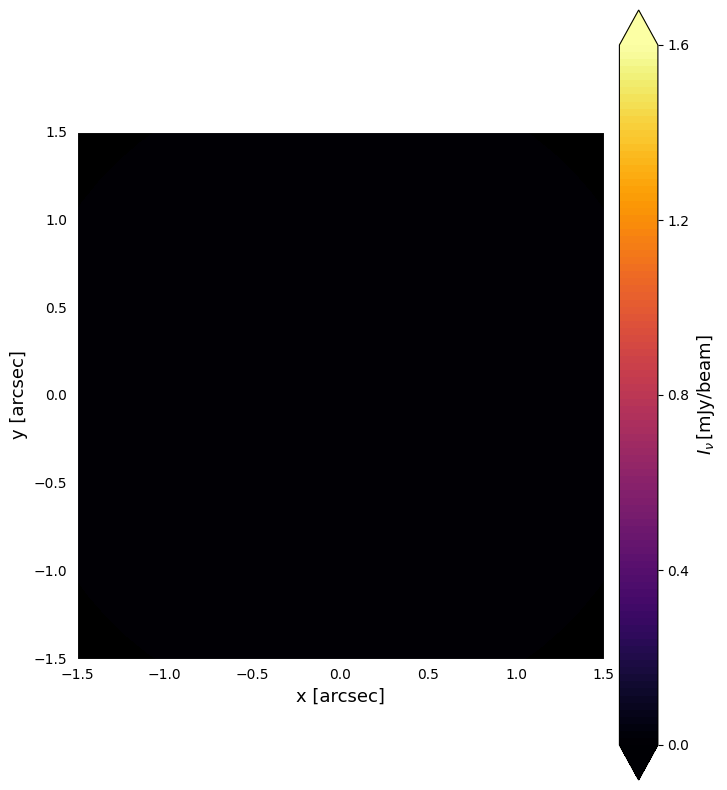

In [28]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Constantes
conversion_factor = 1.12e-10  # erg/cm^2/s/Hz/sr -> mJy/beam
c = 3e10  # velocidad de la luz en cm/s
distance_pc = 113.5  # distancia a PDS 70 en parsecs
au_to_arcsec = 0.74 / distance_pc  # 1 AU = 1/d [arcsec]

# Parámetros de graficación
cmap = 'inferno'
cb_show = True
cb_fraction = 0.3
wl = 855  # longitud de onda en micrones (ALMA Band 7)

# Ángulo de rotación
angle = np.radians(71)
rotation_matrix = np.array([[np.cos(angle), -np.sin(angle)],
                            [np.sin(angle),  np.cos(angle)]])

# Modelo a graficar: modelo[2] = PPD
i = 2
lab = 'PPD'
contImages = models[i].contImages
original_wl = wl
image, wl = contImages.getImage(wl)

# Expandir la malla para contorno cerrado
x = np.hstack((contImages.x, contImages.x[:, 0:1]))
y = np.hstack((contImages.y, contImages.y[:, 0:1]))
imagepl = np.hstack((image, image[:, 0:1]))

# Conversión a mJy/beam
imagepl_mJy_beam = imagepl * conversion_factor

# Conversión de coordenadas a arcsec
x_arcsec = x * au_to_arcsec
y_arcsec = y * au_to_arcsec

# Rotación
coords = np.array([x_arcsec.ravel(), y_arcsec.ravel()])
rotated_coords = np.dot(rotation_matrix, coords)
x_rotated = rotated_coords[0, :].reshape(x.shape)
y_rotated = rotated_coords[1, :].reshape(y.shape)

# Ajuste de escala lineal personalizada
vmin = 0.0
vmax = 1.6  # Hasta 1.6 mJy/beam

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
levels = np.linspace(vmin, vmax, 100)

CS = ax.contourf(x_rotated, y_rotated, imagepl_mJy_beam, norm=norm,
                 cmap=cmap, levels=levels, extend="both")

ax.set_facecolor("black")
ax.axis("equal")
ax.set_xlim(-1.5, 1.5)
ax.set_ylim(-1.5, 1.5)
ax.set_aspect('equal', 'box')
ax.set_xlabel("x [arcsec]", fontsize=13)
ax.set_ylabel("y [arcsec]", fontsize=13)

for spine in ax.spines.values():
    spine.set_color('white')
ax.tick_params(color='white', which='both')

if cb_show:
    CB = fig.colorbar(CS, ax=ax, pad=0.02, fraction=cb_fraction, ticks=[0.0, 0.4, 0.8, 1.2, 1.6])
    CB.set_label(r"$I_\nu\,[\mathrm{mJy/beam}]$", fontsize=13)

plt.savefig(f"PPD_mJybeam_arcsec_linearbar.pdf")
plt.show()

In [ ]:
#T=20 K
#kappa= 10 cm^2/g
#1 mm = 177 my
#112 pc --cm 
#orden 10e-5
h = 1.380649e-16 #erg⋅s/K
c = 2.998e10 #cm
k = 6.63e-27 # erg·s/K
v = c / 0.1 #Hz
T = 20

x= (h*v)/(k*T)

B = 2*h*v**3/((c**2) * (np.exp(x)-1))
print(B)

In [ ]:
d= 122 *3.0857e18
#Fv= B*10/d**2 * Mdisk
Mdisk = 177 * d**2/ (B*10)
#Flujo  = 177 #mJy

In [ ]:
#SIGMA GAS
pp=pplot.Plot(None)
pp.plot_cont(models[0], models[0].sdg, xlog=False);
plt.xlabel(rlabel, fontsize=13)
plt.ylabel(rylabel, fontsize=13)

masa disco, masa estrella, restart, maxit=60, guardar txt,ángulo

multiplicar segunda columna por 200, correr

0 grados, 

In [ ]:
.false.      ! solve_diskstruc   : solve the vertical hydrostatic eq.?

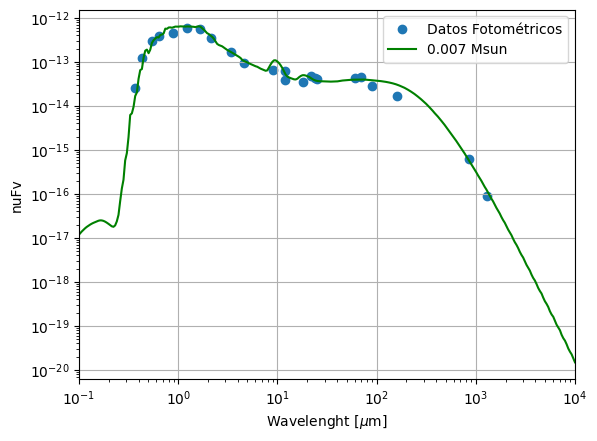

In [32]:
sdprofile_102 = 'sed_modelo6.txt'
sdprofile_104 = 'SEDBD.txt'

with open('Datos_fotometricos.txt', 'r') as file:
    lines = file.readlines()[1:]  # Saltar la primera línea
    data = [[float(entry.split()[0]), float(entry.split()[1])] for entry in lines]

# Convertir a un arreglo de NumPy
data = np.array(data)

# Extraer columnas de datos Datos fotométricos
# longitud de onda en mu
longitud_onda = data[:, 0]
#flujo en mJy
flujo_mJy = data[:, 1]
# Convertir el flujo de mJy a W
#convertir longitud de onda de mu a m
longitud_onda1 = longitud_onda*1e-6
c = 3e8 # m
flujo_w = flujo_mJy * 1e-29 * ((c/longitud_onda1))

datos_102 = np.loadtxt(sdprofile_102, skiprows=1)
columna_nu_102 = datos_102[:, 1]
columna_y_102 = datos_102[:, 3]
datos_104 = np.loadtxt(sdprofile_104, skiprows=1)
columna_nu_104 = datos_104[:, 1]
columna_y_104 = datos_104[:, 3]

velocidad_luz = 3.0e8  # velocidad de la luz en m/s
columna_lambda_102 = velocidad_luz / columna_nu_102 * 1e6 
columna_lambda_104 = velocidad_luz / columna_nu_104 * 1e6 

#plt.subplot(1, 2, 2)
#Ploter datos fotométricos
plt.scatter(longitud_onda, flujo_w, label='Datos Fotométricos')
plt.xlabel(r'Longitud de Onda [$\mu$m]')
plt.xlim(10e-2,10e2)
#plt.xlim(10e-12,10e-17)
plt.ylabel('λ$F_λ$ [$W/m^2$]')
plt.xscale('log')  # Escala logarítmica en el eje x
plt.yscale('log')  # Escala logarítmica en el eje y

plt.plot(columna_lambda_102, columna_y_102, color='g', label='0.007 Msun')
#plt.plot(columna_lambda_104, columna_y_104, color='r', label='Modelo BD')

plt.xlabel(r'Wavelenght [$\mu$m]')
plt.xscale('log')
plt.yscale('log')
plt.xlim(10e-2, 10e3)
plt.ylabel('nuFv')

#plt.legend()
plt.grid()
plt.legend()
plt.show()

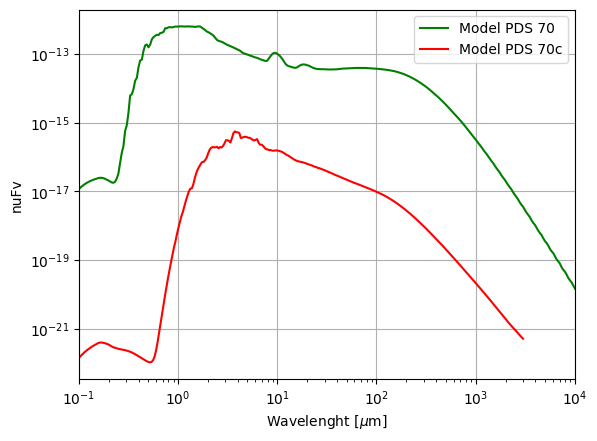

In [33]:
sdprofile_102 = 'sed_modelo6.txt'
sdprofile_104 = 'SEDBD.txt'

# Convertir a un arreglo de NumPy
data = np.array(data)

# Extraer columnas de datos Datos fotométricos
# longitud de onda en mu
longitud_onda = data[:, 0]
#flujo en mJy
flujo_mJy = data[:, 1]
# Convertir el flujo de mJy a W
#convertir longitud de onda de mu a m
longitud_onda1 = longitud_onda*1e-6
c = 3e8 # m
flujo_w = flujo_mJy * 1e-29 * ((c/longitud_onda1))

datos_102 = np.loadtxt(sdprofile_102, skiprows=1)
columna_nu_102 = datos_102[:, 1]
columna_y_102 = datos_102[:, 3]
datos_104 = np.loadtxt(sdprofile_104, skiprows=1)
columna_nu_104 = datos_104[:, 1]
columna_y_104 = datos_104[:, 3]

velocidad_luz = 3.0e8  # velocidad de la luz en m/s
columna_lambda_102 = velocidad_luz / columna_nu_102 * 1e6 
columna_lambda_104 = velocidad_luz / columna_nu_104 * 1e6 

plt.plot(columna_lambda_102, columna_y_102, color='g', label='Model PDS 70')
plt.plot(columna_lambda_104, columna_y_104, color='r', label='Model PDS 70c')

plt.xlabel(r'Wavelenght [$\mu$m]')
plt.xscale('log')
plt.yscale('log')
plt.xlim(10e-2, 10e3)
plt.ylabel('nuFv')

#plt.legend()
plt.grid()
plt.legend()
plt.show()

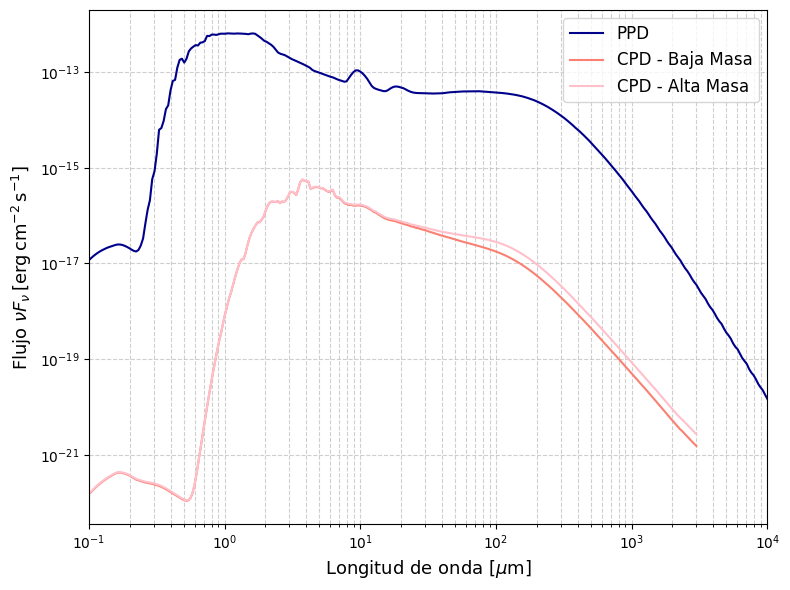

In [37]:
# Archivos de entrada
archivo_ppd = "SEDPPD.txt"
archivo_cpd_baja = "SEDBD_bajamasa.txt"
archivo_cpd_alta = "SEDBD_altamasa.txt"

# Cargar datos (omite la primera fila si contiene encabezado)
data_ppd = np.loadtxt(archivo_ppd, skiprows=1)
data_cpd_low = np.loadtxt(archivo_cpd_baja, skiprows=1)
data_cpd_high = np.loadtxt(archivo_cpd_alta, skiprows=1)

# Extraer columnas: frecuencia (Hz) y flujo (erg/cm²/s)
# Formato esperado: [col0, frecuencia, col2, flujo]
nu_ppd = data_ppd[:, 1]
flux_ppd = data_ppd[:, 3]

nu_cpd_low = data_cpd_low[:, 1]
flux_cpd_low = data_cpd_low[:, 3]

nu_cpd_high = data_cpd_high[:, 1]
flux_cpd_high = data_cpd_high[:, 3]

# Convertir frecuencia a longitud de onda en micrones
c = 3.0e8  # m/s
lambda_ppd = c / nu_ppd * 1e6
lambda_cpd_low = c / nu_cpd_low * 1e6
lambda_cpd_high = c / nu_cpd_high * 1e6

# Crear figura
plt.figure(figsize=(8, 6))

# Graficar cada modelo
plt.plot(lambda_ppd, flux_ppd, label="PPD", color="darkblue")
plt.plot(lambda_cpd_low, flux_cpd_low, label="CPD - Baja Masa", color="salmon")
plt.plot(lambda_cpd_high, flux_cpd_high, label="CPD - Alta Masa", color="pink")

# Etiquetas y formato
plt.xlabel(r'Longitud de onda [$\mu$m]', fontsize=13)
plt.ylabel(r'Flujo $\nu F_{\nu} \, [\mathrm{erg\,cm^{-2}\,s^{-1}}]$', fontsize=13)
plt.xscale('log')
plt.yscale('log')
plt.xlim(1e-1, 1e4)
plt.grid(True, which='both', linestyle='--', alpha=0.6)
plt.legend(fontsize=12)
plt.tight_layout()

# Guardar y mostrar
plt.savefig("SED_PPD_CPD_modelos.pdf", dpi=300)
plt.show()

In [ ]:
# Leer los datos fotométricos
with open('Datos_fotometricos.txt', 'r') as file:
    lines = file.readlines()[1:]  # Saltar la primera línea
    data = [[float(entry.split()[0]), float(entry.split()[1])] for entry in lines]

# Convertir datos fotométricos a arrays
data = np.array(data)
longitud_onda = data[:, 0]
flujo_mJy = data[:, 1]

# Convertir el flujo de mJy a W
c = 3e8  # m/s
longitud_onda1 = longitud_onda * 1e-6  # Convertir longitud de onda de micrómetros a metros
flujo_w = flujo_mJy * 1e-29 * (c / longitud_onda1)

# Sumar los flujos de los dos conjuntos de datos
columna_lambda_common = np.union1d(columna_lambda_102, columna_lambda_104)

# Interpolar los valores de flujo a la grilla común de longitudes de onda
flux_101_interp = np.interp(columna_lambda_common, columna_lambda_102, columna_y_102)
flux_102_interp = np.interp(columna_lambda_common, columna_lambda_104, columna_y_104)

# Sumar los flujos
total_flux_sum_array = flux_101_interp + flux_102_interp

# Crear el gráfico
plt.figure(figsize=(10, 6))

# Graficar los datos fotométricos
plt.scatter(longitud_onda, flujo_w, color='r', label='Datos Fotométricos')

# Graficar la suma de los flujos
plt.plot(columna_lambda_102, columna_y_102, color='y', linewidth=4, label='Modelo PDS 70')
plt.plot(columna_lambda_common, total_flux_sum_array, color='b', linewidth=1, label='Suma de los flujos')

plt.xlabel(r'Wavelenght [$\mu$m]')
plt.xscale('log')
plt.yscale('log')
plt.ylim(1e-17, 1e-12)
plt.xlim(1e-1, 1e3)
plt.ylabel('λ$F_λ$ [$W/m^2$]')
plt.grid(True)
plt.legend()
plt.show()

In [71]:
pwd

'/home/usuario/Documentos'

In [72]:
# Crear una red de reacciones y cargar desde un archivo
reacin = pcnet.ReactionNetworkPin()
reacin.load_reactions("BD_PDS70c/Reactions.in")  # Archivo de entrada

# Renombrar una especie en la red de reacciones
old_species_name = "C2H6"
new_species_name = "CH3CH3"
changed_reactions = reacin.renameSpecies(old_species_name, new_species_name)
print(f"Se renombraron {changed_reactions} reacciones de {old_species_name} a {new_species_name}.")

# Guardar la red de reacciones modificada en un nuevo archivo
output_filename = "Reactions.in.renamed"
reacin.write_reactions(output_filename)
print(f"Red de reacciones guardada en: {output_filename}")

# Crear una reacción química individual para su análisis
class Reaction:
    def __init__(self, id, type, gasphase, reactants, products, coeffs, temps, rate, comment):
        self.id = id  # Identificador de la reacción
        self.type = type  # Tipo de reacción
        self.gasphase = gasphase  # Si es una reacción en fase gaseosa
        self.reactants = reactants  # Lista de reactivos
        self.products = products  # Lista de productos
        self.coeffs = coeffs  # Coeficientes (alpha, beta, gamma)
        self.temps = temps  # Rango de temperaturas
        self.rate = rate  # Tasa de reacción
        self.comment = comment  # Comentarios

    def compare(self, reaction):
        """
        Compara esta reacción con otra reacción.

        Parameters:
            reaction (Reaction): Otra reacción a comparar.

        Returns:
            dict: Diccionario con los resultados de la comparación por propiedades.
        """
        comparison = {
            "type": self.type == reaction.type,
            "gasphase": self.gasphase == reaction.gasphase,
            "reactants": set(self.reactants) == set(reaction.reactants),
            "products": set(self.products) == set(reaction.products),
            "coeffs": np.allclose(self.coeffs, reaction.coeffs),
            "temps": np.allclose(self.temps, reaction.temps),
        }
        return comparison

# Ejemplo de creación y comparación de reacciones
reaction1 = Reaction(
    id=1,
    type="Ion-Molecule",
    gasphase=True,
    reactants=["H2", "O2"],
    products=["H2O", "O"],
    coeffs=[1.0, -0.5, 0.1],
    temps=[(10, 100)],
    rate=1.2e-10,
    comment="Ejemplo de reacción 1"
)

reaction2 = Reaction(
    id=2,
    type="Ion-Molecule",
    gasphase=True,
    reactants=["H2", "O2"],
    products=["H2O", "O"],
    coeffs=[1.0, -0.5, 0.1],
    temps=[(10, 100)],
    rate=1.2e-10,
    comment="Ejemplo de reacción 2"
)

comparison_result = reaction1.compare(reaction2)
print("Resultado de la comparación de reacciones:", comparison_result)

Loaded  1555  Reactions from  BD_PDS70c/Reactions.in
Se renombraron 0 reacciones de C2H6 a CH3CH3.
Red de reacciones guardada en: Reactions.in.renamed
Resultado de la comparación de reacciones: {'type': True, 'gasphase': True, 'reactants': True, 'products': True, 'coeffs': True, 'temps': True}


Loaded  1555  Reactions from  BD_PDS70c/Reactions.in
Se renombraron 0 reacciones de C2H6 a CH3CH3.
Red de reacciones guardada en: BD_PDS70c/Reactions.in.renamed
Resultado de la comparación de reacciones: {'type': True, 'gasphase': True, 'reactants': True, 'products': True, 'coeffs': True, 'temps': True}


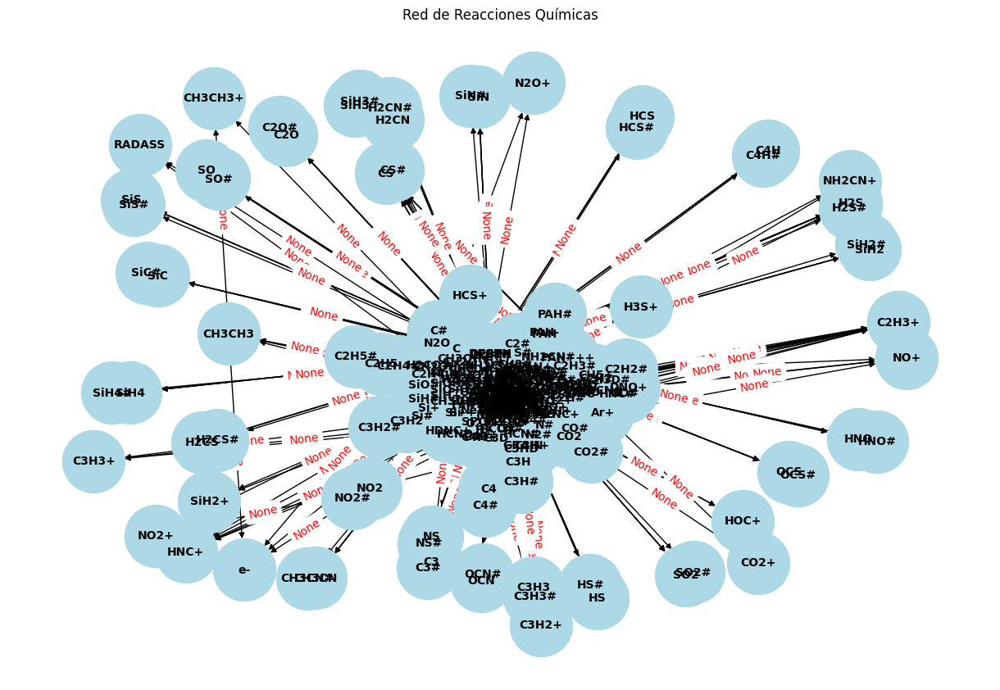

In [76]:
import prodimopy.chemistry.network as pcnet
import matplotlib.pyplot as plta
import networkx as nx

# Crear una red de reacciones y cargar desde un archivo
reacin = pcnet.ReactionNetworkPin()
reacin.load_reactions("BD_PDS70c/Reactions.in")  # Archivo de entrada

# Renombrar una especie en la red de reacciones
old_species_name = "C2H6"
new_species_name = "CH3CH3"
changed_reactions = reacin.renameSpecies(old_species_name, new_species_name)
print(f"Se renombraron {changed_reactions} reacciones de {old_species_name} a {new_species_name}.")

# Guardar la red de reacciones modificada en un nuevo archivo
output_filename = "BD_PDS70c/Reactions.in.renamed"
reacin.write_reactions(output_filename)
print(f"Red de reacciones guardada en: {output_filename}")

# Crear una reacción química individual para su análisis
class Reaction:
    def __init__(self, id, type, gasphase, reactants, products, coeffs, temps, rate, comment):
        self.id = id  # Identificador de la reacción
        self.type = type  # Tipo de reacción
        self.gasphase = gasphase  # Si es una reacción en fase gaseosa
        self.reactants = reactants  # Lista de reactivos
        self.products = products  # Lista de productos
        self.coeffs = coeffs  # Coeficientes (alpha, beta, gamma)
        self.temps = temps  # Rango de temperaturas
        self.rate = rate  # Tasa de reacción
        self.comment = comment  # Comentarios

    def compare(self, reaction):
        """
        Compara esta reacción con otra reacción.

        Parameters:
            reaction (Reaction): Otra reacción a comparar.

        Returns:
            dict: Diccionario con los resultados de la comparación por propiedades.
        """
        comparison = {
            "type": self.type == reaction.type,
            "gasphase": self.gasphase == reaction.gasphase,
            "reactants": set(self.reactants) == set(reaction.reactants),
            "products": set(self.products) == set(reaction.products),
            "coeffs": np.allclose(self.coeffs, reaction.coeffs),
            "temps": np.allclose(self.temps, reaction.temps),
        }
        return comparison

# Ejemplo de creación y comparación de reacciones
reaction1 = Reaction(
    id=1,
    type="Ion-Molecule",
    gasphase=True,
    reactants=["H2", "O2"],
    products=["H2O", "O"],
    coeffs=[1.0, -0.5, 0.1],
    temps=[(10, 100)],
    rate=1.2e-10,
    comment="Ejemplo de reacción 1"
)

reaction2 = Reaction(
    id=2,
    type="Ion-Molecule",
    gasphase=True,
    reactants=["H2", "O2"],
    products=["H2O", "O"],
    coeffs=[1.0, -0.5, 0.1],
    temps=[(10, 100)],
    rate=1.2e-10,
    comment="Ejemplo de reacción 2"
)

comparison_result = reaction1.compare(reaction2)
print("Resultado de la comparación de reacciones:", comparison_result)

# Visualizar la red de reacciones químicas
def plot_reaction_network(reaction_network):
    G = nx.DiGraph()

    # Añadir nodos y arcos a la red
    for reaction in reaction_network.reactions:
        for reactant in reaction.reactants:
            for product in reaction.products:
                G.add_edge(reactant, product, label=f"{reaction.type}")

    # Dibujar la red
    plt.figure(figsize=(12, 8))
    pos = nx.spring_layout(G)
    nx.draw(G, pos, with_labels=True, node_size=3000, node_color="lightblue", font_size=10, font_weight="bold")
    edge_labels = nx.get_edge_attributes(G, "label")
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color="red")
    plt.title("Red de Reacciones Químicas")
    plt.show()

# Graficar la red
plot_reaction_network(reacin)

## PsyCo

Dimensiones de x: (80, 80)
Dimensiones de z: (80, 80)
Dimensiones de la abundancia para la especie: (120, 80)


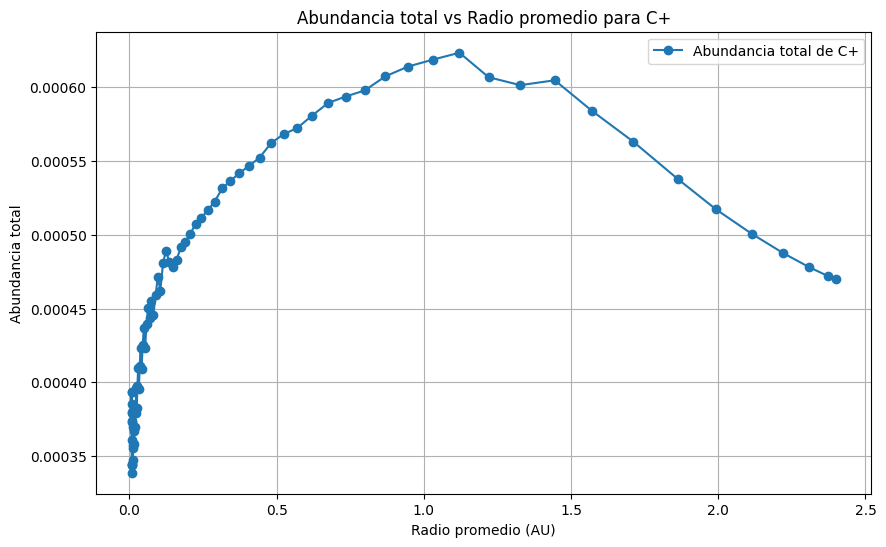

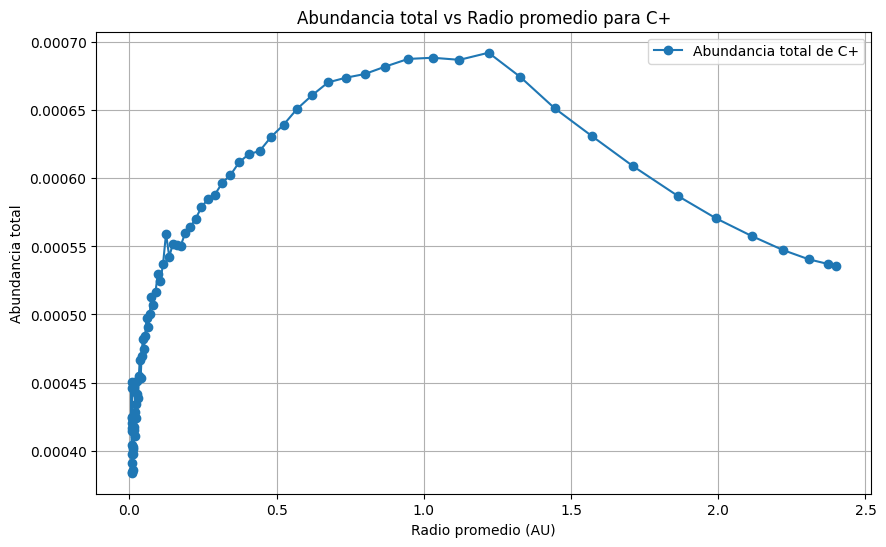

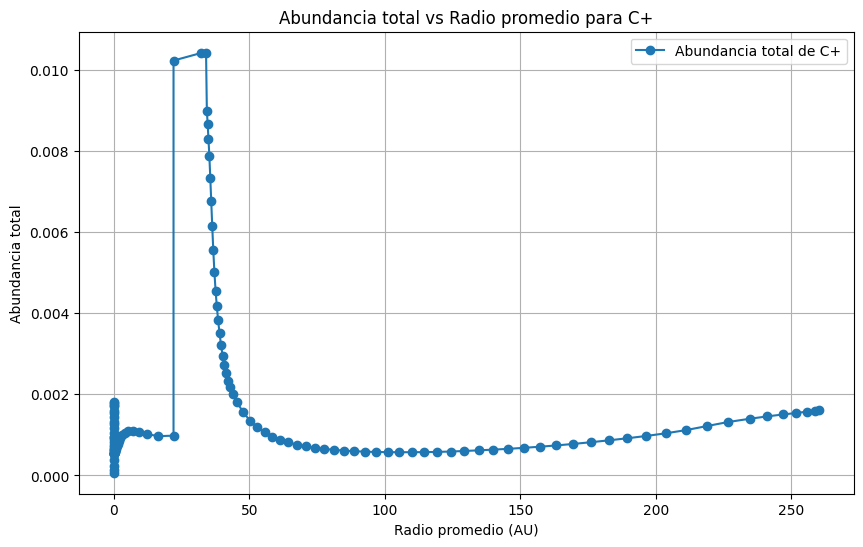

In [53]:
# Inspección de las dimensiones de las grillas y abundancias
print("Dimensiones de x:", models[0].x.shape)
print("Dimensiones de z:", models[0].z.shape)
print("Dimensiones de la abundancia para la especie:", abundance_data.shape)

species_name = "C+"

i = 0
for lab in labels:
    abundance_data = models[i].getAbun(species_name)
    # Si las dimensiones coinciden, graficar
    if abundance_data.shape == models[i].x.shape:
    # Calcular la suma de abundancia a lo largo de una dimensión
        abundance_sum = abundance_data.sum(axis=1)  # Suma a lo largo de columnas (z)

    # Calcular un promedio para x si es necesario
        x_mean = models[i].x.mean(axis=1)  # Promedio de valores radiales

    # Graficar la suma de abundancia vs promedio de radio
        import matplotlib.pyplot as plt

        plt.figure(figsize=(10, 6))
        plt.plot(x_mean, abundance_sum, marker='o', linestyle='-', label=f"Abundancia total de {species_name}")
        plt.xlabel("Radio promedio (AU)")
        plt.ylabel("Abundancia total")
        plt.title(f"Abundancia total vs Radio promedio para {species_name}")
        plt.grid()
        plt.legend()
        #plt.savefig("abundancia_vs_radio.pdf", dpi=300)
        plt.show()
    else:
        print("Dimensiones de x, z y la abundancia no coinciden. Verifica los datos.")
    i += 1

In [31]:
# Solicitar entradas al usuario
species_name = input("Ingrese el nombre de la especie química ('13CO','A-CH3OH','Ar+','Ar++','C','C+','C17O','C18O','C2H','C2H2_H','CH','CH+','CH3OH_H','CH4_H','CN','CO','CO+','CO2_H','CS','CS_H','E-CH3OH', 'Fe+','H13CO+','H2CO_H','H2S_H','HCN','HCN_H','HCO+','HCS+','HN13C','HNC','Mg+','N+','N++','N2H+','NH3_H','NO','NO_H','Ne+','Ne++','O','O+','O++', 'O2','OCS','OH','OH+','OH-hfs','S','S+','S++','SH+','SO','SO2','SO2_H','Si','Si+','SiO','o-C3H2','o-CH2','o-H2','o-H2CO','o-H2O','o-H2S','o-H3O+','o-NH3','p-C3H2','p-CH2','p-H2','p-H2CO','p-H2O','p-H2S','p-H3O+','p-NH3':  ").strip()
radio_min = float(input("Ingrese el valor mínimo de radio (en AU): "))

# Obtener la matriz de abundancia para la especie química seleccionada
try:
    abundance_data = models[0].getAbun(species_name)
except Exception as e:
    print(f"Error al obtener abundancias para la especie '{species_name}': {e}")
    abundance_data = None

if abundance_data is not None:
    # Calcular el promedio de radios por fila (si x es una matriz)
    if len(x.shape) > 1:  # Si x es bidimensional
        r_values = x.mean(axis=1)
    else:  # Si x es un vector unidimensional
        r_values = x

    # Filtrar las filas de abundancia a partir del radio especificado
    mask = r_values >= radio_min  # Máscara para los radios mayores o iguales a radio_min
    filtered_abundance = abundance_data[mask, :]  # Filtrar las filas de abundancia

    # Sumar todas las abundancias para los radios seleccionados
    total_abundance = filtered_abundance.sum()

    # Resultado
    print(f"Abundancia total de '{species_name}' a partir de un radio de {radio_min:.2f} AU: {total_abundance:.3e}")

    # Guardar el resultado en un archivo
    output_file = f"abundancia_total_{species_name}_a_partir_de_{radio_min:.2f}AU.txt"
    with open(output_file, "w") as f:
        f.write(f"Especie: {species_name}\n")
        f.write(f"Radio mínimo considerado: {radio_min:.2f} AU\n")
    print(f"Resultado guardado en el archivo '{output_file}'.")
else:
    print("No se pudo calcular la abundancia total debido a un error.")

KeyboardInterrupt: Interrupted by user

#wavelength[mu]  flux[mJy] Datos Fotométricos
855.0		177.0

#Flujo a 855
8.554030042 772.14 mJy

El flujo en 855 micrones (frecuencia = 3.51e+11 Hz) es: 5.81e-16 W/m^2


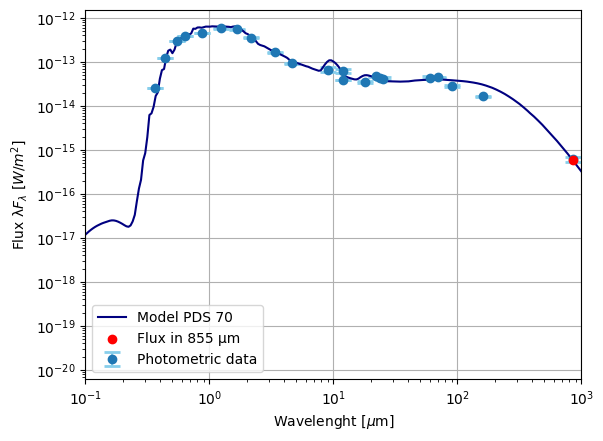

In [34]:
# Cargar los datos del archivo sed_modelo5.txt
datos_103 = np.loadtxt(sdprofile_102, skiprows=1)
columna_nu_103 = datos_103[:, 1]  # Frecuencia en Hz
columna_y_103 = datos_103[:, 3]   # Flujo

# Convertir 855 micrones a metros
lambda_855_micrones = 855e-6  # 855 micrones a metros

# Calcular la frecuencia correspondiente a 855 micrones
velocidad_luz = 3.0e8  # m/s
frecuencia_855 = velocidad_luz / lambda_855_micrones  # en Hz

# Crear una función de interpolación para obtener el flujo en cualquier frecuencia
interpolacion_flujo = interp1d(columna_nu_103, columna_y_103, kind='linear', fill_value="extrapolate")

# Obtener el flujo correspondiente a la frecuencia de 855 micrones
flujo_en_855 = interpolacion_flujo(frecuencia_855)

# Mostrar el resultado
print(f'El flujo en 855 micrones (frecuencia = {frecuencia_855:.2e} Hz) es: {flujo_en_855:.2e} W/m^2')

# Cargar los datos fotométricos del archivo Datos_fotometricos.txt
with open('Datos_fotometricos.txt', 'r') as file:
    lines = file.readlines()[1:]  # Saltar la primera línea
    data = [[float(entry.split()[0]), float(entry.split()[1]), float(entry.split()[2])] for entry in lines]

# Convertir a un arreglo de NumPy
data = np.array(data)

# Extraer columnas de datos fotométricos
longitud_onda = data[:, 0]   # Longitud de onda en µm
flujo_mJy = data[:, 1]       # Flujo en mJy (segunda columna)
error_flujo = data[:, 2]     # Error del flujo en mJy (tercera columna)

# Convertir el flujo de mJy a W/m^2
# Convertir longitud de onda de µm a metros
longitud_onda_m = longitud_onda * 1e-6
flujo_w = flujo_mJy * 1e-29 * (velocidad_luz / longitud_onda_m)
error_flujo_w = error_flujo * 1e-29 * (velocidad_luz / longitud_onda_m)

# Plotear los datos fotométricos con barras de error
plt.errorbar(longitud_onda, flujo_w, yerr=error_flujo_w, fmt='o', label='Photometric data', ecolor='skyblue', capsize=6, capthick=2)

# Plotear el modelo SED
plt.plot(velocidad_luz / columna_nu_103 * 1e6, columna_y_103, label='Model PDS 70', color='navy')

# Marcar el valor interpolado en 855 micrones
plt.scatter(855, flujo_en_855, color='red', label='Flux in 855 µm', zorder=5)

# Configuración del gráfico
plt.xlabel(r'Wavelenght [$\mu$m]')
plt.ylabel('Flux λ$F_λ$ [$W/m^2$]')
plt.xscale('log')
plt.yscale('log')
plt.grid(True)
plt.xlim(10e-2, 10e2)
plt.legend()
plt.savefig('grafico_fluxo_855_micrones.jpg', format='jpg', dpi=300)
plt.show()

El flujo en 855 micrones (frecuencia = 3.51e+11 Hz) es: 5.81e-16 W/m^2


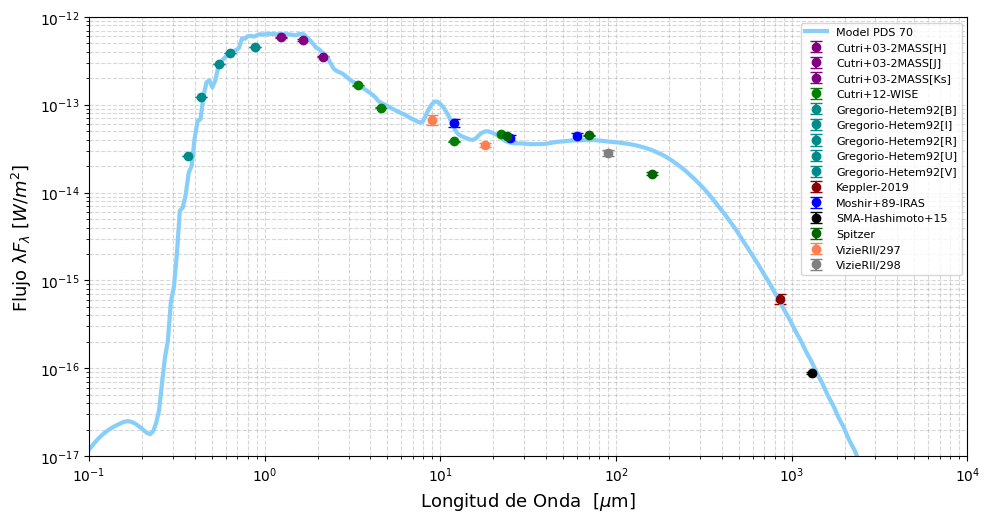

In [40]:
from matplotlib.colors import is_color_like
sdprofile_102 = 'sed_modelo6.txt'
sdprofile_104 = 'SEDBD.txt'
# Cargar los datos del archivo sed_modelo5.txt
datos_103 = np.loadtxt(sdprofile_102, skiprows=1)
columna_nu_103 = datos_103[:, 1]  # Frecuencia en Hz
columna_y_103 = datos_103[:, 3]   # Flujo (en W/m^2 o la unidad del archivo)

# Convertir 855 micrones a metros
lambda_855_micrones = 855e-6  # 855 micrones a metros

# Calcular la frecuencia correspondiente a 855 micrones
velocidad_luz = 3.0e8  # m/s
frecuencia_855 = velocidad_luz / lambda_855_micrones  # en Hz

# Crear una función de interpolación para obtener el flujo en cualquier frecuencia
interpolacion_flujo = interp1d(columna_nu_103, columna_y_103, kind='linear', fill_value="extrapolate")

# Obtener el flujo correspondiente a la frecuencia de 855 micrones
flujo_en_855 = interpolacion_flujo(frecuencia_855)

# Mostrar el resultado (se mantiene para verificación)
print(f'El flujo en 855 micrones (frecuencia = {frecuencia_855:.2e} Hz) es: {flujo_en_855:.2e} W/m^2')

# Cargar los datos fotométricos
data = []
with open('Datos_fotometricos.txt', 'r') as file:
    lines = file.readlines()[1:]  # Saltar la cabecera
    for line_number, line in enumerate(lines, start=2):
        parts = line.split()
        if len(parts) < 4:
            print(f"Advertencia: línea {line_number} no tiene suficiente información: {line.strip()}")
            continue
        longitud_onda = float(parts[0])  # Longitud de onda en µm
        flujo_mJy = float(parts[1])      # Flujo en mJy
        error_mJy = float(parts[2])      # Error en mJy
        fuente_y_color = parts[3].split(",")
        fuente = fuente_y_color[0]
        color = fuente_y_color[1] if len(fuente_y_color) > 1 else "black"
        if not is_color_like(color):  # Validar si el color es válido
            print(f"Advertencia: Color inválido en línea {line_number}: {color}. Usando negro por defecto.")
            color = "black"
        flujo_w = flujo_mJy * 1e-29 * velocidad_luz / (longitud_onda * 1e-6)  # Convertir a W/m^2
        error_w = error_mJy * 1e-29 * velocidad_luz / (longitud_onda * 1e-6)
        data.append([longitud_onda, flujo_w, error_w, fuente, color])

# Convertir a NumPy array
data = np.array(data, dtype=object)
fuentes_unicas = sorted({fila[3] for fila in data})

# Crear la figura y los ejes
fig, ax = plt.subplots(figsize=(10, 8))

# Graficar cada fuente con su color
for fuente in fuentes_unicas:
    subset = data[data[:, 3] == fuente]  # Filtrar datos por fuente
    longitudes = subset[:, 0].astype(float)
    flujos = subset[:, 1].astype(float)
    errores = subset[:, 2].astype(float)
    color = subset[0, 4]
    ax.errorbar(longitudes, flujos, yerr=errores, fmt='o', label=fuente, color=color, capsize=4)

# Graficar el modelo SED
ax.plot(velocidad_luz / columna_nu_103 * 1e6, columna_y_103, label='Model PDS 70', color='lightskyblue', linewidth=3)

# Configuración del gráfico
ax.set_xlabel(r'Longitud de Onda  [$\mu$m]', fontsize=13)
ax.set_ylabel('Flujo λ$F_λ$ [$W/m^2$]', fontsize=13)
ax.set_xscale('log')
ax.set_yscale('log')
ax.grid(True, which='both', linestyle='--', alpha=0.5)
ax.set_xlim(1e-1, 1e4)
ax.set_ylim(1e-17, 1e-12)

# Ajustar la relación de aspecto
ax.set_aspect(0.5)  # Valor < 1 extiende más el eje y

# Leyenda
ax.legend(fontsize=8)

# Ajustar el diseño y guardar
plt.tight_layout()
plt.savefig('grafico_fluxo_categorizado.jpg', format='jpg', dpi=300)
plt.show()

INFO: gen_specFromLineEstimates: build spectrum for 6688 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  23.76 s
INFO: gen_specFromLineEstimates: build spectrum for 6688 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  22.21 s


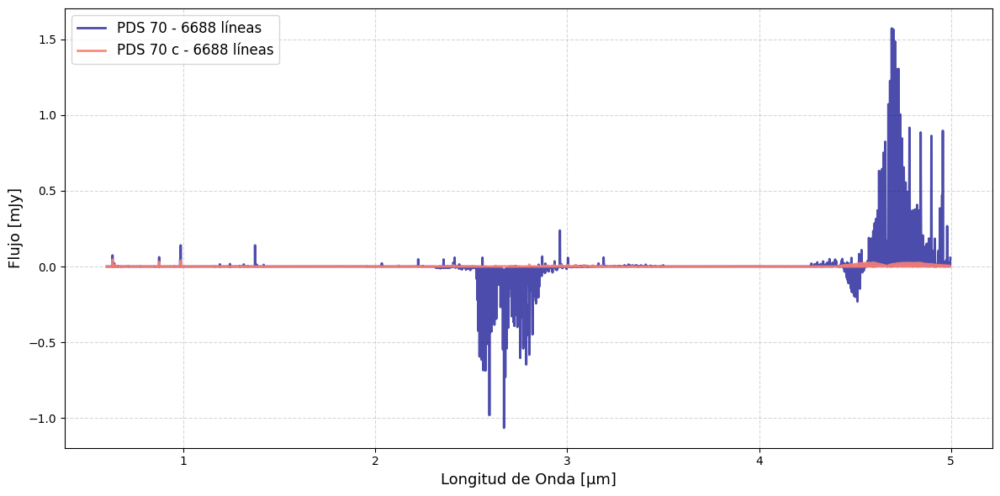

In [16]:
# ALTA MASA NIRSPEC
# Espectro del disco protoplanetario (PPD)
Range = [0.6, 5]
wave_flux_ppd, flux_lines_only_ppd = models[2].gen_specFromLineEstimates(Range, unit="Jy", noCont=True)
flux_lines_only_ppd *= 1e3  # Convertir de Jy a mJy

# Espectro del disco circumplanetario (CPD)
wave_flux_cpd, flux_lines_only_cpd = models[0].gen_specFromLineEstimates(Range, unit="Jy", noCont=True)
flux_lines_only_cpd *= 1e3  # Convertir de Jy a mJy

# Crear el gráfico
plt.figure(figsize=(12, 6))

# Graficar el espectro del disco protoplanetario (PPD)
plt.plot(wave_flux_ppd, flux_lines_only_ppd, label='PDS 70 - 6688 líneas', color='darkblue', linewidth=2, alpha=0.7)

# Graficar el espectro del disco circumplanetario (CPD) sobre el PPD
plt.plot(wave_flux_cpd, flux_lines_only_cpd, label='PDS 70 c - 6688 líneas', color='salmon', linewidth=2, alpha=0.9)

# Configuración del gráfico
plt.xlabel("Longitud de Onda [μm]", fontsize=13)
plt.ylabel("Flujo [mJy]", fontsize=13)
#plt.title("Comparación de Espectros NIRSpec", fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.savefig('comparacion_espectros_NIR_PPD_CPD_ALTAMASA.jpg', format='jpg', dpi=300)
plt.show()

In [17]:
# Definir el nombre del archivo de salida
output_txt_file = "espectro_NIRSPEC_AltaMasa.txt"

# Guardar los datos en un archivo de texto
with open(output_txt_file, "w") as file:
    file.write("Longitud de Onda (μm)\tFlujo PPD (mJy)\tFlujo CPD (mJy)\n")
    for wl, flux_ppd, flux_cpd in zip(wave_flux_ppd, flux_lines_only_ppd, flux_lines_only_cpd):
        file.write(f"{wl:.6f}\t{flux_ppd:.6e}\t{flux_cpd:.6e}\n")

print(f"Archivo guardado correctamente como {output_txt_file}")

Archivo guardado correctamente como espectro_NIRSPEC_AltaMasa.txt


INFO: gen_specFromLineEstimates: build spectrum for 6688 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  24.24 s
INFO: gen_specFromLineEstimates: build spectrum for 6688 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  22.56 s


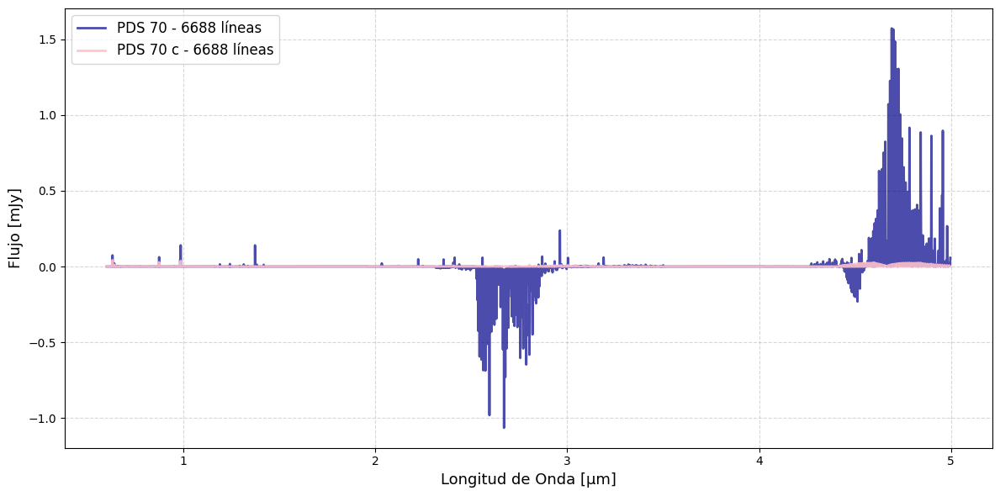

In [18]:
# BAJA MASA NIRSPEC
# Espectro del disco protoplanetario (PPD)
Range = [0.6, 5]
wave_flux_ppd, flux_lines_only_ppd = models[2].gen_specFromLineEstimates(Range, unit="Jy", noCont=True)
flux_lines_only_ppd *= 1e3  # Convertir de Jy a mJy

# Espectro del disco circumplanetario (CPD)
wave_flux_cpd, flux_lines_only_cpd = models[1].gen_specFromLineEstimates(Range, unit="Jy", noCont=True)
flux_lines_only_cpd *= 1e3  # Convertir de Jy a mJy

# Crear el gráfico
plt.figure(figsize=(12, 6))

# Graficar el espectro del disco protoplanetario (PPD)
plt.plot(wave_flux_ppd, flux_lines_only_ppd, label='PDS 70 - 6688 líneas', color='darkblue', linewidth=2, alpha=0.7)

# Graficar el espectro del disco circumplanetario (CPD) sobre el PPD
plt.plot(wave_flux_cpd, flux_lines_only_cpd, label='PDS 70 c - 6688 líneas', color='pink', linewidth=2, alpha=0.9)

# Configuración del gráfico
plt.xlabel("Longitud de Onda [μm]", fontsize=13)
plt.ylabel("Flujo [mJy]", fontsize=13)
#plt.title("Comparación de Espectros NIRSpec", fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.savefig('comparacion_espectros_NIR_PPD_CPD_BAJAMASA.jpg', format='jpg', dpi=300)
plt.show()

In [19]:
# Definir el nombre del archivo de salida para baja masa
output_txt_file = "espectro_NIRSPEC_BajaMasa.txt"

# Guardar los datos en un archivo de texto
with open(output_txt_file, "w") as file:
    file.write("Longitud de Onda (μm)\tFlujo PPD (mJy)\tFlujo CPD (mJy)\n")
    for wl, flux_ppd, flux_cpd in zip(wave_flux_ppd, flux_lines_only_ppd, flux_lines_only_cpd):
        file.write(f"{wl:.6f}\t{flux_ppd:.6e}\t{flux_cpd:.6e}\n")

print(f"Archivo guardado correctamente como {output_txt_file}")

Archivo guardado correctamente como espectro_NIRSPEC_BajaMasa.txt


INFO: gen_specFromLineEstimates: build spectrum for 7587 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  20.91 s
INFO: gen_specFromLineEstimates: build spectrum for 7583 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  19.80 s


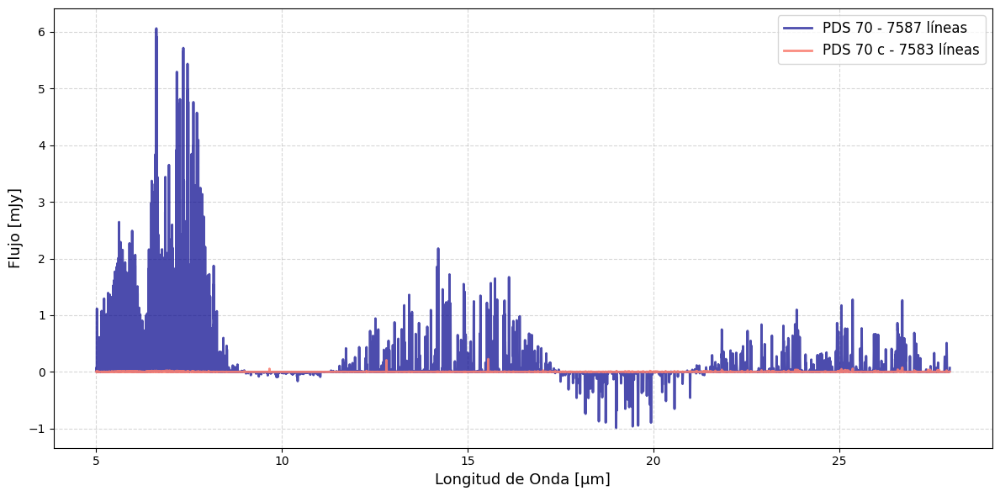

In [20]:
#ALTA MASA MIRI
# Espectro del disco protoplanetario (PPD)
Range = [5, 28]
wave_flux_ppd, flux_lines_only_ppd = models[2].gen_specFromLineEstimates(Range, unit="Jy", noCont=True)
flux_lines_only_ppd *= 1e3  # Convertir de Jy a mJy

# Espectro del disco circumplanetario (CPD)
wave_flux_cpd, flux_lines_only_cpd = models[0].gen_specFromLineEstimates(Range, unit="Jy", noCont=True)
flux_lines_only_cpd *= 1e3  # Convertir de Jy a mJy

# Crear el gráfico
plt.figure(figsize=(12, 6))

# Graficar el espectro del disco protoplanetario (PPD)
plt.plot(wave_flux_ppd, flux_lines_only_ppd, label='PDS 70 - 7587 líneas', color='darkblue', linewidth=2, alpha=0.7)

# Graficar el espectro del disco circumplanetario (CPD) sobre el PPD
plt.plot(wave_flux_cpd, flux_lines_only_cpd, label='PDS 70 c - 7583 líneas', color='salmon', linewidth=2, alpha=0.9)

# Configuración del gráfico
plt.xlabel("Longitud de Onda [μm]", fontsize=13)
plt.ylabel("Flujo [mJy]", fontsize=13)
#plt.title("Comparación de Espectros MIRI", fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.savefig('comparacion_espectros_MIRI_PPD_CPD_ALTAMASA.jpg', format='jpg', dpi=300)
plt.show()

In [21]:
# Definir el nombre del archivo de salida para MIRI alta masa
output_txt_file = "espectro_MIRI_AltaMasa.txt"

# Guardar los datos en un archivo de texto
with open(output_txt_file, "w") as file:
    file.write("Longitud de Onda (μm)\tFlujo PPD (mJy)\tFlujo CPD (mJy)\n")
    for wl, flux_ppd, flux_cpd in zip(wave_flux_ppd, flux_lines_only_ppd, flux_lines_only_cpd):
        file.write(f"{wl:.6f}\t{flux_ppd:.6e}\t{flux_cpd:.6e}\n")

print(f"Archivo guardado correctamente como {output_txt_file}")

Archivo guardado correctamente como espectro_MIRI_AltaMasa.txt


INFO: gen_specFromLineEstimates: build spectrum for 7587 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  18.79 s
INFO: gen_specFromLineEstimates: build spectrum for 7583 lines ...
INFO: gen_specFromLineEstimates: convolve spectrum ...
INFO: time:  18.37 s


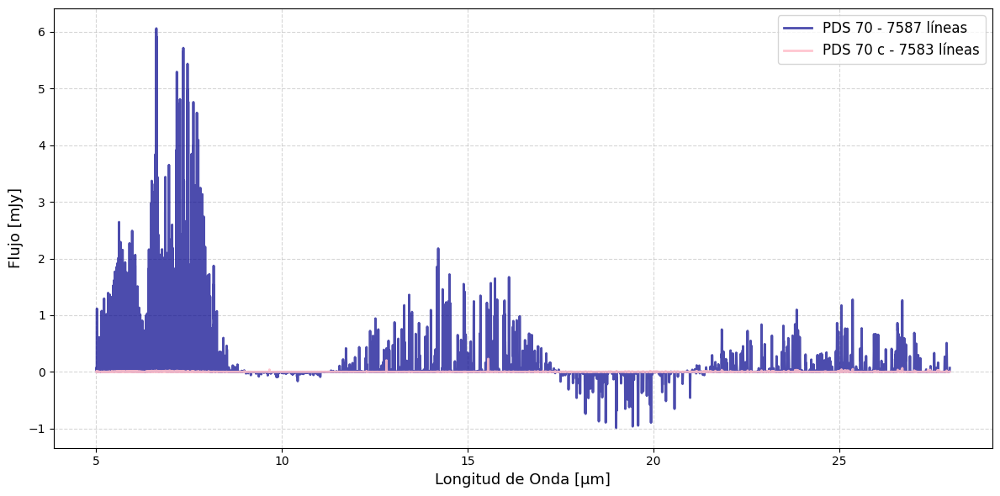

In [22]:
#BAJA MASA MIRI
# Espectro del disco protoplanetario (PPD)
Range = [5, 28]
wave_flux_ppd, flux_lines_only_ppd = models[2].gen_specFromLineEstimates(Range, unit="Jy", noCont=True)
flux_lines_only_ppd *= 1e3  # Convertir de Jy a mJy

# Espectro del disco circumplanetario (CPD)
wave_flux_cpd, flux_lines_only_cpd = models[1].gen_specFromLineEstimates(Range, unit="Jy", noCont=True)
flux_lines_only_cpd *= 1e3  # Convertir de Jy a mJy

# Crear el gráfico
plt.figure(figsize=(12, 6))

# Graficar el espectro del disco protoplanetario (PPD)
plt.plot(wave_flux_ppd, flux_lines_only_ppd, label='PDS 70 - 7587 líneas', color='darkblue', linewidth=2, alpha=0.7)

# Graficar el espectro del disco circumplanetario (CPD) sobre el PPD
plt.plot(wave_flux_cpd, flux_lines_only_cpd, label='PDS 70 c - 7583 líneas', color='pink', linewidth=2, alpha=0.9)

# Configuración del gráfico
plt.xlabel("Longitud de Onda [μm]", fontsize=13)
plt.ylabel("Flujo [mJy]", fontsize=13)
#plt.title("Comparación de Espectros MIRI", fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.savefig('comparacion_espectros_MIRI_PPD_CPD_BAJAMASA.jpg', format='jpg', dpi=300)
plt.show()

In [23]:
# Definir el nombre del archivo de salida para MIRI baja masa
output_txt_file = "espectro_MIRI_BajaMasa.txt"

# Guardar los datos en un archivo de texto
with open(output_txt_file, "w") as file:
    file.write("Longitud de Onda (μm)\tFlujo PPD (mJy)\tFlujo CPD (mJy)\n")
    for wl, flux_ppd, flux_cpd in zip(wave_flux_ppd, flux_lines_only_ppd, flux_lines_only_cpd):
        file.write(f"{wl:.6f}\t{flux_ppd:.6e}\t{flux_cpd:.6e}\n")

print(f"Archivo guardado correctamente como {output_txt_file}")

Archivo guardado correctamente como espectro_MIRI_BajaMasa.txt


In [12]:
import pandas as pd

# Definir los nombres de los archivos
file_alta = "espectro_NIRSPEC_AltaMasa.txt"
file_baja = "espectro_NIRSPEC_BajaMasa.txt"

# Cargar los datos en DataFrames
df_alta = pd.read_csv(file_alta, delim_whitespace=True, skiprows=1, names=["Longitud de Onda (μm)", "Flujo PPD (mJy)", "Flujo CPD (mJy)"])
df_baja = pd.read_csv(file_baja, delim_whitespace=True, skiprows=1, names=["Longitud de Onda (μm)", "Flujo PPD (mJy)", "Flujo CPD (mJy)"])

# Encontrar las líneas más intensas en cada modelo (top 10 por flujo)
top_n = 20
top_ppd_alta = df_alta.nlargest(top_n, "Flujo PPD (mJy)")
top_cpd_alta = df_alta.nlargest(top_n, "Flujo CPD (mJy)")

top_ppd_baja = df_baja.nlargest(top_n, "Flujo PPD (mJy)")
top_cpd_baja = df_baja.nlargest(top_n, "Flujo CPD (mJy)")

# Comparar la intensidad de líneas entre el PPD y el CPD
df_comparacion = pd.DataFrame({
    "Longitud de Onda (μm) - Alta Masa PPD": top_ppd_alta["Longitud de Onda (μm)"].values,
    "Flujo PPD (mJy) - Alta Masa": top_ppd_alta["Flujo PPD (mJy)"].values,
    "Longitud de Onda (μm) - Alta Masa CPD": top_cpd_alta["Longitud de Onda (μm)"].values,
    "Flujo CPD (mJy) - Alta Masa": top_cpd_alta["Flujo CPD (mJy)"].values,
    "Relación PPD/CPD - Alta Masa": top_ppd_alta["Flujo PPD (mJy)"].values / top_cpd_alta["Flujo CPD (mJy)"].values,

    "Longitud de Onda (μm) - Baja Masa PPD": top_ppd_baja["Longitud de Onda (μm)"].values,
    "Flujo PPD (mJy) - Baja Masa": top_ppd_baja["Flujo PPD (mJy)"].values,
    "Longitud de Onda (μm) - Baja Masa CPD": top_cpd_baja["Longitud de Onda (μm)"].values,
    "Flujo CPD (mJy) - Baja Masa": top_cpd_baja["Flujo CPD (mJy)"].values,
    "Relación PPD/CPD - Baja Masa": top_ppd_baja["Flujo PPD (mJy)"].values / top_cpd_baja["Flujo CPD (mJy)"].values,
})

# Guardar los resultados en un archivo CSV
df_comparacion.to_csv("comparacion_intensidades_NIRSPEC.csv", index=False)

# Mostrar la tabla en consola
print(df_comparacion)

print("Archivo CSV generado: comparacion_intensidades_NIRSPEC.csv")

    Longitud de Onda (μm) - Alta Masa PPD  Flujo PPD (mJy) - Alta Masa  \
0                                4.691273                     1.572088   
1                                4.699844                     1.566169   
2                                4.691134                     1.560339   
3                                4.699983                     1.557965   
4                                4.691411                     1.516920   
5                                4.699706                     1.513780   
6                                4.700121                     1.489096   
7                                4.708692                     1.486324   
8                                4.690996                     1.483197   
9                                4.708831                     1.476624   
10                               4.708554                     1.439435   
11                               4.708969                     1.409411   
12                               4.699

/tmp/ipykernel_7296/2004000800.py:8: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df_alta = pd.read_csv(file_alta, delim_whitespace=True, skiprows=1, names=["Longitud de Onda (μm)", "Flujo PPD (mJy)", "Flujo CPD (mJy)"])
/tmp/ipykernel_7296/2004000800.py:9: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df_baja = pd.read_csv(file_baja, delim_whitespace=True, skiprows=1, names=["Longitud de Onda (μm)", "Flujo PPD (mJy)", "Flujo CPD (mJy)"])


In [15]:
# Definir los nombres de los archivos MIRI
file_alta = "espectro_MIRI_AltaMasa.txt"
file_baja = "espectro_MIRI_BajaMasa.txt"

# Cargar los datos en DataFrames
df_alta = pd.read_csv(file_alta, delim_whitespace=True, skiprows=1, names=["Longitud de Onda (μm)", "Flujo PPD (mJy)", "Flujo CPD (mJy)"])
df_baja = pd.read_csv(file_baja, delim_whitespace=True, skiprows=1, names=["Longitud de Onda (μm)", "Flujo PPD (mJy)", "Flujo CPD (mJy)"])

# Encontrar las líneas más intensas en cada modelo (top 10 por flujo)
top_n = 30
top_ppd_alta = df_alta.nlargest(top_n, "Flujo PPD (mJy)")
top_cpd_alta = df_alta.nlargest(top_n, "Flujo CPD (mJy)")

top_ppd_baja = df_baja.nlargest(top_n, "Flujo PPD (mJy)")
top_cpd_baja = df_baja.nlargest(top_n, "Flujo CPD (mJy)")

# Comparar la intensidad de líneas entre el PPD y el CPD
df_comparacion_miri = pd.DataFrame({
    "Longitud de Onda (μm) - Alta Masa PPD": top_ppd_alta["Longitud de Onda (μm)"].values,
    "Flujo PPD (mJy) - Alta Masa": top_ppd_alta["Flujo PPD (mJy)"].values,
    "Longitud de Onda (μm) - Alta Masa CPD": top_cpd_alta["Longitud de Onda (μm)"].values,
    "Flujo CPD (mJy) - Alta Masa": top_cpd_alta["Flujo CPD (mJy)"].values,
    "Relación PPD/CPD - Alta Masa": top_ppd_alta["Flujo PPD (mJy)"].values / top_cpd_alta["Flujo CPD (mJy)"].values,

    "Longitud de Onda (μm) - Baja Masa PPD": top_ppd_baja["Longitud de Onda (μm)"].values,
    "Flujo PPD (mJy) - Baja Masa": top_ppd_baja["Flujo PPD (mJy)"].values,
    "Longitud de Onda (μm) - Baja Masa CPD": top_cpd_baja["Longitud de Onda (μm)"].values,
    "Flujo CPD (mJy) - Baja Masa": top_cpd_baja["Flujo CPD (mJy)"].values,
    "Relación PPD/CPD - Baja Masa": top_ppd_baja["Flujo PPD (mJy)"].values / top_cpd_baja["Flujo CPD (mJy)"].values,
})

# Guardar los resultados en un archivo CSV
df_comparacion_miri.to_csv("comparacion_intensidades_MIRI.csv", index=False)
print(df_comparacion_miri)
print("Archivo CSV generado: comparacion_intensidades_MIRI.csv")

    Longitud de Onda (μm) - Alta Masa PPD  Flujo PPD (mJy) - Alta Masa  \
0                                6.620037                     6.060597   
1                                6.622704                     5.914050   
2                                6.619147                     5.911220   
3                                6.630708                     5.871674   
4                                7.346576                     5.715345   
5                                7.335015                     5.645240   
6                                6.629819                     5.444969   
7                                7.459514                     5.434740   
8                                6.623594                     5.400955   
9                                7.345687                     5.313707   
10                               7.170499                     5.293564   
11                               7.334126                     5.186534   
12                               7.465

/tmp/ipykernel_7296/1990719720.py:8: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df_alta = pd.read_csv(file_alta, delim_whitespace=True, skiprows=1, names=["Longitud de Onda (μm)", "Flujo PPD (mJy)", "Flujo CPD (mJy)"])
/tmp/ipykernel_7296/1990719720.py:9: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df_baja = pd.read_csv(file_baja, delim_whitespace=True, skiprows=1, names=["Longitud de Onda (μm)", "Flujo PPD (mJy)", "Flujo CPD (mJy)"])


In [9]:
# Definir los archivos de entrada
files_miri = [
    "espectro_NIRSPEC_PPD.txt",
    "espectro_NIRSPEC_CPD_AltaMasa.txt",
    "espectro_NIRSPEC_CPD_BajaMasa.txt"
]

# Procesar cada archivo
for file in files_miri:
    print(f"\nProcesando archivo: {file}")

    # Cargar los datos
    df = pd.read_csv(file, delimiter="\t")

    # Encontrar las líneas más intensas por especie
    max_flux_species = df.loc[df.groupby("Especie Química")["Flujo (mJy)"].idxmax()]

    # Contar la cantidad de veces que aparece cada especie
    species_count = df["Especie Química"].value_counts()

    # Guardar los resultados en archivos
    max_flux_species.to_csv(f"max_flux_NIRSPEC_{file}.csv", index=False)
    species_count.to_csv(f"species_count_NIRSPEC_{file}.csv")

    print(f"Archivo generado: max_flux_NIRSPEC_{file}.csv")
    print(f"Archivo generado: species_count_NIRSPEC_{file}.csv")


Procesando archivo: espectro_NIRSPEC_PPD.txt
Archivo generado: max_flux_NIRSPEC_espectro_NIRSPEC_PPD.txt.csv
Archivo generado: species_count_NIRSPEC_espectro_NIRSPEC_PPD.txt.csv

Procesando archivo: espectro_NIRSPEC_CPD_AltaMasa.txt
Archivo generado: max_flux_NIRSPEC_espectro_NIRSPEC_CPD_AltaMasa.txt.csv
Archivo generado: species_count_NIRSPEC_espectro_NIRSPEC_CPD_AltaMasa.txt.csv

Procesando archivo: espectro_NIRSPEC_CPD_BajaMasa.txt
Archivo generado: max_flux_NIRSPEC_espectro_NIRSPEC_CPD_BajaMasa.txt.csv
Archivo generado: species_count_NIRSPEC_espectro_NIRSPEC_CPD_BajaMasa.txt.csv


In [39]:
# Definir los archivos de entrada
files_miri = [
    "espectro_MIRI_PPD.txt",
    "espectro_MIRI_CPD_AltaMasa.txt",
    "espectro_MIRI_CPD_BajaMasa.txt"
]

# Procesar cada archivo
for file in files_miri:
    print(f"\nProcesando archivo: {file}")

    # Cargar los datos
    df = pd.read_csv(file, delimiter="\t")

    # Encontrar las líneas más intensas por especie
    max_flux_species = df.loc[df.groupby("Especie Química")["Flujo (mJy)"].idxmax()]

    # Contar la cantidad de veces que aparece cada especie
    species_count = df["Especie Química"].value_counts()

    # Guardar los resultados en archivos
    max_flux_species.to_csv(f"max_flux_MIRI_{file}.csv", index=False)
    species_count.to_csv(f"species_count_MIRI_{file}.csv")

    print(f"Archivo generado: max_flux_MIRI_{file}.csv")
    print(f"Archivo generado: species_count_MIRI_{file}.csv")


Procesando archivo: espectro_MIRI_PPD.txt
Archivo generado: max_flux_MIRI_espectro_MIRI_PPD.txt.csv
Archivo generado: species_count_MIRI_espectro_MIRI_PPD.txt.csv

Procesando archivo: espectro_MIRI_CPD_AltaMasa.txt
Archivo generado: max_flux_MIRI_espectro_MIRI_CPD_AltaMasa.txt.csv
Archivo generado: species_count_MIRI_espectro_MIRI_CPD_AltaMasa.txt.csv

Procesando archivo: espectro_MIRI_CPD_BajaMasa.txt
Archivo generado: max_flux_MIRI_espectro_MIRI_CPD_BajaMasa.txt.csv
Archivo generado: species_count_MIRI_espectro_MIRI_CPD_BajaMasa.txt.csv


In [40]:
# Definir los archivos de entrada
file_ppd = "espectro_NIRSPEC_PPD.txt"
file_cpd_alta = "espectro_NIRSPEC_CPD_AltaMasa.txt"
file_cpd_baja = "espectro_NIRSPEC_CPD_BajaMasa.txt"

# Cargar los datos
df_ppd = pd.read_csv(file_ppd, delimiter="\t")
df_cpd_alta = pd.read_csv(file_cpd_alta, delimiter="\t")
df_cpd_baja = pd.read_csv(file_cpd_baja, delimiter="\t")

# Seleccionar las 3 líneas más intensas por especie en el PPD
top_n = 3
df_ppd_top = df_ppd.groupby("Especie Química").apply(lambda x: x.nlargest(top_n, "Flujo (mJy)")).reset_index(drop=True)

# Función para encontrar el flujo correspondiente en CPD dado una longitud de onda y especie
def find_flux(df_cpd, wavelength, species):
    match = df_cpd[(df_cpd["Longitud de Onda (μm)"] == wavelength) & (df_cpd["Especie Química"] == species)]
    return match["Flujo (mJy)"].values[0] if not match.empty else None

# Agregar los valores de flujo del CPD para la misma longitud de onda
df_ppd_top["Flujo CPD Alta Masa (mJy)"] = df_ppd_top.apply(lambda row: find_flux(df_cpd_alta, row["Longitud de Onda (μm)"], row["Especie Química"]), axis=1)
df_ppd_top["Flujo CPD Baja Masa (mJy)"] = df_ppd_top.apply(lambda row: find_flux(df_cpd_baja, row["Longitud de Onda (μm)"], row["Especie Química"]), axis=1)

# Guardar los resultados en un archivo CSV
df_ppd_top.to_csv("comparacion_lineas_intensas_NIRSPEC.csv", index=False)

# Mostrar los primeros resultados
print(df_ppd_top.head())

print("Archivo generado: comparacion_lineas_intensas_NIRSPEC.csv")

/tmp/ipykernel_6060/3029054625.py:15: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_ppd_top = df_ppd.groupby("Especie Química").apply(lambda x: x.nlargest(top_n, "Flujo (mJy)")).reset_index(drop=True)


   Longitud de Onda (μm)  Flujo (mJy) Especie Química  \
0               0.713213     0.003950            Ar++   
1               0.713352     0.003921            Ar++   
2               0.774735     0.001173            Ar++   
3               0.985293     0.140554               C   
4               0.985431     0.088771               C   

   Flujo CPD Alta Masa (mJy)  Flujo CPD Baja Masa (mJy)  
0                   0.003138                   0.003103  
1                   0.003114                   0.003079  
2                   0.000931                   0.000921  
3                   0.040538                   0.037433  
4                   0.025603                   0.023642  
Archivo generado: comparacion_lineas_intensas_NIRSPEC.csv


In [41]:
import pandas as pd

# Definir los archivos de entrada
file_ppd = "espectro_MIRI_PPD.txt"
file_cpd_alta = "espectro_MIRI_CPD_AltaMasa.txt"
file_cpd_baja = "espectro_MIRI_CPD_BajaMasa.txt"

# Cargar los datos
df_ppd = pd.read_csv(file_ppd, delimiter="\t")
df_cpd_alta = pd.read_csv(file_cpd_alta, delimiter="\t")
df_cpd_baja = pd.read_csv(file_cpd_baja, delimiter="\t")

# Seleccionar las 3 líneas más intensas por especie en el PPD
top_n = 3
df_ppd_top = df_ppd.groupby("Especie Química").apply(lambda x: x.nlargest(top_n, "Flujo (mJy)")).reset_index(drop=True)

# Función para encontrar el flujo correspondiente en CPD dado una longitud de onda y especie
def find_flux(df_cpd, wavelength, species):
    match = df_cpd[(df_cpd["Longitud de Onda (μm)"] == wavelength) & (df_cpd["Especie Química"] == species)]
    return match["Flujo (mJy)"].values[0] if not match.empty else None

# Agregar los valores de flujo del CPD para la misma longitud de onda
df_ppd_top["Flujo CPD Alta Masa (mJy)"] = df_ppd_top.apply(lambda row: find_flux(df_cpd_alta, row["Longitud de Onda (μm)"], row["Especie Química"]), axis=1)
df_ppd_top["Flujo CPD Baja Masa (mJy)"] = df_ppd_top.apply(lambda row: find_flux(df_cpd_baja, row["Longitud de Onda (μm)"], row["Especie Química"]), axis=1)

# Guardar los resultados en un archivo CSV
df_ppd_top.to_csv("comparacion_lineas_intensas_MIRI.csv", index=False)

# Mostrar los primeros resultados
print(df_ppd_top.head())

print("Archivo generado: comparacion_lineas_intensas_MIRI.csv")

/tmp/ipykernel_6060/65819437.py:15: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_ppd_top = df_ppd.groupby("Especie Química").apply(lambda x: x.nlargest(top_n, "Flujo (mJy)")).reset_index(drop=True)


   Longitud de Onda (μm)  Flujo (mJy) Especie Química  \
0               6.985529     0.053363             Ar+   
1               6.984640     0.045034             Ar+   
2               6.986419     0.028161             Ar+   
3               8.985513     0.026198            Ar++   
4               8.984624     0.024253            Ar++   

   Flujo CPD Alta Masa (mJy)  Flujo CPD Baja Masa (mJy)  
0                   0.022155                   0.023203  
1                   0.018697                   0.019582  
2                   0.011692                   0.012245  
3                   0.011643                   0.011931  
4                   0.010778                   0.011045  
Archivo generado: comparacion_lineas_intensas_MIRI.csv


In [ ]:
Este fue el resultado para las 20 líneas más intensas, crea una tabla en formato Latex que muestre de manera ordenada la longitud de onde donde se encunetran estas líneas y la diferencia entre ellas. y un análisis similar a

Modelo Compu German 3:30
Disminuir masa del disco 100 veces mas 
inclinación 51.7
distancia =112.4 pc
inclinación 51.7
Simple_PDS70.2 = tiene reducción en 1 unidad la densidad de superficie, intentando igualar a un TTauri.
Simple_PDS70.3 = tiene reducción en 2 unidades de medida para la densidad de superficie.
Simple_PDS70.4 = tiene angulo = 0
Simple_PDS70.5 = tiene corregida la distancia.
Simple_PDS70.6 = restart_true = bajar masa una unidad de magnitud más y empezar a subir la masa.
Simple_PDS70.6 original_freezedisk = freezedisk =false con e-4
Simple_PDS70.10 original_freezedisk = freezedisk =True hasta 10e00 en masa del disco
Tarea= escribirle  por datos de fotometría de ALMA.
Simple_PDS70_masareducida = no sirve
    
Tarea CAmbiar el flearing
CO medir obserrvacionalmente le flearing

10.61       ! MCFOST_H0    [AU]    : scale height ...
100.0       ! MCFOST_RREF  [AU]    : ... belonging to reference radius
1.14        ! MCFOST_BETA          : flaring power

1000.0      ! amax      [mic]    : maximum dust particle size a 3000

Simple_PDS70.11 = cambio max dust particle a 3000 y el flearing del modelo PDS70.9

Pedir cartas de invitación.
    1ra = test con a max solo 3000
    2da = flearing solo sin freeze disk structure con masa aumentando    

Simple_PDS70.6_flearing= son restar true y freezediskstructure false

TwoZones para PDS70
BD para PDS 70c
UV_IR_ISRF--- temperatura para BD porque no afecta el uv, sino el visible a esa distancia. Faltaría calcular a esa distancia, puede ser con un TTauri para PDS70

28 agosto: 
NIR James WEbb
spectrum syntethic

...
SED del disco CP BD ... función filtro envió Germán *
Chi vs R chi a 34 UA*
Temperatura al circumplenatario. Tgas a 34 fondo IR para el CP*
bajarle a amax. outter region *
...
primero restar y luego filtrar.
    SED filtra, y espectro de la estrella filtrado
disminuir a 1000 a2max.

...
Diana standard opacities
F prop K_nu^alfa*Mdisk
Bajar el valor de la masa a :
0.02        ! Mdisk        [Msun]  : disk mass
a max subir a 3000
Modelo 4.4 e-5 Masa total del disco 
Kepler 3 e-5
0.0125 
0.007 Bayron último
...
21.39 K Tback
sumar los 2 SED
...
Para James Webb
Nos interesa MIRI y NIRI desde 5 micras hasta 28 micras
Discusión. post análisis.
Flujo integrado de las principales de líneas.
Tabla con mínimo especies químicas para tener flujo de cirum y protoplanetario.
polvo- juntar
    Transferencia radiativa también.
    Integral, borrar.escencial
Discusión- Logramos por primera vez.- Conclusiones logramos y que hicismo concretamente.-Con el modelo podemos predecir.
James Webb
ALMA- muy observado.no hay mucha infromación de James webb - Que observaciones de líneas hay con ALMA hechas. hacer prediccions que ya fueron hechas.
Madex.
CoCoA scopus - mandar tipo artículo. 3 meses. relacionar con ALMA. - obsercaciones en gas co, moléculas orgánicas complejas.
DEscartar ciertas masas del cirumplanetario.
Sintetizar conclusiones. Sencillas.
Ideal, un promedio integrado para establecer la masa de la luna
    A primer orden y por ahora, puedo hacer un promedio en el rango.
Agregar gŕaficas de sigma.

Questions:

Como pasar de Temperatura a espectros, momentum zero
Por qué los espectros de líneas se miran como en contínuo
Por qué se miran líneas con longitudes de onda para un estado sólido como el agua, si solo el gas emite líneas